# Anticipez les besoins en consommation électrique de bâtiments

# Sommaire


- 1. Préambule
	- 1.1. Problématique
	- 1.2. Notre Objectif dans ce projet
- 2. Import des librairies
- 3. Autres réglages
- 4. Importation des données dans des DataFrames
- 5. Pré-Traitement des DataFrames 1/2
	- 5.1. Visualisation des 2 DataFrames
	- 5.2. Traitement de la colonne 'Location' de df15
	- 5.3. Renommage des colonnes avant merge des DataFrames
	- 5.4. Merge des 2 DataFrame
	- 5.5. Renommage des colonnes 'SiteEnergyUse(kBtu)' et 'PropertyGFABuilding(s)'
- 6. Features Engineering
	- 6.1. Création de la variable 'ageBuilding'
	- 6.2. Ajout des colonnes indiquant la nature et la proportion des sources d'énergie utilisées
- 7. Analyse métier
	- 7.1. Suppression des données Résidentielles
	- 7.2. Suppression des données provenant d'un relevé par un agent de terrain
	- 7.3. Suppression manuelle des colonnes inutiles
	- 7.4. Suppression des entrées dont les targets ont des valeurs négatives ou null
- 8. Pré-Traitement des DataFrames 2/2
	- 8.1. Correction et Formatage des données suite aux Merges des DataFrames 'df15' et 'df16'
		- 8.1.1. Formatage des entrées de la colonne 'DefaultData'
		- 8.1.2. Normalisation des entrées de la colonne 'Address'
		- 8.1.3. Conversion au format List des données de la colonne 'YearsENERGYSTARCertified'
		- 8.1.4. Correction des encodages de la colonne 'PrimaryPropertyType'
		- 8.1.5. Correction de la casse et correction de notation de la colonne 'Neighborhood'
		- 8.1.6. Correction de la casse de la colonne 'Outlier'
		- 8.1.7. Conversion au format List des données de la colonne 'ListOfAllPropertyUseTypes'
- 9. Identification des Targets
	- 9.1. Identification et définition des Targets
	- 9.2. Réarangement des colonnes Targets dans le DataFramme 'df'
- 10. Analyse de la forme des données
	- 10.1. Dimension du DataFrame 'df'
	- 10.2. Analyse des types de données du DataFrame
	- 10.3. Identification des variables catégorielles
	- 10.4. Analyse des Targets: 'TotalGHGEmissions' et 'SiteEnergyUse'
- 11. Traitement des valeurs manquantes
	- 11.1 Visualisation des valeurs manquantes du DataFrame 'df' avant traitement
	- 11.2. 'Outlier'
	- 11.3. '2010 Census Tracts' et 'City Council Districts'
	- 11.4. 'YearsENERGYSTARCertified'
	- 11.5. 'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
	  'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA'
	- 11.6. 'ZipCode'
	- 11.7. 'NumberofFloors'
	- 11.8. 'ENERGYSTARScore'
	- 11.9. Visualisation des valeurs manquantes du DataFrame df après traitement
- 12. Traitement des doublons
- 13. Traitement des Outliers
	- 13.1 Traitement manuel
	- 13.2 Traitement avec la distance de Cook
- 14. Encodage et Standardisation des données
	- 14.1. MAJ de ma liste de classification des variables catégorielles et continues
	- 14.2. Encodage des données catégorielles qui ont une notion d'ordre mais pas de distance
		- 14.2.1. Encodage de 'Outlier'
		- 14.2.2. Encodage de 'DefaultData'
		- 14.2.3. Visualisation des données encodées
	- 14.3. Encodage des données catégorielles sans notion d'ordre ni distance
		- 14.3.1. Encodage des features contenant des [listes] : 'YearsENERGYSTARCertified' et 'ListOfAllPropertyUseTypes' avec MultiLabelBinarizer
			- 14.3.1.1. Analyse de la cardinalité de 'YearsENERGYSTARCertified'
			- 14.3.1.2. Encodage de 'YearsENERGYSTARCertified'
			- 14.3.1.3. Analyse de la cardinalité de 'ListOfAllPropertyUseTypes'
			- 14.3.1.4. Encodage de 'ListOfAllPropertyUseTypes'
		- 14.3.2. Analyse de la cardinalité des variables restantes sans notion d'ordre ni distance
		- 14.3.3. Fonction d'automatisation pour OneHotEncoder
		- 14.3.4. Encodage des variables à faible cardinalité < 20
			- 14.3.4.1. Encodage des colonnes 'Neighborhood','CouncilDistrictCode' et 'BuildingType'
			- 14.3.4.2. Encodage de la colonne 'ComplianceStatus'
		- 14.3.5. Encodage des variables à haute cardinalité >1000
			- 14.3.5.1. Encodage de la colonne 'Address'
		- 14.3.6. Encodage des variables restantes
		- 14.3.7. Visualisation du DataFrame df avec l'ensemble des variables, qui n'ont ni une notion d'Ordre, ni une notion de Distance, complètement encodées
	- 14.4. Standardisation et/ou passage au Log des données Continues
		- 14.4.1. Visualisation de la distribution des données avant Standardisation
		- 14.4.2. Standardisation sur les variables continues
		- 14.4.3. Visualisation de la distribution des données après Standardisation
		- 14.4.4. Transformation et Visualisation de la distribution après transformation Box-Cox
		- 14.4.5. Choix de transformation retenue pour chaque variable et application des transformations choisies
		- 14.4.6. Visualisation de la distribution des valeurs continues après transformation sur le DataFrame df
- 15. Etude des corrélations
	- 15.1. Etude des corrélations entre les Features et les Targets
	- 15.2. Etude de la corrélation des variables entre-elles
- 16. Features Selection
	- 16.1. Feature Selection pour la target 'TotalGHGEmissions' avec LassoCV
	- 16.2. Feature Selection pour la target 'SiteEnergyUse' avec LassoCV
- 17. Machine Learning
	- 17.1. Fonction d'affichage des métrics
	- 17.2. Recherche des meilleurs algorithmes de Machine Learning pour prédire 'TotalGHGEmissions' et 'SiteEnergyUse'
		- 17.2.1. Label = TotalGHGEmissions
			- 17.2.1.1. Initialisation du DataFrame
			- 17.2.1.2. Initialisation du dictionnaire destiné à enregistrer les performances des différents algorithmes
			- 17.2.1.3. Selection des Features et Label
			- 17.2.1.4. Création du train set et du test set
			- 17.2.1.5. Application de modèle Dummy pour établir une baseline
			- 17.2.1.6. KNN Linéaire
			- 17.2.1.7. Regression Ridge
			- 17.2.1.8. Regression Lasso
			- 17.2.1.9. Support Vector Regression (SVR)
			- 17.2.1.10. Regression Ridge à noyau (Kernel Ridge)
			- 17.2.1.11. Arbre de Décision Aléatoire (Random Forest)
			- 17.2.1.12. AdaBoost
			- 17.2.1.13. GradientBoosting
			- 17.2.1.14. XGBoost
		- 17.2.2. Label = SiteEnergyUse
			- 17.2.2.1. Initialisation du DataFrame
			- 17.2.2.2. Initialisation du dictionnaire destiné à enregistrer les performances des différents algorithmes
			- 17.2.2.3. Selection des Features et Label
			- 17.2.2.4. Création du train set et du test set
			- 17.2.2.5. Application de modèle Dummy pour établir une baseline
			- 17.2.2.6. KNN Linéaire
			- 17.2.2.7. Regression Ridge
			- 17.2.2.8. Regression Lasso
			- 17.2.2.9. Support Vector Regression (SVR)
			- 17.2.2.10. Regression Ridge à noyau (Kernel Ridge)
			- 17.2.2.11. Arbre de Décision Aléatoire (Random Forest)
			- 17.2.2.12. AdaBoost
			- 17.2.2.13. GradientBoosting
			- 17.2.2.14. XGBoost
		- 17.2.3. Interprétation des résultats
		- 17.2.4. Conclusion sur le modèle final sélectionné
		- 17.2.5. Conclusion sur notre capacité à prédire efficacement les émissions de CO2 et la consommation totale d'énergie des bâtiments de la ville de Seattle
	- 17.3. Evaluation de l'apport de la variable 'ENERGYSTARScore
		- 17.3.1. Label = TotalGHGEmissions | ENERGYSTARScore = OFF
			- 17.3.1.1. Initialisation du DataFrame
			- 17.3.1.2. Initialisation du dictionnaire destiné à enregistrer les performances des différents algorithmes
			- 17.3.1.3. Selection des Features et Label
			- 17.3.1.4. Création du train set et du test set
			- 17.3.1.5. Application de modèle Dummy pour établir une baseline
			- 17.3.1.6. KNN Linéaire
			- 17.3.1.7. Regression Ridge
			- 17.3.1.8. Regression Lasso
			- 17.3.1.9. Support Vector Regression (SVR)
			- 17.3.1.10. Regression Ridge à noyau (Kernel Ridge)
			- 17.3.1.11. Arbre de Décision Aléatoire (Random Forest)
			- 17.3.1.12. AdaBoost
			- 17.3.1.13. GradientBoosting
			- 17.3.1.14. XGBoost
		- 17.3.2. Label = TotalGHGEmissions | ENERGYSTARScore = ON
			- 17.3.2.1. Initialisation du DataFrame
			- 17.3.2.2. Initialisation du dictionnaire destiné à enregistrer les performances des différents algorithmes
			- 17.3.2.3. Selection des Features et Label
			- 17.3.2.4. Création du train set et du test set
			- 17.3.2.5. Application de modèle Dummy pour établir une baseline
			- 17.3.2.6. KNN Linéaire
			- 17.3.2.7. Regression Ridge
			- 17.3.2.8. Regression Lasso
			- 17.3.2.9. Support Vector Regression (SVR)
			- 17.3.2.10. Regression Ridge à noyau (Kernel Ridge)
			- 17.3.2.11. Arbre de Décision Aléatoire (Random Forest)
			- 17.3.2.12. AdaBoost
			- 17.3.2.13. GradientBoosting
			- 17.3.2.14. XGBoost
		- 17.3.3. Label = SiteEnergyUse | ENERGYSTARScore = OFF
			- 17.3.3.1. Initialisation du DataFrame
			- 17.3.3.2. Initialisation du dictionnaire destiné à enregistrer les performances des différents algorithmes
			- 17.3.3.3. Selection des Features et Label
			- 17.3.3.4. Création du train set et du test set
			- 17.3.3.5. Application de modèle Dummy pour établir une baseline
			- 17.3.3.6. KNN Linéaire
			- 17.3.3.7. Regression Ridge
			- 17.3.3.8. Regression Lasso
			- 17.3.3.9. Support Vector Regression (SVR)
			- 17.3.3.10. Regression Ridge à noyau (Kernel Ridge)
			- 17.3.3.11. Arbre de Décision Aléatoire (Random Forest)
			- 17.3.3.12. AdaBoost
			- 17.3.3.13. GradientBoosting
			- 17.3.3.14. XGBoost
		- 17.3.4. Label = SiteEnergyUse | ENERGYSTARScore = ON
			- 17.3.4.1. Initialisation du DataFrame
			- 17.3.4.2. Initialisation du dictionnaire destiné à enregistrer les performances des différents algorithmes
			- 17.3.4.3. Selection des Features et Label
			- 17.3.4.4. Création du train set et du test set
			- 17.3.4.5. Application de modèle Dummy pour établir une baseline
			- 17.3.4.6. KNN Linéaire
			- 17.3.4.7. Regression Ridge
			- 17.3.4.8. Regression Lasso
			- 17.3.4.9. Support Vector Regression (SVR)
			- 17.3.4.10. Regression Ridge à noyau (Kernel Ridge)
			- 17.3.4.11. Arbre de Décision Aléatoire (Random Forest)
			- 17.3.4.12. AdaBoost
			- 17.3.4.13. GradientBoosting
			- 17.3.4.14. XGBoost
		- 17.3.5. Conclusion sur l’utilisation de la variable ENERGYSTARScore

# Préambule

## Problématique

La ville de **Seattle** s'intéresse de près aux *émissions*<br /> 
des bâtiments <u>non destinés à l'habitation</u>.

Les agents de la ville ont réalisé des relevés minutieux <br />
dans les bâtiments de la ville en **2015** et en **2016**.<br />
Cependant, <u>les relevés sont couteux à obtenir</u>.

Est-il possible de prédire, et donc de se passer, des relevés des agents <br />
pour les années à venir ? <br/>
Et donc de <u>calculer les émissions de CO2</u> et la <u>consommation totale d'énergie</u> <br />
des bâtiments non destinés à l'habitation, <u>en s'appuyant uniquement <br />
sur les relevés déjà effectués en 2015 et 2016</u> ?



## Notre Objectif dans ce projet

Tenter de prédire les **émissions de CO2** et la **consommation totale d'énergie** <br/>
de nouveaux bâtiments en s'appuyant sur les relevés des agents de la ville <br/>
de Seattle en **2015** et **2016**.

L'idée est d'**explorer** ces données, de les **nettoyer**, de les **comprendre** <br/>
et de les **optimiser** afin d'être utilisées à travers des algorithmes de **Machine Learning**.<br/>
Nous verrons en détail chacune de ces étapes.

Nous **testerons**, nous **comparerons** et nous **optimiserons** <br/>
différents **Algorithmes de Machine Learning** pour enfin <u>conclure <br/>
sur la question qui nous est posée</u> : *Peut-on prédire efficacement les émissions de CO2 <br/>
et la consommation totale d'énergie pour les années à venir sans devoir réaliser de <br/>
nouveaux relevés par nos agents de terrain ?*

Nous chercherons également à <u>évaluer l'intérêt de l'**ENERGYSTARScore**</u> pour <u>la prédiction d'émissions</u>.<br/>
En effet, si cette donnée peut sembler très pertinente, <br/>
elle a le désavantage d'être <u>fastidieuse, et donc couteuse, à calculer</u>.

<u>En d'autres termes, nous répondrons à la question</u> : *Est-il rentable d'utiliser <br/>
l'ENERGYSTARScore pour effectuer nos prédictions en émissions ?*

# Import des librairies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from scipy import stats
from time import perf_counter

In [2]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MultiLabelBinarizer, OrdinalEncoder, LabelEncoder
from sklearn.feature_selection import SelectKBest, RFE, RFECV, SelectFromModel, mutual_info_regression, f_regression
from sklearn.model_selection import train_test_split, cross_val_score, validation_curve, GridSearchCV, RandomizedSearchCV, learning_curve
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LassoCV, ElasticNetCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import LinearSVR, SVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.dummy import DummyRegressor
from sklearn.decomposition import PCA

# !pip install yellowbrick
from yellowbrick.regressor import CooksDistance

# Autres réglages

<u>Définition du **R**andom_**S**tate pour la reproductibilité des résultats</u> :<br />
*J'utilise dans ce projet un random_state à 1 mais je laisse le choix <br />
à l'utilisateur de le changer facilement s'il le souhaite afin d'observer <br />
l'influence que celà peut avoir sur les scores obtenus.*<br />
*Le même Random_State sera défini dans l'ensemble <br />
des processus du projet (où il est possible de l'utiliser)*

In [3]:
RS = 1

<u>Modification des paramètres de Pandas concernant <br />
le nombre de lignes et colonnes  pouvant être affichées <br />
ainsi que le format d'affichage des nombres réels :</u>

In [4]:
pd.set_option("max_rows", 300)
pd.set_option("display.max_columns",200)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

# Importation des données dans des DataFrames

In [5]:
df15 = pd.read_csv('2015-building-energy-benchmarking.csv', sep=',')
df15.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,1,12.00000,88434,0,88434,Hotel,Hotel,88434.00000,NaN,nan,NaN,nan,NaN,65.00000,78.90000,80.30000,173.50000,175.10000,6981428.00000,7097539.00000,2023032.00000,1080307.00000,3686160.00000,12724.00000,1272388.00000,0.00000,249.43000,2.64000,No,NaN,Compliant,NaN,nan,14.00000,nan,31.00000,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,1,11.00000,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.00000,Parking,15064.00000,Restaurant,4622.00000,NaN,51.00000,94.40000,99.00000,191.30000,195.20000,8354235.00000,8765788.00000,0.00000,1144563.00000,3905411.00000,44490.00000,4448985.00000,0.00000,263.51000,2.38000,No,NaN,Compliant,NaN,nan,14.00000,nan,31.00000,18081
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122...",7,DOWNTOWN,1969,1,41.00000,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.00000,Parking,100000.00000,Swimming Pool,0.00000,NaN,18.00000,96.60000,99.70000,242.70000,246.50000,73130656.00000,75506272.00000,19660404.00000,14583930.00000,49762435.00000,37099.00000,3709900.00000,0.00000,2061.48000,1.92000,Yes,NaN,Compliant,NaN,nan,56.00000,nan,31.00000,18081
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,"{'latitude': '47.61421585', 'longitude': '-122...",7,DOWNTOWN,1926,1,10.00000,61320,0,61320,Hotel,Hotel,61320.00000,NaN,nan,NaN,nan,NaN,1.00000,460.40000,462.50000,636.30000,643.20000,28229320.00000,28363444.00000,23458518.00000,811521.00000,2769023.00000,20019.00000,2001894.00000,0.00000,1936.34000,31.38000,No,NaN,Compliant,High Outlier,nan,56.00000,nan,31.00000,18081
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,"{'latitude': '47.6137544', 'longitude': '-122....",7,DOWNTOWN,1980,1,18.00000,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.00000,Parking,68009.00000,Swimming Pool,0.00000,NaN,67.00000,120.10000,122.10000,228.80000,227.10000,14829099.00000,15078243.00000,0.00000,1777841.00000,6066245.00000,87631.00000,8763105.00000,0.00000,507.70000,4.02000,No,NaN,Compliant,NaN,nan,56.00000,nan,31.00000,19576


In [6]:
df16 = pd.read_csv('2016-building-energy-benchmarking.csv', sep=',')
df16.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.00000,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.00000,12,88434,0,88434,Hotel,Hotel,88434.00000,NaN,nan,NaN,nan,NaN,60.00000,81.70000,84.30000,182.50000,189.00000,7226362.50000,7456910.00000,2003882.00000,1156514.25000,3946027.00000,12764.52930,1276453.00000,False,nan,Compliant,NaN,249.98000,2.83000
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.00000,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.00000,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.00000,Parking,15064.00000,Restaurant,4622.00000,NaN,61.00000,94.80000,97.90000,176.10001,179.39999,8387933.00000,8664479.00000,0.00000,950425.18750,3242851.00000,51450.81641,5145082.00000,False,nan,Compliant,NaN,295.86000,2.86000
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.00000,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.00000,41,956110,196718,759392,Hotel,Hotel,756493.00000,NaN,nan,NaN,nan,NaN,43.00000,96.00000,97.70000,241.89999,244.10001,72587024.00000,73937112.00000,21566554.00000,14515435.00000,49526664.00000,14938.00000,1493800.00000,False,nan,Compliant,NaN,2089.28000,2.19000
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.00000,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.00000,10,61320,0,61320,Hotel,Hotel,61320.00000,NaN,nan,NaN,nan,NaN,56.00000,110.80000,113.30000,216.20000,224.00000,6794584.00000,6946800.50000,2214446.25000,811525.31250,2768924.00000,18112.13086,1811213.00000,False,nan,Compliant,NaN,286.43000,4.67000
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.00000,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.00000,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.00000,Parking,68009.00000,Swimming Pool,0.00000,NaN,75.00000,114.80000,118.70000,211.39999,215.60001,14172606.00000,14656503.00000,0.00000,1573448.62500,5368607.00000,88039.98438,8803998.00000,False,nan,Compliant,NaN,505.01000,2.88000


# Pré-Traitement des DataFrames

## Visualisation des 2 DataFrames

J'utilise une **heatmap** qui met en évidence **les valeurs <br />
manquantes en <u>blanc</u>** et **les valeurs renseignées en <u>bleu foncé</u>**.

J'utiliserai cette heatmap régulièrement durant mon analyse.

<AxesSubplot:>

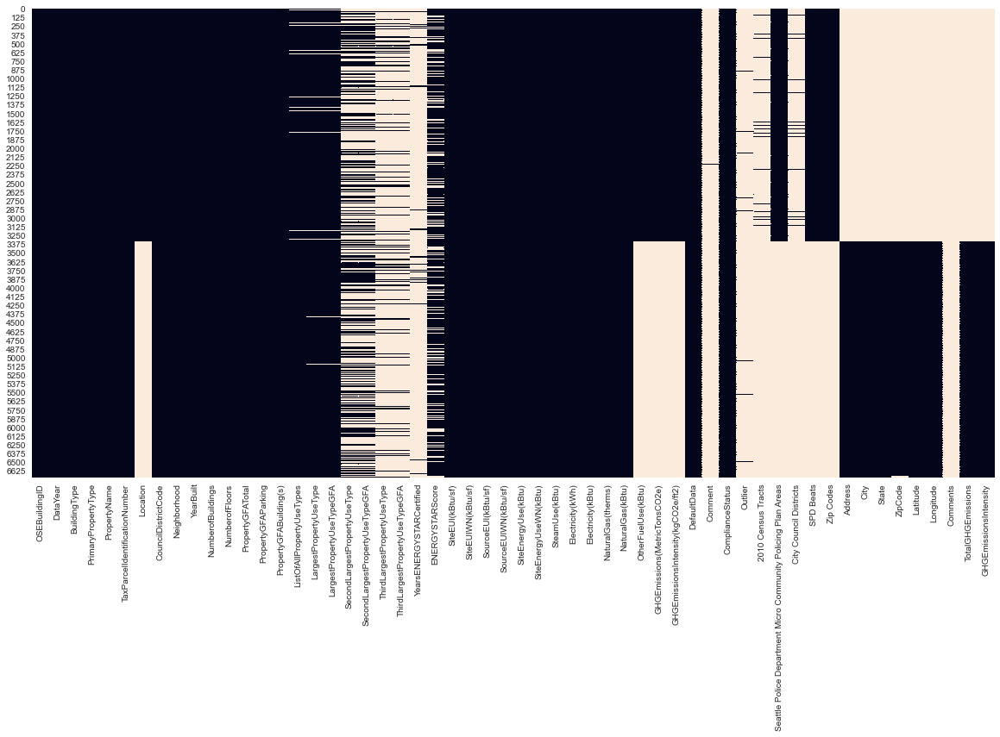

In [7]:
plt.figure(figsize=(20,10))
sns.heatmap(df15.append(df16, sort=False, ignore_index=True).isna(), cbar=False)

## Traitement de la colonne '**Location**' de df15

La colonne '**Location**' contient des dictionnaires imbriqués.<br />
Les clés de ces dictionnaires correspondent à des colonnes du DataFrame de 2016.<br />
Je vais extraire ces données et renommer les colonnes afin de pouvoir merger <br />correctement les deux DataFrames.

<u>A noter</u> : La colonne '**Zip Codes**' de *df15* ne correspond pas à la colonne '**ZipCode**' de *df16*. <br />
La colonne contenant le Zip Code dans le *df15* correspondant au Zip Code de df16 est <br />
contenu dans la colonne '**Location**' de *df15*.

<u>La forme des données représente un dictionnaire imbriqué, encodé sous forme d'une *String*</u> : 

In [8]:
df15.Location[0]

'{\'latitude\': \'47.61219025\', \'longitude\': \'-122.33799744\', \'human_address\': \'{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}\'}'

In [9]:
import json
def LocationToDict(loc):
    '''Retourne un dictionnaire contenu sous forme de String,
    dans le format Dictionnaire'''
    return json.loads(loc.replace("\'", "\"").replace("\"{","{").replace("}\"","}")) 


In [10]:
def FromDictToSeries(dict):
    ''' Retourne le Dictionnaire de la colonne Location sous forme de Series Pandas
    afin d'insérer facilement ces données au df15,
    avec les colonnes directement et correctement renommées pour
    correspondre aux colonnes correspondantes de df16'''
    return pd.Series({'Address': dict['human_address']['address'],
          'City':dict['human_address']['city'],
          'State':dict['human_address']['state'],
          'ZipCode':int(dict['human_address']['zip']),
          'Latitude':float(dict['latitude']),
          'Longitude':float(dict['longitude'])})

<u>Extraction et Merge des colonnes issues des données encodées dans la colonne '**Location**' de *df15* à *df15*</u> :

In [11]:
df15 = df15.merge(df15.Location.apply(lambda col: FromDictToSeries(LocationToDict(col))), 
                  left_index=True, 
                  right_index=True)

<u>Suppression de la colonne '**Location**'</u> :

In [12]:
df15.drop('Location', axis=1, inplace=True)

## Renommage des colonnes avant merge des DataFrames

<u>Je renomme mes **Targets** d'autres colonnes pour plus de lisibilité</u> :

   - <u>TotalGHGEmissions</u> : nom utilisé dans le DataFrame '**df16**'
   - <u>GHGEmissionsIntensity</u> : nom utilisé dans le DataFrame '**df16**'
   - <u>Comments</u> : nom utilisé dans le DataFrame 'df16'

In [13]:
df15.rename(columns={"GHGEmissions(MetricTonsCO2e)": "TotalGHGEmissions", 
                     "GHGEmissionsIntensity(kgCO2e/ft2)": "GHGEmissionsIntensity",
                     "Comment": "Comments"}, 
            inplace=True)

## Merge des 2 DataFrame

Les noms des colonnes étant maintenant parfaitement alignés, <br/>
il est possible de merger correctement les 2 DataFrames.**'

In [14]:
df = df15.append(df16, sort=False, ignore_index=True)

## Renommage des colonnes '**SiteEnergyUse(kBtu)**' <br />et '**PropertyGFABuilding(s)**'

 <u>Pour plus de lisibilité je renomme la colonne '**SiteEnergyUse(kBtu)**' sans son unité énergétique *kBtu*<br />
ainsi que la colonne '**PropertyGFABuilding(s)**' sans ses *parenthèses*</u> :

In [15]:
df.rename(columns={"SiteEnergyUse(kBtu)": "SiteEnergyUse",
                   "PropertyGFABuilding(s)": "PropertyGFABuilding"},
          inplace=True)

<u>Visualisation du nouveau DataFrame '**df**'</u> :

<AxesSubplot:>

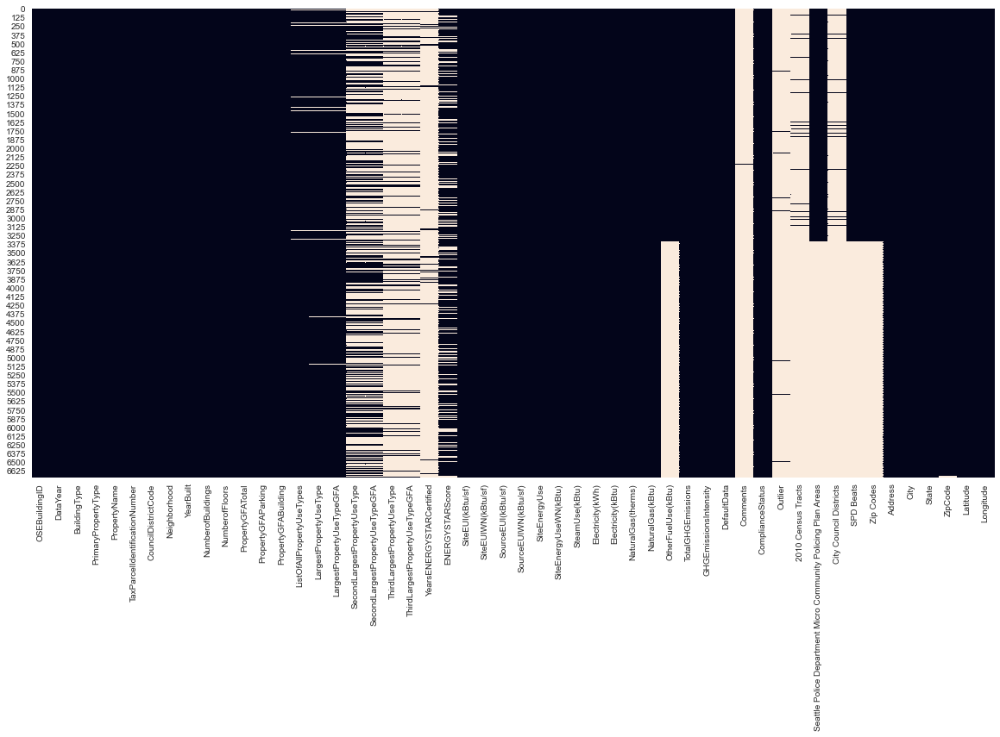

In [16]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

In [17]:
df.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding,ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse,SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes,Address,City,State,ZipCode,Latitude,Longitude
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,7,DOWNTOWN,1927,1.00000,12.00000,88434,0,88434,Hotel,Hotel,88434.00000,NaN,nan,NaN,nan,NaN,65.00000,78.90000,80.30000,173.50000,175.10000,6981428.00000,7097539.00000,2023032.00000,1080307.00000,3686160.00000,12724.00000,1272388.00000,0.00000,249.43000,2.64000,No,NaN,Compliant,NaN,nan,14.00000,nan,31.00000,18081.00000,405 OLIVE WAY,SEATTLE,WA,98101.00000,47.61219,-122.33800
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,7,DOWNTOWN,1996,1.00000,11.00000,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.00000,Parking,15064.00000,Restaurant,4622.00000,NaN,51.00000,94.40000,99.00000,191.30000,195.20000,8354235.00000,8765788.00000,0.00000,1144563.00000,3905411.00000,44490.00000,4448985.00000,0.00000,263.51000,2.38000,No,NaN,Compliant,NaN,nan,14.00000,nan,31.00000,18081.00000,724 PINE ST,SEATTLE,WA,98101.00000,47.61311,-122.33336
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,7,DOWNTOWN,1969,1.00000,41.00000,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.00000,Parking,100000.00000,Swimming Pool,0.00000,NaN,18.00000,96.60000,99.70000,242.70000,246.50000,73130656.00000,75506272.00000,19660404.00000,14583930.00000,49762435.00000,37099.00000,3709900.00000,0.00000,2061.48000,1.92000,Yes,NaN,Compliant,NaN,nan,56.00000,nan,31.00000,18081.00000,1900 5TH AVE,SEATTLE,WA,98101.00000,47.61335,-122.33770
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,7,DOWNTOWN,1926,1.00000,10.00000,61320,0,61320,Hotel,Hotel,61320.00000,NaN,nan,NaN,nan,NaN,1.00000,460.40000,462.50000,636.30000,643.20000,28229320.00000,28363444.00000,23458518.00000,811521.00000,2769023.00000,20019.00000,2001894.00000,0.00000,1936.34000,31.38000,No,NaN,Compliant,High Outlier,nan,56.00000,nan,31.00000,18081.00000,620 STEWART ST,SEATTLE,WA,98101.00000,47.61422,-122.33661
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,7,DOWNTOWN,1980,1.00000,18.00000,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.00000,Parking,68009.00000,Swimming Pool,0.00000,NaN,67.00000,120.10000,122.10000,228.80000,227.10000,14829099.00000,15078243.00000,0.00000,1777841.00000,6066245.00000,87631.00000,8763105.00000,0.00000,507.70000,4.02000,No,NaN,Compliant,NaN,nan,56.00000,nan,31.00000,19576.00000,401 LENORA ST,SEATTLE,WA,98121.00000,47.61375,-122.34092


# Features Engineering

## Création de la variable 'ageBuilding'

Il me semble pertinent de remplacer les deux colonnes : 
  - '**DataYear**' qui nous indique l'année du relevé par l'agent mais qui a une cardinalité très faible
  - '**YearBuilt**' qui nous indique l'année de construction du batiment
  
par une nouvelle colonne nommé '**ageBuilding**' qui nous indique <br />
depuis combien de temps un bâtiment à été construit.<br />

Nous conservons autant d'informations avec moins de colonnes ce qui est apréciable, <br />
autant d'un point de vue de la lisibilité, qu'en optimisation pour le Machine Learning.


In [18]:
df['ageBuilding'] = df['DataYear'] - df['YearBuilt']
df.drop(['DataYear','YearBuilt'], axis=1, inplace=True)

## Ajout des colonnes indiquant la nature et <br />la proportion des sources d'énergie utilisées

<u>La Dataset recense 4 sources d'énergie différentes</u> :

   - Electricité (Electricity)
   - Gaz Naturel (NaturalGas)
   - Vapeur (Steam)
   - Autre carburant (OtherFuel)
    
Je vais créer 4 nouvelles colonnes qui indiqueront, pour chaque bâtiment,<br />
la proportion utilisée pour chaque énergie.

<u>Au préalable</u> : 
   1. Je supprime les enregistrements ayant une valeur Null <br />ou inférieur ou égale à 0
      dans la colonne '**SiteEnergyUse**'
   2. Je renseigne à 0 les valeur Null des colonnes :
     - Electricity(kBtu)
     - SteamUse(kBtu)
     - NaturalGas(kBtu)
     - OtherFuelUse(kBtu)
   3. Je crée la colonne '**Total_EnergyUse**' qui correspond au total des 4 colonnes <br  />
      de relevé d'énergie pour vérifier si leur total correspond bien au total indiqué <br />
      dans la colonne '**SiteEnergyUse**'.

In [19]:
df = df[(df['SiteEnergyUse'] > 0) & (df['SiteEnergyUse'].notnull())]
df[['SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)','OtherFuelUse(kBtu)']] = \
df[['SteamUse(kBtu)','Electricity(kBtu)','NaturalGas(kBtu)','OtherFuelUse(kBtu)']].fillna(0)
df['Total_EnergyUse'] = df['Electricity(kBtu)'] + df['NaturalGas(kBtu)'] + df['SteamUse(kBtu)'] + df['OtherFuelUse(kBtu)']

In [20]:
df[['SiteEnergyUse',
    'Total_EnergyUse',
    'SteamUse(kBtu)',
    'Electricity(kBtu)',
    'NaturalGas(kBtu)',
    'OtherFuelUse(kBtu)']].head(30)

,SiteEnergyUse,Total_EnergyUse,SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),OtherFuelUse(kBtu)
0,6981428.00000,6981580.00000,2023032.00000,3686160.00000,1272388.00000,0.00000
1,8354235.00000,8354396.00000,0.00000,3905411.00000,4448985.00000,0.00000
2,73130656.00000,73132739.00000,19660404.00000,49762435.00000,3709900.00000,0.00000
3,28229320.00000,28229435.00000,23458518.00000,2769023.00000,2001894.00000,0.00000
4,14829099.00000,14829350.00000,0.00000,6066245.00000,8763105.00000,0.00000
5,12051984.00000,12052287.00000,0.00000,7271004.00000,4781283.00000,0.00000
6,6252842.00000,6252953.00000,0.00000,2679698.00000,3573255.00000,0.00000
7,6426022.00000,6426191.00000,2003108.00000,4108004.00000,315079.00000,0.00000
8,12633744.00000,12634049.00000,0.00000,7355649.00000,5278400.00000,0.00000
9,4587231.00000,4587329.00000,1483476.00000,2370050.00000,733803.00000,0.00000


La différence entre les colonnes '**SiteEnergyUse**' et '**Total_EnergyUse**'<br /> 
est minime, mais elle existe cependant.<br />
Pour cette raison, je choisis de calculer les proportions de chaque colonne <br />
à partir de l'addition des 4 colonnes existantes c'est à dire via la colonne '**Total_EnergyUse**'.



<u>Je vérifie si la valeur absolue de 1 moins le rapport <br />
    entre '**Total_EnergyUse**' et '**SiteEnergyUse**' <br />
    reste minime sur l'ensemble du DataFrame</u> :

C:\Users\waldu\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

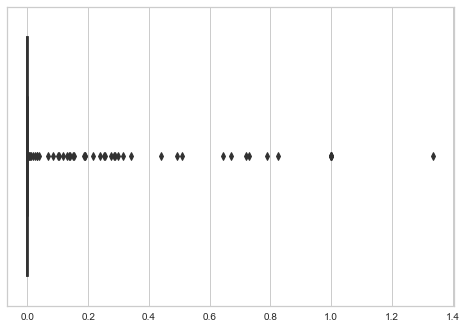

In [21]:
sns.boxplot(np.abs(1-(df['Total_EnergyUse']/df['SiteEnergyUse'])))

Certains enregistrements ont des valeurs différentes de presque 140% !

<u>Affichage de la valeur absolue de 1 moins le rapport entre<br /> '**Total_EnergyUse**' et '**SiteEnergyUse**'</u> :

In [22]:
np.abs(1-(df['Total_EnergyUse']/df['SiteEnergyUse'])).sort_values(ascending=False).head(30)

6546   1.33676
5108   1.00000
6688   1.00000
5820   1.00000
3853   1.00000
5661   1.00000
4663   1.00000
3788   0.82567
6101   0.79023
5597   0.72845
6131   0.72012
3845   0.67080
6690   0.64503
4015   0.50969
3941   0.49159
6617   0.44077
4879   0.34258
1201   0.31423
5223   0.29674
5538   0.28741
1308   0.28497
6064   0.27350
6615   0.25626
6611   0.25047
5781   0.23735
3903   0.21438
4095   0.19026
3411   0.18797
4620   0.18651
5935   0.15359
dtype: float64

<u>Pour plus de fiabilité, je filtre et retire les enregistrements qui ont un rapport de plus de 1% <br />
    entre  la valeur absolue de 1 moins le rapport entre '**Total_EnergyUse**' et '**SiteEnergyUse**'</u> :

In [23]:
print('Nombre d\'enregistrements avant traitement :',df.shape[0])
print('Nombre de lignes supprimées :',len(df[np.abs(1-(df['Total_EnergyUse']/df['SiteEnergyUse'])) >= 0.01]))
df = df[np.abs(1-(df['Total_EnergyUse']/df['SiteEnergyUse'])) < 0.01]
print('Nombre d\'enregistrements après traitement :',df.shape[0])

Nombre d'enregistrements avant traitement : 6681
Nombre de lignes supprimées : 45
Nombre d'enregistrements après traitement : 6636


<u>Je crée les 4 colonnes contenant les proportions <br />
d'énergie utilisées via la fonction *calcProportionEnergies*</u> :

In [24]:
def calcProportionEnergies(df):
    '''
    Calcule la proportion de chaque colonne par rapport 
    au total des colonnes passées en argument.
    Retourne le DataFrame passé en argument.'''
    
    data = df.copy()
    
    # Initialisation de la colonne 'Total' contenant le total des 4 énergies
    data['TOTAL'] = 0
    
    # Imputation des valeurs manquantes et renseignement de la colonne 'Total' 
    
    for col in ['Electricity(kBtu)', 'NaturalGas(kBtu)', 'SteamUse(kBtu)', 'OtherFuelUse(kBtu)']:
        data[col] = data[col].fillna(0)
        data['TOTAL'] += data[col]
    
    for key, value in {'Proportion_Electricity':'Electricity(kBtu)', 
                        'Proportion_NaturalGas':'NaturalGas(kBtu)', 
                        'Proportion_Steam': 'SteamUse(kBtu)', 
                        'Proportion_OtherFuel': 'OtherFuelUse(kBtu)'}.items():
        data[key] = data[value] / data['TOTAL']
    
    # Je ne retourne que 3 colonnes sur 4 car la dernière peut-être déduite des 3 premières.
    return data.drop(['TOTAL','Proportion_OtherFuel'], axis=1)

In [25]:
df = calcProportionEnergies(df)

<u>Je peux maintenant retirer la colonne '**Total_EnergyUse**'</u> :

In [26]:
df.drop('Total_EnergyUse', axis=1, inplace=True)

<u>Affichage du DataFrame '**df**' via ses valeurs manquantes</u> :

<AxesSubplot:>

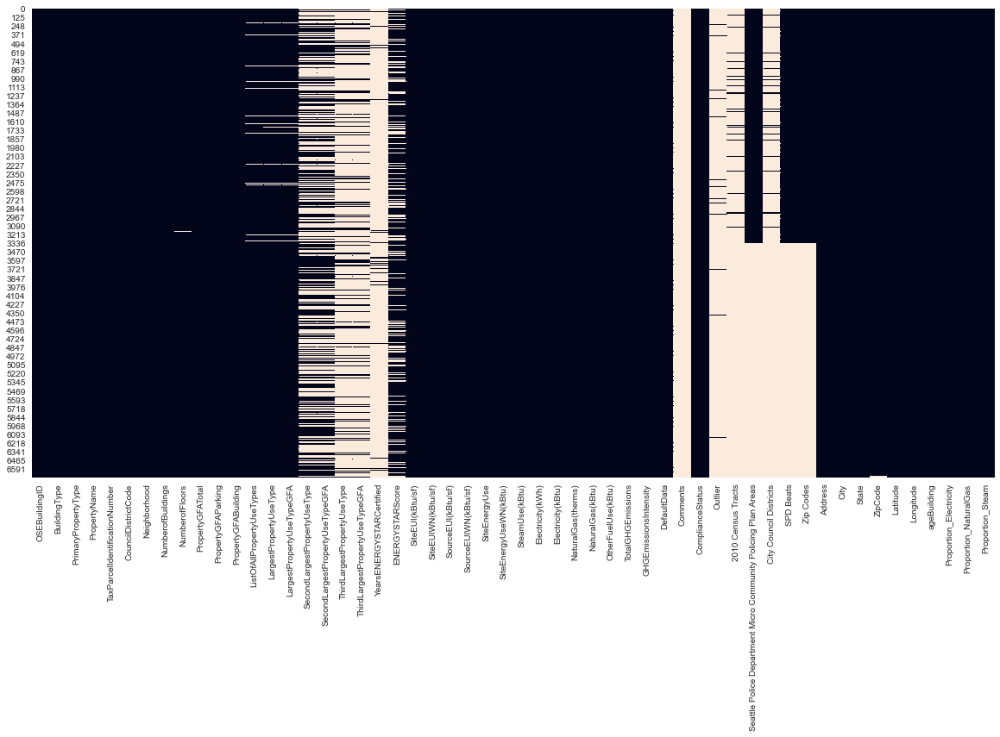

In [27]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

# Analyse métier

## Suppression des données Résidentielles

La colonne '**BuildingType**' nous indique la nature des bâtiments <br />
et nous permet d'identifier les bâtiments résidentiels et non résidentiels.

In [28]:
df.BuildingType.value_counts()

NonResidential          2898
Multifamily LR (1-4)    2029
Multifamily MR (5-9)    1126
Multifamily HR (10+)     217
SPS-District K-12        177
Nonresidential COS       144
Campus                    44
Nonresidential WA          1
Name: BuildingType, dtype: int64

<u>Je ne conserve que les bâtiments **Non Résidentiels**</u> :

In [29]:
df = df[df.BuildingType.isin(['NonResidential','SPS-District K-12','Nonresidential COS','Campus','Nonresidential WA'])]

## Suppression des données provenant <br />d'un relevé par un agent de terrain

L'objectif du projet est de tenter de prédire au mieux les données <br />
de consommation énergétique et d'émission de CO2 sans l'aide <br />
des relevés des agents de terrain.

<u>Je supprime donc toutes les données<br />
provenant d'un relevé réalisé par un agent</u> :

In [30]:
colReleveEnergie = df.columns[df.columns.str.contains('\(k') | df.columns.str.contains('\(t')].tolist()+['GHGEmissionsIntensity']
print('Liste des colonnes supprimées :',colReleveEnergie)
df.drop(colReleveEnergie, axis=1, inplace=True)
print('Nombre de colonnes dans le DataFrame \'df\': ',df.shape[1])

Liste des colonnes supprimées : ['SiteEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)', 'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)', 'GHGEmissionsIntensity']
Nombre de colonnes dans le DataFrame 'df':  42


## Suppression manuelle des colonnes inutiles

<u>J'itère les modalités des colonnes et j'identifie les colonnes constantes</u> :

*J'analyse également les colonnes sur la base de leur description <br />contenue dans les fichiers JSON du projet.*

In [31]:
for col in df.columns:
    print(f'{col :-<75} {len(df[col].value_counts())}')

OSEBuildingID-------------------------------------------------------------- 1692
BuildingType--------------------------------------------------------------- 5
PrimaryPropertyType-------------------------------------------------------- 30
PropertyName--------------------------------------------------------------- 3152
TaxParcelIdentificationNumber---------------------------------------------- 1825
CouncilDistrictCode-------------------------------------------------------- 7
Neighborhood--------------------------------------------------------------- 19
NumberofBuildings---------------------------------------------------------- 17
NumberofFloors------------------------------------------------------------- 45
PropertyGFATotal----------------------------------------------------------- 1659
PropertyGFAParking--------------------------------------------------------- 365
PropertyGFABuilding-------------------------------------------------------- 1686
ListOfAllPropertyUseTypes------------------

<u>J'affiche également les différentes valeurs des variables *Object* pour identifier <br />
des variables qui auront besoin d'être formatées suite au merge des deux DataFrames <br />
correspondant aux années 2015 et 2016</u> :

In [32]:
print('='*70)
for col in df.select_dtypes('object'):
    print(f'{col :-<50} {df[col].unique()}')
    print('='*70)
  

BuildingType-------------------------------------- ['NonResidential' 'Nonresidential COS' 'SPS-District K-12' 'Campus'
 'Nonresidential WA']
PrimaryPropertyType------------------------------- ['Hotel' 'Other' 'Mixed Use Property' 'K-12 School' 'College/University'
 'Small- and Mid-Sized Office' 'Self-Storage Facility\n'
 'Distribution Center' 'Large Office' 'Senior Care Community'
 'Medical Office' 'Retail Store' 'Hospital' 'Residence Hall/Dormitory'
 'Non-Refrigerated Warehouse' 'Distribution Center\n' 'SPS-District K-12'
 'Worship Facility' 'Supermarket/Grocery Store' 'Laboratory'
 'Self-Storage Facility' 'Refrigerated Warehouse' 'Restaurant\n'
 'Low-Rise Multifamily' 'Restaurant' 'University' 'Warehouse'
 'Residence Hall' 'Supermarket / Grocery Store' 'Office']
PropertyName-------------------------------------- ['MAYFLOWER PARK HOTEL' 'PARAMOUNT HOTEL' 'WESTIN HOTEL' ...
 'Queen Anne Pool' 'South Park Community Center'
 'Van Asselt Community Center']
TaxParcelIdentificationNumber---

<u>J'identifie les colonnes suivantes comme étant inutiles</u> : 
  - **City** --> *Cardinalité = 1*
  - **State** --> *Cardinalité = 1*
  - **PropertyName** --> *Il s'agit d'un ID*
  - **TaxParcelIdentificationNumber** --> *Il s'agit d'un ID*
  - **Seattle Police Department Micro Community Policing Plan Areas** --> *Inutile*
  - **SPD Beats** --> *Inutile*
  - **Zip Codes** --> *Inutile*
  - **NumberofBuildings** --> *Inutile*
  - **Comments** --> *Inutile*

In [33]:
df.drop(['City',
         'State',
         'PropertyName',
         'TaxParcelIdentificationNumber',
         'Seattle Police Department Micro Community Policing Plan Areas',
         'SPD Beats', 
         'Zip Codes',
         'NumberofBuildings',
         'Comments'], axis=1, inplace=True)
print('Nombre de colonnes dans le DataFrame \'df\': ',df.shape[1])

Nombre de colonnes dans le DataFrame 'df':  33


## Suppression des entrées dont les **targets** <br />ont des valeurs **négatives** ou **null**

In [34]:
df[(df.TotalGHGEmissions <= 0) | (df.SiteEnergyUse <= 0)]

,OSEBuildingID,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding,ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEnergyUse,TotalGHGEmissions,DefaultData,ComplianceStatus,Outlier,2010 Census Tracts,City Council Districts,Address,ZipCode,Latitude,Longitude,ageBuilding,Proportion_Electricity,Proportion_NaturalGas,Proportion_Steam


Il n'existe pas d'enregistrement pour lesquelles les *targets* ont une valeur négative ou égale à 0.

# Pré-Traitement des DataFrames 2/2

## Correction et Formatage des données suite <br />aux Merges des DataFrames '**df15**' et '**df16**'

Suite au listing des valeurs des colonnes *Object* réalisé précédement,<br />
j'ai identifié des colonnes à *formater* (les valeurs de 2015 doivent <br />
avoir le même format, orthographe ou casse que les valeurs de 2016).

### Formatage des entrées de la colonne '**DefaultData**' 

In [35]:
df.DefaultData.value_counts()

False    1539
No       1450
Yes       188
True       87
Name: DefaultData, dtype: int64

In [36]:
df.DefaultData = df.DefaultData.map({True: True, False: False, 'Yes':True, 'No': False})

In [37]:
df.DefaultData.value_counts()

False    2989
True      275
Name: DefaultData, dtype: int64

<u>La colonne **DefaultData** ne possède pas de valeur Null, je peux la convertir en colonne de type *Booleen*</u> :

In [38]:
df.DefaultData = df.DefaultData.astype(bool)

### Normalisation des entrées de la colonne '**Address**'

In [39]:
def normAddress(address):
    '''Cette fonction normalise l'écriture des adresses contenues dans la String <address> passées en argument.
    On modifie le champs 'address' dans cet ordre avant de retourner la String ainsi modifiée :
      1) Passage de la chaine en MAJUSCULE
      2) Suppression des points '.' 
      3) a) 'STREET' remplacé par 'ST'
         b) 'AVENUE' remplacé par 'AVE' 
      4) Numéro de rue écrit sous leur forme chiffré.'''
  
    address = address.upper()
    address = address.replace('.','')
    address = address.replace('STREET', 'ST')
    address = address.replace('AVENUE', 'AVE')
    address = address.replace('FIRST', '1ST')
    address = address.replace('SECOND', '2ND')
    address = address.replace('THIRD', '3RD')
    address = address.replace('FOURTH', '4TH')
    address = address.replace('FIFTH', '5TH') 

    return address

In [40]:
df['Address'] = df['Address'].apply(lambda col: normAddress(col))

### Conversion au format List des données de la colonne '**YearsENERGYSTARCertified**'

In [41]:
df.YearsENERGYSTARCertified.value_counts()

2016                                                                                        25
2009                                                                                         8
2013                                                                                         7
2017                                                                                         6
2016, 2015                                                                                   6
20162015                                                                                     4
2014                                                                                         4
2010                                                                                         4
20172016                                                                                     3
2015                                                                                         3
2011                                              

Les entrées (des années) sont soit séparées par une virgule,<br />
soient collées les unes aux autres sans séparateur.

<u>Je formate cette colonne et transforme les données en *List*</u> :

In [42]:
def insert_char(myStr, group=4, char=','):
    '''Si <myStr> est Null, retourne np.nan
       Sinon Si <char> n'est pas présent dans <myStr>,
       on insère <char> tous les <group> caractères de la chaîne <myStr>
       et on retourne le résultat au format List
       Sinon on supprime les espaces de <myStr> et on retourne
       le résultat au format List'''
       
    if pd.isna(myStr):
        return np.nan
    else:
        myStr = str(myStr)
        if not char in myStr:
            return [int(i) for i in char.join(myStr[i:i+group] for i in range(0, len(myStr), group)).split(",")]
        else:
            return [int(i) for i in myStr.replace(" ", "").split(",")]

In [43]:
df.YearsENERGYSTARCertified = df.YearsENERGYSTARCertified.apply(lambda col: insert_char(col))

<u>Quelques exemples du résultat</u> :

In [44]:
df.YearsENERGYSTARCertified[df.YearsENERGYSTARCertified.notna()].tail(10)

6175                                        [2017, 2016]
6191                                              [2016]
6434    [2016, 2015, 2014, 2013, 2012, 2010, 2009, 2008]
6435                                  [2017, 2016, 2015]
6436                      [2016, 2015, 2010, 2009, 2008]
6456                                              [2013]
6458                                              [2013]
6539                                  [2016, 2009, 2008]
6621                                        [2017, 2016]
6657                                              [2017]
Name: YearsENERGYSTARCertified, dtype: object

### Correction des encodages de la colonne '**PrimaryPropertyType**'

<u>Je supprime l'encodage "\n" présent dans certaines occurrences</u> :

In [45]:
df.PrimaryPropertyType.value_counts()

Small- and Mid-Sized Office    582
Other                          491
Large Office                   338
K-12 School                    254
Mixed Use Property             217
Retail Store                   189
Warehouse                      187
Non-Refrigerated Warehouse     187
Hotel                          149
Worship Facility               143
Medical Office                  82
Distribution Center             55
Distribution Center\n           51
Senior Care Community           39
Supermarket / Grocery Store     39
Supermarket/Grocery Store       36
Self-Storage Facility           29
Self-Storage Facility\n         27
Refrigerated Warehouse          25
College/University              21
Residence Hall                  21
University                      21
Hospital                        20
Residence Hall/Dormitory        15
Restaurant                      13
Laboratory                      11
Restaurant\n                    10
Low-Rise Multifamily             5
SPS-District K-12   

In [46]:
df.PrimaryPropertyType = df.PrimaryPropertyType.apply(lambda col: col.replace("\n", ""))

In [47]:
df.PrimaryPropertyType.value_counts()

Small- and Mid-Sized Office    582
Other                          491
Large Office                   338
K-12 School                    254
Mixed Use Property             217
Retail Store                   189
Warehouse                      187
Non-Refrigerated Warehouse     187
Hotel                          149
Worship Facility               143
Distribution Center            106
Medical Office                  82
Self-Storage Facility           56
Senior Care Community           39
Supermarket / Grocery Store     39
Supermarket/Grocery Store       36
Refrigerated Warehouse          25
Restaurant                      23
College/University              21
Residence Hall                  21
University                      21
Hospital                        20
Residence Hall/Dormitory        15
Laboratory                      11
Low-Rise Multifamily             5
SPS-District K-12                4
Office                           3
Name: PrimaryPropertyType, dtype: int64

### Correction de la casse et correction de notation de la colonne '**Neighborhood**'

In [48]:
df.Neighborhood.value_counts()

DOWNTOWN                  714
GREATER DUWAMISH          684
LAKE UNION                293
MAGNOLIA / QUEEN ANNE     292
EAST                      242
NORTHEAST                 238
NORTHWEST                 165
BALLARD                   131
NORTH                     120
CENTRAL                   100
SOUTHEAST                  91
DELRIDGE                   86
SOUTHWEST                  80
North                       9
Ballard                     6
Northwest                   5
Central                     4
Delridge                    3
DELRIDGE NEIGHBORHOODS      1
Name: Neighborhood, dtype: int64

In [49]:
df.Neighborhood = df.Neighborhood.apply(lambda col: col.upper())

In [50]:
df.loc[df.Neighborhood.str.contains('DELRIDGE'),'Neighborhood'] = 'DELRIDGE'

In [51]:
df.Neighborhood.value_counts()

DOWNTOWN                 714
GREATER DUWAMISH         684
LAKE UNION               293
MAGNOLIA / QUEEN ANNE    292
EAST                     242
NORTHEAST                238
NORTHWEST                170
BALLARD                  137
NORTH                    129
CENTRAL                  104
SOUTHEAST                 91
DELRIDGE                  90
SOUTHWEST                 80
Name: Neighborhood, dtype: int64

### Correction de la casse de la colonne '**Outlier**'

In [52]:
df.Outlier.value_counts()

Low Outlier     15
Low outlier     14
High Outlier    14
High outlier     2
Name: Outlier, dtype: int64

In [53]:
df.Outlier = df.Outlier.map({'High Outlier':'High Outlier', 
                             'High outlier':'High Outlier', 
                             'Low Outlier':'Low Outlier', 
                             'Low outlier':'Low Outlier'})

In [54]:
df.Outlier.value_counts()

Low Outlier     29
High Outlier    16
Name: Outlier, dtype: int64

### Conversion au format List des données de la colonne '**ListOfAllPropertyUseTypes**'

In [55]:
df[['ListOfAllPropertyUseTypes','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']]

,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
0,Hotel,Hotel,NaN,NaN
1,"Hotel, Parking, Restaurant",Hotel,Parking,Restaurant
2,"Hotel, Parking, Swimming Pool",Hotel,Parking,Swimming Pool
3,Hotel,Hotel,NaN,NaN
4,"Hotel, Parking, Swimming Pool",Hotel,Parking,Swimming Pool
...,...,...,...,...
6711,Office,Office,NaN,NaN
6712,Other - Recreation,Other - Recreation,NaN,NaN
6713,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,Fitness Center/Health Club/Gym,Swimming Pool
6714,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,Fitness Center/Health Club/Gym,Pre-school/Daycare


In [56]:
df['ListOfAllPropertyUseTypes'].dropna().unique()

array(['Hotel', 'Hotel, Parking, Restaurant',
       'Hotel, Parking, Swimming Pool', 'Police Station',
       'Other - Entertainment/Public Assembly', 'Hotel, Parking',
       'Data Center, Library, Parking',
       'Fitness Center/Health Club/Gym, Office, Swimming Pool',
       'Office, Other, Other - Lodging/Residential, Restaurant, Social/Meeting Hall',
       'Courthouse', 'Other', 'K-12 School', 'College/University',
       'Automobile Dealership',
       'Hotel, Parking, Retail Store, Swimming Pool',
       'K-12 School, Multifamily Housing, Office, Other - Entertainment/Public Assembly',
       'Self-Storage Facility', 'Non-Refrigerated Warehouse, Office',
       'Office, Other - Education',
       'Office, Self-Storage Facility, Vocational School',
       'Data Center, Office, Retail Store', 'Office, Retail Store',
       'Office, Other - Entertainment/Public Assembly, Restaurant',
       'Hotel, Parking, Restaurant, Retail Store',
       'Hotel, Other - Entertainment/Public A

La colonne '**ListOfAllPropertyUseTypes**' contient des chaînes de caractère <br />
contenant des éléments séparés par une virgule.

Je crée une fonction permettant de convertir cette colonne au format *List* <br />
en gérant également les cas particuliers où des virgules peuvent être à l'intérieur d'éléments.<br />
Il ne faut donc pas les considérer comme des séparateurs.

In [57]:
def ConvToListColumnListOfAllPropertyUseTypes(dataLOAPUT):
    '''Retourne sous forme de liste chaque enregistrement 
    de la colonne ListOfAllPropertyUseTypes (LOAPUT)en prenant 
    en compte les erreurs possibles dues aux virgules incluses 
    dans certains enregistrements'''

    # Listes spéciales contenant les éléments mal splités par une virgule ou contenant des parenthèses
    specialList = ['Hospital (General Medical & Surgical)',
                'Personal Services (Health/Beauty, Dry Cleaning, etc)',
                'Repair Services (Vehicle, Shoe, Locksmith, etc)']

    # Liste des élements à retirer car ajouté par erreur
    errorList = ['Dry Cleaning', 'Shoe', 'Locksmith', 'etc)']

    myList = []
  
    if pd.notna(dataLOAPUT):
        for i in dataLOAPUT.split(','):
            if i.strip() not in myList and not '(' in i :
                myList.append(i.strip())
            else:
                for j in specialList:
                    if (i.strip() in j) and (j not in myList):
                        myList.append(j)

    return [k for k in myList if k not in errorList]

Je convertis sous forme de List les valeurs contenu dans '**ListOfAllPropertyUseTypes**'

In [58]:
df['ListOfAllPropertyUseTypes'] = df['ListOfAllPropertyUseTypes'].\
apply(lambda ele: ConvToListColumnListOfAllPropertyUseTypes(ele))

# Identification des Targets

## Identification et définition des Targets

Voici décrit ci-dessous les deux données, normalement calculées par les agents de terrain,<br />
que nous allons chercher à prédire à partir des données récoltées par les agents en 2015 et 2016.

'<u>**TotalGHGEmissions**</u>' :

  - <u>Définition</u> : La quantité totale d'émission de gaz à effet de serre, y compris le dioxyde de carbone, <br />
  le méthane et l'oxyde nitreux, rejetée dans l'atmosphère à la suite de la consommation d'énergie sur le site, <br />
  mesurée en tonne d'équivalent dioxyde de carbone.

'<u>**SiteEnergyUse**</u>' :

  - <u>Définition</u> : La quantité annuelle d'énergie consommée par le bien, toutes sources d'énergie confondues.
  - <u>Unité utilisée</u> : **kBtu** --> Kilo British Thermal Units / Kilo d'unités thermiques britanniques

<u>Pour information</u> : 

  - 1 kBtu = 0.29 kWh
  - 1 kWh = 3.41 kBtu


## Réarangement des colonnes *Targets* <br />dans le DataFramme '**df**'

<u>Pour plus de lisibilité, je réarrange les colonnes du DataFrame <br />
et place les colonnes Targets sur la droite</u> :

In [59]:
df = df[[col for col in df if col not in ['TotalGHGEmissions','SiteEnergyUse']] + ['TotalGHGEmissions','SiteEnergyUse']]

# Analyse de la forme des données

<u>Maintenant que nos données sont correctement formatées, <br />attardons nous un peu sur les caractéristiques de notre DataFrame '**df**'</u> : 

## Dimension du DataFrame '**df**'

In [60]:
df.shape

(3264, 33)

## Analyse des types de données du DataFrame

In [61]:
df.dtypes.value_counts()

float64    15
object     11
int64       6
bool        1
dtype: int64

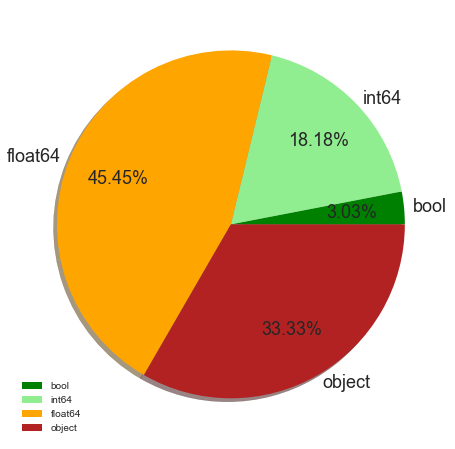

In [62]:
plt.figure(figsize = (8, 8))
x = df.dtypes.value_counts().sort_index()
plt.pie(x, labels = ['bool', 'int64', 'float64', 'object'],
           textprops={'fontsize': 18},
           colors = ['green', 'lightgreen', 'orange', 'firebrick'],
           autopct = lambda x: str(round(x, 2)) + '%',
           pctdistance = 0.7, labeldistance = 1.05,
           shadow = True)
plt.legend()

## Identification des variables catégorielles

<u>Je répartie mes colonnes en 3 catégories</u> :
  - Les données qui ont une notion d'Ordre et de Distance
    - Ces données restent dans leur format numérique
    - Ces données seront Standardisées
  - Les données qui ont une notion d'Ordre mais pas de Distance
    - Ces données seront encodées avec un CardinalEncoder (0,1,2,3,...)
  - Les données qui n'ont ni de notion d'Ordre, ni de notion de Distance
    - Ces données seront encodées avec une méthode de type One-Hot-Encoder

In [63]:
Ordre_Distance = ['ageBuilding',
                  'NumberofFloors',
                  'PropertyGFATotal',
                  'PropertyGFAParking',
                  'PropertyGFABuilding',
                  'LargestPropertyUseTypeGFA',
                  'SecondLargestPropertyUseTypeGFA',
                  'ThirdLargestPropertyUseTypeGFA',
                  'ENERGYSTARScore',
                  '2010 Census Tracts',
                  'Latitude',
                  'Longitude',
                  'Proportion_Electricity',
                  'Proportion_NaturalGas',
                  'Proportion_Steam',
                  'TotalGHGEmissions',
                  'SiteEnergyUse',]
NoDistance_Ordre = ['Outlier','DefaultData']
NoDistance_NoOrdre = ['BuildingType',
                      'PrimaryPropertyType',
                      'CouncilDistrictCode',
                      'Neighborhood',
                      'ComplianceStatus',
                      'City Council Districts',
                      'Address',
                      'ZipCode',
                      'YearsENERGYSTARCertified',
                      'ListOfAllPropertyUseTypes',
                      'LargestPropertyUseType',
                      'SecondLargestPropertyUseType',
                      'ThirdLargestPropertyUseType']

## <u>Analyse des Targets</u>: '**TotalGHGEmissions**' et '**SiteEnergyUse**'

C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, 'Distribution')

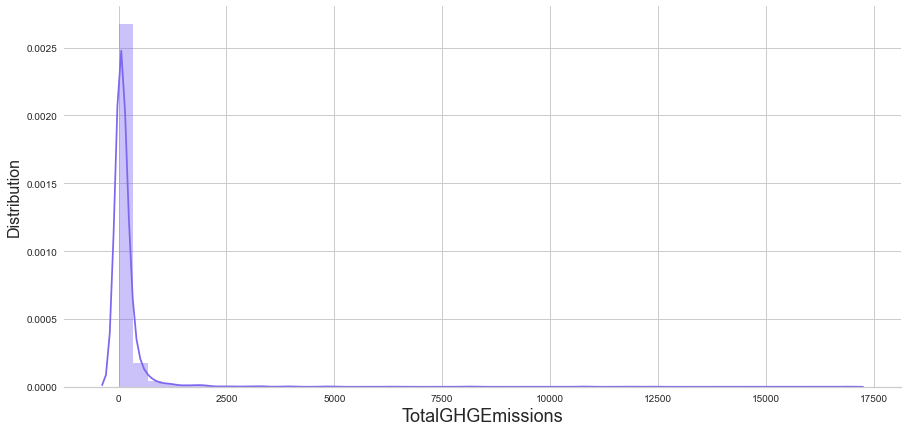

In [64]:
f, axes = plt.subplots(figsize=(15, 7))
sns.despine(left=True)

sns.distplot(df.TotalGHGEmissions, color='mediumslateblue')
plt.xlabel('TotalGHGEmissions', fontsize=18)
plt.ylabel('Distribution', fontsize=16)

C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0, 0.5, 'Distribution')

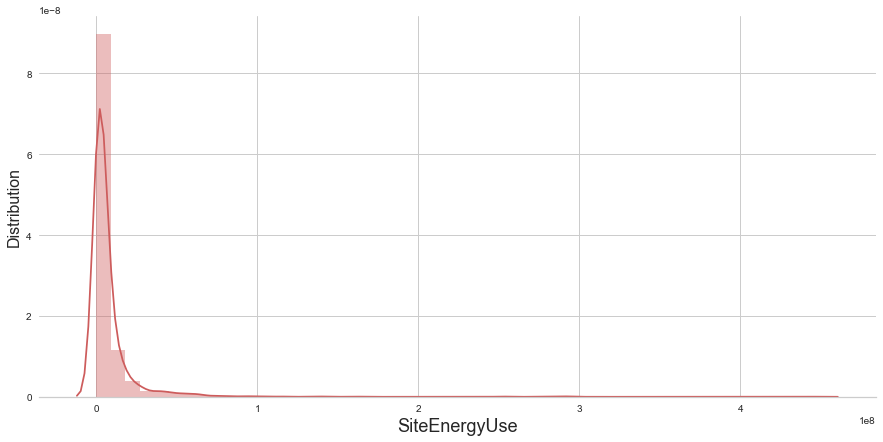

In [65]:
f, axes = plt.subplots(figsize=(15, 7))
sns.despine(left=True)

sns.distplot(df.SiteEnergyUse, color='indianred')
plt.xlabel('SiteEnergyUse', fontsize=18)
plt.ylabel('Distribution', fontsize=16)

La distribution des *targets* est unimodale non centrée.

# Traitement des valeurs manquantes

## Visualisation des valeurs manquantes <br />du DataFrame '**df**' avant traitement

<AxesSubplot:>

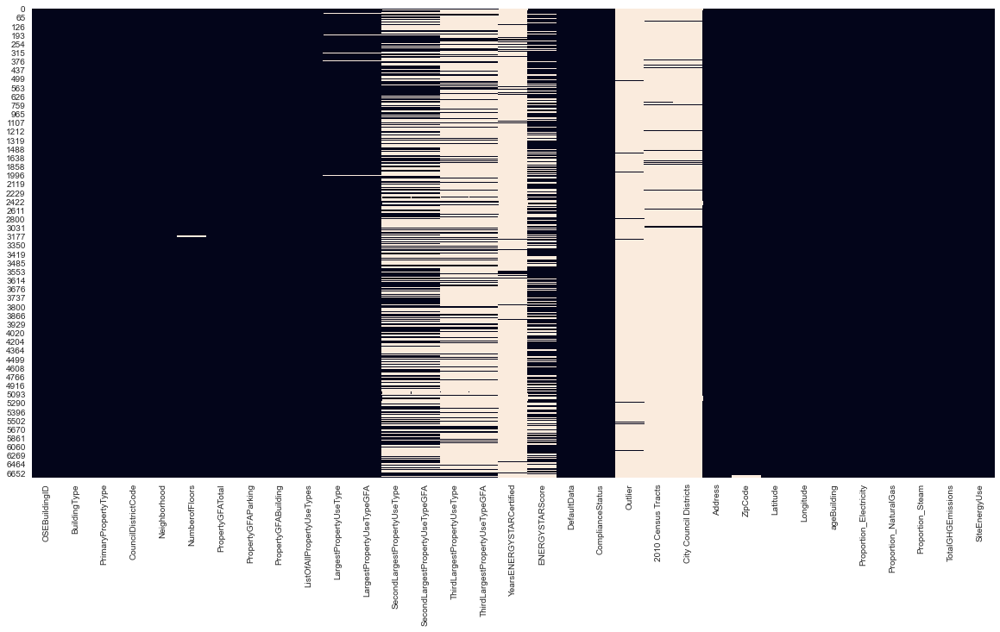

In [66]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

<u>Affichage des colonnes et de leur *taux de vide* correspondant</u> :

In [67]:
(df.isnull().sum()/df.shape[0]).sort_values(ascending=False)

Outlier                           0.98621
City Council Districts            0.97549
2010 Census Tracts                0.97335
YearsENERGYSTARCertified          0.94332
ThirdLargestPropertyUseType       0.79259
ThirdLargestPropertyUseTypeGFA    0.79259
SecondLargestPropertyUseType      0.49387
SecondLargestPropertyUseTypeGFA   0.49387
ENERGYSTARScore                   0.32690
LargestPropertyUseTypeGFA         0.02114
LargestPropertyUseType            0.02114
ZipCode                           0.00490
NumberofFloors                    0.00245
ListOfAllPropertyUseTypes         0.00000
CouncilDistrictCode               0.00000
PropertyGFABuilding               0.00000
Neighborhood                      0.00000
PrimaryPropertyType               0.00000
PropertyGFAParking                0.00000
PropertyGFATotal                  0.00000
BuildingType                      0.00000
SiteEnergyUse                     0.00000
TotalGHGEmissions                 0.00000
DefaultData                       

<u>Je choisis les stratégies suivantes pour renseigner mes valeurs manquantes</u> :
  - '**Outlier**' ---> Appliquer 'No Outlier'
  - '**2010 Census Tracts**', '**City Council Districts**' ---> Colonne à Supprimer
  - '**YearsENERGYSTARCertified**' ---> [] (List vide)
  - '**SecondLargestPropertyUseType**','**ThirdLargestPropertyUseType**' ---> 'Aucun'
  - '**SecondLargestPropertyUseTypeGFA**','**ThirdLargestPropertyUseTypeGFA**' ---> 0
  - '**ENERGYSTARScore**' ---> Explication ci-dessous
  - '**LargestPropertyUseType**' --> Explication ci-dessous
  - '**LargestPropertyUseTypeGFA**' --> Mediane en fonction de la catégorie de '**LargestPropertyUseType**'
  - '**ZipCode**' ---> Renseigner en fonction des coordonnées Latitude et Longitude
  - '**NumberofFloors**' --> Si possible renseigner la valeur à partir d'une autre entrée ayant le même '**OSEBuildingID**', sinon renseigner -99 et supprimer l'entrée.

## '**Outlier**'

In [68]:
df.Outlier = df.Outlier.fillna('No Outlier')

## '**2010 Census Tracts**' et '**City Council Districts**'

In [69]:
df.drop(['2010 Census Tracts', 'City Council Districts'], axis=1, inplace=True)

## '**YearsENERGYSTARCertified**'

In [70]:
df.YearsENERGYSTARCertified = df.YearsENERGYSTARCertified.apply(lambda col: col if isinstance(col, list) else [])

## '**LargestPropertyUseType**', '**LargestPropertyUseTypeGFA**', <br />'**SecondLargestPropertyUseType**', '**SecondLargestPropertyUseTypeGFA**', <br />'**ThirdLargestPropertyUseType**', '**ThirdLargestPropertyUseTypeGFA**'

Ci-dessous, je décris la stratégie adoptée, pour chaque enregistrement <br />
de notre jeu de données, pour renseigner les 6 colonnes lorsque les champs sont vides.

Je ferai référence à des dictionnaires dont les définitions <br />
et les explications seront présentées un peu plus bas.

<u>Renseignement de la colonne '**LargestPropertyUseType**'</u> :

Je renseigne les valeurs manquantes de la colonne '**LargestPropertyUseType**' <br />
à partir du contenu de la colonne '**PrimaryPropertyType**' <br />
et du *dictionnaire* **dictLinkListEachPrimaryPT** (que je nommerai **dictKey** ci-dessous <br />
par souci de lisibilité).


  - Si le contenu de la colonne '**PrimaryPropertyType**' ne correspond pas à une clé du *dictionnaire* **dictKey**
    - Je renseigne la valeur '**Aucun ou Non Renseigné**'
  - Sinon Si la *valeur* associée à la *clé* est une *List* (plusieurs choix possibles donc catégorie impossible à déterminer)
    - Je renseigne la valeur '**Aucun ou Non Renseigné**'
  - Sinon
    - Je renseigne la valeur correspondante à la *clé* du *dictionnaire* **dictKey**

<u>Renseignement de la colonne '**SecondLargestPropertyUseType**'</u> :

Je renseigne les valeurs manquantes de la colonne '**SecondLargestPropertyUseType**' <br />
à partir du contenu des colonnes '**NbListOfAllPropertyUseTypes**', '**ListOfAllPropertyUseTypes**',<br /> '**PrimaryPropertyType**' et du *dictionnaire* **dictKey**

  - Si le contenu de la colonne '**NbListOfAllPropertyUseTypes**' est différente de 2
    - Je renseigne la valeur '**Aucun ou Non Renseigné**'
  - Sinon
    - Je renseigne une variable <**secondElement**> qui correspond à l'élement restant si on retire l'élement identique présent dans '**PrimaryPropertyType**'
    - Si <**secondElement**> ne correspond pas à une clé du *dictionnaire* **dictKey**
      - Je renseigne la valeur '**Aucun ou Non Renseigné**'
    - Sinon Si la *valeur* associé à la *clé* est une *List* (plusieurs choix possibles donc catégorie impossible à déterminer)
      - Je renseigne la valeur '**Aucun ou Non Renseigné**'
    - Sinon
      - Je renseigne la valeur correspondante à la *clé* du *dictionnaire* **dictKey**
      

<u>Renseignement de la colonne '**ThirdLargestPropertyUseType**'</u> :

  - Je renseigne la valeur '**Aucun ou Non Renseigné**'


<u>Renseignement des colonnes '**LargestPropertyUseTypeGFA**', <br />
    '**SecondLargestPropertyUseTypeGFA**' et '**ThirdLargestPropertyUseTypeGFA**'</u> :
    
Je renseigne les valeurs manquantes des colonnes '**LargestPropertyUseTypeGFA**', <br />
    '**SecondLargestPropertyUseTypeGFA**' et '**ThirdLargestPropertyUseTypeGFA**'<br />
    à partir du contenu des colonnes correspondantes (sans GFA) et <br />
    du *dictionnaire* **dictOfEachPropertyUses**
    (que je nommerai **dictMedian** ci-dessous par souci de lisibilité)

  - Si la valeur de la colonne correspondante (sans GFA) est '**Aucun ou Non Renseigné**'
    - Je renseigne la valeur **0**.
  - Sinon
    - Je renseigne la valeur correspondante à la *clé* du *dictionnaire* **dictMedian**

 <u>Je crée une colonne '**NbListOfAllPropertyUseTypes**' qui contient <br />
 le nombre d'éléments dans chaque List de '**ListOfAllPropertyUseTypes**'</u> :

In [71]:
df['NbListOfAllPropertyUseTypes'] = df.ListOfAllPropertyUseTypes.apply(lambda row: len(row))

<u>J'ajoute immédiatement cette nouvelle colonne dans la List [Ordre_Distance]</u> :

In [72]:
Ordre_Distance.append('NbListOfAllPropertyUseTypes')

Je remplis un *dictionnaire* contenant comme *clés* l'ensemble des entrées existantes dans '**ListOfAllPropertyUseTypes**'<br /> 
et comme *valeurs* les médianes associées pour la colonne '**LargestPropertyUseTypeGPA**'<br />
Je renseigne **0** si aucune entrée n'existe pour une *clé* donnée dans la colonne '**LargestPropertyUseType**'.

In [73]:
dictOfEachPropertyUses = {}
for i in df.ListOfAllPropertyUseTypes:
    for j in i:
        if j not in dictOfEachPropertyUses:
            if np.isnan(df["LargestPropertyUseTypeGFA"][df["LargestPropertyUseType"]==j].median()):
                dictOfEachPropertyUses[j] = 0
            else:
                dictOfEachPropertyUses[j] = df["LargestPropertyUseTypeGFA"][df["LargestPropertyUseType"]==j].median()

<u>Affichage du contenu du *dictionnaire* '**dictOfEachPropertyUses**'</u> :

In [74]:
dictOfEachPropertyUses

{'Hotel': 83591.0,
 'Parking': 104922.0,
 'Restaurant': 23373.0,
 'Swimming Pool': 0,
 'Police Station': 88830.0,
 'Other - Entertainment/Public Assembly': 35886.0,
 'Data Center': 60000.0,
 'Library': 15150.0,
 'Fitness Center/Health Club/Gym': 45000.0,
 'Office': 49800.0,
 'Other': 37510.0,
 'Other - Lodging/Residential': 29820.0,
 'Social/Meeting Hall': 20969.5,
 'Courthouse': 537150.0,
 'K-12 School': 55279.5,
 'College/University': 84300.0,
 'Automobile Dealership': 38787.0,
 'Retail Store': 36940.0,
 'Multifamily Housing': 21400.0,
 'Self-Storage Facility': 38439.0,
 'Non-Refrigerated Warehouse': 33462.0,
 'Other - Education': 23904.0,
 'Vocational School': 0,
 'Senior Care Community': 56000.0,
 'Medical Office': 62869.5,
 'Distribution Center': 41308.0,
 'Hospital (General Medical & Surgical)': 483520.0,
 'Museum': 43000.0,
 'Repair Services (Vehicle, Shoe, Locksmith, etc)': 22320.0,
 'Food Service': 22710.0,
 'Residence Hall/Dormitory': 27600.0,
 'Other - Services': 20047.0,
 '

<u>Je réalise la même action que précedement mais pour la colonne '**PrimaryPropertyType**'</u> :<br />
*Il est à noter que les clés ne sont pas exactement les mêmes entre les deux *dictionnaires**

In [75]:
dictOfEachPrimaryPropertyType = {}
for i in df.PrimaryPropertyType:
    if i not in dictOfEachPrimaryPropertyType:
        if np.isnan(df["LargestPropertyUseTypeGFA"][df["PrimaryPropertyType"]==i].median()):
            dictOfEachPrimaryPropertyType[i] = 0
        else:
            dictOfEachPrimaryPropertyType[i] = df["LargestPropertyUseTypeGFA"][df["PrimaryPropertyType"]==i].median()

In [76]:
dictOfEachPrimaryPropertyType

{'Hotel': 82731.0,
 'Other': 38787.0,
 'Mixed Use Property': 18635.5,
 'K-12 School': 55279.5,
 'College/University': 90322.0,
 'Small- and Mid-Sized Office': 32610.0,
 'Self-Storage Facility': 38439.0,
 'Distribution Center': 41369.0,
 'Large Office': 162975.5,
 'Senior Care Community': 56000.0,
 'Medical Office': 74230.5,
 'Retail Store': 40000.0,
 'Hospital': 483520.0,
 'Residence Hall/Dormitory': 26000.0,
 'Non-Refrigerated Warehouse': 35344.5,
 'SPS-District K-12': 0,
 'Worship Facility': 26210.0,
 'Supermarket/Grocery Store': 41447.0,
 'Laboratory': 83182.5,
 'Refrigerated Warehouse': 25340.0,
 'Restaurant': 22719.0,
 'Low-Rise Multifamily': 22669.0,
 'University': 84300.0,
 'Warehouse': 35289.0,
 'Residence Hall': 33448.0,
 'Supermarket / Grocery Store': 42760.0,
 'Office': 13661.0}

Les clés des deux dictionnaires étant différentes, je crée le *dictionnaire* '**dictLinkListEachPrimaryPT**'.<br />
Il renseigne la correspondance entre les clés respectives des dictionnaires '**dictOfEachPropertyUses**' et '**dictOfEachPrimaryPropertyType**'.<br />
A chaque *clé* du *dictionnaire* '**dictLinkListEachPrimaryPT**' correspond une *clé* du *dictionnaire* '**dictOfEachPrimaryPropertyType**'.<br />
A chaque *valeur* du *dictionnaire* '**dictLinkListEachPrimaryPT**' correspond une ou plusieurs (*List*) *valeurs* du *dictionnaire* '**dictOfEachPropertyUses**'.

In [77]:
dictLinkListEachPrimaryPT = {'College/University': 'College/University',
                             'Distribution Center': 'Distribution Center',
                             'Hospital': 'Hospital (General Medical & Surgical)',
                             'Hotel': 'Hotel',
                             'K-12 School': 'K-12 School',
                             'Laboratory': 'Laboratory',
                             'Large Office': 'Office',
                             'Low-Rise Multifamily': 'Multifamily Housing',
                             'Medical Office': 'Medical Office',
                             'Mixed Use Property': ['Social/Meeting Hall',
                                                    'Other - Entertainment/Public Assembly',
                                                    'Medical Office', 'Multifamily Housing', 
                                                    'Laboratory',
                                                    'Non-Refrigerated Warehouse', 
                                                    'Office', 
                                                    'Retail Store', 
                                                    'Parking',
                                                    'Other', 
                                                    'Distribution Center', 
                                                    'Supermarket/Grocery Store',
                                                    'Other - Restaurant/Bar', 
                                                    'Hotel', 
                                                    'Strip Mall',
                                                    'Fitness Center/Health Club/Gym', 
                                                    'Other - Education',
                                                    'Restaurant', 
                                                    'Residence Hall/Dormitory', 
                                                    'Bank Branch',
                                                    'Other - Recreation'],
                             'Non-Refrigerated Warehouse': 'Non-Refrigerated Warehouse',
                             'Office': 'Office',
                             'Other': ['Police Station', 
                                       'Other - Entertainment/Public Assembly',
                                       'Library', 'Fitness Center/Health Club/Gym',
                                       'Courthouse', 
                                       'Other',
                                       'Automobile Dealership',
                                       'Museum',
                                       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
                                       'Other - Lodging/Residential', 
                                       'Other/Specialty Hospital',       
                                       'Financial Office', 
                                       'Parking', 
                                       'Convention Center',       
                                       'Urgent Care/Clinic/Other Outpatient', 
                                       'Laboratory',
                                       'Other - Services', 
                                       'Strip Mall', 
                                       'Wholesale Club/Supercenter',
                                       'Other - Recreation', 
                                       'Lifestyle Center',
                                       'Other - Public Services', 
                                       'Data Center', 
                                       'Other - Mall',
                                       'Manufacturing/Industrial Plant', 
                                       'Social/Meeting Hall',
                                       'Other - Education', 
                                       'Fire Station', 
                                       'Performing Arts','Residential Care Facility', 
                                       'Bank Branch', 
                                       'Food Service',
                                       'Adult Education', 
                                       'Other - Utility', 
                                       'Movie Theater',
                                       'Outpatient Rehabilitation/Physical Therapy',
                                       'Personal Services (Health/Beauty, Dry Cleaning, etc)',
                                       'Pre-school/Daycare', 
                                       'Prison/Incarceration'],
                             'Refrigerated Warehouse': 'Refrigerated Warehouse',
                             'Residence Hall': 'Residence Hall/Dormitory',
                             'Residence Hall/Dormitory': 'Residence Hall/Dormitory',
                             'Restaurant': ['Restaurant', 
                                            'Other - Restaurant/Bar'],
                             'Retail Store': ['Retail Store', 
                                              'Other'],
                             'SPS-District K-12': [],
                             'Self-Storage Facility': 'Self-Storage Facility',
                             'Senior Care Community': 'Senior Care Community',
                             'Small- and Mid-Sized Office': 'Office',
                             'Supermarket / Grocery Store': ['Supermarket/Grocery Store', 
                                                             'Wholesale Club/Supercenter'],
                             'Supermarket/Grocery Store': 'Supermarket/Grocery Store',
                             'University': 'College/University',
                             'Warehouse': 'Non-Refrigerated Warehouse',
                             'Worship Facility': 'Worship Facility'}

<u>Définition de la fonction permettant de renseigner les valeurs manquantes <br />
des 6 colonnes selon la stratégie décrite plus haut</u> :

In [78]:
# Traitement des valeurs manquantes des 6 colonnes :
#    LargestPropertyUseType         |    LargestPropertyUseTypeGFA
#    SecondLargestPropertyUseType   |    SecondLargestPropertyUseTypeGFA
#    ThirdLargestPropertyUseType    |    ThirdLargestPropertyUseTypeGFA

def fillFirstSecondThirdPrimaryPropertyTypeAndGFA(row):
    dictValToReturn={}

    # Je renomme mes dictionnaires de référence par souci de lisibilité
    dictKey = dictLinkListEachPrimaryPT
    dictMean = dictOfEachPropertyUses

    # String par défault si aucune valeur de disponible
    ANR = 'Aucun ou Non Renseigné'

    # Traitement de 'LargestPropertyUseType'              
    if pd.notnull(row['LargestPropertyUseType']):
        dictValToReturn['LargestPropertyUseType'] = row['LargestPropertyUseType']
    elif row['PrimaryPropertyType'] not in dictKey:
        dictValToReturn['LargestPropertyUseType'] = ANR
    elif isinstance(dictKey[row['PrimaryPropertyType']],list):
        dictValToReturn['LargestPropertyUseType'] = ANR
    else:
        dictValToReturn['LargestPropertyUseType'] = dictKey[row['PrimaryPropertyType']]
                 
                
    # Traitement de 'LargestPropertyUseTypeGFA'
    if pd.notnull(row['LargestPropertyUseTypeGFA']):
        dictValToReturn['LargestPropertyUseTypeGFA'] = row['LargestPropertyUseTypeGFA']
    elif dictValToReturn['LargestPropertyUseType'] == ANR:
        dictValToReturn['LargestPropertyUseTypeGFA'] = 0
    else:
        dictValToReturn['LargestPropertyUseTypeGFA'] = dictMean[dictValToReturn['LargestPropertyUseType']]
  
    # Traitement de 'SecondLargestPropertyUseType'
    if pd.notnull(row['SecondLargestPropertyUseType']):
        dictValToReturn['SecondLargestPropertyUseType'] = row['SecondLargestPropertyUseType']
    elif row['NbListOfAllPropertyUseTypes'] != 2:
        dictValToReturn['SecondLargestPropertyUseType'] = ANR
    else:
        secondElement = [item for item in row['ListOfAllPropertyUseTypes'] if item not in dictKey[row['PrimaryPropertyType']]][0]
        if secondElement not in dictKey:
            dictValToReturn['SecondLargestPropertyUseType'] = ANR
        elif isinstance(dictKey[secondElement],list):
            dictValToReturn['SecondLargestPropertyUseType'] = ANR
        else:
            dictValToReturn['SecondLargestPropertyUseType'] = dictKey[secondElement]
  
    # Traitement de 'SecondLargestPropertyUseTypeGFA'
    if pd.notnull(row['SecondLargestPropertyUseTypeGFA']):
        dictValToReturn['SecondLargestPropertyUseTypeGFA'] = row['SecondLargestPropertyUseTypeGFA']
    elif dictValToReturn['SecondLargestPropertyUseType'] == ANR:
        dictValToReturn['SecondLargestPropertyUseTypeGFA'] = 0
    else:
        dictValToReturn['SecondLargestPropertyUseTypeGFA'] = dictMean[dictValToReturn['SecondLargestPropertyUseType']]
  
    # Traitement de ThirdLargestPropertyUseType
    if pd.notnull(row['ThirdLargestPropertyUseType']):
        dictValToReturn['ThirdLargestPropertyUseType'] = row['ThirdLargestPropertyUseType']
    else:
        dictValToReturn['ThirdLargestPropertyUseType'] = ANR

    # Traitement de ThirdLargestPropertyUseTypeGFA
    if pd.notnull(row['ThirdLargestPropertyUseTypeGFA']):
        dictValToReturn['ThirdLargestPropertyUseTypeGFA'] = row['ThirdLargestPropertyUseTypeGFA']
    elif dictValToReturn['ThirdLargestPropertyUseType'] == ANR:
        dictValToReturn['ThirdLargestPropertyUseTypeGFA'] = 0
    else:
        dictValToReturn['ThirdLargestPropertyUseTypeGFA'] = dictMean[dictValToReturn['ThirdLargestPropertyUseType']]

    # On retourne le dictionnaire {dictValToReturn}
    return dictValToReturn

<u>Renseignement des 6 colonnes</u> :
   - '**LargestPropertyUseType**'
   - '**LargestPropertyUseTypeGFA**'
   - '**SecondLargestPropertyUseType**'
   - '**SecondLargestPropertyUseTypeGFA**'
   - '**ThirdLargestPropertyUseType**'
   - '**ThirdLargestPropertyUseTypeGFA**'

In [79]:
df[['LargestPropertyUseType',
     'LargestPropertyUseTypeGFA',
     'SecondLargestPropertyUseType',
     'SecondLargestPropertyUseTypeGFA',
     'ThirdLargestPropertyUseType',
     'ThirdLargestPropertyUseTypeGFA']] = df.apply(lambda row: pd.Series([fillFirstSecondThirdPrimaryPropertyTypeAndGFA(row)['LargestPropertyUseType'],
                                                                          fillFirstSecondThirdPrimaryPropertyTypeAndGFA(row)['LargestPropertyUseTypeGFA'],
                                                                          fillFirstSecondThirdPrimaryPropertyTypeAndGFA(row)['SecondLargestPropertyUseType'],
                                                                          fillFirstSecondThirdPrimaryPropertyTypeAndGFA(row)['SecondLargestPropertyUseTypeGFA'],
                                                                          fillFirstSecondThirdPrimaryPropertyTypeAndGFA(row)['ThirdLargestPropertyUseType'],
                                                                          fillFirstSecondThirdPrimaryPropertyTypeAndGFA(row)['ThirdLargestPropertyUseTypeGFA']]), axis=1)

## '**ZipCode**'

La recherche de correspondance avec le champs '**OSEBuildingID**' ne fonctionne malheureusement pas <br />
sur l'ensemble des valeurs manquantes de mon jeu de données.<br />
Lorsque la correspondance avec le champs '**OSEBuildingID**' n'est pas possible, <br />
je retourne le '**ZipCode**' du bâtiment géographiquement le plus proche.<br />
Pour déterminer le bâtiment le plus proche, je choisis le '**ZipCode**' disponible du bâtiment <br />
ayant la valeur la plus proche de la valeur absolue du produit de la '**Latitude**' et de la '**Longitude**'.<br />
Cette méthode, bien qu'imprécise au niveau mondial, semble très bien fonctionner à l'échelle d'une ville, <br />
les vérifications manuelles réalisées ont montré que les résultats obtenus étaient corrects.

<u>J'écris la fonction me permettant d'appliquer ma stratégie<br />
puis je renseigne ma colonne '**ZipCode**' avec cette fonction</u> :

In [80]:
def fillZipCode(row):
    '''Retourne le CP (CodePostal, colonne nommé ZipCode) d'un enregistrement
    Si le CP est déjà renseigné alors on le retourne directement.
    Sinon Si au moins une adresse identique dans le DataFrame df existe et 
    qu'au moins un CP est renseigné parmi ces adresses alors 
    on retourne ce CP.
    Sinon on retourne le CP de l'enregistrement le plus proche qui a un CP renseigné.
    
    L'enregistrement est désigné le plus proche en fonction de la valeur absolue du 
    produit de sa Latitude et de sa Longitude.'''
    if pd.notnull(row.ZipCode):
        return row.ZipCode
    else:
        if len(df[(df.Address == row.Address) & (df.ZipCode.notnull())]) > 0:
            return df[(df.Address == row.Address) & (df.ZipCode.notnull())]['ZipCode'].iloc[0]
        else:
            return df.iloc[((df[df.ZipCode.notnull()]['Latitude']*df[df.ZipCode.notnull()]['Longitude'])-\
                            (row['Latitude']*row['Longitude'])).abs().argsort()[0]]['ZipCode']

    

In [81]:
df['ZipCode'] = df.apply(lambda row: fillZipCode(row), axis=1)

<u>La colonne '**ZipCode**' ne contient plus de valeur **Null**,<br />
je peux maintenant la convertir au format **int**</u> :

In [82]:
df.ZipCode = df.ZipCode.astype(int)

## '**NumberofFloors**'

J'effectue ici une recherche de correspondance avec la colonne '**OSEBuildingID**'.<br />
Si la recherche de correspondance ne fonctionne pas, je retourne la valeur **-99**.<br />
Une fois les valeurs manquantes renseignées je nettoie cette colonne en retirant <br />
toutes les valeurs négatives.

In [83]:
def fillNumOfFloors(row):
    ''' Renseigne le nombre d'étages d'un immeuble en fonction du champs 'OSEBuildingID' d'un autre immeuble.
      Retourne le champs 'NumberofFloors' d'un immeuble ayant le même 'OSEBuildingID' que celui de <row> 
      et ayant le champs 'NumberofFloors' Non Null
      Sinon retourne la valeur -99.'''

    if pd.notnull(row.NumberofFloors):
        return row.NumberofFloors
    else:
        if len(df[(df.OSEBuildingID == row.OSEBuildingID) & (df.NumberofFloors.notnull())]) > 0:
            return df[(df.OSEBuildingID == row.OSEBuildingID) & (df.NumberofFloors.notnull())]['NumberofFloors'].iloc[0]
        else:
            return -99
  

In [84]:
df['NumberofFloors'] = df.apply(lambda row: fillNumOfFloors(row), axis=1)
df = df[df.NumberofFloors >= 0]

## '**ENERGYSTARScore**'

Un des objectifs de ce projet est de juger de la pertinence <br />
de devoir calculer l'**ENERGYSTARScore**.

Il n'est donc pas pertinent de chercher à compléter artificiellement cette colonne,<br />
cela biaiserait les résultats et nous éloignerait de notre objectif.

Je ne complète pas cette colonne et je filtrerai le DataFrame '**df**' <br />
sur les valeurs *Non Null* de '**ENERGYSTARScore**' lorsque je souhaiterai étudier <br />
l'importance de cette caractéristique.

## Visualisation des valeurs manquantes du DataFrame df après traitement

<AxesSubplot:>

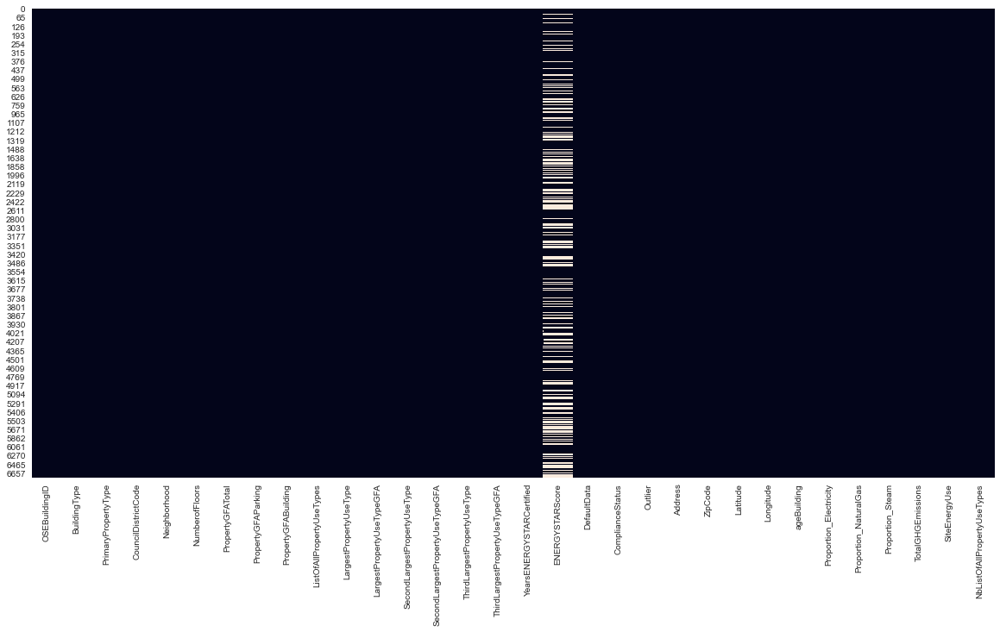

In [85]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

<u>Vérifions plus précisément s'il reste des valeurs manquantes hors colonne 'ENERGYSTARScore**'</u> :

In [86]:
(df.isnull().sum()/df.shape[0]).sort_values(ascending=False)

ENERGYSTARScore                   0.32669
NbListOfAllPropertyUseTypes       0.00000
ThirdLargestPropertyUseType       0.00000
BuildingType                      0.00000
PrimaryPropertyType               0.00000
CouncilDistrictCode               0.00000
Neighborhood                      0.00000
NumberofFloors                    0.00000
PropertyGFATotal                  0.00000
PropertyGFAParking                0.00000
PropertyGFABuilding               0.00000
ListOfAllPropertyUseTypes         0.00000
LargestPropertyUseType            0.00000
LargestPropertyUseTypeGFA         0.00000
SecondLargestPropertyUseType      0.00000
SecondLargestPropertyUseTypeGFA   0.00000
ThirdLargestPropertyUseTypeGFA    0.00000
SiteEnergyUse                     0.00000
YearsENERGYSTARCertified          0.00000
DefaultData                       0.00000
ComplianceStatus                  0.00000
Outlier                           0.00000
Address                           0.00000
ZipCode                           

Les valeurs manquantes ont bien toutes été traitées.

<u>Affichons pour terminer cette partie,<br /> 
les dimensions du Dataframe '**df**'</u> :

In [87]:
df.shape

(3263, 32)

# Traitement des doublons

Des bâtiments ont été analysés par les agents sur le terrain d'une année sur l'autre. <br />
Ils constituent des doublons qu'il faut analyser.<br />
Les bâtiments sont désignés par leurs **id** et sont renseignés dans la colonne '**OSEBuildingID**'.

<u>J'identifie 2 types de doublons</u> :
  - Les bâtiments identiques d'une année sur l'autre -> Doublon à supprimer
  - Les bâtiments différents d'une année sur l'autre (travaux, agrandissement, etc.) -> Doublon à conserver

In [88]:
df.duplicated(subset=['OSEBuildingID'], keep=False).value_counts()

True     3144
False     119
dtype: int64

**3144** bâtiments ont un '**OSEBuildingID**' présent sur l'année 2015 <u>et</u> l'année 2016. <br />
Seulement **119** bâtiments ne sont présents que sur l'une des deux années 2015 ou 2016.

<u>Pour décider quel doublon garder, je vais m'appuyer sur <br />
les informations contenues dans les colonnes</u> :
  - '**ENERGYSTARScore**'
  - '**DefaultData**'.

'**DefaultData**' indique si des données par défaut pour <br />
au moins une caractéristique de la propriété ont été utilisées.<br />
Un enregistrement ayant cette caractéristique à **False** sera plus précis <br />
qu'un enregistrement qui a cette caractéristique à **True**.

'**DefaultData**' est souvent à **False** pour l'année **2016** <br />
lorsqu'il y a doublon sur les 2 années, mais ce n'est pas systématique.


<u>Stratégie de conservation adoptée pour chaque bâtiment analysé</u> :

- <u>**Si** le bâtiment est le seul à posséder son '**OSEBuildingID**'</u>
  - il n'a pas de doublon: **on le conserve**
- <u>**Sinon Si** le bâtiment **n'a pas** la même superficie que son doublon</u> (le bâtiment ayant le même 'OSEBuildingID' que celui analysé)
  - Le bâtiment n'est pas considéré comme doublon, ce sont deux bâtiments différents (travaux, etc.) **on le conserve**.
- <u>**Sinon Si** le bâtiment a le même statut de présence de valeur pour 'ENERGYSTARScore' (est renseignée / n'est pas renseignée) que son doublon</u>
  - <u>Si le bâtiment a la même valeur pour '**DefaultData**' que son doublon</u>
    - **Je conserve le bâtiment s'il est plus jeune que son doublon** (sur le critère '**ageBuilding**')
  - <u>**Sinon**</u>
    - **Je conserve le bâtiment si la valeur de son 'DefaultData' est False**, je le rejette sinon
- <u>**Sinon**</u>
  - **Je conserve le bâtiment s'il possède un 'ENERGYSTARScore'**, je le rejette sinon

Je filtre '**df**' en affichant que les '**OSEBuildingID**' <br />
qui ont leur valeur '**DefaultData**' à **True**.<br />
Puis j'affiche le df trié de manière ascendante <br />
sur les colonnes '**OSEBuildingID**' et '**ageBuilding**' afin <br />
de regrouper les doublons deux à deux.

<u>Enfin, je filtre les colonnes en affichant que les 5 qui nous intéressent ici</u> :
  - 'OSEBuildingID'
  - 'ENERGYSTARScore'
  - 'ageBuilding'
  - 'DefaultData'
  - 'PropertyGFABuilding'

In [89]:
df[df.OSEBuildingID.isin(df.OSEBuildingID[df.DefaultData])].sort_values\
  (by=['OSEBuildingID','ageBuilding'],ascending=[True,True])\
  [['OSEBuildingID','ENERGYSTARScore','ageBuilding','DefaultData','PropertyGFABuilding']].head(30)

,OSEBuildingID,ENERGYSTARScore,ageBuilding,DefaultData,PropertyGFABuilding
2,3,18.00000,46,True,961990
3342,3,43.00000,47,False,759392
13,18,56.00000,35,True,258352
3353,18,58.00000,36,False,258352
22,28,96.00000,54,True,56228
3362,28,95.00000,55,True,56228
27,33,20.00000,14,True,133585
3367,33,57.00000,15,False,133585
30,36,80.00000,66,True,160645
3370,36,75.00000,67,True,160645


Pour sélectionner efficacement quel doublon conserver pour chaque doublon de mon DataFrame, <br />
je crée une nouvelle colonne qui indiquera si la ligne est sélectionnée ou non. <br />
Je renseignerai cette ligne grâce à la fonction **selectDoublonOSEBuildingID** ci-dessous :

In [90]:
def selectDoublonOSEBuildingID(row):
    ''' Retourne True ou False pour indiquer si l'enregistrement <row> est à conserver ou non '''
    
    if len(df[df['OSEBuildingID']==row['OSEBuildingID']]) < 2: # Si pas de doublon pour cet OSE_ID
        return True # On garde cette enregistrement
    else:
        secondElement = df[(df.OSEBuildingID == row['OSEBuildingID']) & (df.index != row.name)].iloc[0]
        if row['PropertyGFABuilding'] != secondElement['PropertyGFABuilding']: # Si les valeurs de 'PropertyGFABuilding' sont différentes entre <row> et <secondElement>
            return True # Ce n'est pas un doublon, on conserve cet enregistrement
        else:
            if df[df.OSEBuildingID == row['OSEBuildingID']]['ENERGYSTARScore'].notnull().iloc[0] == df[df.OSEBuildingID == row['OSEBuildingID']]['ENERGYSTARScore'].notnull().iloc[1]:
                if df[df.OSEBuildingID == row['OSEBuildingID']]['DefaultData'].iloc[0] == df[df.OSEBuildingID == row['OSEBuildingID']]['DefaultData'].iloc[1]: # Si les deux OSE_ID sont à True ou les deux à False
                    return row['ageBuilding'] < secondElement['ageBuilding'] # On conserve l'enregistrement s'il est plus jeune que SecondElement.
                else:
                    return not row['DefaultData'] # On conserve l'enregistrement si DefaultData est False, on le rejete sinon
            else:
                return pd.notnull(row['ENERGYSTARScore'])

<u>J'indique dans une nouvelle colonne '**validationOSEBuildingID**', <br />
les bâtiments à *conserver* ou à *supprimer*</u> :

In [91]:
df['validationOSEBuildingID'] = df.apply(lambda row: selectDoublonOSEBuildingID(row), axis=1)

Il reste **1776** bâtiments.

In [92]:
df.validationOSEBuildingID.value_counts()

True     1776
False    1487
Name: validationOSEBuildingID, dtype: int64

<u>Pour contrôler, nous pouvons afficher les colonnes qui sont entrées dans le processus de décision <br />
et observer le choix final dans la colonne '**validationOSEBuildingID**'</u> :

In [93]:
df[df.OSEBuildingID.isin(df.OSEBuildingID[df.DefaultData])].sort_values\
  (by=['OSEBuildingID','ageBuilding'],ascending=[True,True])\
  [['OSEBuildingID','ENERGYSTARScore','ageBuilding','DefaultData','PropertyGFABuilding','validationOSEBuildingID']].head(10)

,OSEBuildingID,ENERGYSTARScore,ageBuilding,DefaultData,PropertyGFABuilding,validationOSEBuildingID
2,3,18.00000,46,True,961990,True
3342,3,43.00000,47,False,759392,True
13,18,56.00000,35,True,258352,False
3353,18,58.00000,36,False,258352,True
22,28,96.00000,54,True,56228,True
3362,28,95.00000,55,True,56228,False
27,33,20.00000,14,True,133585,False
3367,33,57.00000,15,False,133585,True
30,36,80.00000,66,True,160645,True
3370,36,75.00000,67,True,160645,False


<u>Je filtre mon DataFrame '**df**' avec les batiments séléctionnés</u> :

In [94]:
df = df[df.validationOSEBuildingID]

<u>Je supprime les deux colonnes '**OSEBuildingID**' et '**validationOSEBuildingID**' de mon DataFrame</u> :

In [95]:
df.drop(['OSEBuildingID','validationOSEBuildingID'], axis=1, inplace=True)

# Traitement des Outliers

Les **outliers** (ou valeurs aberrantes) sont généralement définis<br />
comme toutes valeurs extrêmes, supérieures ou inférieures à X fois<br />
l’écart interquartile **IQR**.<br />
Généralement X vaut '1,5'.<br/>
L’écart interquartile IQR correspond à la différence entre la valeur<br />
du 3ème quartile et la valeur du 1er quartile.

Une donnée identifiée comme **outlier** ne permet pas, <br />
à priori, de juger de la pertinence de la présence d'une valeur dans l'échantillon.<br />
Une analyse métier doit être faite pour distinguer les valeurs <br />
légitimes qu'il faut conserver des valeurs abérrantes issues d'une <br />
erreur (humaine, de convertion d'unité, etc.) et qui doivent être supprimées.

Ici je vais commencer par visualiser les **outliers** de nos différentes variables quantitatives.<br />
Ensuite je filtrerai les valeurs identifiées comme aberrantes en utilisant la <u>distance de Cook</u>.

Cependant, je commencerai par éliminer quelques **Outliers** <br />
sur la base d'une analyse métier que je décrierai ci-dessous.

<u>Dimension du DataFrame '**df**' avant traitement des Outliers</u> :

In [96]:
df.shape

(1776, 31)

## Traitement manuel

D'après *Wikipédia*, le plus haut immeuble de Seattle à 76 étages.<br />
<u>Je supprime les enregistrements d'immeubles ayant plus de 76 étages</u> :

In [97]:
df = df[df.NumberofFloors <= 76]
print('Nombre d\'enregistrements restants dans \'df\' :',df.shape[0])

Nombre d'enregistrements restants dans 'df' : 1775


<u>Je supprime également les enregistrements qui ont <br />
    leur '**LargestPropertyUseType**' plus petit ou égal à 0</u> :

In [98]:
df = df[df.LargestPropertyUseTypeGFA > 0]
print('Nombre d\'enregistrements restants dans \'df\' :',df.shape[0])

Nombre d'enregistrements restants dans 'df' : 1754


<u>Je supprime les bâtiments qui n'ont qu'un seul type de propriété <br />
    et dont la surface totale du bâtiment est supérieure à au moins 2 fois <br />
    la superficie de cette propriété</u> :

In [99]:
df = df[(df.NbListOfAllPropertyUseTypes != 1) | (df.PropertyGFABuilding <= 2*df.LargestPropertyUseTypeGFA)]
print('Nombre d\'enregistrements restants dans \'df\' :',df.shape[0])

Nombre d'enregistrements restants dans 'df' : 1739


Il me parrait aberrant d'avoir des enregistrements avec <br />
des variables '**PropertyGFATotal**', <br />
*qui correspondent à la superficie totale de la propriété*, <br />
être inférieures à la variable '**LargestPropertyUseTypeGFA**', <br />
*qui elle, n'est qu'une composante de la surface de cette propriété*.

<u>Je supprime donc ces valeurs aberrantes</u> :

In [100]:
df = df[df.PropertyGFATotal >= df.LargestPropertyUseTypeGFA]
print('Nombre d\'enregistrements restants dans \'df\' :',df.shape[0])

Nombre d'enregistrements restants dans 'df' : 1497


<u>Et enfin, je supprime toutes les valeurs négatives <br />
des colonnes renseignant sur des surfaces</u> :

In [101]:
df = df[(df.filter(regex='GFA', axis=1) >= 0).all(1)]
print('Nombre d\'enregistrements restants dans \'df\' :',df.shape[0])

Nombre d'enregistrements restants dans 'df' : 1495


<u>Je mets à jour ma liste des variables continues, <br />
présente dans la List Ordre_Distance</u> :

In [102]:
Ordre_Distance = [ele for ele in Ordre_Distance if ele in df.columns]

<u>Commençons par afficher sous forme de BoxPlot, <br />
la distribution de nos données de nos variables continues</u> :

*Nous attarderons ici sur les Outliers identifiés dans Seaborn et <br />
affichés sous forme de losanges et définis selon <br />
le calcul (+ ou -)1.5 * l'écart interquartile.*

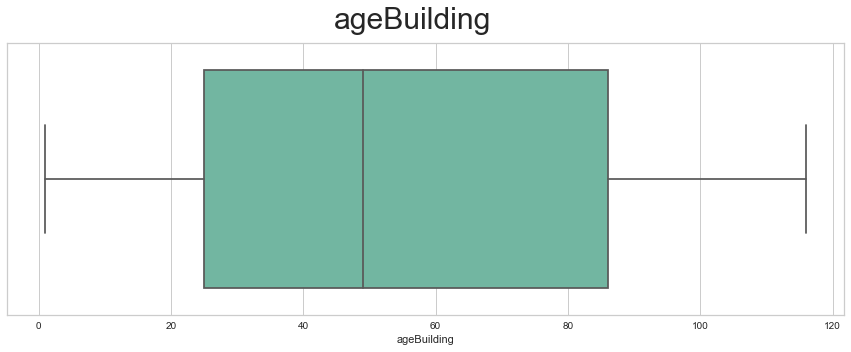

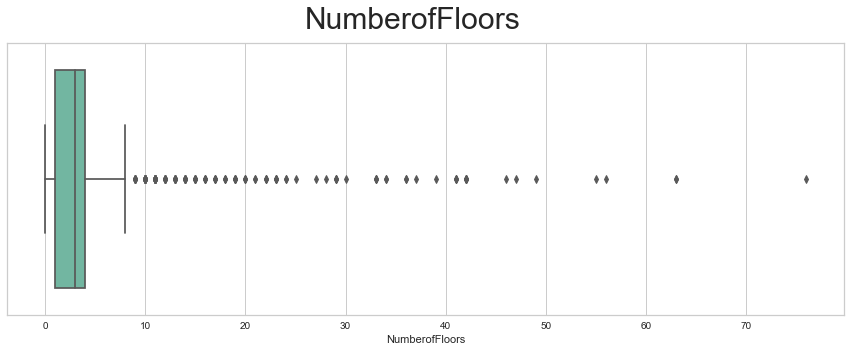

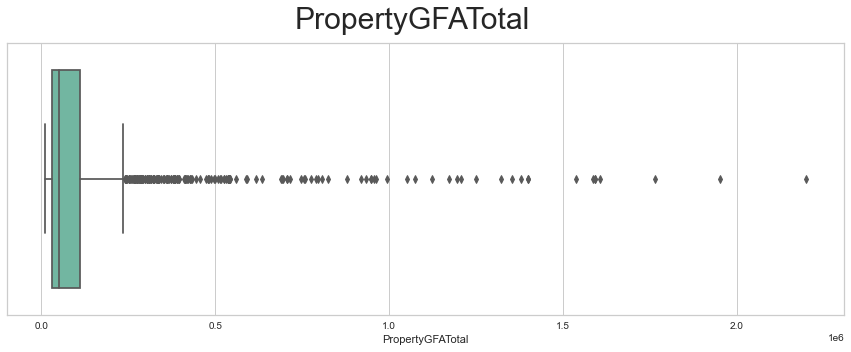

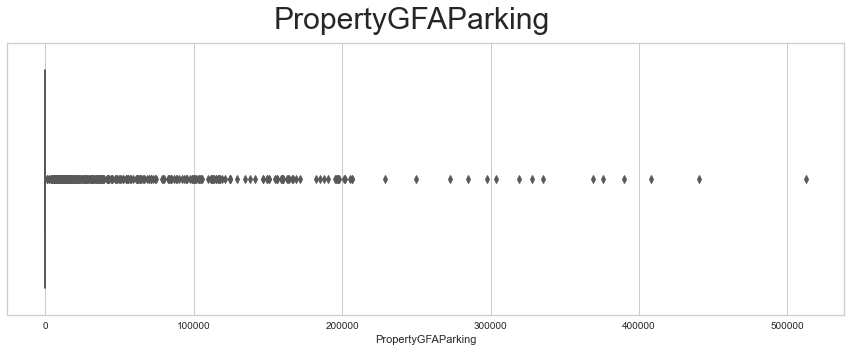

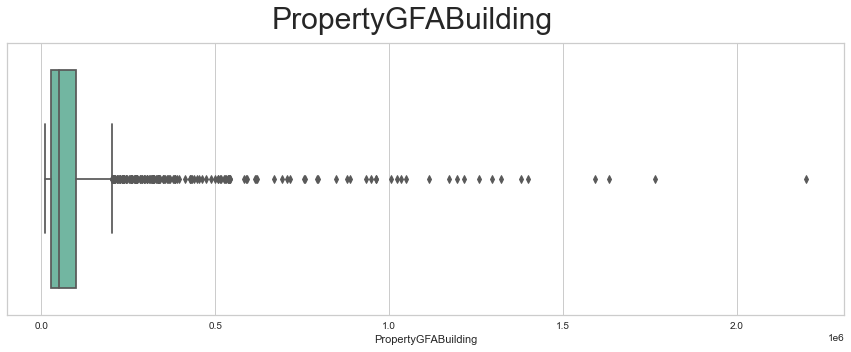

...

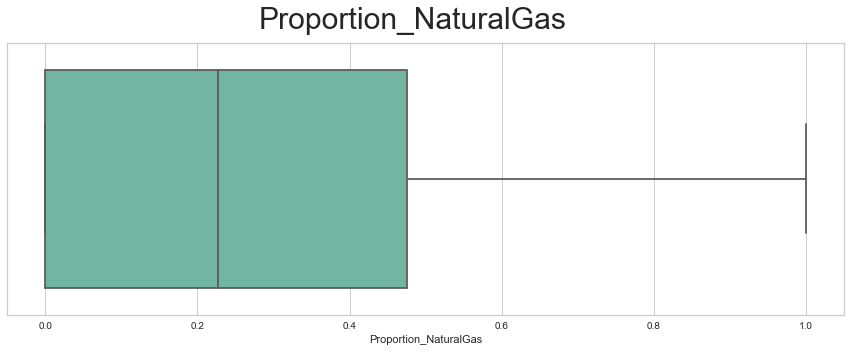

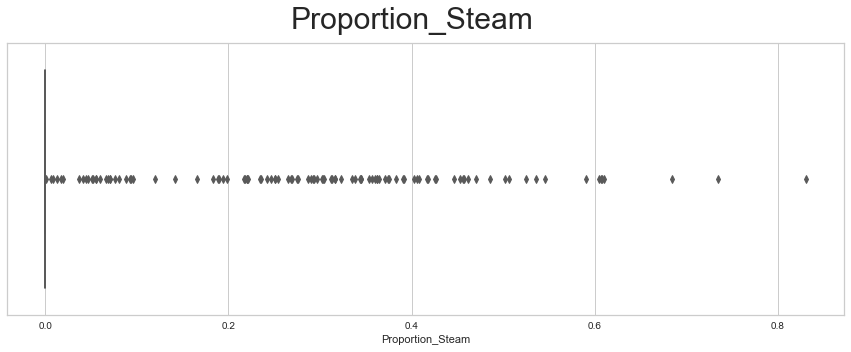

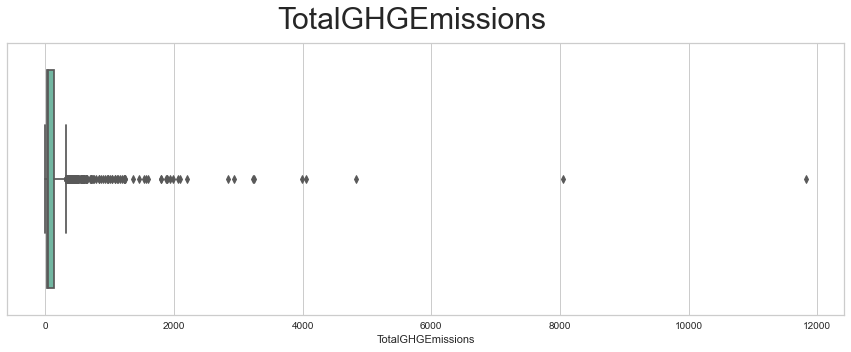

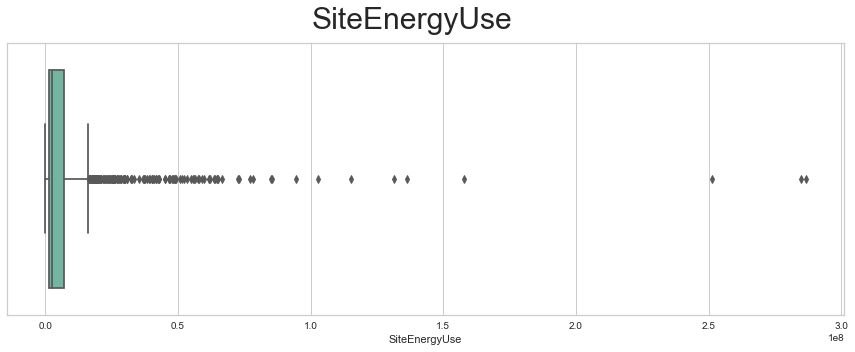

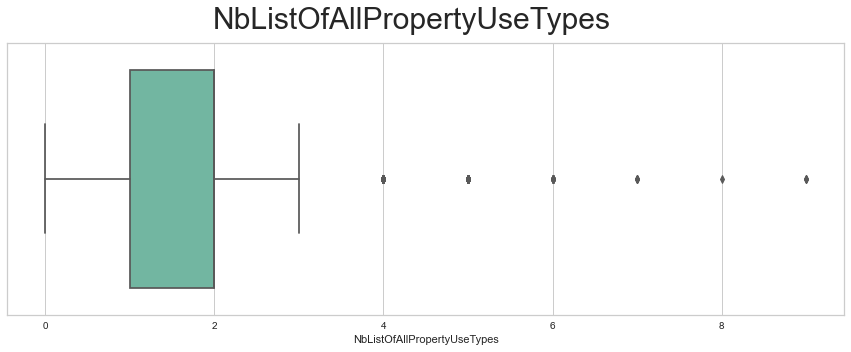

In [103]:
colToAnalyse = Ordre_Distance
for col in colToAnalyse:
    fig = plt.figure(figsize=(15,5))
    fig.suptitle(col, fontsize=30)
    
    chart = sns.boxplot(
      data=df,
      x=col,
      palette='Set2',
      showfliers = True
  )

## Traitement avec la distance de Cook

La **distance de Cook** est une mesure de l’influence d’un point de données.<br />
C’est un moyen de trouver des **valeurs aberrantes influentes** dans un ensemble <br />
de variables prédictives lors de l’exécution d’une analyse des moindres carrés.

Concrètement, nous calculons une **Régression Linéaire** sur notre modèle,<br />
puis nous supprimons 1 à 1 les points de notre modèle en recalculant <br />
à chaque fois une Régression Linéaire.<br />
Si le score de la Régression Linéaire <u>change drastiquement</u>, <br />
alors ce point est considéré comme **très influent**.

Ces points **influents** sont des valeurs extrêmes **qui peuvent être des valeurs aberrantes**.<br />
Dans ce projet, <u>je décide de filtrer toutes valeurs extrêmes identifiées par la **Distance de Cook**.</u>.


J'applique la méthode sur mes variables continues.<br />
J'utilise comme **Target**, pour la Regression Linéaire, la variable '**TotalGHGEmissions**'

Le graphique ci-dessous affiche l'influence des points <br />
en fonction des index des points de notre jeu de données.

On observe 1 point qui a particulièrement d'influence vers l'index 500,<br />
ainsi que quelques autres qui se démarquent également mais dans une moindre mesure.

Le graphique nous informe que 4.68 % des points sont au dessus <br />
de la limite qui définit les valeurs extrêmes qui seront supprimées.

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\base.py:209: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  warnings.warn('From version 0.24, get_params will raise an '


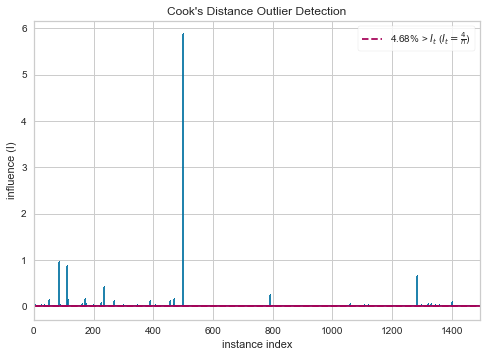

<AxesSubplot:title={'center':"Cook's Distance Outlier Detection"}, xlabel='instance index', ylabel='influence (I)'>

In [104]:
X = df[[ele for ele in Ordre_Distance if ele not in ['TotalGHGEmissions','SiteEnergyUse','ENERGYSTARScore']]]
y = df.TotalGHGEmissions
visualizer = CooksDistance()
visualizer.fit(X,y)
visualizer.show()

<u>Valeur du seuil</u> :<br />
*Le seuil est calculé selon la formule 4/n où n représente le nombre d'échantillon*

In [105]:
visualizer.influence_threshold_

0.0026755852842809363

<u>J'indique pour chaque index de mon jeu de données, <br />
    ceux qui sont définis avec une faible influence</u> :

In [106]:
idxLowInfluence = (visualizer.distance_ <= visualizer.influence_threshold_)

In [107]:
df = df[df.index.isin(X[idxLowInfluence].index)]
print('Nombre d\'enregistrements restants dans \'df\' :',df.shape[0])

Nombre d'enregistrements restants dans 'df' : 1425


Observons de nouveau la distribution des données de nos **variables continues**.<br />
Les **Outliers** identifiés par *Seaborn* sont toujours présents.<br />
Cependant <u>les points les plus extrêmes ont été retirés</u>,<br />
précisément ceux qui étaient <u>les plus influents</u> et potentiellement nuisibles <br />
à la qualité de prédiction des modèles de **Machine Learning**.

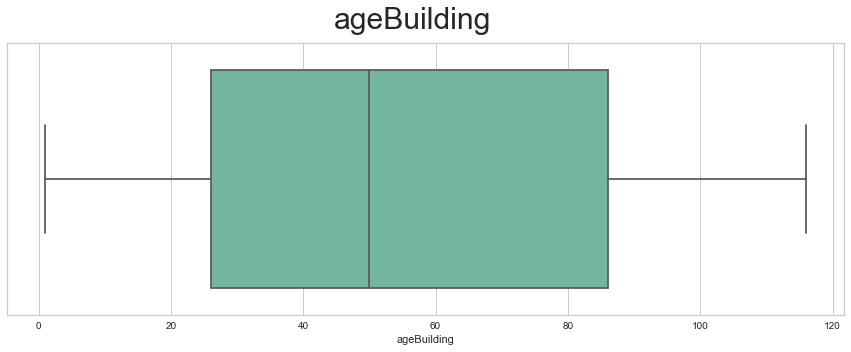

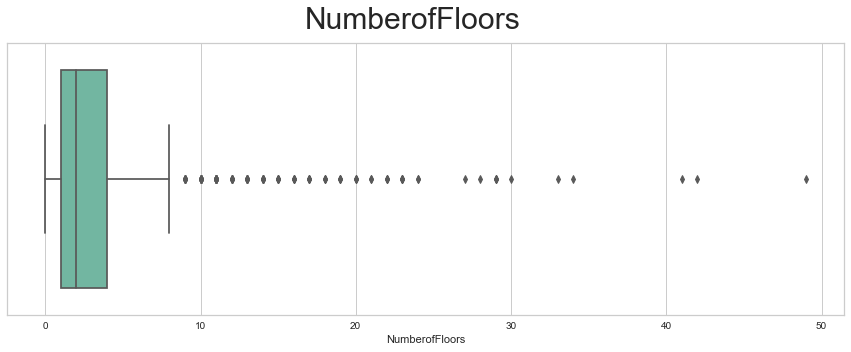

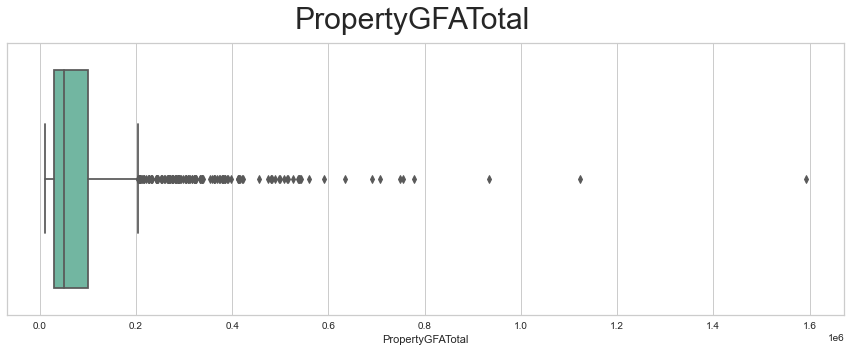

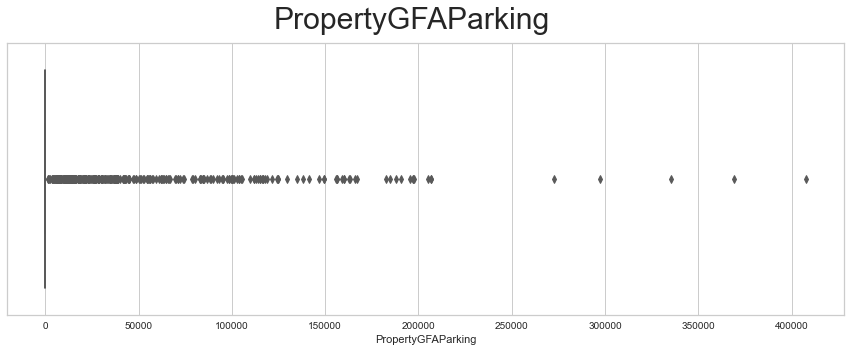

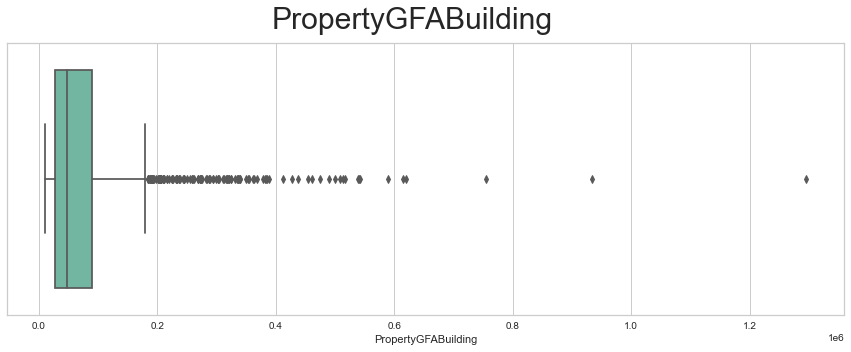

...

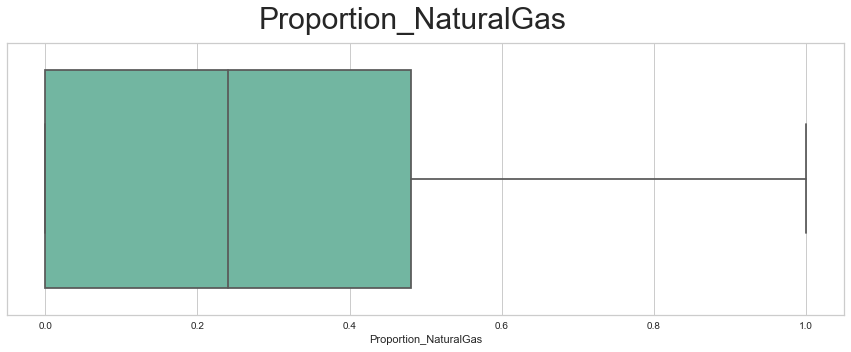

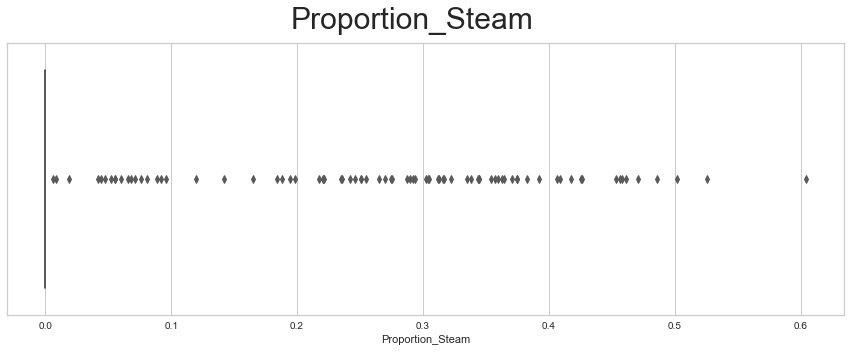

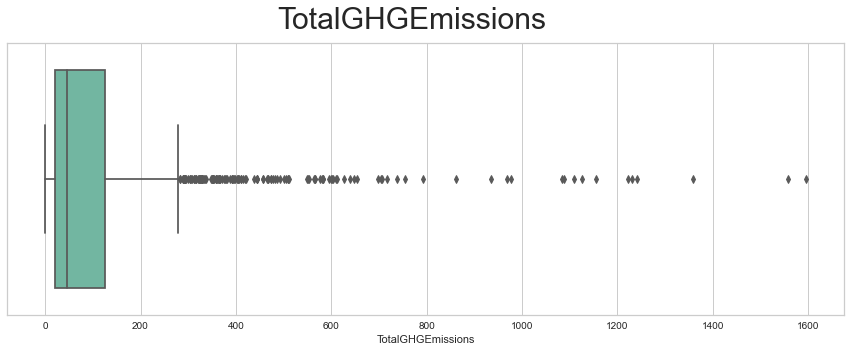

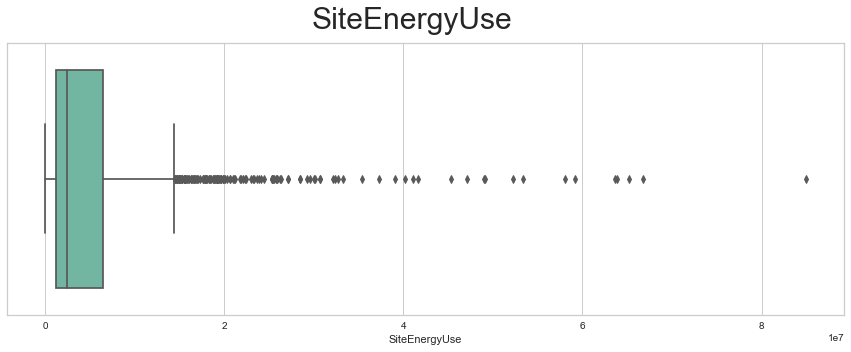

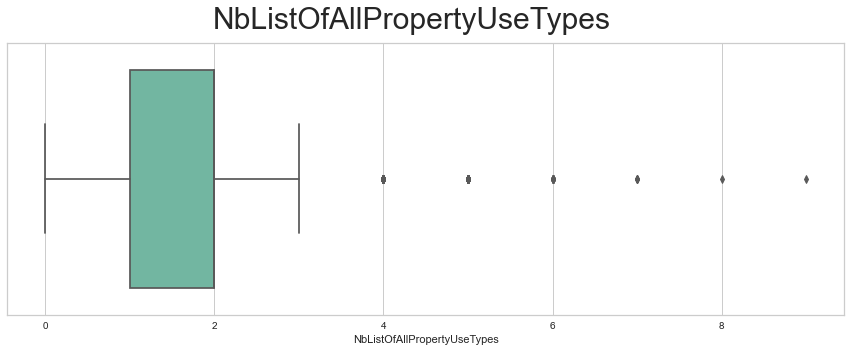

In [108]:
for col in colToAnalyse:
    fig = plt.figure(figsize=(15,5))
    fig.suptitle(col, fontsize=30)
    
    chart = sns.boxplot(
      data=df,
      x=col,
      palette='Set2',
      showfliers = True
  )

# Encodage et Standardisation des données

<u>**Les données catégorielles**</u> :

Afin que nos données puissent être comprises par les algorithmes de Machines Learning, <br />
les données catégorielles doivent être converties en données numériques.

Mes données qui *n’ont pas de notion de distance* mais ont cependant <br />
*une notion d’ordre* seront encodés avec l’encodeur '**Label Encoder**' ou '**Ordinal Encoder**'.<br />
'**Ordinal Encoder**' nous permet de gérer des données en plusieurs dimensions, <br />
et nous permet surtout <u>de définir l’ordre d’encodage de nos catégories</u>.<br />
'**Label Encoder**' est normalement prévu pour encoder les Labels, soit des données en 1 seule dimension.

J’utiliserai les deux méthodes dans le cadre de ce projet.

Mes données qui *n’ont ni de notion d’ordre ni de notion de distance* seront encodés avec un '**One-Hot-Encoder**'.<br />
A chaque catégorie sera associée une colonne qui lui sera propre, <u>remplie uniquement de 0 ou de 1</u>.

De plus, dans le cas où une variable aurait beaucoup de modalités <br />
et où seulement certaines modalités regrouperaient à elles seules une part <br />
importante des échantillons, alors je filtrerai le résultat de la transformation '**One-Hot-Encoder**' <br />
pour ne garder que ces modalités majoritaires.<br />
Dans ce projet, et dans certains cas <u>en fonction de la cardinalité des variables</u>, <br />
je choisirai de ne conserver que les modalités qui représentent au moins **80% des échantillons**.

Par exemple, si une variable contient une liste de 100 fruits et légumes et que les fruits ‘pommes’ <br />
et ‘orange’ représentent à eux seul 80% des échantillons, alors je ne conserverai que ces deux modalités.

Pour mes variables contenant des List de valeurs, j’utiliserai l’encodeur '**MultiLabelEncodeur**'.<br />
Il reprend le principe du '**One-Hot-Encoder**' mais ici plusieurs colonnes <br />
peuvent-être à **1** là où une seule colonne peut-être à **1** avec l'encodeur '**One-Hot-Encoder**'.


<u>Les données continues</u> :

Les données continues (avec une notion d’ordre et de distance), <br />
doivent, dans la plus part des cas, être **transformées** <br />
si nous voulons les **optimiser** avant de les donner à nos algorithmes de **Machine Learning**.<br />
En effet, pour que des variables mesurées à différentes échelles, <br />
aient des valeurs comparables, elles doivent préalablement être **standardisées**.

La **standardisation** consiste à transformer nos données de tel sorte <br />
à ce que chaque variable ait une <u>moyenne égale à 0</u> et un <u>écart-type égale à 1</u>.<br />
Il faut pour cela soustraire chaque valeur à la moyenne initiale de notre variable <br />
et diviser le total par l’écart type initial de notre variable.<br />
**Les données ainsi obtenues sont beaucoup plus simples à utiliser pour <br />
la plupart des modèles statistiques**.

Je procèderai à différents types de transformation sur mes variables,<br />
comme la *Standardisation* avec le transformeur '**StandardScaler**'<br />
ou le *passage au Log* avec le transformeur '**BoxCox**'.

## MAJ de ma liste de classification des variables catégorielles et continues

In [109]:
listVarCatCont = [Ordre_Distance,NoDistance_Ordre,NoDistance_NoOrdre]
listVarCatCont

[['ageBuilding',
  'NumberofFloors',
  'PropertyGFATotal',
  'PropertyGFAParking',
  'PropertyGFABuilding',
  'LargestPropertyUseTypeGFA',
  'SecondLargestPropertyUseTypeGFA',
  'ThirdLargestPropertyUseTypeGFA',
  'ENERGYSTARScore',
  'Latitude',
  'Longitude',
  'Proportion_Electricity',
  'Proportion_NaturalGas',
  'Proportion_Steam',
  'TotalGHGEmissions',
  'SiteEnergyUse',
  'NbListOfAllPropertyUseTypes'],
 ['Outlier', 'DefaultData'],
 ['BuildingType',
  'PrimaryPropertyType',
  'CouncilDistrictCode',
  'Neighborhood',
  'ComplianceStatus',
  'City Council Districts',
  'Address',
  'ZipCode',
  'YearsENERGYSTARCertified',
  'ListOfAllPropertyUseTypes',
  'LargestPropertyUseType',
  'SecondLargestPropertyUseType',
  'ThirdLargestPropertyUseType']]

Certaines de ces features ont été supprimées lors de mon analyse.<br />
Je mets à jour cette liste en ne conservant que les features encore existantes :

In [110]:
listVarCatCont = [[j for j in i if j in df.columns] for i in listVarCatCont]
listVarCatCont

[['ageBuilding',
  'NumberofFloors',
  'PropertyGFATotal',
  'PropertyGFAParking',
  'PropertyGFABuilding',
  'LargestPropertyUseTypeGFA',
  'SecondLargestPropertyUseTypeGFA',
  'ThirdLargestPropertyUseTypeGFA',
  'ENERGYSTARScore',
  'Latitude',
  'Longitude',
  'Proportion_Electricity',
  'Proportion_NaturalGas',
  'Proportion_Steam',
  'TotalGHGEmissions',
  'SiteEnergyUse',
  'NbListOfAllPropertyUseTypes'],
 ['Outlier', 'DefaultData'],
 ['BuildingType',
  'PrimaryPropertyType',
  'CouncilDistrictCode',
  'Neighborhood',
  'ComplianceStatus',
  'Address',
  'ZipCode',
  'YearsENERGYSTARCertified',
  'ListOfAllPropertyUseTypes',
  'LargestPropertyUseType',
  'SecondLargestPropertyUseType',
  'ThirdLargestPropertyUseType']]

In [111]:
[[j for j in i if j in df.columns] for i in [Ordre_Distance,NoDistance_Ordre,NoDistance_NoOrdre]]

[['ageBuilding',
  'NumberofFloors',
  'PropertyGFATotal',
  'PropertyGFAParking',
  'PropertyGFABuilding',
  'LargestPropertyUseTypeGFA',
  'SecondLargestPropertyUseTypeGFA',
  'ThirdLargestPropertyUseTypeGFA',
  'ENERGYSTARScore',
  'Latitude',
  'Longitude',
  'Proportion_Electricity',
  'Proportion_NaturalGas',
  'Proportion_Steam',
  'TotalGHGEmissions',
  'SiteEnergyUse',
  'NbListOfAllPropertyUseTypes'],
 ['Outlier', 'DefaultData'],
 ['BuildingType',
  'PrimaryPropertyType',
  'CouncilDistrictCode',
  'Neighborhood',
  'ComplianceStatus',
  'Address',
  'ZipCode',
  'YearsENERGYSTARCertified',
  'ListOfAllPropertyUseTypes',
  'LargestPropertyUseType',
  'SecondLargestPropertyUseType',
  'ThirdLargestPropertyUseType']]

J'utilise un dictionnaire, pour plus de lisibilité à l'utilisation

In [112]:
dictVarCatCont = {'Ordre_Distance': listVarCatCont[0],
                  'NoDistance_Ordre':listVarCatCont[1],
                  'NoDistance_NoOrdre':listVarCatCont[2]}

## Encodage des données catégorielles qui ont une notion d'ordre mais pas de distance

<u>Affichage des variables à encoder avec la répartition de leurs modalités</u> :

In [113]:
dictVarCatCont['NoDistance_Ordre']

['Outlier', 'DefaultData']

In [114]:
df[dictVarCatCont['NoDistance_Ordre'][0]].value_counts()

No Outlier      1402
High Outlier      12
Low Outlier       11
Name: Outlier, dtype: int64

In [115]:
df[dictVarCatCont['NoDistance_Ordre'][1]].value_counts()

False    1353
True       72
Name: DefaultData, dtype: int64

J'utilise l'encodeur **OrdinalEncoder** pour tranformer la feature '**Outlier**' <br />
car je souhaite classer manuellement l'ordre des catégories.

J'utiliserai l'encodeur **LabelEncoder** pour transformer la feature '**DefaultData**'.

### <u>Encodage de 'Outlier'</u> :

In [116]:
X = df['Outlier']
X = X.values.reshape(-1,1)
oe = OrdinalEncoder(categories=[['No Outlier','Low Outlier','High Outlier']], # Je définis l'ordre de mes catégories
                   dtype=int) # Les données transformées seront au format Integer
df['Outlier'] = oe.fit_transform(X)

<u>Je vérifie l'ordre de mes catégories</u> :

In [117]:
oe.categories_

[array(['No Outlier', 'Low Outlier', 'High Outlier'], dtype=object)]

### <u>Encodage de 'DefaultData'</u> :

In [118]:
X = df['DefaultData']
le = LabelEncoder()
df['DefaultData'] = le.fit_transform(X)

### <u>Visualisation des données encodées</u> :

In [119]:
df[dictVarCatCont['NoDistance_Ordre']]

,Outlier,DefaultData
0,0,0
1,0,0
5,0,0
6,0,0
7,0,0
...,...,...
6711,0,1
6712,0,0
6713,0,0
6714,0,0


## Encodage des données catégorielles <br />sans notion d'ordre ni distance

<u>Liste des variables concernées</u> :

In [120]:
dictVarCatCont['NoDistance_NoOrdre']

['BuildingType',
 'PrimaryPropertyType',
 'CouncilDistrictCode',
 'Neighborhood',
 'ComplianceStatus',
 'Address',
 'ZipCode',
 'YearsENERGYSTARCertified',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'SecondLargestPropertyUseType',
 'ThirdLargestPropertyUseType']

<u>Aperçu des variables concernées</u> :

In [121]:
df[dictVarCatCont['NoDistance_NoOrdre']].head().T

,0,1,5,6,7
BuildingType,NonResidential,NonResidential,Nonresidential COS,NonResidential,NonResidential
PrimaryPropertyType,Hotel,Hotel,Other,Hotel,Other
CouncilDistrictCode,7,7,7,7,7
Neighborhood,DOWNTOWN,DOWNTOWN,DOWNTOWN,DOWNTOWN,DOWNTOWN
ComplianceStatus,Compliant,Compliant,Compliant,Compliant,Compliant
Address,405 OLIVE WAY,724 PINE ST,810 VIRGINIA ST,1619 9TH AVE,901 PINE ST
ZipCode,98101,98101,98101,98101,98101
YearsENERGYSTARCertified,[],[],[],[],[]
ListOfAllPropertyUseTypes,[Hotel],"[Hotel, Parking, Restaurant]",[Police Station],[Hotel],[Other - Entertainment/Public Assembly]
LargestPropertyUseType,Hotel,Hotel,Police Station,Hotel,Other - Entertainment/Public Assembly


### Encodage des features contenant des [listes] : '**YearsENERGYSTARCertified**' <br />et '**ListOfAllPropertyUseTypes**' avec MultiLabelBinarizer

Cet encodeur sert normalement à encoder un Label, soit une seule colonne. <br />
J'opère donc séparément pour chaque colonne.

#### Analyse de la cardinalité de '**YearsENERGYSTARCertified**'

<u>J'affiche la liste des différentes valeurs présentes dans les listes <br />
contenues dans la colonne '**YearsENERGYSTARCertified**'</u> :

In [122]:
print('Liste des {} élements présents dans la colonne \'YearsENERGYSTARCertified\': \n{}'\
      .format(len({j for i in df.YearsENERGYSTARCertified for j in i}),
              {j for i in df.YearsENERGYSTARCertified for j in i}))

Liste des 13 élements présents dans la colonne 'YearsENERGYSTARCertified': 
{2016, 2017, 2000, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015}


<u>Aperçu de la colonne '**YearsENERGYSTARCertified**' filtrée sans valeur Null</u> :

In [123]:
df[df['YearsENERGYSTARCertified'].str.len() != 0]['YearsENERGYSTARCertified'].head(10)

36                                                [2016]
43                                                [2016]
53                                                [2014]
136                                               [2016]
208    [2016, 2015, 2014, 2013, 2012, 2011, 2010, 200...
210                                   [2010, 2009, 2007]
212                                         [2010, 2007]
220                       [2015, 2014, 2012, 2011, 2009]
221                                   [2012, 2009, 2008]
224                                         [2016, 2015]
Name: YearsENERGYSTARCertified, dtype: object

#### Encodage de '**YearsENERGYSTARCertified**'

<u>Encodage et conservation des seules modalités qui représentent 80% des échantillons</u> :

In [124]:
mlb = MultiLabelBinarizer()
df[['YearsENERGYSTARCertified_{}'.format(i) for i in mlb.classes_]] = \
pd.DataFrame(mlb.fit_transform(df.YearsENERGYSTARCertified),
             columns=mlb.classes_, # Les classes sont utilisées pour créer les nouvelles colonnes
             index=df.index) # On reprend les index du DataFrame 'df' pour l'alignement des valeurs

# Suppression de la colonne d'origine devenue inutile
# Suppression des colonnes les moins renseignées (qui regroupent moins de 20% des valeurs encodées)
df.drop(['YearsENERGYSTARCertified']+\
        ['YearsENERGYSTARCertified_{}'.format(i) for \
         i in list((pd.DataFrame(mlb.fit_transform(df.YearsENERGYSTARCertified),
                                 columns=mlb.classes_, 
                                 index=df.index).sum().sort_values(ascending=False)/\
                    pd.DataFrame(mlb.fit_transform(df.YearsENERGYSTARCertified), 
                                 columns=mlb.classes_, 
                                 index=df.index).sum().sort_values(ascending=False).sum()).cumsum()\
                   [(pd.DataFrame(mlb.fit_transform(df.YearsENERGYSTARCertified), 
                                  columns=mlb.classes_, 
                                  index=df.index).sum().sort_values(ascending=False)/\
                     pd.DataFrame(mlb.fit_transform(df.YearsENERGYSTARCertified), 
                                  columns=mlb.classes_, 
                                  index=df.index).sum().sort_values(ascending=False).sum()).cumsum() > 0.80].index)],
        axis=1,
        inplace=True)

<u>Aperçu du DataFrame '**df**' sans valeur null dans l'ensemble des colonnes transformées</u> :

In [125]:
df[df[df.columns[df.columns.str.contains('YearsENERGYSTARCertified')]].any(axis='columns')].head(10)

,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding,ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,DefaultData,ComplianceStatus,Outlier,Address,ZipCode,Latitude,Longitude,ageBuilding,Proportion_Electricity,Proportion_NaturalGas,Proportion_Steam,TotalGHGEmissions,SiteEnergyUse,NbListOfAllPropertyUseTypes,YearsENERGYSTARCertified_2008,YearsENERGYSTARCertified_2009,YearsENERGYSTARCertified_2012,YearsENERGYSTARCertified_2013,YearsENERGYSTARCertified_2014,YearsENERGYSTARCertified_2015,YearsENERGYSTARCertified_2016
36,SPS-District K-12,K-12 School,7,MAGNOLIA / QUEEN ANNE,2.00000,54986,0,54986,[K-12 School],K-12 School,54986.00000,Aucun ou Non Renseigné,0.00000,Aucun ou Non Renseigné,0.00000,91.00000,0,Compliant,0,4017 26TH AVE W,98199,47.65726,-122.39065,25,0.77429,0.22571,0.00000,28.78000,1655612.00000,1,0,0,0,0,0,0,1
43,NonResidential,Large Office,7,DOWNTOWN,5.00000,168115,0,168115,"[Data Center, Office, Retail Store]",Office,103501.00000,Retail Store,65676.00000,Data Center,354.00000,79.00000,0,Compliant,0,1513 5TH AVE,98101,47.61104,-122.33635,42,1.00000,0.00000,0.00000,64.23000,9213841.00000,3,0,0,0,0,0,0,1
53,NonResidential,Hotel,7,LAKE UNION,7.00000,150453,34735,115718,"[Hotel, Restaurant]",Hotel,107547.00000,Restaurant,3000.00000,Aucun ou Non Renseigné,0.00000,83.00000,0,Compliant,0,211 DEXTER AVE N,98109,47.62031,-122.34280,15,0.53347,0.46653,0.00000,191.58000,6722886.00000,2,0,0,0,0,1,0,0
136,SPS-District K-12,K-12 School,1,DELRIDGE,2.00000,367884,0,367884,[K-12 School],K-12 School,367884.00000,Aucun ou Non Renseigné,0.00000,Aucun ou Non Renseigné,0.00000,93.00000,0,Compliant,0,2500 SW THISTLE ST,98106,47.52967,-122.36666,5,0.67159,0.32841,0.00000,271.32000,12263687.00000,1,0,0,0,0,0,0,1
208,NonResidential,Large Office,7,DOWNTOWN,23.00000,747747,205076,542671,"[Office, Parking, Restaurant]",Office,542461.00000,Parking,219045.00000,Restaurant,9337.00000,88.00000,0,Compliant,0,1700 7TH AVE,98101,47.61375,-122.33508,15,0.89835,0.10165,0.00000,374.82000,32141070.00000,3,1,1,1,1,1,1,1
210,NonResidential,Large Office,7,DOWNTOWN,17.00000,204790,30000,174790,"[Office, Other - Recreation, Parking, Retail S...",Office,142034.00000,Other - Recreation,17070.00000,Retail Store,14666.00000,92.00000,0,Compliant,0,1809 7TH AVE,98101,47.61391,-122.33581,85,0.87857,0.12143,0.00000,94.89000,7546235.00000,4,0,1,0,0,0,0,0
220,NonResidential,Large Office,7,DOWNTOWN,15.00000,388934,0,388934,[Office],Office,388934.00000,Aucun ou Non Renseigné,0.00000,Aucun ou Non Renseigné,0.00000,84.00000,0,Compliant,0,710 2ND AVE,98104,47.60350,-122.33227,93,0.95287,0.00000,0.04713,208.81000,20309614.00000,1,0,1,1,0,1,1,0
221,NonResidential,Large Office,7,DOWNTOWN,22.00000,384302,0,384302,"[Convenience Store without Gas Station, Food S...",Office,348969.00000,Convenience Store without Gas Station,4181.00000,Food Service,1437.00000,98.00000,0,Compliant,0,821 2ND AVE,98104,47.60403,-122.33431,86,1.00000,0.00000,0.00000,68.75000,9861998.00000,3,1,1,1,0,0,0,0
224,NonResidential,Large Office,7,DOWNTOWN,41.00000,589921,129432,460489,"[Office, Parking, Pre-school/Daycare]",Office,485296.00000,Parking,92787.00000,Pre-school/Daycare,10290.00000,82.00000,0,Compliant,0,1000 2ND AVE,98104,47.60533,-122.33504,29,1.00000,0.00000,0.00000,182.71000,26208138.00000,3,0,0,0,0,0,1,1
226,NonResidential,Large Office,7,DOWNTOWN,8.00000,157941,62993,94948,"[Office, Parking]",Office,84838.00000,Parking,15401.00000,Aucun ou Non Renseigné,0.00000,89.00000,0,Compliant,0,1101 2ND AVE,98101,47.60571,-122.33639,47,1.00000,0.00000,0.00000,22.01000,3157579.00000,2,0,0,0,0,0,0,1


#### Analyse de la cardinalité de '**ListOfAllPropertyUseTypes**'

<u>J'affiche la liste des différentes valeurs présentes dans les listes <br />
contenues dans la colonne '**ListOfAllPropertyUseTypes**'</u> :

In [126]:
print('Liste des {} élements présents dans la colonne \'ListOfAllPropertyUseTypes\':'\
      .format(len({j for i in df.ListOfAllPropertyUseTypes for j in i})))

Liste des 62 élements présents dans la colonne 'ListOfAllPropertyUseTypes':


In [127]:
{j for i in df.ListOfAllPropertyUseTypes for j in i}

{'Adult Education',
 'Automobile Dealership',
 'Bank Branch',
 'Bar/Nightclub',
 'College/University',
 'Convenience Store without Gas Station',
 'Courthouse',
 'Data Center',
 'Distribution Center',
 'Enclosed Mall',
 'Fast Food Restaurant',
 'Financial Office',
 'Fitness Center/Health Club/Gym',
 'Food Sales',
 'Food Service',
 'Hotel',
 'K-12 School',
 'Laboratory',
 'Library',
 'Lifestyle Center',
 'Manufacturing/Industrial Plant',
 'Medical Office',
 'Movie Theater',
 'Multifamily Housing',
 'Museum',
 'Non-Refrigerated Warehouse',
 'Office',
 'Other',
 'Other - Education',
 'Other - Entertainment/Public Assembly',
 'Other - Lodging/Residential',
 'Other - Mall',
 'Other - Public Services',
 'Other - Recreation',
 'Other - Restaurant/Bar',
 'Other - Services',
 'Other - Technology/Science',
 'Other - Utility',
 'Other/Specialty Hospital',
 'Outpatient Rehabilitation/Physical Therapy',
 'Parking',
 'Performing Arts',
 'Personal Services (Health/Beauty, Dry Cleaning, etc)',
 'Police

#### Encodage de '**ListOfAllPropertyUseTypes**'

<u>Encodage et conservation des seules modalités qui représentent 83% des échantillons</u> :<br/>
*Je choisis volontairement 83% pour conserver la modalité '**DataCenter**' que je juge, à priori, intéressante.*

In [128]:
mlb = MultiLabelBinarizer()
df[['ListOfAllPropertyUseTypes_{}'.format(i) for i in mlb.classes_]] = \
pd.DataFrame(mlb.fit_transform(df.ListOfAllPropertyUseTypes),
             columns=mlb.classes_, 
             index=df.index)

df.drop(['ListOfAllPropertyUseTypes']+\
        ['ListOfAllPropertyUseTypes_{}'.format(i) for \
         i in list((pd.DataFrame(mlb.fit_transform(df.ListOfAllPropertyUseTypes),
                                 columns=mlb.classes_, 
                                 index=df.index).sum().sort_values(ascending=False)/\
                    pd.DataFrame(mlb.fit_transform(df.ListOfAllPropertyUseTypes), 
                                 columns=mlb.classes_, 
                                 index=df.index).sum().sort_values(ascending=False).sum()).cumsum()\
                   [(pd.DataFrame(mlb.fit_transform(df.ListOfAllPropertyUseTypes), 
                                  columns=mlb.classes_, 
                                  index=df.index).sum().sort_values(ascending=False)/\
                     pd.DataFrame(mlb.fit_transform(df.ListOfAllPropertyUseTypes), 
                                  columns=mlb.classes_, 
                                  index=df.index).sum().sort_values(ascending=False).sum()).cumsum() > 0.83].index)],
        axis=1,
        inplace=True)

<u>Aperçu des colonnes encodées, filtrées sans valeurs Null</u> :

In [129]:
df[df.filter(regex='^ListOfAll', axis=1).any(axis='columns')].filter(regex='^ListOfAll', axis=1).head().T

,0,1,6,8,12
ListOfAllPropertyUseTypes_Data Center,0,0,0,0,0
ListOfAllPropertyUseTypes_Distribution Center,0,0,0,0,0
ListOfAllPropertyUseTypes_Hotel,1,1,1,1,1
ListOfAllPropertyUseTypes_K-12 School,0,0,0,0,0
ListOfAllPropertyUseTypes_Medical Office,0,0,0,0,0
ListOfAllPropertyUseTypes_Multifamily Housing,0,0,0,0,0
ListOfAllPropertyUseTypes_Non-Refrigerated Warehouse,0,0,0,0,0
ListOfAllPropertyUseTypes_Office,0,0,0,0,0
ListOfAllPropertyUseTypes_Other,0,0,0,0,0
ListOfAllPropertyUseTypes_Parking,0,1,0,0,0


### Analyse de la cardinalité des variables restantes <br />sans notion d'ordre ni distance

Je mets à jour ma liste des variables sans notion de distance ni d'ordre <br />
en retirant les deux variables '**YearsENERGYSTARCertified**' et '**ListOfAllPropertyUseTypes**'

In [130]:
dictVarCatCont['NoDistance_NoOrdre'] = [i for i in dictVarCatCont['NoDistance_NoOrdre'] \
                                        if i not in ['YearsENERGYSTARCertified','ListOfAllPropertyUseTypes']]

In [131]:
dictVarCatCont['NoDistance_NoOrdre']

['BuildingType',
 'PrimaryPropertyType',
 'CouncilDistrictCode',
 'Neighborhood',
 'ComplianceStatus',
 'Address',
 'ZipCode',
 'LargestPropertyUseType',
 'SecondLargestPropertyUseType',
 'ThirdLargestPropertyUseType']

<u>Cardinalité des variables '**NoDistance_NoOrdre**' à traiter</u> : 

In [132]:
df[dictVarCatCont['NoDistance_NoOrdre']].nunique().sort_values()

ComplianceStatus                   3
BuildingType                       4
CouncilDistrictCode                7
Neighborhood                      13
PrimaryPropertyType               25
ZipCode                           30
ThirdLargestPropertyUseType       38
SecondLargestPropertyUseType      43
LargestPropertyUseType            54
Address                         1364
dtype: int64

Je traiterai les variables par lot suivant leur cardinalité.

<u>Je traiterai dans l'odre</u> :
  - Les variables à faible cardinalité (<20)
  - La variable à haute cardinalité (>1000)
  - Les autres variables

### Fonction d'automatisation pour OneHotEncoder

J'écris une fonction qui me permet d'automatiser la transformation <br />
en One-Hot-Encoder d'une ou plusieurs variables.

Cette fonction reçoit en entrée un DataFrame <br />
avec une List de colonne à transformer.<br />
La fonction retourne le DataFrame avec les colonnes transmises transformées <br />
et avec les colonnes d'origine retirées.

<u>Cette fonction permet également</u> :
  - de ne conserver que les modalités représentant un certain pourcentage des échantillons.
  - de choisir de supprimer la modalité la moins représentée dans le cas où <br />
    toutes les modalités auraient été sélectionnées sur le critère précèdent <br />
    (utile si les modalités présentes représentent l'intégralités des modalités possibles, <br />
    alors la dernière modalité peut être déduite et donc retirée).

In [133]:
def reducFeaturesAndOneHotEncode(df,col,percentFeatures=0.8,delLastModIfNoDummyValue = False):
    ''' Cette fonction travaille sur la colonne <col> du DataFrame <df>.
      L'objectif est d'appliquer un OneHotEncoder (OHE) sur la colonne <col> 
      en conservant uniquement les features qui représente jusqu'à 
      <percentFeatures>% (par défaut 80% ) des modalités de la colonnes <col> 
      Une fois la transformation OHE appliquée, la fonction retourne le df modifié.

      Erreur connue :
        - Erreur si traitement d'une colonne avec deux modalités: [True,False] avec dtype != bool
          - Solution: Convertir la colonne en bool avant d'appeler la fonction ==> df[col] = df[col].astype(bool) 
      '''
    from sklearn.preprocessing import OneHotEncoder

    data = df.copy()

    if isinstance(col,str):
        col=[col] # Si <col> est une string, je convertis en une List d'un seul élement

    for i in col:
        if data[i].dtype == object: # Choix de la dummyValue en fonction du type de données dans la colonne traitée
            dummyValue = 'A_Supprimer'
        else:
            dummyValue = 99999
        lastIndexCumSum = data[i].value_counts(normalize=True).cumsum().index[-1]# Enregistrement de la dernière modalité du value_counts(normalize=True).cumsum() pour supprimer la dernière colonne du OHE si besoin
        if (data[i].value_counts(normalize=True).cumsum() > percentFeatures).all(): # Si toutes les modalités sont au dessus du seuil, on selectionne toutes les modalités sauf la plus représentée
            print(i,': Attention : percentFeatures =',percentFeatures,'trop bas. Aucune colonne conservée.')
            print(i,': Correction automatique : Colonne ayant la plus haute modalité conservée :',(data[i].value_counts(normalize=True).cumsum().index[0]))
            if data[i].dtype == bool: # Traitement particulier pour les pd.Series de type bool, mappage necessaire des valeurs
                data.loc[(data[i].value_counts(normalize=True).cumsum()[1:] > 
                          percentFeatures).append(pd.Series(not (data[i].value_counts(normalize=True).cumsum() > 
                                                                 percentFeatures)[0],index=[(data[i].value_counts(normalize=True).cumsum() > 
                                                                                             percentFeatures).index[0]]))[data[i].map({True:1,False:0})].values,i] = dummyValue
            else:
                data.loc[(data[i].value_counts(normalize=True).cumsum()[1:] > 
                          percentFeatures).append(pd.Series(not (data[i].value_counts(normalize=True).cumsum() > 
                                                                 percentFeatures)[0],index=[(data[i].value_counts(normalize=True).cumsum() > 
                                                                                             percentFeatures).index[0]]))[data[i]].values,i] = dummyValue
        else: # Sinon on applique la <dummyValue> aux modalités les moins représentées et sous le seuil <percentFeatures>
            if data[i].dtype == bool: # Traitement particulier pour les pd.Series de type bool, mappage necessaire des valeurs
                data.loc[(data[i].value_counts(normalize=True).cumsum() > 
                          percentFeatures)[data[i].map({True:1,False:0})].values,i] = dummyValue
            else:
                data.loc[(data[i].value_counts(normalize=True).cumsum() > 
                          percentFeatures)[data[i]].values,i] = dummyValue
    
        ohe = OneHotEncoder(dtype=int)
        data[ohe.get_feature_names([i])] = pd.DataFrame(ohe.fit_transform(data[i].values.reshape(-1, 1)).toarray(),
                                                        columns=ohe.categories_[0],
                                                        index=data.index)

        if i+'_'+str(dummyValue) in data.columns:
            data.drop([i,i+'_'+str(dummyValue)], axis=1, inplace=True) # On efface la colonne d'origine + la colonne qui regroupe les valeurs peu représentées
            print(i,': Colonne effacée ayant le moins de modalités :', dummyValue)
        elif delLastModIfNoDummyValue:
            data.drop([i,i+'_'+str(lastIndexCumSum)], axis=1, inplace=True) # On efface la colonne d'origine + la colonne ayant le moins de modalités
            print(i,': Colonne effacée ayant le moins de modalités :', lastIndexCumSum)
        else:
            data.drop(i, axis=1, inplace=True) # On efface la colonne d'origine
            print(i,': Aucune colonne effacée.')

    return data

### Encodage des variables à faible cardinalité < 20

<u>Encodage en **OneHotEncoder** des variables</u> :
  - ComplianceStatus________________ 3
  - BuildingType____________________ 4
  - CouncilDistrictCode_______________ 7
  - Neighborhood____________________ 13
  
<u>Affichons également la fréquence relative <br />
    des modalités des variables à encoder</u> :

In [134]:
print('################################')
for i in ['ComplianceStatus',
          'BuildingType',
          'CouncilDistrictCode',
          'Neighborhood']:
    print('################################')
    print(i)
    print(df[i].value_counts(normalize=True))
print('################################')
print('################################')

################################
################################
ComplianceStatus
Compliant                      0.99579
Error - Correct Default Data   0.00351
Non-Compliant                  0.00070
Name: ComplianceStatus, dtype: float64
################################
BuildingType
NonResidential       0.89754
Nonresidential COS   0.04982
SPS-District K-12    0.04421
Campus               0.00842
Name: BuildingType, dtype: float64
################################
CouncilDistrictCode
7   0.32702
2   0.24421
3   0.11789
4   0.09825
5   0.07509
6   0.07439
1   0.06316
Name: CouncilDistrictCode, dtype: float64
################################
Neighborhood
DOWNTOWN                0.22175
GREATER DUWAMISH        0.20842
LAKE UNION              0.09895
MAGNOLIA / QUEEN ANNE   0.09404
EAST                    0.06877
NORTHEAST               0.06877
NORTHWEST               0.04912
BALLARD                 0.04632
NORTH                   0.03719
CENTRAL                 0.03298
SOUTHEAST          

J'applique une transformation **OneHotEncoder** pour ces 4 variables.<br />
Je conserve également l'ensemble de leurs modalités compte tenu de leur faible cardinalité.

Je conserve l'ensemble des modalités des variables suivantes car <br />
leurs modalités ne représentent pas l'ensemble des modalités existantes réellement:
  - Neighborhood
  - CouncilDistrictCode
  - BuildingType

Je supprime la modalité la moins représentée pour <br />
la variable suivante car l'ensemble des modalités possibles est représenté.<br />
La dernière modalité pourra donc être déduite :
  - ComplianceStatus

#### Encodage des colonnes 'Neighborhood',<br />'CouncilDistrictCode' et 'BuildingType'

J'utilise ma fonction sans réduire les features en renseignant <br />
l'argument *percentFeatures* à **1** <br />
et en laissant *delLastModIfNoDummyValue* à **False**.

In [135]:
df = reducFeaturesAndOneHotEncode(df, ['Neighborhood','CouncilDistrictCode','BuildingType'], percentFeatures=1)

Neighborhood : Aucune colonne effacée.
CouncilDistrictCode : Aucune colonne effacée.
BuildingType : Aucune colonne effacée.


#### Encodage de la colonne 'ComplianceStatus'

J'utilise maintenant ma fonction en renseignant <br />
l'argument *percentFeatures* à **1**<br />
mais et en paramétrant *delLastModIfNoDummyValue* à **True**.

In [136]:
df = reducFeaturesAndOneHotEncode(df, 'ComplianceStatus', percentFeatures=1, delLastModIfNoDummyValue=True)

ComplianceStatus : Colonne effacée ayant le moins de modalités : Non-Compliant


<u>Aperçu des variables encodées</u> :

In [137]:
df.filter(regex='^Nei|^Coun|^Build', axis=1).head().T

,0,1,5,6,7
Neighborhood_BALLARD,0,0,0,0,0
Neighborhood_CENTRAL,0,0,0,0,0
Neighborhood_DELRIDGE,0,0,0,0,0
Neighborhood_DOWNTOWN,1,1,1,1,1
Neighborhood_EAST,0,0,0,0,0
Neighborhood_GREATER DUWAMISH,0,0,0,0,0
Neighborhood_LAKE UNION,0,0,0,0,0
Neighborhood_MAGNOLIA / QUEEN ANNE,0,0,0,0,0
Neighborhood_NORTH,0,0,0,0,0
Neighborhood_NORTHEAST,0,0,0,0,0


Je mets à jour ma list et dictionnaire de variables catégorielles et continues

In [138]:
listVarCatCont = [[j for j in i if j in df.columns] for i in listVarCatCont]
dictVarCatCont = {'Ordre_Distance': listVarCatCont[0],
                  'NoDistance_Ordre':listVarCatCont[1],
                  'NoDistance_NoOrdre':listVarCatCont[2]}

In [139]:
dictVarCatCont

{'Ordre_Distance': ['ageBuilding',
  'NumberofFloors',
  'PropertyGFATotal',
  'PropertyGFAParking',
  'PropertyGFABuilding',
  'LargestPropertyUseTypeGFA',
  'SecondLargestPropertyUseTypeGFA',
  'ThirdLargestPropertyUseTypeGFA',
  'ENERGYSTARScore',
  'Latitude',
  'Longitude',
  'Proportion_Electricity',
  'Proportion_NaturalGas',
  'Proportion_Steam',
  'TotalGHGEmissions',
  'SiteEnergyUse',
  'NbListOfAllPropertyUseTypes'],
 'NoDistance_Ordre': ['Outlier', 'DefaultData'],
 'NoDistance_NoOrdre': ['PrimaryPropertyType',
  'Address',
  'ZipCode',
  'LargestPropertyUseType',
  'SecondLargestPropertyUseType',
  'ThirdLargestPropertyUseType']}

### Encodage des variables à haute cardinalité >1000

Ici seule la variable '**Address**' a une aussi haute cardinalité.

Les adresses étant très spécifiques, allant jusqu'au numéro de rue, <br />
celà donne à cette variable une cardinalité proche de celle qu’aurait une variable d’ID.

Il est cependant possible de diminuer sa cardinalité en tentant <br />
d'extraire les seuls noms de rue de chaque adresse.

Ensuite nous analyserons de nouveau cette variable <br />
et jugerons s'il est utile de l’encoder ou non.

<u>Rappelons la cardinalité de la variable '**Adress**'<br />
ainsi que les dimensions du DataFrame '**df**'</u> :

In [140]:
print('Cardinalité de la variable \'Address\':',df.Address.nunique())
print('Dimensions de \'df\': ',df.shape)

Cardinalité de la variable 'Address': 1364
Dimensions de 'df':  (1425, 72)


Sans traitement préalable, l'adresse la plus représentée <br />
représente moins de 0.5% des adresse existantes.

In [141]:
print('################################')
print('Address')
print(df.Address.value_counts(normalize=True).cumsum())
print('################################')

################################
Address
2623 NE UNIVERSITY VILLAGE ST   0.00491
2203 AIRPORT WAY S              0.00842
305 HARRISON ST                 0.01053
516 1ST AVE W                   0.01263
309 S CLOVERDALE ST             0.01474
                                  ...  
2815 2ND AVE                    0.99719
13000 AURORA AVE N              0.99789
13200 AURORA AVE N              0.99860
2101 NW 77TH ST                 0.99930
10113 GREENWOOD AVE N           1.00000
Name: Address, Length: 1364, dtype: float64
################################


#### Encodage de la colonne '**Address**'

La fonction que j'ai écris ci-dessous tente d'extraire <br />
les seuls noms de rue d'une adresse donnée.<br />
L'idée est de supprimer, à l'exception du nom, <br />
tous les élements de l'adresse comme :
  - le numéro de rue
  - les indications cardinales (Nord, Sud, ...)
  - plus quelques cas particuliers que j'ai pu identifier

In [142]:
def fromAddressToStreetName(addr):
    '''Cette fonction tente d'extraire et de retourner 
    l'unique nom de rue d'un champ adresse au format US'''

    if ((addr.split(' ')[0]).isdigit()):
        addr = ' '.join(addr.split(' ')[1:]) # Suppression du numéro de rue

    if not any(x in addr for x in ['1ST','21ST','31ST','41ST','51ST']):
        addr = addr.replace('ST ', '')
        addr = addr.replace(' ST', '')

    if not any(x in addr for x in ['{}3RD'.format(i).replace('0','') for i in range(10) if i not in [1]]):
        addr.replace(' RD','')

    addr = addr.replace('WAY', '')
    if not 'STONE' in addr:
        addr = addr.replace('NE', '')
    addr = addr.replace('NW', '')
    addr = addr.replace('SE', '')
    addr = addr.replace('SW', '')
    addr = addr.replace('NORTH', '')
    addr = addr.replace('SOUTH', '')
    addr = addr.replace('EAST', '')
    addr = addr.replace('WEST', '')
    addr = addr.replace('AVE', '')
    addr = addr.replace('AV', '')
    addr = addr.replace('PL', '')
    
    addr = ' '.join( [i for i in addr.split() if len(i)>1] ) # Suppression des lettres isolées
    
    return addr

La cardinalité de la colonne '**Address**' est maintenant réduite à **284**.

In [143]:
df.Address.apply(lambda row: fromAddressToStreetName(row)).nunique()

282

Après traitement, l'adresse le plus représentée représente **plus de 7%** <br />
des adresses existantes dans notre jeu de données.

In [144]:
df.Address.apply(lambda row: fromAddressToStreetName(row)).value_counts(normalize=True).cumsum().head(30)

1ST          0.07158
4TH          0.10737
LAKE         0.14105
6TH          0.17474
3RD          0.20491
2ND          0.23298
5TH          0.25684
AIRPORT      0.27439
MARGINAL     0.29053
AURORA       0.30596
PIKE         0.32000
ELLIOTT      0.33404
15TH         0.34737
34TH         0.36000
TERRY        0.37193
ERN          0.38316
MADISON      0.39368
RAINIER      0.40421
LAKE CITY    0.41404
FAIRVIEW     0.42316
ROOVELT      0.43228
8TH          0.44140
JACKSON      0.45053
CALIFORNIA   0.45895
PI           0.46737
ALASKAN      0.47579
BROAD        0.48421
9TH          0.49263
45TH         0.50105
HARRISON     0.50877
Name: Address, dtype: float64

<u>Malgré l'efficacité du traitement effectué sur cette variable, <br />
je choisis de ne pas l'encoder et de l'effacer</u>.

En effet plusieurs mêmes noms de rue coexistent au sein de la même ville, <br />
avec des CP différents, ce qui rend imprécise la solution appliquée ci-dessus.

L'ajout d'une contrainte avec la variable '**ZipCode**' sur les différentiations <br />
d'adresses réaugmenteraient davantage la cardinalité de la variable '**Addresse**'.

Même s'il est possible d'encoder ce genre de variable avec <br />
des transformeur de type **HashingEncoder** qui diminue le nombre <br />
de colonnes générées par rapport à un **One-Hot-Encoder**, <br />
**je décide simplement de retirer la variable ‘Address’ de mon DataFrame 'df'**.

In [145]:
df.drop('Address', axis=1, inplace=True)

### Encodage des variables restantes

<u>Je mets à jour ma liste des variables sans notion de distance ni d'ordre <br />
en retirant les six variables</u> :
  - '**ComplianceStatus**'
  - '**BuildingType**'
  - '**CouncilDistrictCode**'
  - '**Neighborhood**'
  - '**Address**'

In [146]:
dictVarCatCont['NoDistance_NoOrdre'] = [i for i in dictVarCatCont['NoDistance_NoOrdre'] if i not in ['ComplianceStatus',
                                                                                                     'BuildingType',
                                                                                                     'CouncilDistrictCode',
                                                                                                     'Neighborhood',
                                                                                                     'Address']]

<u>Il nous reste à encoder les variables suivantes </u> :

In [147]:
dictVarCatCont['NoDistance_NoOrdre']

['PrimaryPropertyType',
 'ZipCode',
 'LargestPropertyUseType',
 'SecondLargestPropertyUseType',
 'ThirdLargestPropertyUseType']

<u>Visualisons la fréquence relative <br />
    des modalités des variables à encoder</u> :

In [148]:
print('################################')
for i in dictVarCatCont['NoDistance_NoOrdre']:
    print('################################')
    print(i)
    print(df[i].value_counts(normalize=True).cumsum())
print('################################')
print('################################')

################################
################################
PrimaryPropertyType
Small- and Mid-Sized Office   0.19368
Other                         0.34105
Large Office                  0.45333
Non-Refrigerated Warehouse    0.56351
Mixed Use Property            0.64000
K-12 School                   0.70456
Retail Store                  0.75439
Hotel                         0.79789
Worship Facility              0.83860
Distribution Center           0.87158
Medical Office                0.89754
Supermarket/Grocery Store     0.91509
Senior Care Community         0.93193
Self-Storage Facility         0.94807
Warehouse                     0.95719
Residence Hall/Dormitory      0.96561
Restaurant                    0.97333
Refrigerated Warehouse        0.98105
College/University            0.98807
Residence Hall                0.99298
Supermarket / Grocery Store   0.99509
Office                        0.99719
Low-Rise Multifamily          0.99860
Laboratory                    0.99930
Un

<u>J'applique une transformation **OneHotEncoder** pour ces 5 variables <br />
en appliquant la stratégie suivante</u> :

  - Je conserve 100% des modalités pour la variable :
    - '**PrimaryPropertyType**'

  - Je conserve les modalités qui représentent 98% <br />
    des échantillons pour les variables :
    - '**LargestPropertyUseType**'
    - '**SecondLargestPropertyUseType**'
    - '**ThirdLargestPropertyUseType**'
    - '**ZipCode**'

In [149]:
df = reducFeaturesAndOneHotEncode(df,'PrimaryPropertyType', percentFeatures=1.0)
df = reducFeaturesAndOneHotEncode(df,['LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType','ZipCode'], percentFeatures=0.98)

PrimaryPropertyType : Colonne effacée ayant le moins de modalités : A_Supprimer
LargestPropertyUseType : Colonne effacée ayant le moins de modalités : A_Supprimer
SecondLargestPropertyUseType : Colonne effacée ayant le moins de modalités : A_Supprimer
ThirdLargestPropertyUseType : Colonne effacée ayant le moins de modalités : A_Supprimer
ZipCode : Colonne effacée ayant le moins de modalités : 99999


### Visualisation du DataFrame df avec l'ensemble des variables, <br />qui n'ont ni une notion d'Ordre, ni une notion de Distance, <br />complètement encodées

In [150]:
df.T

,0,1,5,6,7,8,10,12,15,16,17,18,19,20,23,24,25,26,28,29,32,33,36,38,39,40,41,43,46,48,51,52,53,54,55,56,57,58,60,61,63,65,67,68,70,76,78,79,80,82,83,84,87,88,89,90,91,95,96,97,100,101,102,103,106,108,109,110,111,112,113,114,115,117,118,119,121,124,125,128,129,130,131,132,133,136,137,138,139,140,141,142,143,144,145,146,147,148,150,152,...,4668,4675,4766,4776,4805,4836,4848,4898,4930,4963,4977,4983,5094,5102,5106,5158,5265,5281,5290,5306,5333,5378,5427,5510,5542,5552,5594,5719,5723,5747,5750,5787,5859,5864,5875,5907,5924,5943,5954,5994,6024,6044,6079,6084,6118,6125,6140,6285,6381,6397,6398,6435,6438,6461,6470,6471,6503,6513,6516,6532,6538,6539,6543,6556,6558,6561,6568,6575,6594,6599,6607,6616,6618,6619,6620,6652,6657,6660,6664,6669,6677,6678,6679,6680,6700,6701,6702,6703,6704,6705,6706,6707,6708,6709,6710,6711,6712,6713,6714,6715
NumberofFloors,12.00000,11.00000,2.00000,11.00000,8.00000,15.00000,11.00000,9.00000,11.00000,6.00000,28.00000,5.00000,10.00000,10.00000,6.00000,7.00000,2.00000,8.00000,1.00000,5.00000,3.00000,4.00000,2.00000,2.00000,2.00000,3.00000,3.00000,5.00000,2.00000,20.00000,7.00000,5.00000,7.00000,6.00000,6.00000,3.00000,4.00000,2.00000,2.00000,6.00000,3.00000,6.00000,5.00000,7.00000,1.00000,2.00000,4.00000,6.00000,4.00000,3.00000,6.00000,3.00000,3.00000,2.00000,4.00000,2.00000,4.00000,3.00000,5.00000,6.00000,4.00000,4.00000,4.00000,4.00000,2.00000,3.00000,3.00000,3.00000,3.00000,1.00000,5.00000,2.00000,4.00000,6.00000,3.00000,3.00000,3.00000,3.00000,2.00000,2.00000,1.00000,4.00000,2.00000,1.00000,1.00000,2.00000,1.00000,3.00000,3.00000,2.00000,2.00000,3.00000,5.00000,1.00000,2.00000,7.00000,2.00000,2.00000,4.00000,1.00000,...,4.00000,2.00000,2.00000,5.00000,1.00000,2.00000,2.00000,1.00000,4.00000,2.00000,2.00000,5.00000,0.00000,3.00000,1.00000,1.00000,2.00000,2.00000,1.00000,1.00000,0.00000,1.00000,1.00000,1.00000,6.00000,1.00000,1.00000,2.00000,3.00000,5.00000,3.00000,2.00000,2.00000,16.00000,1.00000,3.00000,1.00000,4.00000,3.00000,2.00000,1.00000,4.00000,1.00000,3.00000,3.00000,2.00000,2.00000,1.00000,6.00000,2.00000,1.00000,11.00000,5.00000,3.00000,0.00000,0.00000,6.00000,6.00000,7.00000,3.00000,1.00000,13.00000,7.00000,3.00000,3.00000,4.00000,6.00000,7.00000,1.00000,2.00000,3.00000,0.00000,0.00000,0.00000,0.00000,5.00000,10.00000,12.00000,12.00000,13.00000,4.00000,1.00000,2.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
PropertyGFATotal,88434.00000,103566.00000,97288.00000,83008.00000,102761.00000,163984.00000,153163.00000,65009.00000,412000.00000,103911.00000,416281.00000,57452.00000,104352.00000,540360.00000,88592.00000,126593.00000,67224.00000,158676.00000,126351.00000,68410.00000,87262.00000,81871.00000,54986.00000,94900.00000,52554.00000,175015.00000,70586.00000,168115.00000,52549.00000,98634.00000,122810.00000,113173.00000,150453.00000,116300.00000,155602.00000,56072.00000,122942.00000,54984.00000,93397.00000,84103.00000,179014.00000,187600.00000,316306.00000,282863.00000,91213.00000,66240.00000,76213.00000,117738.00000,50017.00000,67743.00000,194104.00000,99433.00000,59955.00000,93218.00000,56521.00000,206934.00000,51390.00000,66588.00000,190980.00000,284100.00000,61156.00000,72820.00000,162222.00000,289588.00000,96300.00000,254523.00000,78804.00000,66994.00000,98357.00000,54765.00000,89821.00000,52611.00000,139600.00000,250981.00000,62526.00000,64015.00000,54224.00000,55442.00000,242795.00000,173185.00000,145341.00000,114297.00000,184125.00000,160270.00000,234144.00000,367884.00000,46797.00000,136188.00000,56000.00000,67371.00000,52088.00000,127776.00000,123920.00000,58000.00000,50292.00000,207656.00000,67235.00000,85017.00000,64893.00000,70762.00000,...,274442.00000,85750.00000,54528.00000,43594.00000,22176.00000,26560.00000,38845.00000,40445.00000,42500.00000,57644.00000,27574.00000,43661.00000,274568.00000,33580.00000,21936.00000,41308.00000,71919.00000,21592.00000,160000.00000,20724.00000,230971.00000,39

In [151]:
print('Nouvelles dimensions de \'df\': ',df.shape)

Nouvelles dimensions de 'df':  (1425, 190)


## Standardisation et/ou passage au Log <br />des données Continues

Avant d’appliquer une transformation à nos variables continues, <br />
il est important de choisir la transformation la plus adéquate à chaque variable.<br />
Ce choix se fera en fonction de la distribution de chaque variable.

Afin de mieux comprendre nos données, nous allons visualiser leur distribution.<br />
**Nous cherchons, idéalement, à obtenir une distribution de type Normale.**

<u>Nous allons donc successivement</u> :
  1. Créer une copie de notre DataFrame '**df**' 
  2. **Standardiser** les données à partir de la copie de nos données
  3. **Visualiser** la distribution des données après transformation
  4. Créer une nouvelle copie de '**df**'
  5. Passer au **Log** les données à partir de la nouvelle copie de nos données
  6. **Visualiser** une nouvelle fois les données après transformation
  7. **Choisir**, pour chaque variable continue, la transformation retenue
  8. **Transformer** les variables continues à partir de '**df**' selon les transformations choisies

<u>Rappel des données continues à analyser et à transformer</u> :

In [152]:
dictVarCatCont['Ordre_Distance']

['ageBuilding',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseTypeGFA',
 'ENERGYSTARScore',
 'Latitude',
 'Longitude',
 'Proportion_Electricity',
 'Proportion_NaturalGas',
 'Proportion_Steam',
 'TotalGHGEmissions',
 'SiteEnergyUse',
 'NbListOfAllPropertyUseTypes']

### Visualisation de la distribution <br />des données avant Standardisation

ageBuilding
NumberofFloors
PropertyGFATotal
PropertyGFAParking
PropertyGFABuilding


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

LargestPropertyUseTypeGFA
SecondLargestPropertyUseTypeGFA
ThirdLargestPropertyUseTypeGFA
ENERGYSTARScore
Latitude


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

Longitude
Proportion_Electricity
Proportion_NaturalGas
Proportion_Steam
TotalGHGEmissions
SiteEnergyUse


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

NbListOfAllPropertyUseTypes


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


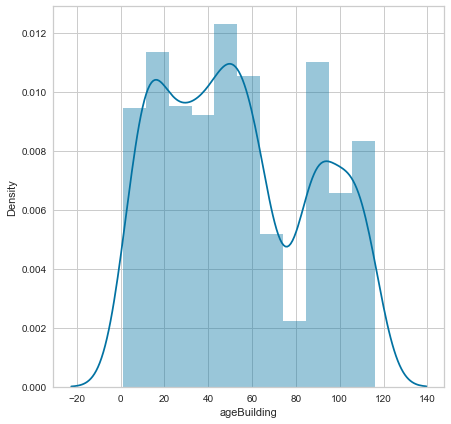

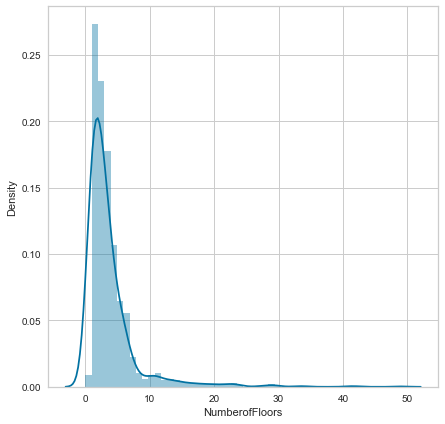

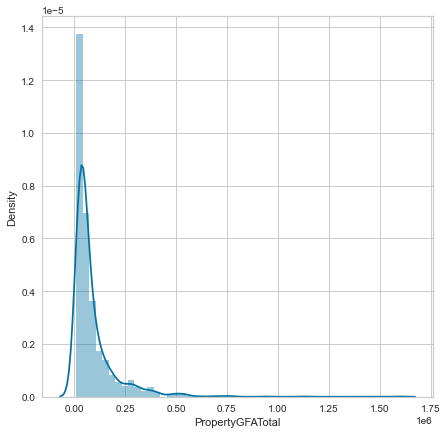

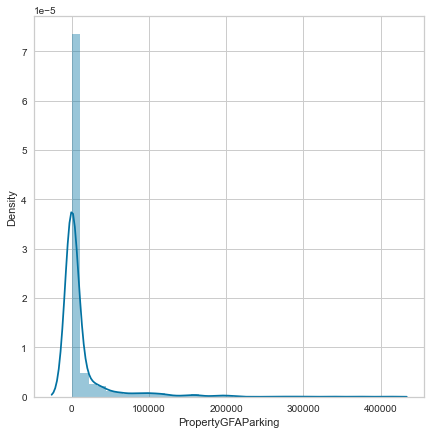

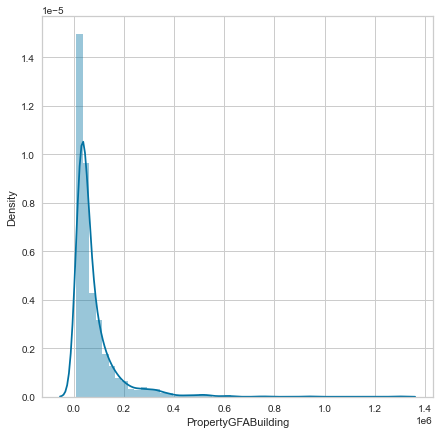

...

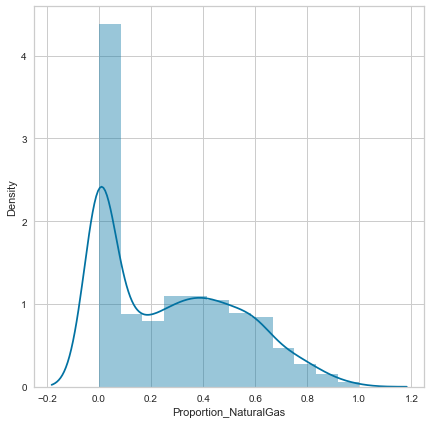

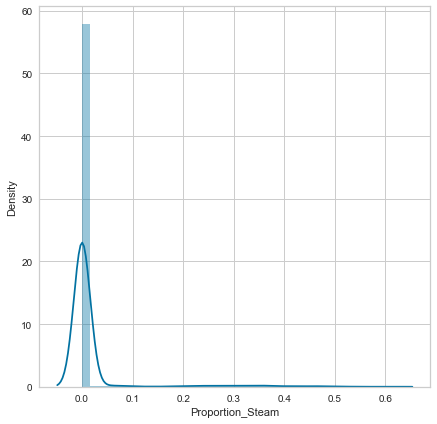

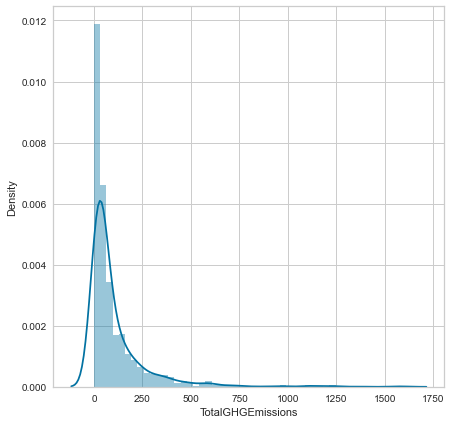

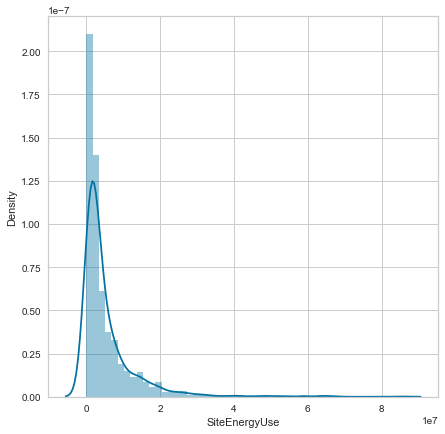

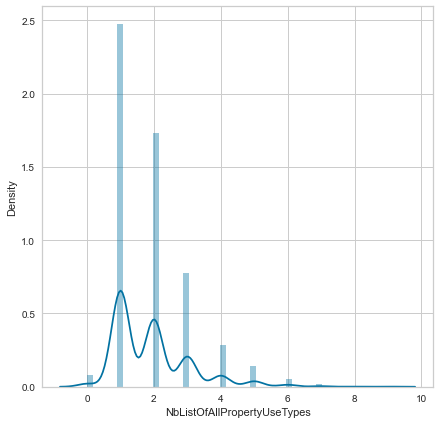

In [153]:
for i in dictVarCatCont['Ordre_Distance']:
    print(i)
    plt.figure(figsize=(7,7))
    sns.distplot(df[i])

Les échelles de données sont très disparates.<br />
Les distributions ne ressemblent pas à une distribution Normale<br />
à l'exception des colonnes '**Latitude**' et '**Longitude**'.

Les colonnes renseignant sur une superficie sont unimodales non centrées<br />
Les autres colonnes sont multimodales.

### Standardisation sur les variables continues

<u>Création d'une copie du DataFrame **df** pour tester les transformations <br />
sans conséquence sur le DataFrame principal</u> :

In [154]:
df2 = df.copy()

In [155]:
ss = StandardScaler()
df2[dictVarCatCont['Ordre_Distance']] = ss.fit_transform(df2[dictVarCatCont['Ordre_Distance']])

<u>Aperçu des variables Standardisées</u> :

In [156]:
df2[dictVarCatCont['Ordre_Distance']].head().T

,0,1,5,6,7
ageBuilding,1.02072,-1.04104,-1.13069,1.05060,1.05060
NumberofFloors,1.91057,1.68081,-0.38695,1.68081,0.99156
PropertyGFATotal,-0.01987,0.11223,0.05742,-0.06724,0.10521
PropertyGFAParking,-0.33818,0.07147,0.67339,-0.33818,-0.33818
PropertyGFABuilding,0.10961,0.11034,-0.19619,0.05107,0.26418
LargestPropertyUseTypeGFA,0.23406,0.17862,0.23888,0.14785,0.40848
SecondLargestPropertyUseTypeGFA,-0.43571,0.00682,-0.43571,-0.43571,-0.43571
ThirdLargestPropertyUseTypeGFA,-0.21892,0.21494,-0.21892,-0.21892,-0.21892
ENERGYSTARScore,0.02890,-0.46177,nan,-1.37301,nan
Latitude,-0.08685,-0.06734,0.00370,-0.04585,-0.07168


### Visualisation de la distribution <br />des données après Standardisation

ageBuilding
NumberofFloors
PropertyGFATotal
PropertyGFAParking
PropertyGFABuilding
LargestPropertyUseTypeGFA


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

SecondLargestPropertyUseTypeGFA
ThirdLargestPropertyUseTypeGFA
ENERGYSTARScore
Latitude
Longitude
Proportion_Electricity


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

Proportion_NaturalGas
Proportion_Steam
TotalGHGEmissions
SiteEnergyUse


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

NbListOfAllPropertyUseTypes


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


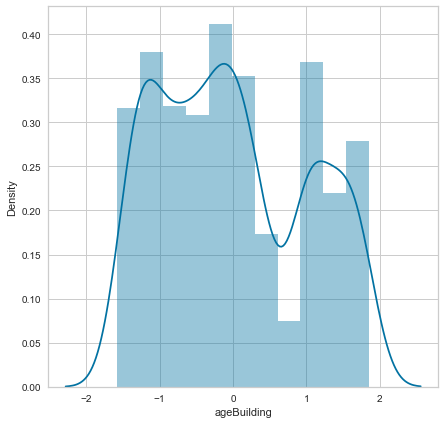

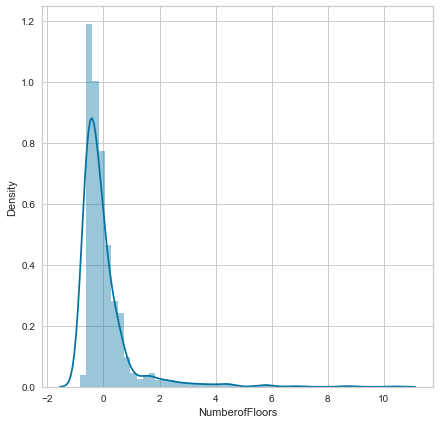

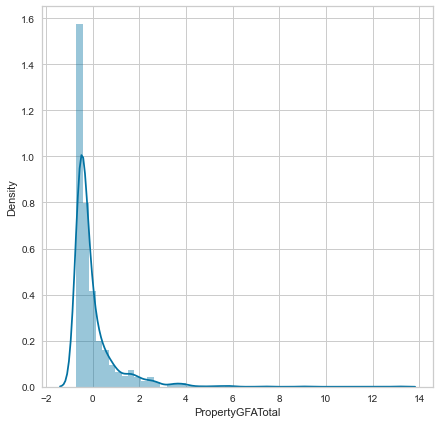

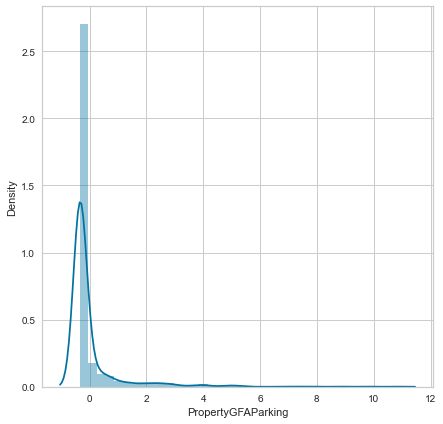

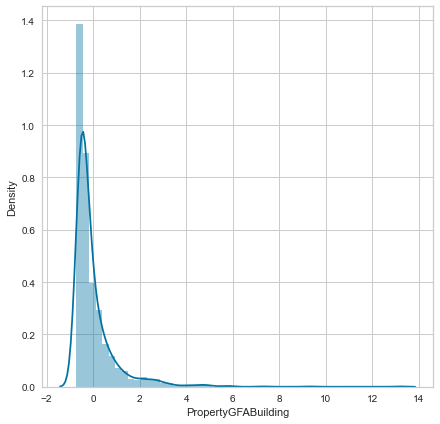

...

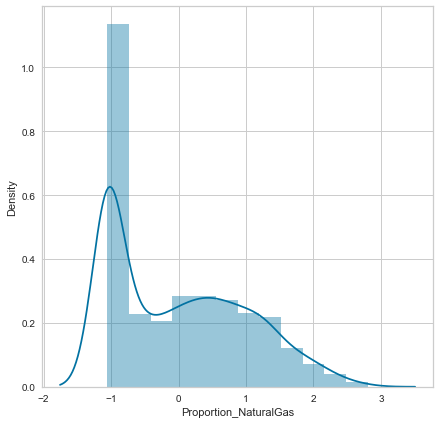

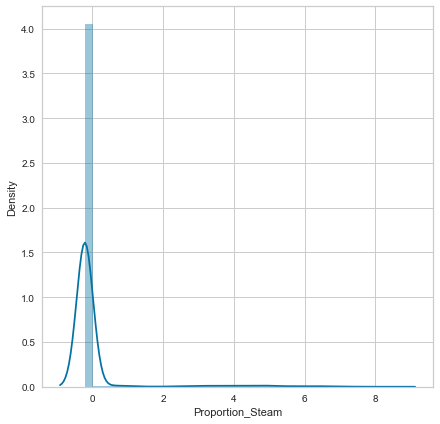

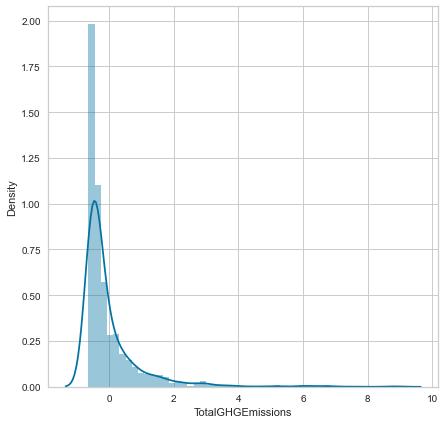

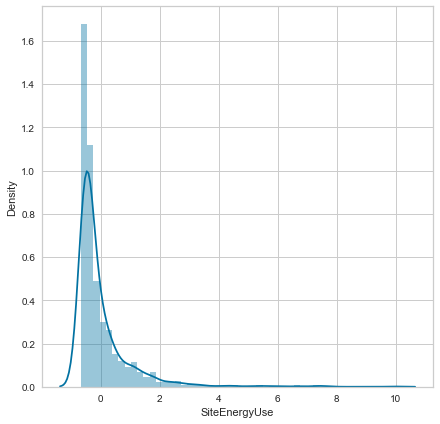

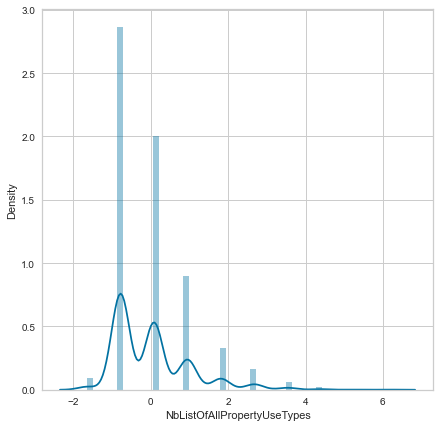

In [157]:
for i in dictVarCatCont['Ordre_Distance']:
    print(i)
    plt.figure(figsize=(7,7))
    sns.distplot(df2[i])

Seules les variables '**Latitude**' et '**Longitude**' ont une distribution qui ressemble à une distribution Normale.<br />
Je n'effectuerai pas de transformation Box-Cox sur ces deux variables.

### Transformation et Visualisation de la distribution <br />après transformation Box-Cox

La transformation **Box-Cox** ne peut s'appliquer que sur des Series contenant des valeurs <u>strictement positives</u>.

Pour chaque variable continue de mon DataFrame, je testerai préalablement à chaque application <br />
de la transformation s'il existe des valeurs égales à 0.<br />
(Seule la colonne '**Longitude**' contient des valeurs négatives)

<u>Si tel est le cas, la valeur sera remplacée par une valeur très proche de 0</u> : **0.00001**


In [158]:
for col in dictVarCatCont['Ordre_Distance']:
    if any(df[col] < 0):
        print('Warning - valeurs négatives :',col)

Warning - valeurs négatives : Longitude


C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

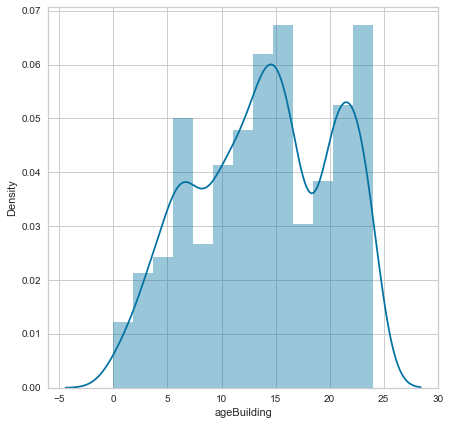

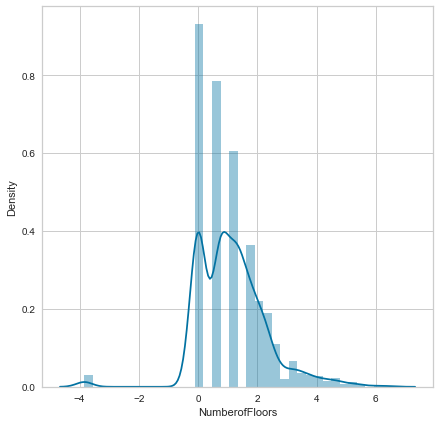

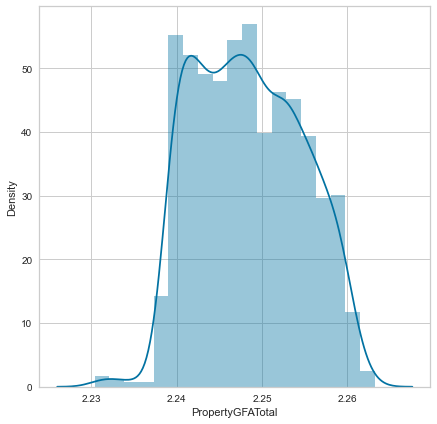

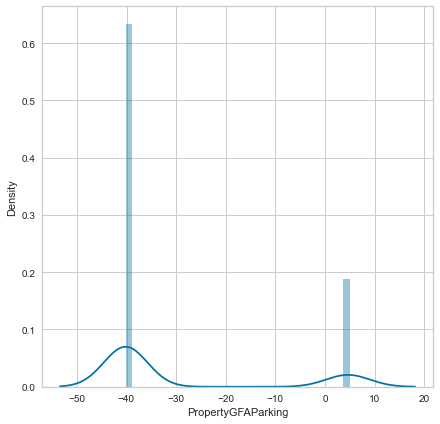

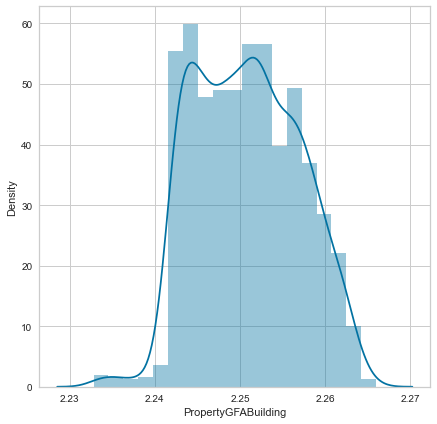

...

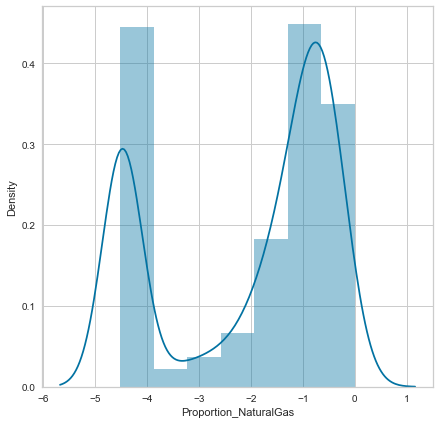

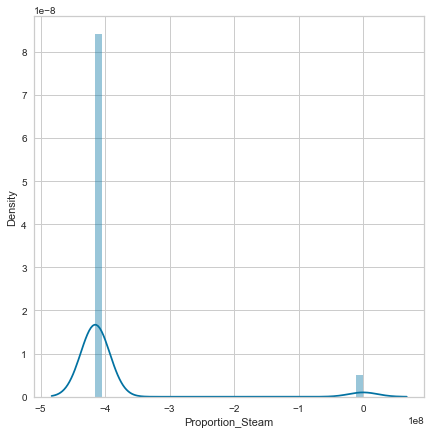

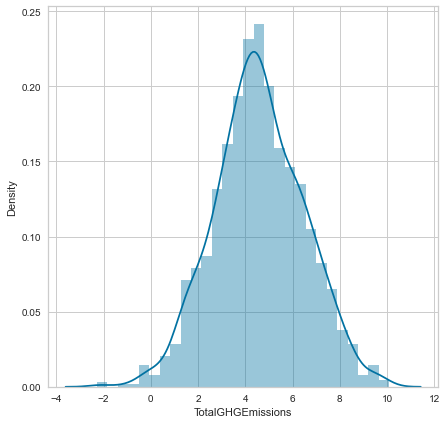

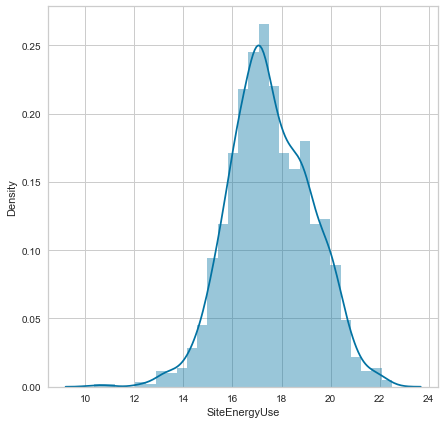

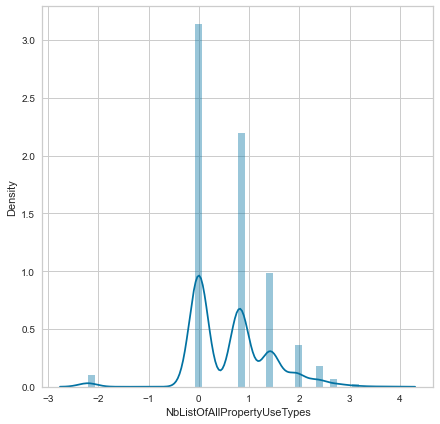

In [159]:
df2 = df.copy()
for col in [i for i in dictVarCatCont['Ordre_Distance'] if i not in ['Latitude', 'Longitude']]:
    if any(df2[col] == 0):
        df2.loc[df2[col] == 0,col] = 0.00001
    df2[col],_ = stats.boxcox(df2[col])
    plt.figure(figsize=(7,7))
    sns.distplot(df2[col])

### Choix de transformation retenue pour chaque variable <br />et application des transformations choisies

<u>Après analyse des différentes distributions après transformation via **Standard Scaler** <br />
et **Box-Cox** sur mes variables contenant des données continues, <br />
je répartis les transformations finales de cette façon</u> :
*Je supprime également les variables que je juge non pertinentes au regard de leur distribution*

1. Transformation via Standard Scaler
  - 'ageBuilding'
  - 'ENERGYSTARScore'
  - 'Latitude'
  - 'Longitude'
  - 'Proportion_Electricity'
  - 'Proportion_NaturalGas'
  - 'Proportion_Steam'
2. Transformation via Box-Cox
  - 'NumberofFloors'
  - 'PropertyGFATotal'
  - 'PropertyGFABuilding'
  - 'LargestPropertyUseTypeGFA'
  - 'TotalGHGEmissions'
  - 'SiteEnergyUse'
3. Suppression des variables
  - 'PropertyGFAParking'
  - 'SecondLargestPropertyUseTypeGFA'
  - 'ThirdLargestPropertyUseTypeGFA'
  - 'NbListOfAllPropertyUseTypes'

<u>Transformation **StandardScaler** des variables sélectionnées</u> :

In [160]:
ss = StandardScaler()
df[['ageBuilding',
    'ENERGYSTARScore',
    'Latitude',
    'Longitude',
    'Proportion_Electricity',
    'Proportion_NaturalGas',
    'Proportion_Steam']] = ss.fit_transform(df[['ageBuilding',
                                                'ENERGYSTARScore',
                                                'Latitude',
                                                'Longitude',
                                                'Proportion_Electricity',
                                                'Proportion_NaturalGas',
                                                'Proportion_Steam']])

<u>Transformation **BoxCox** des variables sélectionnées</u> :

In [161]:
for col in ['NumberofFloors',
            'PropertyGFATotal',
            'PropertyGFABuilding',
            'LargestPropertyUseTypeGFA',
            'TotalGHGEmissions',
            'SiteEnergyUse']:
    if any(df[col] == 0): # Si des valeurs null existent dans la Series, on les remplace par une valeur très proche de 0
        df.loc[df[col] == 0,col] = 0.00001
    df[col],_ = stats.boxcox(df[col])

<u>Suppression des variables sélectionnées</u> :

In [162]:
df.drop(['PropertyGFAParking',
         'SecondLargestPropertyUseTypeGFA',
         'ThirdLargestPropertyUseTypeGFA',
         'NbListOfAllPropertyUseTypes'], 
        axis=1, 
        inplace=True)

<u>Mise à jour des variables continues dans le dictionnaire **dictVarCatCont**</u> :

In [163]:
dictVarCatCont['Ordre_Distance'] = [i for i in dictVarCatCont['Ordre_Distance'] if \
                                    i not in ['PropertyGFAParking',
                                              'SecondLargestPropertyUseTypeGFA',
                                              'ThirdLargestPropertyUseTypeGFA',
                                              'NbListOfAllPropertyUseTypes']]

### Visualisation de la distribution des valeurs continues  après transformation sur le DataFrame **df**

C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\waldu\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

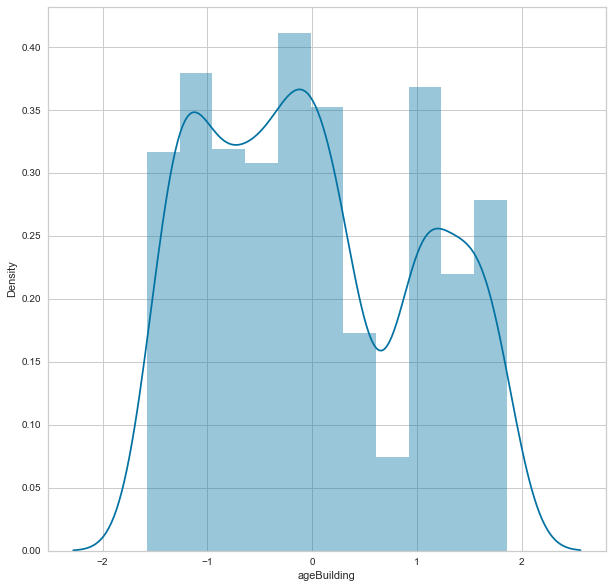

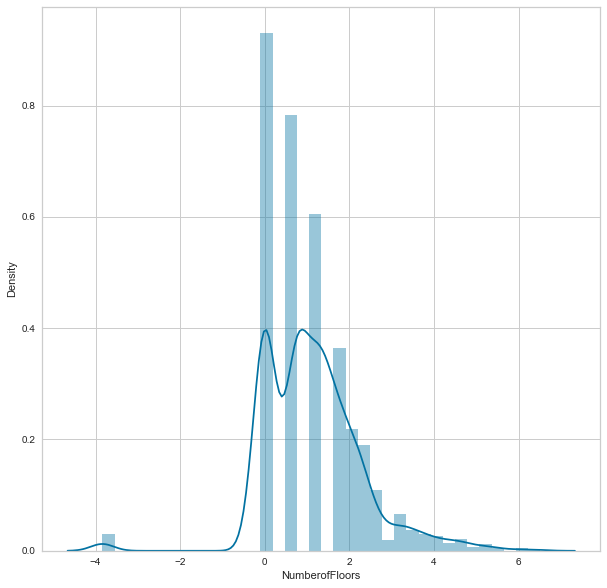

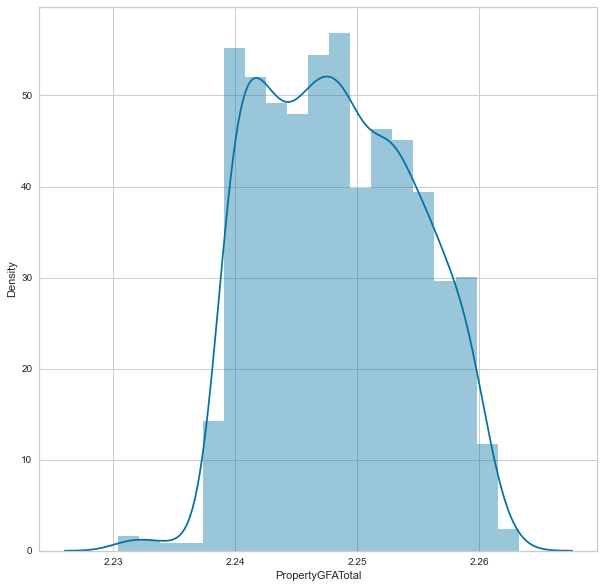

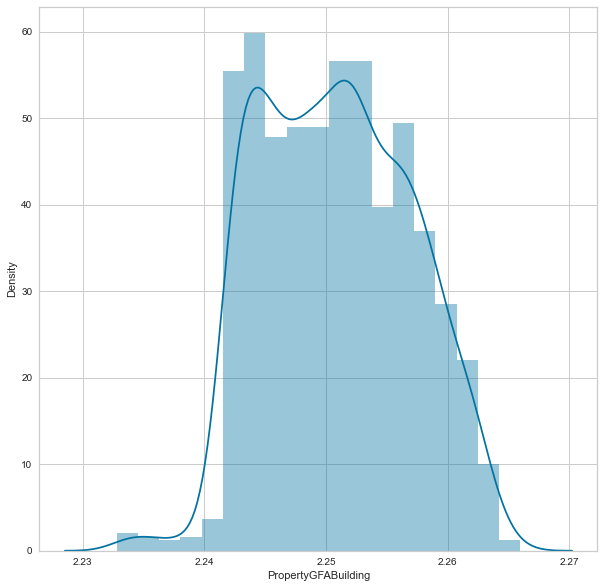

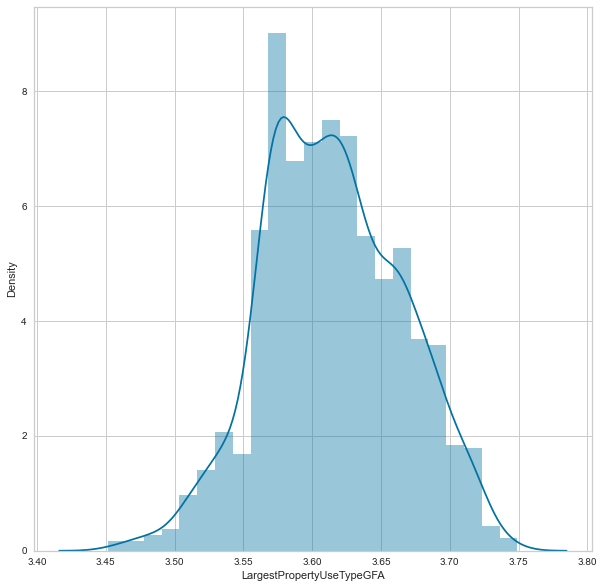

...

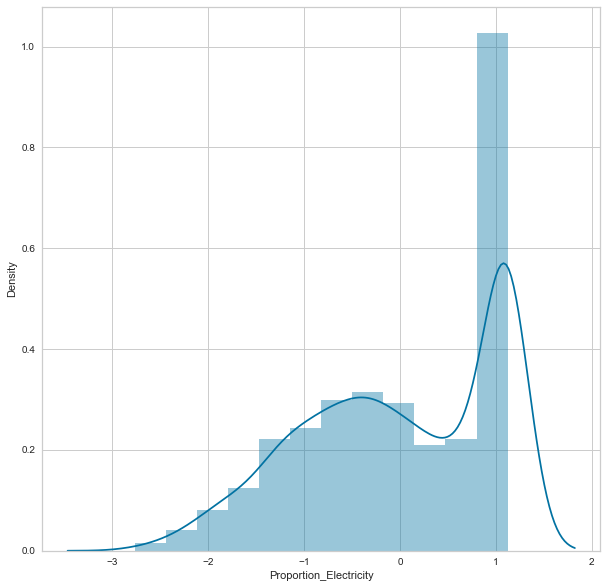

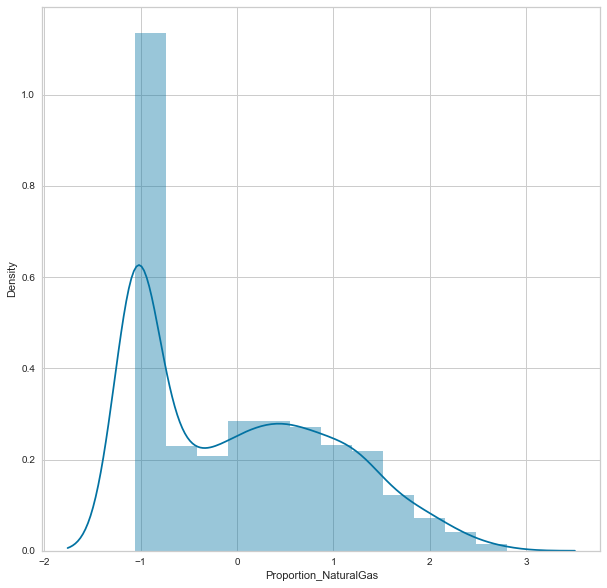

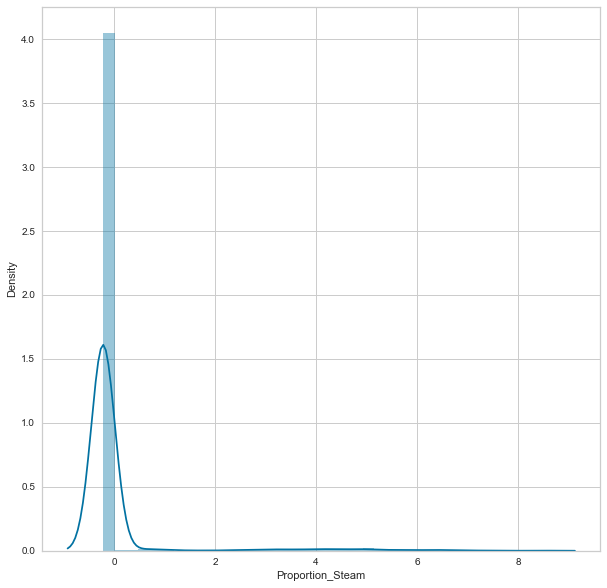

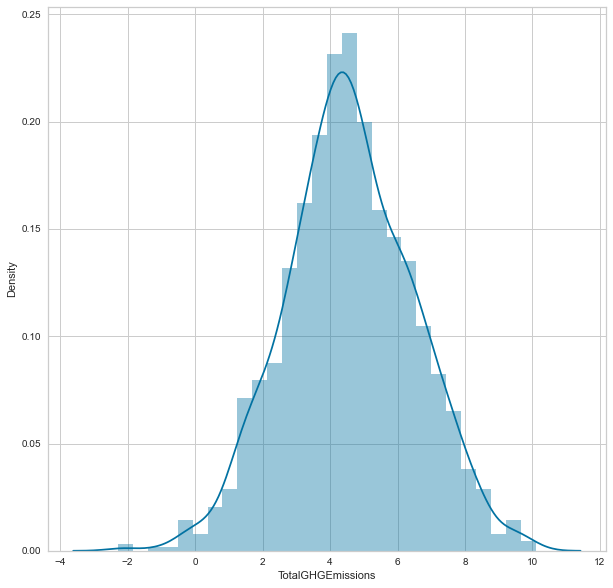

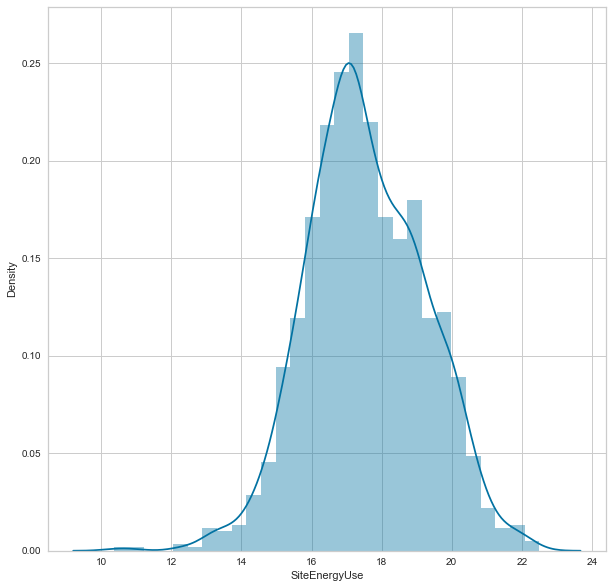

In [164]:
for col in dictVarCatCont['Ordre_Distance']:
    plt.figure(figsize=(10,10))
    sns.distplot(df[col])

# Etude des corrélations

<u>Qu'appelle-t-on corrélation</u> ?

En probabilité, la corrélation entre plusieurs variables est <br />
une notion liée à leur dépendance, ou indépendance les unes aux autres.<br />
Cette corélation est très souvent réduite à la corrélation <br />
linéaire entre variables quantitatives. C'est ce que nous ferons ici.<br />
    
Nous utiliserons la fonction **corr() de Pandas** <br />
pour calculer les <u>coefficients de Pearson</u>.
    
Le **coefficient de Pearson** est un indice reflétant <br />
<u>une relation linéaire entre deux variables continues</u>. <br />
**Le coefficient de corrélation varie entre -1 et +1**, <br />
*0 reflétant une relation nulle entre les deux variables, <br />
une valeur négative (corrélation négative) signifiant que <br />
lorsqu'une des variables augmente, l'autre diminue ; <br />
tandis qu'une valeur positive (corrélation positive) indique <br /> 
que les deux variables varient ensemble dans le même sens.*


Je vais dans cette partie analyser les rapports de corrélation <br />
qui existe entre les différentes variables de notre DataFrame '**df**'.

<u>Je vais diviser mon étude en 2 parties</u> :
 - L’étude des corrélations entre les variables et les Targets
 - L’étude des corrélations entre les variables, entre-elles


## Etude des corrélations entre <br />les Features et les Targets

Les modèles de Machine Learning fonctionnent mieux à prédire nos données <br />
à partir de caractéristiques (features) corrélées à nos Targets.

Nous allons identifier et mettre en évidence les variables les plus corrélées, <br />
les plus importantes et donc les plus aptes à aider correctement <br />
les algorithmes de Machine Learning à effectuer de bonne prédiction <br />
dans le problème qui nous est posé.

<u>J'affiche ci-dessous la *heatmap de corrélation*,<br />
avec les colonnes filtrées sur les Targets pour plus de lisibilité</u> :

<AxesSubplot:>

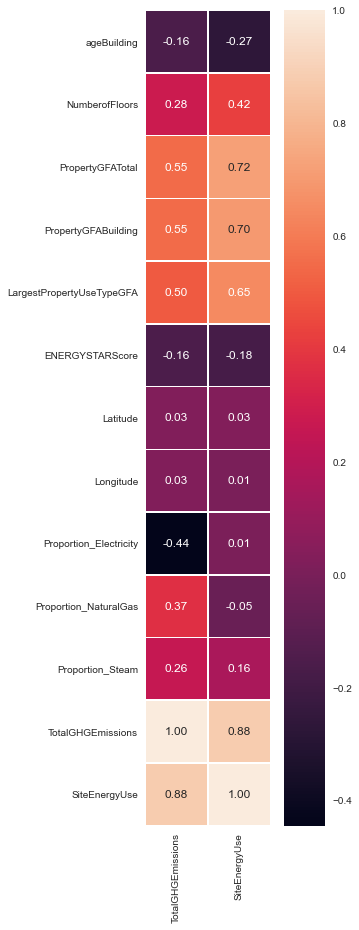

In [165]:
plt.figure(figsize=(5,15))
sns.heatmap(df[dictVarCatCont['Ordre_Distance']].corr()[['TotalGHGEmissions','SiteEnergyUse']],
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            square=True)

 - **TotalGHGEmissions**
  - Les variables GFA, renseignant sur les différentes surfaces <br />
    des bâtiments (surface totale, du bâtiment, ou du type de propriété principale) <br />
    sont les plus corrélées avec des valeurs allant de 50% à 54%
  - La variable renseignant sur la proportion d'électricité <br />
    est très anti-corrélée avec -45% d'indice de corrélation
  - Les variables de proportion de gaz et de vapeur sont assez corrélées <br />
    avec la target avec respectivement 38% et 26% d'indice de corrélation
  - Le nombre d'étage de l'immeuble semble également être <br />
    un indicateur intéressant avec un indicateur à 28% de corrélation
  - L'age des bâtiments à une anti-corrélation de -17%, ce qui n'est pas négligeable
 - **SiteEnergyUse**
  - Les variables GFA sont encore plus corrélés avec <br />
    cette target et s'échelonnent de 65% à 71%
  - Le nombre d'étages est également une variable très corrélée avec 42% 
  - 'Proportion_Steam' avec un indice de 16% de corrélation <br />
     est la variable la plus corrélés des variables renseignant <br />
     sur les proportions d'énergie utilisées

## Etude de la corrélation des variables entre-elles

A l'inverse de la corrélation variable/target,
une corrélation trop forte entre deux variables du jeu de données <br />
peut nuire aux performances de notre modèle de Machine Learning.

<u>J'affiche ci-dessous la heatmap de corrélation entre les variables quantitatives</u> :


<AxesSubplot:>

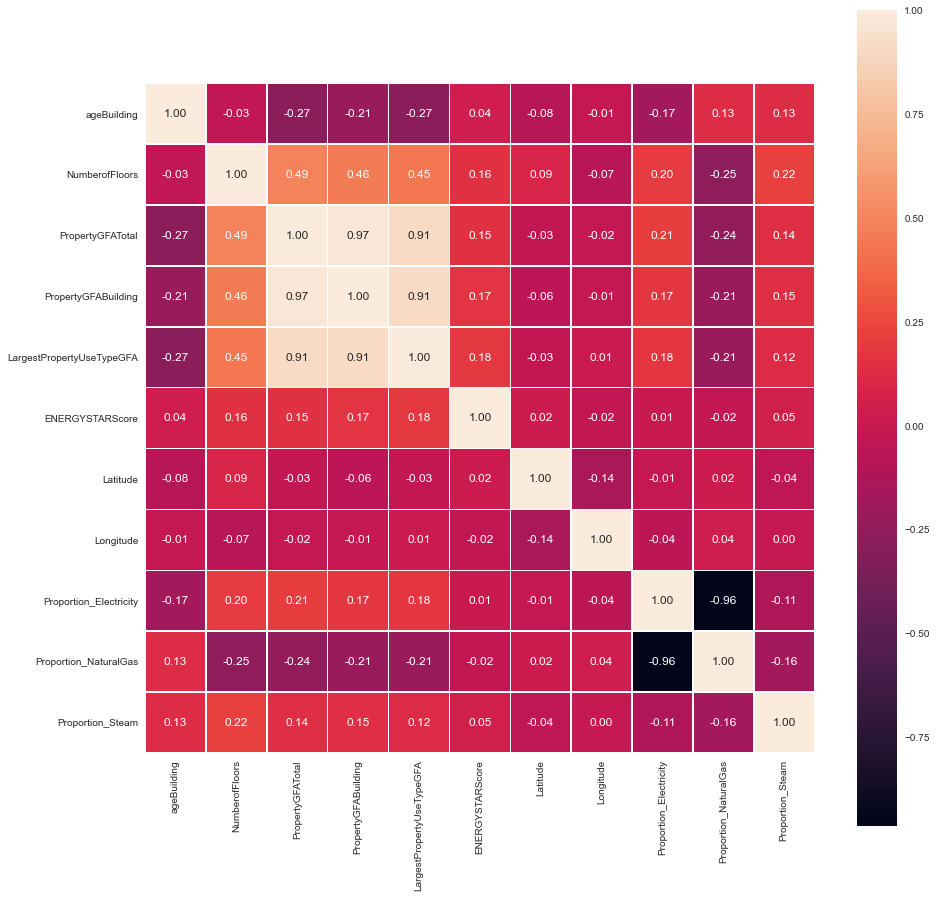

In [166]:
plt.figure(figsize=(15,15))
sns.heatmap(df[dictVarCatCont['Ordre_Distance']].drop(['TotalGHGEmissions','SiteEnergyUse'], axis=1).corr(),
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            square=True)

- On observe les plus fortes corrélations entre les variables '**PropertyGFATotal**', <br />
  '**PropertyGFABuilding**', et '**LargestPropertyUseTypeGFA**', de **90%** à **97%**.
- Par ailleurs, on observe également une corrélation intéressante de <br />
  la variable '**NumberofFloors**' avec les variables '**PropertyGFATotal**', <br />
  '**PropertyGFABuilding**', et '**LargestPropertyUseTypeGFA**' avec <br />
  respectivement **49%**, **46%** et **44%** de corrélation.
- Plus généralement il existe une forte relation de corrélation <br />
  entre les 4 variables que sont :
 - '**NumberofFloors**'
 - '**PropertyGFATotal**'
 - '**PropertyGFABuilding**'
 - '**LargestPropertyUseTypeGFA**
 - *Et dans une moindre mesure, avec '**ageBuilding**' qui a une anti-corrélation modérée <br />
   avec ces variables à l’exception cependant de '**NumberofFloors**'.*
- Il existe également une anti-corrélation très importante (-96%) <br />
  entre les variables '**Proportion_Electricity**' et '**Proportion_NaturalGas**'.
- Les autres variables sont relativement peu (anti-)corrélées entre-elles


# Features Selection

Maintenant que nous avons mieux compris les relations qui existent <br />
entre nos variables et nos Targets, ainsi que nos variables entre-elles <br />
nous allons voir comment faire de la <u>sélection de variables</u>.

Cette technique consiste, parmi toutes les variables disponibles dans un Dataset, <br />
à **trouver** puis à **sélectionner** celles qui seront **les plus utiles au développement <br />
d’un modèle de Machine Learning**.

En effet, lorsqu'on fournit trop de variables à un modèle de Machine Learning, <br />
et notamment des variables qui ne sont pas utiles au modèle, <br />
alors cela impactera ses performances de façon négative.

Plusieurs techniques existent pour faire de la sélection de variables.

Dans ce projet, j’effectuerai ma sélection de variables avec l’algorithme **Lasso** <br />
en utilisant le module **LassoCV de Sklearn** et en expliquant en détail chaque étape.

J’effectuerai deux sélections de variables différentes, une pour chacune de nos deux Targets.

## Sauvegarde du DataFrame '**df**'

<u>Je sauvegarde préalablement notre DataFrame '**df**' dans un objet Pickle</u> :

In [167]:
pickle.dump(df, open('dfBeforeFeatureSelection', 'wb'))
# df = pickle.load(open('dfBeforeFeatureSelection', 'rb'))

## Feature Selection pour la target '**TotalGHGEmissions**'<br />avec LassoCV

Avant d'appliquer le modèle LassoCV, je vais préalablement séparer nos données en deux groupes.<br />
Les features de notre jeu de données, d'un côté, seront stockées dans la variable **X**<br />
et notre target  'TotalGHGEmissions' sera stockée dans la variable **y**.

*Je retirerai également la variable '**ENERGYSTARScore**' dans cette étape.*

<u>Je séparerai ensuite c'est deux variables en deux groupes</u> : 
 - les données d'entrainement (80% des données) qui vont nous servir à entrainer notre modèle
 - les données de test qui nous servirons à évaluer notre modèle.

<u>Les données seront séparées de cette manière dans les variables</u> : 
 - X_train, y_train pour les données d'entrainement
 - X_test, y_test pour les données de test
 
Pour optimiser les performances de l'algorithme Lasso,<br />
j'appliquerai la technique de Cross Validation.

Cette technique consiste à entraîner puis valider notre modèle <br />
sur plusieurs découpes possibles du train-set.<br />
Ainsi le score obtenu sera celui de la moyenne des différentes <br />
découpes possibles du train-set.

Ainsi, en découpant le train-set en 5 parties, on pourra entrainer <br />
notre modèle sur les 4 premières parties puis le valider sur la cinquième partie.<br />
Ensuite l'algorithme refera la même chose pour toutes les configurations possibles.


<u>LassoCV</u> :

<u>Création de nos variables X (features) et y (target)</u> :

In [168]:
X = df.drop(['TotalGHGEmissions','SiteEnergyUse','ENERGYSTARScore'], axis=1)
y = df.TotalGHGEmissions

<u>Création de nos jeux de train et de test, <br />
avec un random_state défini pour la reproductivité des résultats</u> :

In [169]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=RS) # Pour la reproductibilité des résultats

Nous allons maintenant itérer notre modèle avec <br />
plusieurs valeurs possibles d'alpha.<br />
Je définis une gamme assez large d'alphas allant <br />
de **10e-4** à **10e1** découpés en 400 échantillons.

<u>A chaque itération, nous allons enregistrer dans une List</u> :
 - Les coefficients calculés pour chaque variable 
 - L'erreur quadratique moyenne calculée sur le jeu de test.



In [170]:
alphas = np.logspace(-4, 1, 300)
coefs=[]
errors = []
for alpha in alphas:
    lcv = LassoCV(alphas=[alpha], 
                  fit_intercept=False, 
                  normalize=False, 
                  cv=5, 
                  max_iter=10000,
                 random_state=RS)
    lcv.fit(X_train, y_train)
    coefs.append(lcv.coef_)
    errors.append(mean_squared_error(y_test,lcv.predict(X_test)))


C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 392.44441503215035, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 376.3075881905988, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 398.6848584489616, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525:

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 408.46686331937985, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 516.9418312796878, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 398.54003353189273, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Con

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.9428910104125, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 414.24811345969124, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 524.7044242449696, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Con

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 391.29998503744497, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 413.8914780180353, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 408.43828177177267, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:52

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 535.279010880371, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 412.87126157813924, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 394.25002343445277, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 421.97920965618385, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 536.2651116812501, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 413.72126330721915, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Con

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 409.79683840142945, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 412.1385408234333, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 416.12233734538745, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:52

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 380.49306592587203, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 402.5597401000791, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.3740816950881, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 511.07050061325543, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 406.54701364296585, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 372.4906699628481, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Con

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 389.3959702144906, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 388.89136831286226, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 492.51059200029414, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Co

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 338.6899502938825, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 361.0381589180814, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 349.5618962430615, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529:

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 329.7833575295917, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 347.0176545949416, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 341.47429624728136, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 451.6160620069026, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 359.5857028285359, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 339.50836060660316, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 363.88200855891034, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 360.58207042122183, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 461.18530695885903, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: C

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 302.74986724555754, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 320.71305620859766, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 337.56191720998737, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:5

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 386.89231950158205, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259.6557280397423, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 285.32591445366666, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Con

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 292.2611825558029, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 284.4825830386183, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 357.9277502217062, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 241.619823560957, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 257.9233730460924, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280.0214617179973, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: 

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 291.9339621218468, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 217.4346632520403, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 211.0869177690048, tolerance: 2.2324839677328887
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conve

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192.0987858311554, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 246.38159639339176, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180.88765641749524, tolerance: 2.227027296400932
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Con

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155.76824079204312, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165.92359941060704, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149.89447450154148, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:5

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110.956649649832, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121.53316041971789, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.14544857073554, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65.21407148350534, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74.51256553651285, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58.04895314209125, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529:

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.009193139925628, tolerance: 2.1886403671588326
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.25551170657127, tolerance: 2.2203893074793233
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.198013215036326, tolerance: 2.2300627340789543
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:52

<u>Graphique illustrant l'erreur quadratique moyenne en fonction de alpha</u> :<br />
*Alpha semble atteindre un minimum entre 10e-3 et 10e-2*

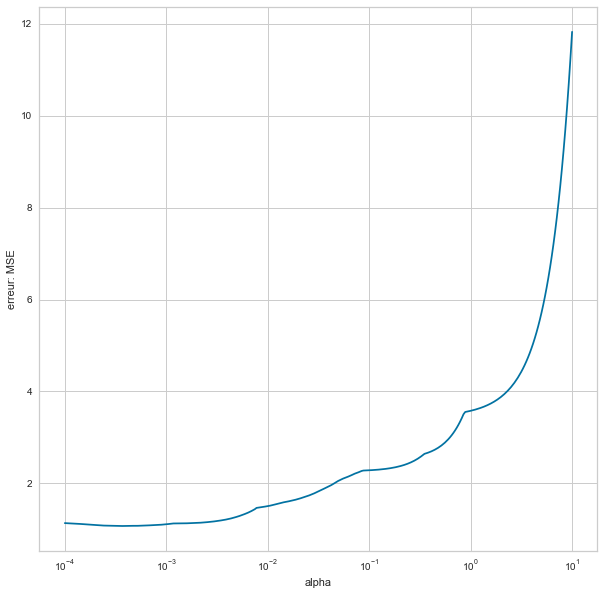

In [171]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('erreur: MSE')
plt.axis('tight')
plt.show()

<u>Affichons précisément la valeur de alpha qui minimise l'erreur MSE (Mean Squared Error)</u> :

In [172]:
df_alpha = pd.DataFrame({'alpha':alphas,'MSE':errors})
df_alpha[df_alpha.index == df_alpha.MSE.argmin()]

,alpha,MSE
33,0.00036,1.07143


Observons maintenant, pour le meilleur alpha calculé,<br />
les coefficients affectés à chacune de nos variables.

Un coefficient à 0 signifie que le modèle a pénalisé <br />
la variable correspondante au point de l'éliminer.

In [173]:
s = pd.Series(coefs[df_alpha.MSE.argmin()], index=X.columns)
s

NumberofFloors                                                                   0.22425
PropertyGFATotal                                                                -0.06135
PropertyGFABuilding                                                              0.02854
LargestPropertyUseTypeGFA                                                        9.80533
DefaultData                                                                     -0.60051
Outlier                                                                          0.07676
Latitude                                                                        -0.25957
Longitude                                                                        0.08068
ageBuilding                                                                     -0.20058
Proportion_Electricity                                                           0.00000
Proportion_NaturalGas                                                            1.14926
Proportion_Steam     

<u>Observons maintenant la pénalisation des variables en fonction de alpha</u> :

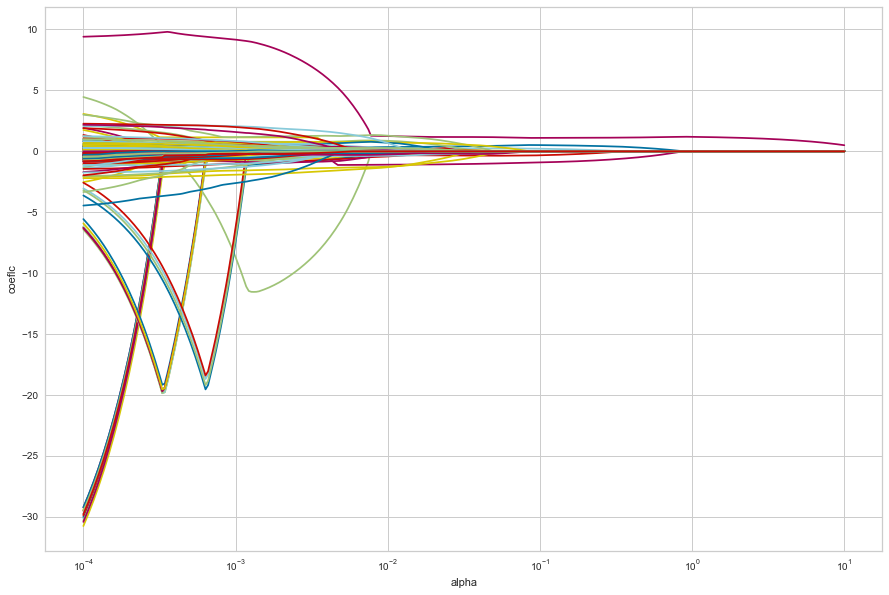

In [174]:
plt.figure(figsize=(15,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('coeflc')
plt.axis('tight')
plt.show()

<u>**154 variables ont été retenues par notre modèle**</u> et 29 ont donc été éliminées.

In [175]:
print('Nombre de variables sélectionnées:',s[s != 0].shape[0])
print('Nombre de variables éliminées:',s[s == 0].shape[0])

Nombre de variables sélectionnées: 154
Nombre de variables éliminées: 29


<u>Liste des variables sélectionnées</u> :

In [176]:
s[s!=0].index.tolist()

['NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFABuilding',
 'LargestPropertyUseTypeGFA',
 'DefaultData',
 'Outlier',
 'Latitude',
 'Longitude',
 'ageBuilding',
 'Proportion_NaturalGas',
 'Proportion_Steam',
 'YearsENERGYSTARCertified_2008',
 'YearsENERGYSTARCertified_2012',
 'YearsENERGYSTARCertified_2013',
 'YearsENERGYSTARCertified_2014',
 'YearsENERGYSTARCertified_2015',
 'YearsENERGYSTARCertified_2016',
 'ListOfAllPropertyUseTypes_Data Center',
 'ListOfAllPropertyUseTypes_Hotel',
 'ListOfAllPropertyUseTypes_K-12 School',
 'ListOfAllPropertyUseTypes_Multifamily Housing',
 'ListOfAllPropertyUseTypes_Non-Refrigerated Warehouse',
 'ListOfAllPropertyUseTypes_Office',
 'ListOfAllPropertyUseTypes_Other',
 'ListOfAllPropertyUseTypes_Parking',
 'ListOfAllPropertyUseTypes_Restaurant',
 'ListOfAllPropertyUseTypes_Retail Store',
 'ListOfAllPropertyUseTypes_Supermarket/Grocery Store',
 'ListOfAllPropertyUseTypes_Worship Facility',
 'Neighborhood_CENTRAL',
 'Neighborhood_DELRIDGE',
 'Neighb

<u>Liste des variables éliminées</u> :

In [177]:
s[s==0].index.tolist()

['Proportion_Electricity',
 'YearsENERGYSTARCertified_2009',
 'ListOfAllPropertyUseTypes_Distribution Center',
 'ListOfAllPropertyUseTypes_Medical Office',
 'Neighborhood_BALLARD',
 'ComplianceStatus_Compliant',
 'PrimaryPropertyType_Distribution Center',
 'PrimaryPropertyType_Hotel',
 'PrimaryPropertyType_K-12 School',
 'PrimaryPropertyType_Office',
 'PrimaryPropertyType_Residence Hall',
 'PrimaryPropertyType_Restaurant',
 'PrimaryPropertyType_Small- and Mid-Sized Office',
 'LargestPropertyUseType_K-12 School',
 'LargestPropertyUseType_Residence Hall/Dormitory',
 'SecondLargestPropertyUseType_Movie Theater',
 'SecondLargestPropertyUseType_Multifamily Housing',
 'SecondLargestPropertyUseType_Non-Refrigerated Warehouse',
 'SecondLargestPropertyUseType_Repair Services (Vehicle, Shoe, Locksmith, etc)',
 'SecondLargestPropertyUseType_Self-Storage Facility',
 'ThirdLargestPropertyUseType_Other',
 'ThirdLargestPropertyUseType_Other - Entertainment/Public Assembly',
 'ThirdLargestPropertyUseT

Je filtre '**df**' avec les colonnes sélectionnées par **LassoCV** <br/>
et j'enregistre le résultat dans un nouveau DataFrame '**df_Total**'.<br />
Je rajoute également à ce DataFrame la colonne '**ENERGYSTARScore**' ainsi <br />
que la colonne target qui lui correspond.

In [178]:
df_Total = df[X.columns[s != 0].tolist()+['ENERGYSTARScore','TotalGHGEmissions']]

In [179]:
print('Dimensions du DataFrame \'df_Total\':',df_Total.shape)

Dimensions du DataFrame 'df_Total': (1425, 156)


## Feature Selection pour la target '**SiteEnergyUse**'<br />avec LassoCV

<u>Je répète maintenant exactement le même protocole <br />
de sélection de variable que précédemment</u> :

<u>Création de nos variables X (features) et y (target)</u> :

In [180]:
X = df.drop(['TotalGHGEmissions','SiteEnergyUse','ENERGYSTARScore'], axis=1)
y = df.SiteEnergyUse

<u>Création de nos jeux de train et de test, <br />
avec un random_state défini pour la reproductivité des résultats</u> :

In [181]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=RS) # Pour la reproductibilité des résultats

Nous allons maintenant itérer notre modèle avec <br />
plusieurs valeurs possibles d'alpha.<br />
Je définis une gamme assez large d'alphas allant <br />
de **10e-4** à **10e1** découpés en 400 échantillons.

<u>A chaque itération, nous allons enregistrer dans une List</u> :
 - Les coefficients calculés pour chaque variable 
 - L'erreur quadratique moyenne calculée sur le jeux de test.



In [182]:
alphas = np.logspace(-4, 1, 300)
coefs=[]
errors = []
for alpha in alphas:
    lcv = LassoCV(alphas=[alpha], 
                  fit_intercept=False, 
                  normalize=False, 
                  cv=5, 
                  max_iter=10000,
                  random_state=RS)
    lcv.fit(X_train, y_train)
    coefs.append(lcv.coef_)
    errors.append(mean_squared_error(y_test,lcv.predict(X_test)))


C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 384.24340787815595, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 375.2853860673561, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 400.92816928376004, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525:

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 409.96369191036086, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 514.2330819346397, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 389.89862451108274, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conve

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 410.3338005928627, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 396.1266634927956, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 415.409014017651, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: C

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 389.02158046114516, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 414.5702797834509, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.8901482314965, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 529.8139989063669, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.899237675845, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 391.14976215950605, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conver

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 421.5224964877361, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 529.4236054574677, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.5194790062873, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Converg

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 408.1420371002457, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 402.42228125728644, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 414.75567100197435, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 375.775848728496, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.3269501343519, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 393.0506959104023, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: 

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 497.13886569039056, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 394.1525275121049, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 361.25917716828656, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 371.6538759814426, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 463.6605750272011, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 384.3021386799909, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Converg

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318.9482891810683, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 327.1075735952927, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 407.47521369925244, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 321.5826458805838, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 341.0788552020894, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 333.616843738378, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: 

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 437.5510177057483, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 314.66781756331505, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 328.67049760523423, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 352.02853362569545, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 442.66523790750256, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 241.72150510472983, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 310.4175201604193, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301.4540044432037, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 375.10039474453947, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259.66465761171986, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277.8006390206825, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 282.91683663619585, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:52

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318.85239597035945, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 267.406046700603, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 254.29642666363588, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conve

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 232.85807095049267, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221.2515025372436, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277.4344403963401, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 168.97890132965756, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182.20321367690042, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194.79786062900894, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:5

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184.8060919875138, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126.09848804094077, tolerance: 28.3163253491455
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 127.11996697423206, tolerance: 28.412371546730988
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Conv

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114.85460993935135, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.92937010753872, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126.75848967059255, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: Con

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.32174938754747, tolerance: 28.211881665091333
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 66.05157768910226, tolerance: 28.267140482981592
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:525: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.098684010579746, tolerance: 28.34968010185227
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529:

<u>Graphique illustrant l'erreur quadratique moyenne en fonction de alpha</u> :<br />
*Alpha semble atteindre un minimum entre 10e-3 et 10e-2*

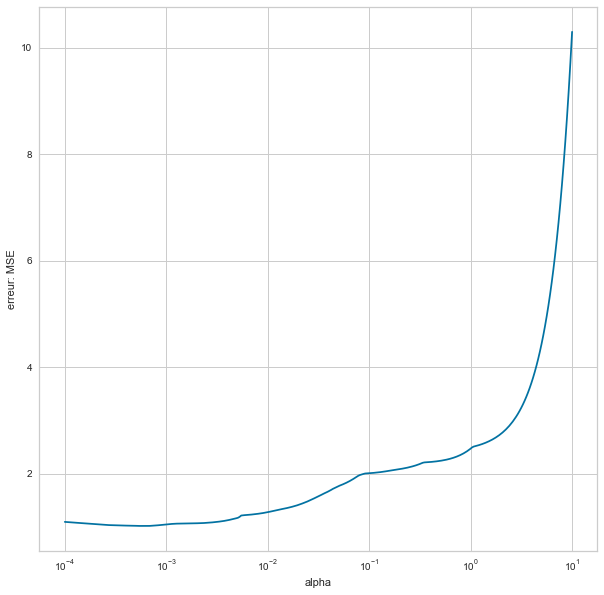

In [183]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, errors)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('erreur: MSE')
plt.axis('tight')
plt.show()

<u>Affichons précisément la valeur de alpha qui minimise l'erreur MSE (Mean Square Error)</u> :

In [184]:
df_alpha = pd.DataFrame({'alpha':alphas,'MSE':errors})
df_alpha[df_alpha.index == df_alpha.MSE.argmin()]

,alpha,MSE
48,0.00063,1.01825


Observons maintenant, pour le meilleur alpha calculé,<br />
les coefficients affectés à chacune de nos variables.

Un coefficient à 0 signifie que le modèle a pénalisé <br />
la variable correspondante au point de l'éliminer.

In [185]:
s = pd.Series(coefs[df_alpha.MSE.argmin()], index=X.columns)
s

NumberofFloors                                                                   0.22910
PropertyGFATotal                                                                 0.14055
PropertyGFABuilding                                                              0.04146
LargestPropertyUseTypeGFA                                                        9.82820
DefaultData                                                                     -0.61101
Outlier                                                                          0.00810
Latitude                                                                        -0.29653
Longitude                                                                        0.01180
ageBuilding                                                                     -0.19613
Proportion_Electricity                                                           0.00000
Proportion_NaturalGas                                                            0.30640
Proportion_Steam     

<u>Observons maintenant la pénalisation des variables en fonction de alpha</u> :

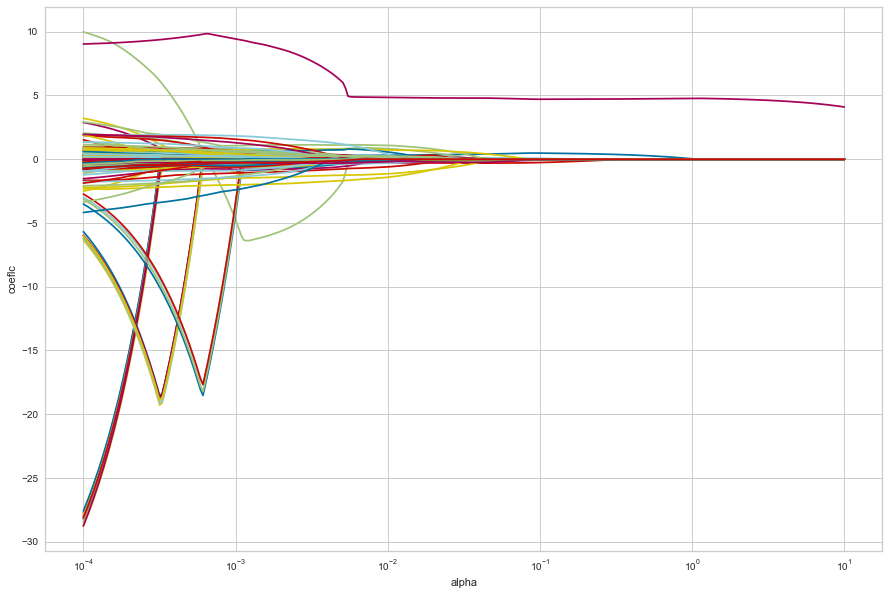

In [186]:
plt.figure(figsize=(15,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('coeflc')
plt.axis('tight')
plt.show()

<u>**133 variables ont été retenues par notre modèle**</u> et 50 ont donc été éliminées.

In [187]:
print('Nombre de variables sélectionnées:',s[s != 0].shape[0])
print('Nombre de variables éliminées:',s[s == 0].shape[0])

Nombre de variables sélectionnées: 133
Nombre de variables éliminées: 50


<u>Liste des variables sélectionnées</u> :

In [188]:
s[s!=0].index.tolist()

['NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFABuilding',
 'LargestPropertyUseTypeGFA',
 'DefaultData',
 'Outlier',
 'Latitude',
 'Longitude',
 'ageBuilding',
 'Proportion_NaturalGas',
 'Proportion_Steam',
 'YearsENERGYSTARCertified_2012',
 'YearsENERGYSTARCertified_2013',
 'YearsENERGYSTARCertified_2015',
 'YearsENERGYSTARCertified_2016',
 'ListOfAllPropertyUseTypes_Data Center',
 'ListOfAllPropertyUseTypes_Hotel',
 'ListOfAllPropertyUseTypes_K-12 School',
 'ListOfAllPropertyUseTypes_Non-Refrigerated Warehouse',
 'ListOfAllPropertyUseTypes_Office',
 'ListOfAllPropertyUseTypes_Other',
 'ListOfAllPropertyUseTypes_Parking',
 'ListOfAllPropertyUseTypes_Retail Store',
 'ListOfAllPropertyUseTypes_Supermarket/Grocery Store',
 'ListOfAllPropertyUseTypes_Worship Facility',
 'Neighborhood_CENTRAL',
 'Neighborhood_DELRIDGE',
 'Neighborhood_DOWNTOWN',
 'Neighborhood_EAST',
 'Neighborhood_GREATER DUWAMISH',
 'Neighborhood_NORTH',
 'Neighborhood_NORTHEAST',
 'Neighborhood_NORTHWEST',
 'Neighb

<u>Liste des variables éliminées</u> :

In [189]:
s[s==0].index.tolist()

['Proportion_Electricity',
 'YearsENERGYSTARCertified_2008',
 'YearsENERGYSTARCertified_2009',
 'YearsENERGYSTARCertified_2014',
 'ListOfAllPropertyUseTypes_Distribution Center',
 'ListOfAllPropertyUseTypes_Medical Office',
 'ListOfAllPropertyUseTypes_Multifamily Housing',
 'ListOfAllPropertyUseTypes_Restaurant',
 'Neighborhood_BALLARD',
 'Neighborhood_LAKE UNION',
 'Neighborhood_MAGNOLIA / QUEEN ANNE',
 'Neighborhood_SOUTHEAST',
 'CouncilDistrictCode_3',
 'CouncilDistrictCode_5',
 'CouncilDistrictCode_6',
 'PrimaryPropertyType_Distribution Center',
 'PrimaryPropertyType_Hotel',
 'PrimaryPropertyType_Laboratory',
 'PrimaryPropertyType_Low-Rise Multifamily',
 'PrimaryPropertyType_Mixed Use Property',
 'PrimaryPropertyType_Refrigerated Warehouse',
 'PrimaryPropertyType_Residence Hall',
 'PrimaryPropertyType_Restaurant',
 'PrimaryPropertyType_Retail Store',
 'PrimaryPropertyType_Small- and Mid-Sized Office',
 'LargestPropertyUseType_Bank Branch',
 'LargestPropertyUseType_College/Universit

Je filtre '**df**' avec les colonnes selectionnées par **LassoCV** <br/>
et j'enregistre le résultat dans un nouveau DataFrame '**df_Energy**'.<br />
Je rajoute également à ce DataFrame la colonne '**ENERGYSTARScore**' ainsi <br />
que la colonne target qui lui correspond.

In [190]:
df_Energy = df[X.columns[s != 0].tolist()+['ENERGYSTARScore','SiteEnergyUse']]

In [191]:
print('Dimensions du DataFrame \'df_Energy\':',df_Energy.shape)

Dimensions du DataFrame 'df_Energy': (1425, 135)


# Machine Learning

Notre jeu de données a été *nettoyé*, *encodé*, *standardisé* et <br />
est maintenant <u>optimisé</u> pour le **Machine Learning**.

Dans cette partie dans allons répondre aux 2 problématiques qui nous ont été posées :
 1. Tenter de prédire les émissions de CO2 et la consommation totale d’énergie des bâtiments
  - Et déterminer par la même occasion le meilleur modèle pour y parvenir 
 2. Evaluer l’intérêt de la variable '**ENERGYSTARScore**'

Dans les deux cas, nous allons tester plusieurs algorithmes pour tenter de prédire, <br />
avec le minimum d’erreur, **l’émission de CO2** et la **consommation totale d’énergie** d’un bâtiment.

Comme il n’est pas possible, à priori, de savoir quel algorithme <br />
saura le mieux généraliser notre problématique, et donc lequel nous donnera <br />
les meilleurs résultats, je <u>testerai et évaluerai différents algorithmes, <br />
du plus simple au plus complexe</u>.

Enfin, nous étudierons la pertinence d'utiliser la variable '**ENERGYSTARScore**'.

<u>Ainsi, je diviserai ce chapitre en 2 parties</u> :
1. Tests et évaluations des algorithmes sur les Target '**TotalGHGEmissions**' <br />
   puis '**SiteEnergyUse**' <u>sans</u> utilisation de la variable '**ENERGYSTARScore**'
 - J'enregistrerai également le <u>temps d'exécution de chaque algorithme</u> dans cette partie.
 
 
2. Tests et évaluations des algorithmes sur les Target '**TotalGHGEmissions**' <br />
   puis '**SiteEnergyUse**' avec comparatif des scores <u>avec</u> et <br/>
   <u>sans</u> utilisation de la variable '**ENERGYSTARScore**'
 - Les tests devront être réalisés sur le même nombre d'entrées, en conséquence, <br />
   ces tests seront réalisés avec les entrées où la variable '**ENERGYSTARScore**' est <u>Non Null</u>.

<u>Voici dans l’ordre les algorithmes que nous allons tester</u> :
 - DummyRegressor (strategy = mean)
  - Il s’agit d’un régresseur qui effectue des prédictions à l'aide <br />
    de règles simples comme la moyenne, la médiane, ou une valeur fixe.
  - On se servira de ce modèle comme base de repère afin de comparer la performance des autres modèles.
 - KNN Linéaire ( K-Nearest Neighbors)
 - Régression Ridge
 - Régression Lasso
 - SVR (Support Vector Regression)
 - Régression Ridge à noyau
 - Random Forest
 - AdaBoost
 - Gradient Boosting
 - XGBoost

<u>Optimisation des Algorithmes :</u>

Je réaliserai une recherche des meilleurs hyperparamètres <br />
avec l’utilisation des modules **GridSearchCV** ou **RandomizedSearchCV**.

**GridSearchCV** permet d’exécuter et d’évaluer par *validation croisée*, <br />
un modèle en testant 1 à 1 toutes les combinaisons d’hyperparamètres qu’on lui fournit.<br />
**GridSearchCV** nous retournera alors la meilleure combinaison d’hyperparamètre <br />
possible à utiliser en fonction des données d’entrainement qu’on lui a fourni.

**RandomizedSearchCV** repose sur le même principe que **GridSearchCV** <br />
à la différence qu’il ne va pas chercher à tester toutes les combinaisons possibles, <br />
mais à effectuer une recherche limitée et aléatoire des hyperparamètres fournis. <br />
Le nombre de tests à effectuer est défini par l’utilisateur et dépendra du temps de calcul requis. <br />
Il est préférable d’utiliser ce module lorsque la recherche exhaustive <br />
de tous les hyperparamètres ne peut pas être réalisée sans une puissance <br />
de calcul ou un temps raisonnable.

<u>Evaluation des algorithmes</u>

J’utiliserai **4 métriques** pour juger de la **qualité des algorithmes** <br />
et pour comparer entre eux leurs **performances** : 
 - <u>**R²**</u> :  
  - Représente la proportion de variance expliquée par notre modèle.
  - C’est une métrique relative, donc pratique à utiliser pour comparer <br />
    plusieurs modèles entraînées sur les mêmes données.
  - Un modèle qui n'explique aucune variance aurait un R² de 0. 
  - Un modèle avec un R² de 1 expliquerait toute la variance. 
  - Des scores plus élevés sont meilleurs.
  - Formule : 
   - <u>Numérateur</u> = ((y_true - y_pred) ** 2) .sum () 
   - <u>Dénominateur</u> = ((y_true - np.average (y_true)) ** 2) .sum ()
   - R² = 1 - (numérateur / dénominateur)
 - <u>**MAE** (Mean Absolute Error)</u> :
  - Erreur Absolue Moyenne 
  - <u>Formule</u> : np.average (np.abs (y_true - y_pred))
  - Cette métrique répond à la question : « À quelle distance étions-nous en moyenne dans nos prédictions ? »
  - Les grandes erreurs ne sont pas plus pénalisées que les petites.
   - Ca peut-être un avantage ou un inconvénient suivant la problématique posée
  - Il s’agit de la mesure d’évaluation la plus simple et la plus facile à interpréter.
  - La valeur de la MAE est dans la même unité que la Target
  - Des scores plus bas sont meilleurs.
 - <u>MSE (Mean Squared Error)</u> :
  - <u>Formule</u> : np.mean ((y_true - y_pred) ** 2)
  - Pénalise les grandes erreurs
  - Plus difficile à interpréter que la MAE
  - Des scores plus bas sont meilleurs.
 - <u>RMSE (Root Mean Squared Error)</u> :
  - <u>Formule</u> : np.sqrt (np.mean ((y_true - y_pred) ** 2))
  - Est utile si on souhaite :
   - pénaliser les grosses erreurs
   - faire en sorte que le résultat soit dans les mêmes unités que la Target
   - utiliser une fonction de perte pour la validation qui peut être rapidement calculée
  - Elle n’est pas facile à interpréter
  - C'est un bon choix pour une métrique de perte lors du réglage des hyperparamètres (avec GrisSearchCV par exemple)
  - Des scores plus bas sont meilleurs.

<u>Pour rappel</u> :
 - L’émission de CO2 des bâtiments est présente dans la Target : '**TotalGHGEmissions**'
 - La consommation totale d’énergie est présente dans la Target : '**SiteEnergyUse**'

## Sauvegarde des DataFrame Intermédiaire <br />dans des objets Pickle

In [192]:
pickle.dump(df_Total, open('dfTotalBeformeML', 'wb'))
pickle.dump(df_Energy, open('dfEnergyBeformeML', 'wb'))

## Restauration des DataFrame Intermédiaire via Pickle

In [193]:
# df_Total = pickle.load(open('dfTotalBeformeML', 'rb'))
# df_Energy = pickle.load(open('dfEnergyBeformeML', 'rb'))

## Fonction d'affichage des métrics

J'affiche et j'exporte dans un dictionnaire les résultats <br />
de mes modèles via ma fonction *displayMetrics()*<br />
Ma fonction *displayBestAlgo()* permet d'afficher et de mettre <br />
en évidence (selon la métrique choisie) le meilleur algorithme <br />
de Machine Learning parmi les algorithmes testés qui lui ont <br />
été fournis dans le dictionnaire *dictAlgoScore*.

<u>Déclaration de mes deux fonctions de gestion <br />
d'affichage des scores et des meilleurs algorithmes</u> :

In [194]:
def displayMetrics(model, X, y, pc1=-1, pc2=-1):
    '''Affiche les métriques de l'algorithme testé.
    Affiche également en secondes le temps de process 
    qui a été requis pour entraîner l'algorithme'''
    # Calcul des métrics
    R2 = round(r2_score(y, model.predict(X)),2)
    MAE = round(mean_absolute_error(y, model.predict(X)),2)
    MSE = round(mean_squared_error(y, model.predict(X)),2)
    RMSE = round(mean_squared_error(y, model.predict(X), squared=False),2)
    PC = round(pc2-pc1,2)
    # Affichage des métrics
    print('#'*50)
    print(f'{"R²":-<45}{R2}')
    print(f'{"     Mean Absolute Error":-<45}{MAE}')
    print(f'{"     Mean Square Error":-<45}{MSE}')
    print(f'{"Root Mean Square Error":-<45}{RMSE}')
    if (pc1 != -1) & (pc2 != -1):
        print(f'{"Process Time":-<45}{PC}s')
    print('#'*50)
    # On retourne les résultat sous forme de dictionnaire
    return {'R²':R2, 'MAE':MAE, 'MSE':MSE, 'RMSE':RMSE, 'EXECUTION-TIME':PC}

In [195]:
def displayBestAlgo(dictListScore, importantMetric):
    '''Affiche les resultats des différents algorithmes testés.
    L'ordre d'affichage dépend de la métric passée dans <importantMetric>.
    Les algorithmes sont affichés dans l'ordre du plus au moins performant.
    Il est également possible d'afficher les algorithmes selon leur vitesse d'entraînement.
    '''
    
    if importantMetric == 'R²':
        inv=True
    else:
        inv=False
    
    print('#'*75)
    print(f'{"Classement des différents algorithmes testés selon la métric:":-<70} {importantMetric}')
    print('Les algorithmes testés sont affichées du plus au moins performant.')
    print('#'*50)
    for indice, i in enumerate(sorted(dictListScore.items(), 
                                      key = lambda x: x[1][importantMetric],
                                      reverse=inv)):
        print(f'{indice+1} {i[0]:-<37} {importantMetric}: {i[1][importantMetric]}') # Premier element du Tupple qui contient le nom de l'algorithme testé
    print('#'*50)
    for i in sorted(dictListScore.items(), 
                    key = lambda x: x[1][importantMetric],
                    reverse=inv):
        print(f'{"Algorithme testé":-<30} {i[0]}')
        print(f'{"R²":-<45}{i[1]["R²"]}')
        print(f'{"     Mean Absolute Error":-<45}{i[1]["MAE"]}')
        print(f'{"     Mean Square Error":-<45}{i[1]["MSE"]}')
        print(f'{"Root Mean Square Error":-<45}{i[1]["RMSE"]}')
        print(f'{"Execution Time":-<45}{i[1]["EXECUTION-TIME"]}')
        print('#'*50)
    print('#'*75)

In [196]:
def ShowYTrueYPredError(modelML, X_true, y_true):
    plt.scatter(y_true,
                y_true,
                color='firebrick',
                alpha=0.7)
    plt.scatter(
        pd.DataFrame({'y_true':y_true,'y_pred':modelML.predict(X_true)}).sort_values(by='y_true')['y_true'],
        pd.DataFrame({'y_true':y_true,'y_pred':modelML.predict(X_true)}).sort_values(by='y_true')['y_pred'],
        color='dodgerblue',
        alpha=0.7)
    plt.show()

## Recherche des meilleurs algorithmes <br />de Machine Learning pour prédire <br />'TotalGHGEmissions' et 'SiteEnergyUse'

### Label = **TotalGHGEmissions**

#### Initialisation du DataFrame

Je remplace le contenu de '**df**' par le contenu de '**df_Total**', <br />
le DataFrame filtré et optimisé pour la target '**TotalGHGEmissions**'.

In [197]:
df = df_Total

#### Initialisation du dictionnaire destiné à enregistrer <br />les performances des différents algorithmes

In [198]:
dictAlgoScore = {}

#### Selection des Features et Label

In [199]:
X = df.drop(['TotalGHGEmissions','ENERGYSTARScore'], axis=1)

y = df.TotalGHGEmissions

#### Création du train set et du test set

In [200]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=RS)

#### Application de modèle Dummy pour établir une baseline

In [201]:
dummy_regr = DummyRegressor(strategy='mean')
pcStart = perf_counter()
dummy_regr.fit(X,y)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [202]:
dictAlgoScore['DummyRegressor'] = displayMetrics(dummy_regr, X_test, y_test, pcStart, pcEnd)

##################################################
R²--------------------------------------------0.0
     Mean Absolute Error---------------------1.49
     Mean Square Error-----------------------3.54
Root Mean Square Error-----------------------1.88
Process Time---------------------------------0.0s
##################################################


<u>Affichage des prédictions '**y_pred**' en bleu en fonction <br />
    de la valeur réelle de y '**y_true**' en rouge</u> :

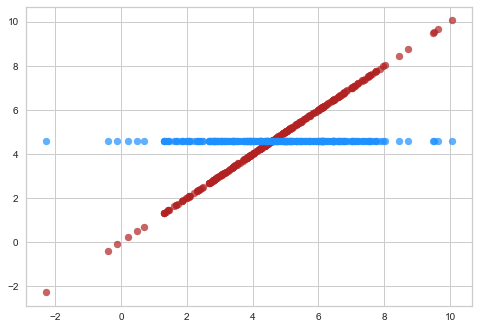

In [203]:
ShowYTrueYPredError(dummy_regr, X_test, y_test)

<u>J'enregistre également la MSE de ma baseline afin de pouvoir l'afficher <br />
dans des graphiques où on affichera l'erreur des algorithmes en fonction de certains paramètres</u> :

In [204]:
baseline_error = mean_squared_error(y_test, dummy_regr.predict(X_test))

#### KNN Linéaire

Version Linéaire de l'algorithme des K plus proches voisins.

Je test l'algortithme avec différentes valeurs de k,<br /> 
allant de k = 1 à k = 49.<br />
Je procède cette fois-ci à une cross-validation.<br />
J'affiche ensuite le score du train-set et du validation-set en fonction de k.

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass param_name=n_neighbors, param_range=[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


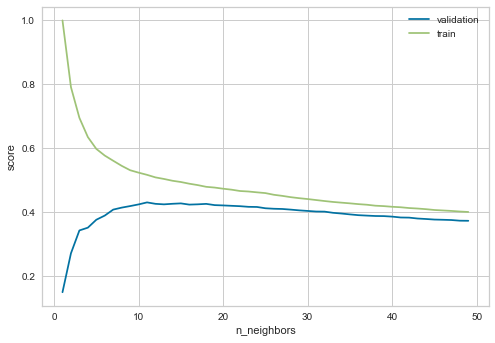

In [205]:
knn = KNeighborsRegressor()
k = np.arange(1, 50)

train_score, val_score = validation_curve(knn,
                                          X_train,
                                          y_train,
                                          'n_neighbors',
                                          k,
                                          cv=5)

plt.plot(k,val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

On observe un maximum pour le score du validation-set entre k=15 et k=17.

<u>Je réalise maintenant une recherche des meilleurs *hyperparamètres*<br />
avec **GridSearchCV** en testant les autres *hyperparamètres* existants</u> :

In [206]:
param_grid = {'n_neighbors': np.arange(1,20),
              'metric': ['euclidean', 'manhattan'],
              'weights': ['uniform', 'distance']}
grid = GridSearchCV(KNeighborsRegressor(), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

knn_opti = grid.best_estimator_

Meilleurs paramètres: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}
Meilleur score: 0.4538680630959376


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [207]:
dictAlgoScore['KNeighborsRegressor'] = displayMetrics(knn_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.46
     Mean Absolute Error---------------------1.05
     Mean Square Error-----------------------1.9
Root Mean Square Error-----------------------1.38
Process Time---------------------------------17.7s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

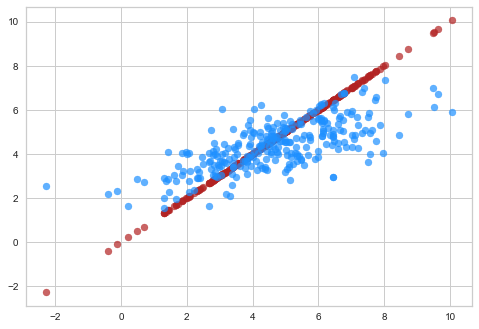

In [208]:
ShowYTrueYPredError(knn_opti, X_test, y_test)

#### Regression Ridge

<u>La régression Ridge est un régression linéaire</u> avec une contrainte **quadratique** sur les coefficients. <br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La Régression Ridge va appliquer des pénalités aux variables corrélées <br />
et va appliquer aux variables corrélées le même poids à chacune d'entre-elles. <br />
De cette façon, les variables corrélées n'auront pas plus d'influence <br />
qu'une variable seule non corrélée avec les autres variables du jeu de données.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Ridge** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [209]:
ridge = Ridge(random_state=RS)

n_alphas = 1000
alphas = np.logspace(-5,6, n_alphas)

coefs = []
errors = []

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)
    errors.append(np.mean((ridge.predict(X_test) - y_test) ** 2))

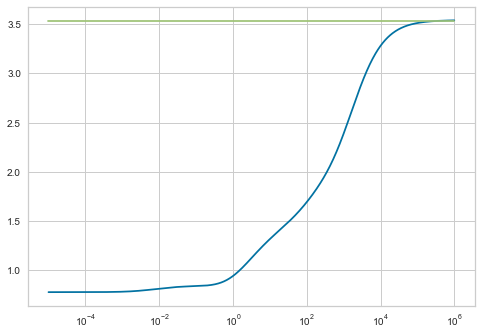

In [210]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**6], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [211]:
np.argmin(errors)

0

In [212]:
errors[np.argmin(errors)]

0.7777750078238473

In [213]:
alphas[np.argmin(errors)]

1e-05

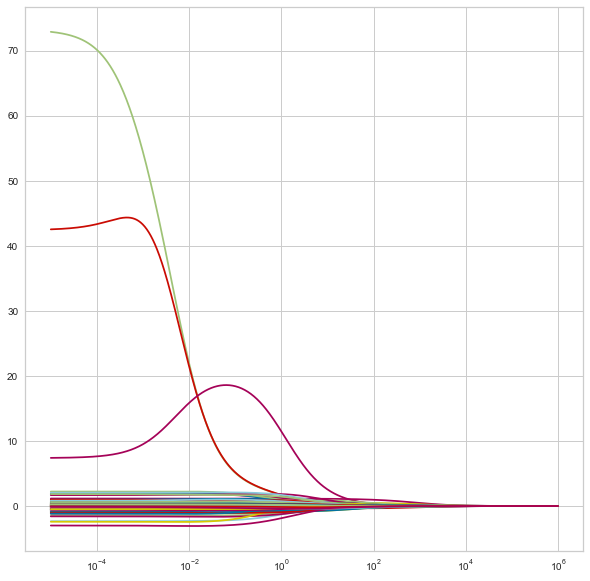

In [214]:
plt.figure(figsize=(10,10))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [215]:
param_grid = {'alpha': np.logspace(-5, 10, 200)}
grid = GridSearchCV(Ridge(random_state=RS), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

ridge_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.2800503894183625}
Meilleur score: 0.6977004503260751


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [216]:
dictAlgoScore['Ridge'] = displayMetrics(ridge_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.76
     Mean Absolute Error---------------------0.71
     Mean Square Error-----------------------0.85
Root Mean Square Error-----------------------0.92
Process Time---------------------------------5.63s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

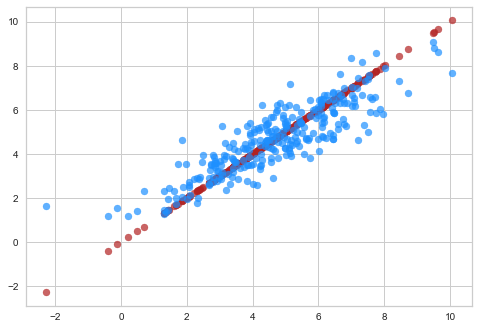

In [217]:
ShowYTrueYPredError(ridge_opti, X_test, y_test)

#### Regression Lasso

<u>La régression Lasso est une régression linéaire</u> avec une contrainte **linéaire** sur les coefficients.<br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La **Régression Lasso** va appliquer des pénalités aux variables corrélées <br />
et ne conserver qu'une seule variable parmi les variables corrélées <br />
et passer le coefficiant des autres variables corrélées à 0.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Lasso** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [218]:
n_alphas = 300
alphas = np.logspace(-5, 1, n_alphas)
lasso = Lasso(fit_intercept=False,
              random_state=RS)

coefs = []
errors = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    errors.append(np.mean((lasso.predict(X_test) - y_test) ** 2))

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 617.0124366339478, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 617.0497888528521, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 617.0888711468601, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 619.3197160586502, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 619.4624002350037, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 619.6113453253115, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 626.9929627049252, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 627.374318934272, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 627.7685908619536, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 614.717804403766, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 610.9990918603467, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 606.3963009339158, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 431.48225263418925, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 418.8477684107258, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 404.85957882395553, tolerance: 2.7746509182127324
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

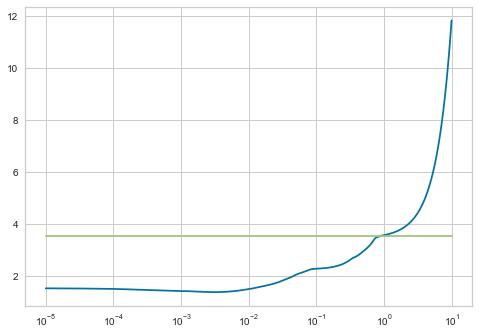

In [219]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**1], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [220]:
np.argmin(errors)

124

In [221]:
errors[np.argmin(errors)]

1.3923724454896795

In [222]:
alphas[np.argmin(errors)]

0.00307818214256508

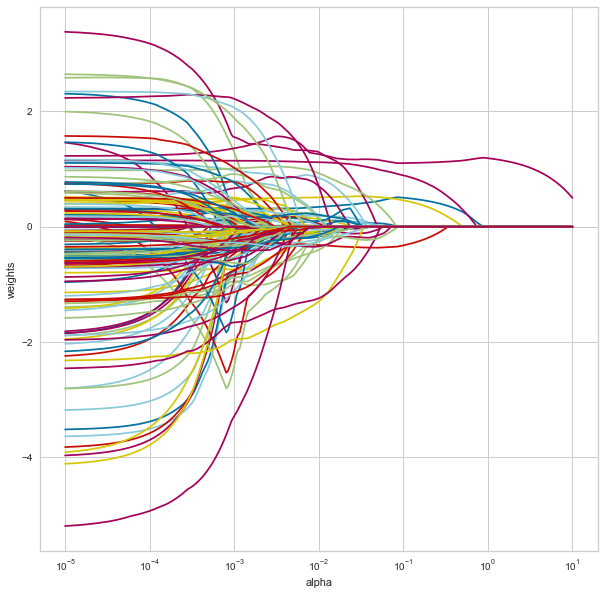

In [223]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.axis('tight')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [224]:
param_grid = {'alpha': np.logspace(-5, 10, 300)}
grid = GridSearchCV(Lasso(random_state=RS), param_grid, cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

lasso_opti = grid.best_estimator_

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.7305528170422235, tolerance: 0.3178511728070718
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1294012058710905, tolerance: 0.32966237050977754
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.985163322714982, tolerance: 0.3338416367293735
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergenc

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.15492866658178, tolerance: 0.3338416367293735
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.35266312451347, tolerance: 0.3338416367293735
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.570942161402797, tolerance: 0.3338416367293735
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

Meilleurs paramètres: {'alpha': 0.002872063117797828}
Meilleur score: 0.7302890543001948


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [225]:
dictAlgoScore['Lasso'] = displayMetrics(lasso_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.78
     Mean Absolute Error---------------------0.68
     Mean Square Error-----------------------0.79
Root Mean Square Error-----------------------0.89
Process Time---------------------------------16.22s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

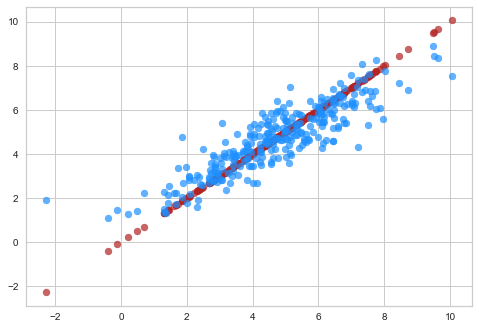

In [226]:
ShowYTrueYPredError(lasso_opti, X_test, y_test)

#### Support Vector Regression (SVR)

Les algorithmes Support Vector Machine sont généralement utilisés dans des problèmes de classification.<br />
L'idée de cet algorithme est de trouver un **hyperplan** qui divise notre jeu de données en deux.<br />
SVR est la version Regression du Support Vector Machine (SVM).

Cet algorithme fonctionne bien sur de petits dataset.<br />
Son entrainement peut-être long et il est sensible aux Outliers.

<u>Premier essai avec les paramètres par défaut</u> :

In [227]:
svr = SVR()
svr.fit(X_train, y_train)
displayMetrics(svr, X_test, y_test)

##################################################
R²-------------------------------------------0.63
     Mean Absolute Error---------------------0.9
     Mean Square Error-----------------------1.29
Root Mean Square Error-----------------------1.13
##################################################


{'R²': 0.63, 'MAE': 0.9, 'MSE': 1.29, 'RMSE': 1.13, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **RandomizedSearchCV**</u> :<br />
*J'utilise RandomizedSearchCV car la recherche des meilleurs hyperparamètres est particulièrement longue avec **SVR***

In [228]:
param_grid = {'kernel': ['linear','rbf'],
              'degree': range(3,5),
              'gamma' : np.logspace(-2, 1, 4),
              'C': np.logspace(-3, 3, 7)}

grid = RandomizedSearchCV(SVR(), 
                          param_grid, 
                          cv=5, 
                          scoring='r2',
                          n_iter = 10)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)


svr_opti = grid.best_estimator_

Meilleurs paramètres: {'kernel': 'linear', 'gamma': 1.0, 'degree': 4, 'C': 10.0}
Meilleur score: 0.6674123054513694


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [229]:
dictAlgoScore['SVR'] = displayMetrics(svr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.75
     Mean Absolute Error---------------------0.71
     Mean Square Error-----------------------0.88
Root Mean Square Error-----------------------0.94
Process Time---------------------------------16.36s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

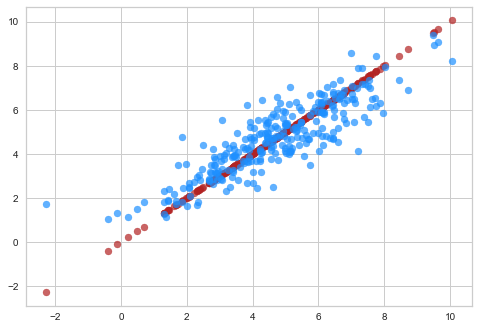

In [230]:
ShowYTrueYPredError(svr_opti, X_test, y_test)

#### Regression Ridge à noyau (Kernel Ridge)

La Regression Ridge à noyau est une regression ridge <br />
à laquelle nous appliquons l'astuce du noyau.<br />
L'astuce du noyau (Kernel Trick) est une méthode qui permet <br />
d'utiliser un classifieur linéaire pour résoudre un problème non linéaire.<br />
L'idée est de transformer l'espace de représentation des données d'entrée <br />
en un espace de plus grande dimension.<br />
La discrimination linéaire dans l'espace de grande dimension<br /> 
(appelé aussi espace de redescription) est équivalente à une discrimination <br />
non linéaire dans l'espace d'origine.

<u>Premier essai avec les paramètres par défaut</u> :

In [231]:
kr = KernelRidge()
kr.fit(X_train, y_train)
displayMetrics(kr, X_test, y_test)

##################################################
R²-------------------------------------------0.67
     Mean Absolute Error---------------------0.83
     Mean Square Error-----------------------1.16
Root Mean Square Error-----------------------1.08
##################################################


{'R²': 0.67, 'MAE': 0.83, 'MSE': 1.16, 'RMSE': 1.08, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [232]:
param_grid = {'kernel':['rbf','linear','poly'],
              'degree':[3,4],
              'alpha': np.logspace(-2, 2, 5),
              'gamma': np.logspace(-2, 1, 4)}

grid = GridSearchCV(KernelRidge(), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

kr_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.01, 'degree': 3, 'gamma': 0.01, 'kernel': 'rbf'}
Meilleur score: 0.7028755311020701


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [233]:
dictAlgoScore['KernelRidge'] = displayMetrics(kr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.75
     Mean Absolute Error---------------------0.72
     Mean Square Error-----------------------0.87
Root Mean Square Error-----------------------0.93
Process Time---------------------------------15.54s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

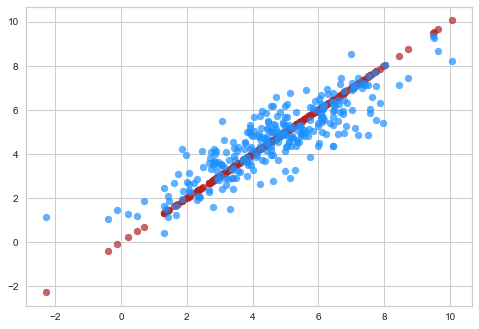

In [234]:
ShowYTrueYPredError(kr_opti, X_test, y_test)

#### Arbre de Décision Aléatoire (Random Forest)

L'algorithme **Random Forest** fait partie des algorithmes qui utilisent <br />
la méthode du **bagging** et fait donc partie des algorithmes **ensemblistes**.

<u>Rappel sur le bagging</u> :
Bagging est une contraction de **Bootstrap Aggregation**.<br />
Le bagging a pour objectif de réduire la variance de l’estimateur (les problèmes liés <br />
au surapprentissage, et donc qu'une petite modification en entrée (jeu de données) entraîne <br />
de grandes différences en sortie).


L'idée est de créer plusieurs entités d'un même modèle <br />
et d'entrainer chacune de ces entités sur une portion aléatoire <br />
de notre jeu de données.<br />
Pour cela on utilise une technique d'échantillonnage appelé **Bootstrapping**.<br />
Cette technique consiste à replacer après chaque tirage au sort, <br />
les données qui ont été sélectionnées dans notre jeu de données (on parle <br />
alors de tirage avec remise).<br />
De cette manière, on obtient un groupe de modèles diversifiés (ils n'ont <br />
pas tous été nourris avec les mêmes données mais ils partagent cependant <br />
certaines connaissances en commun) ce qui nous permet d’obtenir des majorités <br />
en faveur des bonnes réponses.<br />
On regroupe ensuite les résultats de chaque modèle pour faire notre prédiction finale.<br />
**Random Forest** est l'algorithme le plus connu utilisant cette technique.<br />
Il utilise comme modèle de base, l'arbre de décision.<br />
Le nom de **Random Forest** est logiquement choisi comme tel car nous générons <br />
des *arbres* de décision *aléatoirement*. <br />
En cela nous créons donc une *forêt* aléatoire.

<u>Entrainement avec les paramètres par défaut et n_estimator = 1000</u> :

In [235]:
rfr = RandomForestRegressor(n_estimators=1000, 
                            n_jobs=-1,
                            random_state=RS)
pcStart = perf_counter()
rfr.fit(X_train, y_train)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [236]:
dictAlgoScore['RandomForestRegressor'] = displayMetrics(rfr, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.76
     Mean Absolute Error---------------------0.68
     Mean Square Error-----------------------0.84
Root Mean Square Error-----------------------0.92
Process Time---------------------------------1.49s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

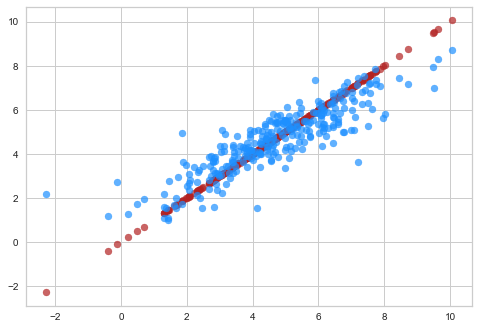

In [237]:
ShowYTrueYPredError(rfr, X_test, y_test)

#### AdaBoost

AdaBoost est une méthode de Boosting et fait donc <br />
également partie des algorithmes ensemblistes.

L'idée est d'entraîner l'un après l'autre plusieurs modèle relativement faibles <br />
en demandant à chaque modèle d'essayer de corriger les erreurs effectuées par son prédecesseur.<br />
On obtient ainsi un ensemble de modèles complèmentaires dans lequel <br />
les faiblesses des uns sont compensées par les forces des autres.

Ici les modèles sont entraînés en série.<br />
Chaque modèle est en situation d'underfitting mais en les construisant <br />
les uns par dessus les autres, on est capable de réduire le biais général de tous ces modèles.

Adaboost est un algorithme de boosting qui s’appuie sur ce principe, <br />
avec un paramètre de mise à jour adaptatif permettant de donner plus <br />
d’importance aux valeurs difficiles à prédire, donc en boostant les régresseurs<br />
qui réussissent quand d’autres ont échoué.

<u>Entrainement avec les paramètres par défaut</u> :

In [238]:
adb = AdaBoostRegressor(random_state=RS)
adb.fit(X_train, y_train)
displayMetrics(adb, X_test, y_test)

##################################################
R²-------------------------------------------0.66
     Mean Absolute Error---------------------0.83
     Mean Square Error-----------------------1.21
Root Mean Square Error-----------------------1.1
##################################################


{'R²': 0.66, 'MAE': 0.83, 'MSE': 1.21, 'RMSE': 1.1, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [239]:
param_grid = {"base_estimator__max_depth" : np.linspace(10,100,10),
              "n_estimators": [100, 200, 300]
             }


DTR = DecisionTreeRegressor(random_state=RS)

ABR = AdaBoostRegressor(base_estimator = DTR,
                        random_state=RS)


grid = GridSearchCV(ABR,
                    param_grid=param_grid,
                    scoring = 'r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

adb_opti = grid.best_estimator_

Meilleurs paramètres: {'base_estimator__max_depth': 30.0, 'n_estimators': 200}
Meilleur score: 0.7197398024618057


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [240]:
dictAlgoScore['AdaBoostRegressor'] = displayMetrics(adb_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.78
     Mean Absolute Error---------------------0.65
     Mean Square Error-----------------------0.79
Root Mean Square Error-----------------------0.89
Process Time---------------------------------288.71s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

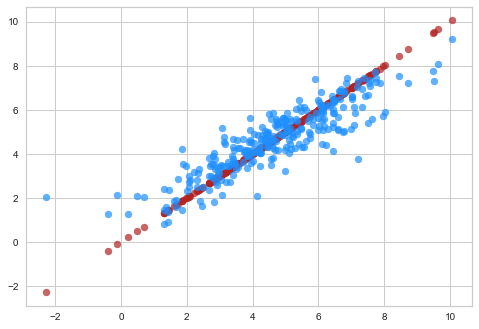

In [241]:
ShowYTrueYPredError(adb_opti, X_test, y_test)

#### GradientBoosting

Comme son nom l'indique, **GradientBoosting** est un algorithme de **boosting**.<br />
En celà il reprend le même principe de fonctionnement qu'*AdaBoost*.

**GradiantBoosting** diffère d'*AdaBoost* sur sa fonction de perte, <br />
qui s'appuie sur la <u>descente de gradient</u>.

La perte représente la pénalité générée lorsque l'estimation par le modèle <br />
n'est pas parfaitement égale à la cible.<br />
Une fonction de perte quantifie cette pénalité sous la forme d'une valeur individuelle.

La descente de gradient est un algorithme qui permet de trouver le minimum d’une fonction.<br />
Le calcul de la dérivée en un point d'une fonction nous permet de définir <br />
la pente de cette fonction et donc de définir le sens dans lequel il faut<br />
se déplacer sur cette fonction pour se rapprocher de son minimum (local).

<u>Entrainement avec les paramètres par défaut</u> :

In [242]:
gbr = GradientBoostingRegressor(random_state=RS)
gbr.fit(X_train, y_train)
displayMetrics(gbr, X_test, y_test)

##################################################
R²-------------------------------------------0.8
     Mean Absolute Error---------------------0.63
     Mean Square Error-----------------------0.7
Root Mean Square Error-----------------------0.84
##################################################


{'R²': 0.8, 'MAE': 0.63, 'MSE': 0.7, 'RMSE': 0.84, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [243]:
param_grid = {'learning_rate': [0.1,0.2,0.3],
              'n_estimators':[100,200,300,400,500],
              'subsample': [0.4,0.5,0.6,1],
              'max_depth': [2,3]}

grid = GridSearchCV(GradientBoostingRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

gbr_opti = grid.best_estimator_

Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 300, 'subsample': 0.6}
Meilleur score: 0.7860260259456873


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [244]:
dictAlgoScore['GradientBoostingRegressor'] = displayMetrics(gbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.81
     Mean Absolute Error---------------------0.63
     Mean Square Error-----------------------0.66
Root Mean Square Error-----------------------0.81
Process Time---------------------------------270.79s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

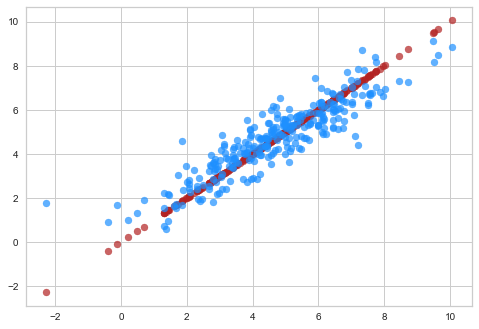

In [245]:
ShowYTrueYPredError(gbr_opti, X_test, y_test)

#### XGBoost

**XGBoost** signifie *Extreme Gradient Boosting*.<br />
Il est assez similaire à l'algorithme *GradientBoosting*.<br />
Il s'agit d'une implémentation spécifique du modèle *Gradient Boosting*<br />
qui utilise des **approximations plus précises** pour trouver<br/>
**le meilleur modèle d'arbre de décision**.<br />
Les deux algorithmes suivent le principe de **descente de gradient**.

**XGBoost** est plus rapide à l'exécution que *GradientBoosting*.

<u>Liste non exaustive des avantages de XGBoost sur GradientBoosting</u> : 
 - **XGBoost** utilise les techniques de **régularisation (L1 et L2)** <br />
   pour diminuer le surapprentissage.
 - Implémente un traitement **parallèle** dans la génération des arbres <br />
   de décision et est donc plus rapide à l’entraînement que *GradientBoosting*
   - Il s'agit bien là d'un traitement en parallèle <br />
     dans un algorithme de boosting, donc séquentiel


<u>Entrainement avec les paramètres par défaut</u> :

In [246]:
xgbr = XGBRegressor(random_state=RS)
xgbr.fit(X_train, y_train)


displayMetrics(xgbr, X_test, y_test)

##################################################
R²-------------------------------------------0.78
     Mean Absolute Error---------------------0.66
     Mean Square Error-----------------------0.76
Root Mean Square Error-----------------------0.87
##################################################


{'R²': 0.78, 'MAE': 0.66, 'MSE': 0.76, 'RMSE': 0.87, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [247]:
param_grid = {'eta':[0.1,0.2],
              'gamma':np.linspace(0,0.2,3),
              'max_depth': range(2,6,2),
              'subsample': np.linspace(0.5,0.8,4),
              'colsample_bytree': np.linspace(0.5,0.8,4)
             }


grid = GridSearchCV(XGBRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2'
                   )

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

xgbr_opti = grid.best_estimator_

Meilleurs paramètres: {'colsample_bytree': 0.7000000000000001, 'eta': 0.1, 'gamma': 0.0, 'max_depth': 4, 'subsample': 0.8}
Meilleur score: 0.7750880844318286


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [248]:
dictAlgoScore['XGBRegressor'] = displayMetrics(xgbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.81
     Mean Absolute Error---------------------0.62
     Mean Square Error-----------------------0.66
Root Mean Square Error-----------------------0.81
Process Time---------------------------------52.91s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

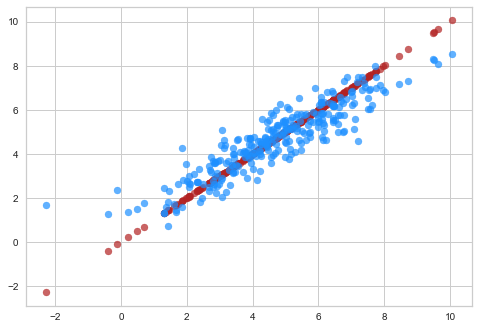

In [249]:
ShowYTrueYPredError(xgbr_opti, X_test, y_test)

#### Affichage des résulats des différents algorithmes

In [250]:
displayBestAlgo(dictAlgoScore, 'R²')

###########################################################################
Classement des différents algorithmes testés selon la métric:--------- R²
Les algorithmes testés sont affichées du plus au moins performant.
##################################################
1 GradientBoostingRegressor------------ R²: 0.81
2 XGBRegressor------------------------- R²: 0.81
3 Lasso-------------------------------- R²: 0.78
4 AdaBoostRegressor-------------------- R²: 0.78
5 Ridge-------------------------------- R²: 0.76
6 RandomForestRegressor---------------- R²: 0.76
7 SVR---------------------------------- R²: 0.75
8 KernelRidge-------------------------- R²: 0.75
9 KNeighborsRegressor------------------ R²: 0.46
10 DummyRegressor----------------------- R²: -0.0
##################################################
Algorithme testé-------------- GradientBoostingRegressor
R²-------------------------------------------0.81
     Mean Absolute Error---------------------0.63
     Mean Square Error-----------

### Label = **SiteEnergyUse**

#### Initialisation du DataFrame

In [251]:
df = df_Energy

#### Initialisation du dictionnaire destiné à enregistrer <br />les performances des différents algorithmes

In [252]:
dictAlgoScore = {}

#### Sélection des Features et Label

In [253]:
X = df.drop(['SiteEnergyUse','ENERGYSTARScore'], axis=1)

y = df.SiteEnergyUse

#### Création du train set et du test set

In [254]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RS)

#### Application de modèle Dummy pour établir une baseline

In [255]:
dummy_regr = DummyRegressor(strategy='mean')
pcStart = perf_counter()
dummy_regr.fit(X,y)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [256]:
dictAlgoScore['DummyRegressor'] = displayMetrics(dummy_regr, X_test, y_test, pcStart, pcEnd)

##################################################
R²--------------------------------------------0.0
     Mean Absolute Error---------------------1.36
     Mean Square Error-----------------------2.85
Root Mean Square Error-----------------------1.69
Process Time---------------------------------0.0s
##################################################


<u>Affichage des prédictions '**y_pred**' en bleu en fonction <br />
    de la valeur réelle de y '**y_true**' en rouge</u> :

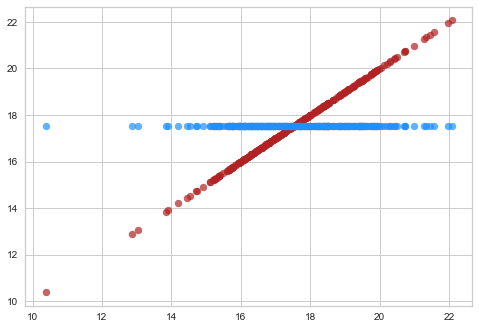

In [257]:
ShowYTrueYPredError(dummy_regr, X_test, y_test)

<u>J'enregistre également la MSE de ma baseline afin de pouvoir l'afficher <br />
dans des graphiques où on affichera l'erreur des algorithmes en fonction de certains paramètres</u> :

In [258]:
baseline_error = mean_squared_error(y_test, dummy_regr.predict(X_test))

#### KNN Linéaire

Version Linéaire de l'algorithme des K plus proches voisins.

Je test l'algortithme avec différentes valeurs de k,<br /> 
allant de k = 1 à k = 49.<br />
Je procède cette fois-ci à une cross-validation.<br />
J'affiche ensuite le score du train-set et du validation-set en fonction de k.

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass param_name=n_neighbors, param_range=[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


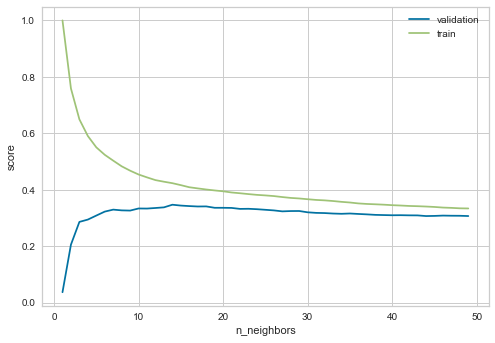

In [259]:
knn = KNeighborsRegressor()
k = np.arange(1, 50)

train_score, val_score = validation_curve(knn,
                                          X_train,
                                          y_train,
                                          'n_neighbors',
                                          k,
                                          cv=5)

plt.plot(k,val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

On observe un maximum pour le score du validation-set entre k=15 et k=17.

<u>Je réalise maintenant une recherche des meilleurs *hyperparamètres*<br />
avec **GridSearchCV** en testant les autres *hyperparamètres* existants</u> :

In [260]:
param_grid = {'n_neighbors': np.arange(1,20),
              'metric': ['euclidean', 'manhattan'],
              'weights': ['uniform', 'distance']}
grid = GridSearchCV(KNeighborsRegressor(), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

knn_opti = grid.best_estimator_

Meilleurs paramètres: {'metric': 'manhattan', 'n_neighbors': 19, 'weights': 'distance'}
Meilleur score: 0.3865348901629169


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [261]:
dictAlgoScore['KNeighborsRegressor'] = displayMetrics(knn_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.43
     Mean Absolute Error---------------------0.96
     Mean Square Error-----------------------1.62
Root Mean Square Error-----------------------1.27
Process Time---------------------------------15.56s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

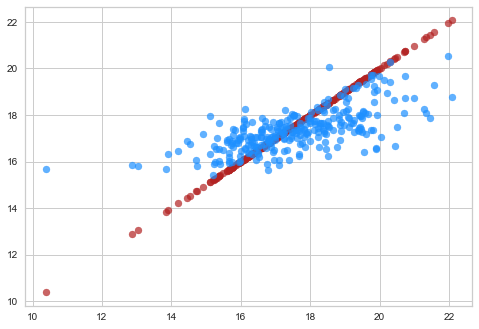

In [262]:
ShowYTrueYPredError(knn_opti, X_test, y_test)

#### Regression Ridge

<u>La régression Ridge est un régression linéaire</u> avec une contrainte **quadratique** sur les coefficients. <br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La Régression Ridge va appliquer des pénalités aux variables corrélées <br />
et va appliquer aux variables corrélées le même poids à chacune d'entre-elles. <br />
De cette façon, les variables corrélées n'auront pas plus d'influence <br />
qu'une variable seule non corrélée avec les autres variables du jeu de données.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Ridge** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [263]:
ridge = Ridge(random_state=RS)

n_alphas = 1000
alphas = np.logspace(-5,6, n_alphas)

coefs = []
errors = []

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)
    errors.append(np.mean((ridge.predict(X_test) - y_test) ** 2))

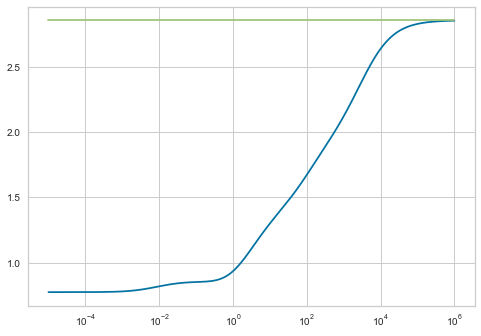

In [264]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**6], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [265]:
np.argmin(errors)

0

In [266]:
errors[np.argmin(errors)]

0.7760685932470769

In [267]:
alphas[np.argmin(errors)]

1e-05

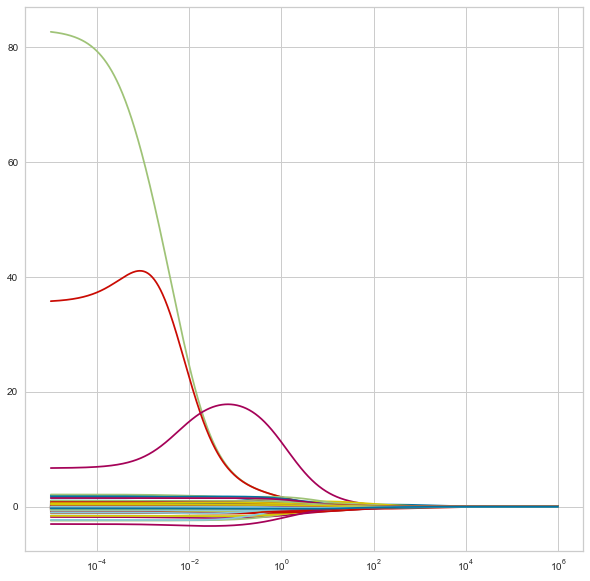

In [268]:
plt.figure(figsize=(10,10))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [269]:
param_grid = {'alpha': np.logspace(-5, 10, 200)}
grid = GridSearchCV(Ridge(random_state=RS), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

ridge_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 1e-05}
Meilleur score: 0.6439029488861758


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [270]:
dictAlgoScore['Ridge'] = displayMetrics(ridge_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.73
     Mean Absolute Error---------------------0.65
     Mean Square Error-----------------------0.78
Root Mean Square Error-----------------------0.88
Process Time---------------------------------5.4s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

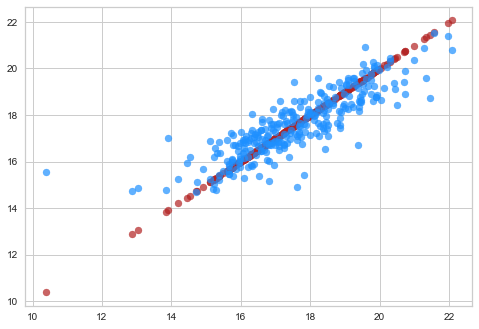

In [271]:
ShowYTrueYPredError(ridge_opti, X_test, y_test)

#### Regression Lasso

<u>La régression Lasso est une régression linéaire</u> avec une contrainte **linéaire** sur les coefficients.<br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La **Régression Lasso** va appliquer des pénalités aux variables corrélées <br />
et ne conserver qu'une seule variable parmi les variables corrélées <br />
et passer le coefficiant des autres variables corrélées à 0.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Lasso** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [272]:
n_alphas = 300
alphas = np.logspace(-5, 1, n_alphas)
lasso = Lasso(fit_intercept=False,
              random_state=RS)

coefs = []
errors = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    errors.append(np.mean((lasso.predict(X_test) - y_test) ** 2))

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 609.4166912886325, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 609.4400106637506, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 609.4644139300292, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 610.8635958720436, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 610.952614646924, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 611.0455303728389, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 615.9802976948499, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 616.2387337368987, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 616.483641636504, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 609.6102178240969, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 607.1702450171778, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 604.3403407989352, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 491.8319237733259, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 481.1639486657279, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 472.0375685690745, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.96486974736627, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82.17540268536368, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82.37750556931769, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74.96499505220345, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.13472093585392, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 71.0556131621554, tolerance: 35.389349786450424
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

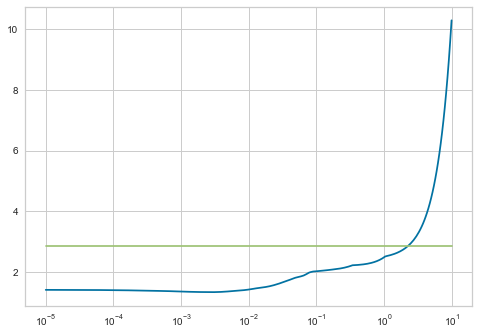

In [273]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**1], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [274]:
np.argmin(errors)

123

In [275]:
errors[np.argmin(errors)]

1.3242154840648865

In [276]:
alphas[np.argmin(errors)]

0.0029391883986468873

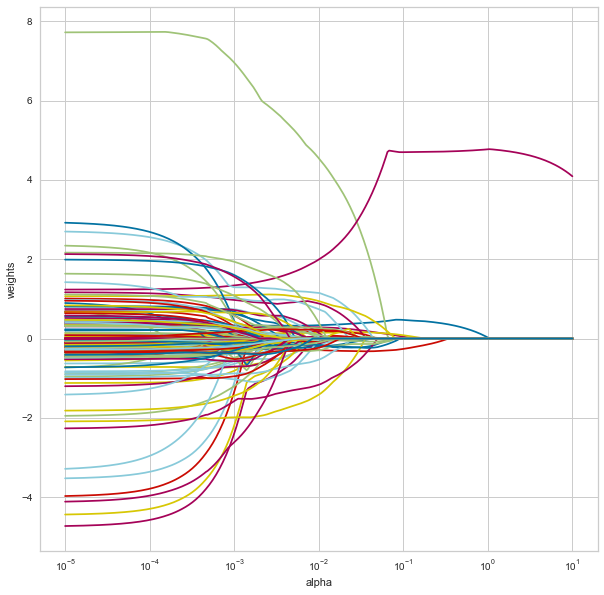

In [277]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.axis('tight')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [278]:
param_grid = {'alpha': np.logspace(-5, 10, 300)}
grid = GridSearchCV(Lasso(random_state=RS), param_grid, cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

lasso_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.00227960463731898}
Meilleur score: 0.6522384161996516


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [279]:
dictAlgoScore['Lasso'] = displayMetrics(lasso_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.71
     Mean Absolute Error---------------------0.67
     Mean Square Error-----------------------0.82
Root Mean Square Error-----------------------0.9
Process Time---------------------------------11.51s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

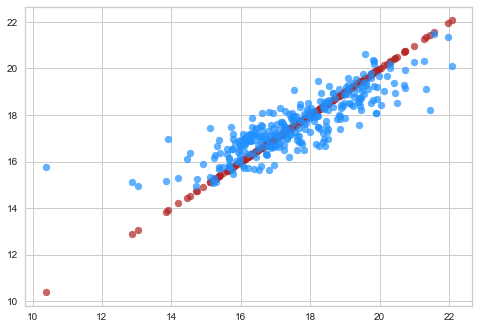

In [280]:
ShowYTrueYPredError(lasso_opti, X_test, y_test)

#### Support Vector Regression (SVR)

Les algorithmes Support Vector Machine sont généralement utilisés dans des problèmes de classification.<br />
L'idée de cet algorithme est de trouver un **hyperplan** qui divise notre jeu de données en deux.<br />
SVR est la version Regression du Support Vector Machine (SVM).

Cet algorithme fonctionne bien sur de petits dataset.<br />
Son entrainement peut-être long et il est sensible aux Outliers.

<u>Premier essai avec les paramètres par défaut</u> :

In [281]:
svr = SVR()
svr.fit(X_train, y_train)
displayMetrics(svr, X_test, y_test)

##################################################
R²-------------------------------------------0.55
     Mean Absolute Error---------------------0.89
     Mean Square Error-----------------------1.27
Root Mean Square Error-----------------------1.13
##################################################


{'R²': 0.55, 'MAE': 0.89, 'MSE': 1.27, 'RMSE': 1.13, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **RandomizedSearchCV**</u> :<br />
*J'utilise RandomizedSearchCV car la recherche des meilleurs hyperparamètres est particulièrement longue avec **SVR***

In [282]:
param_grid = {'kernel': ['linear','rbf'],
              'degree': range(3,5),
              'gamma' : np.logspace(-2, 1, 4),
              'C': np.logspace(-3, 3, 7)}

grid = RandomizedSearchCV(SVR(), 
                          param_grid, 
                          cv=5, 
                          scoring='r2',
                          n_iter = 10)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)


svr_opti = grid.best_estimator_

Meilleurs paramètres: {'kernel': 'linear', 'gamma': 10.0, 'degree': 4, 'C': 10.0}
Meilleur score: 0.6138844778881113


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [283]:
dictAlgoScore['SVR'] = displayMetrics(svr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.7
     Mean Absolute Error---------------------0.69
     Mean Square Error-----------------------0.87
Root Mean Square Error-----------------------0.93
Process Time---------------------------------13.21s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

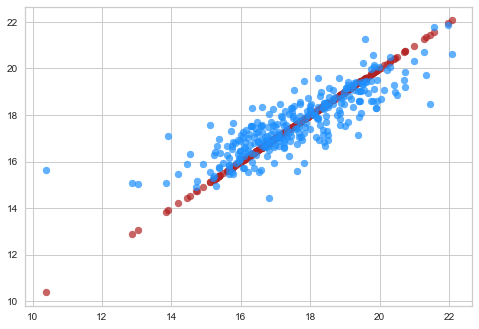

In [284]:
ShowYTrueYPredError(svr_opti, X_test, y_test)

#### Regression Ridge à noyau (Kernel Ridge)

La Regression Ridge à noyau est une regression ridge <br />
à laquelle nous appliquons l'astuce du noyau.<br />
L'astuce du noyau (Kernel Trick) est une méthode qui permet <br />
d'utiliser un classifieur linéaire pour résoudre un problème non linéaire.<br />
L'idée est de transformer l'espace de représentation des données d'entrée <br />
en un espace de plus grande dimension.<br />
La discrimination linéaire dans l'espace de grande dimension<br /> 
(appelé aussi espace de redescription) est équivalente à une discrimination <br />
non linéaire dans l'espace d'origine.

<u>Premier essai avec les paramètres par défaut</u> :

In [285]:
kr = KernelRidge()
kr.fit(X_train, y_train)
displayMetrics(kr, X_test, y_test)

##################################################
R²-------------------------------------------0.63
     Mean Absolute Error---------------------0.78
     Mean Square Error-----------------------1.07
Root Mean Square Error-----------------------1.03
##################################################


{'R²': 0.63, 'MAE': 0.78, 'MSE': 1.07, 'RMSE': 1.03, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [286]:
param_grid = {'kernel':['rbf','linear','poly'],
              'degree':[3,4],
              'alpha': np.logspace(-2, 2, 5),
              'gamma': np.logspace(-2, 1, 4)}

grid = GridSearchCV(KernelRidge(), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

kr_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.01, 'degree': 3, 'gamma': 0.01, 'kernel': 'rbf'}
Meilleur score: 0.6106094875182866


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [287]:
dictAlgoScore['KernelRidge'] = displayMetrics(kr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.69
     Mean Absolute Error---------------------0.72
     Mean Square Error-----------------------0.89
Root Mean Square Error-----------------------0.95
Process Time---------------------------------15.65s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

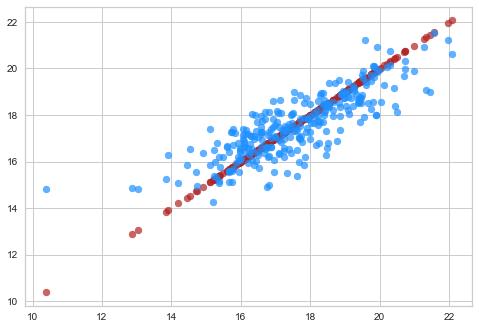

In [288]:
ShowYTrueYPredError(kr_opti, X_test, y_test)

#### Arbre de Décision Aléatoire (Random Forest)

L'algorithme **Random Forest** fait partie des algorithmes qui utilisent <br />
la méthode du **bagging** et fait donc partie des algorithmes **ensemblistes**.

<u>Rappel sur le bagging</u> :
Bagging est une contraction de **Bootstrap Aggregation**.<br />
Le bagging a pour objectif de réduire la variance de l’estimateur (les problèmes liés <br />
au surapprentissage, et donc qu'une petite modification en entrée (jeu de données) entraîne <br />
de grandes différences en sortie).


L'idée est de créer plusieurs entités d'un même modèle <br />
et d'entrainer chacune de ces entités sur une portion aléatoire <br />
de notre jeu de données.<br />
Pour cela on utilise une technique d'échantillonnage appelé **Bootstrapping**.<br />
Cette technique consiste à replacer après chaque tirage au sort, <br />
les données qui ont été sélectionnées dans notre jeu de données (on parle <br />
alors de tirage avec remise).<br />
De cette manière, on obtient un groupe de modèles diversifiés (ils n'ont <br />
pas tous été nourris avec les mêmes données mais ils partagent cependant <br />
certaines connaissances en commun) ce qui nous permet d’obtenir des majorités <br />
en faveur des bonnes réponses.<br />
On regroupe ensuite les résultats de chaque modèle pour faire notre prédiction finale.<br />
**Random Forest** est l'algorithme le plus connu utilisant cette technique.<br />
Il utilise comme modèle de base, l'arbre de décision.<br />
Le nom de **Random Forest** est logiquement choisi comme tel car nous générons <br />
des *arbres* de décision *aléatoirement*. <br />
En cela nous créons donc une *forêt* aléatoire.

<u>Entrainement avec les paramètres par défaut et n_estimator = 1000</u> :

In [289]:
rfr = RandomForestRegressor(n_estimators=1000, 
                            n_jobs=-1,
                            random_state=RS)
pcStart = perf_counter()
rfr.fit(X_train, y_train)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [290]:
dictAlgoScore['RandomForestRegressor'] = displayMetrics(rfr, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.7
     Mean Absolute Error---------------------0.67
     Mean Square Error-----------------------0.84
Root Mean Square Error-----------------------0.92
Process Time---------------------------------1.41s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

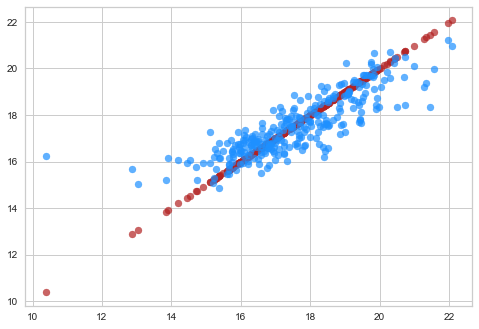

In [291]:
ShowYTrueYPredError(rfr, X_test, y_test)

#### AdaBoost

AdaBoost est une méthode de Boosting et fait donc <br />
également partie des algorithmes ensemblistes.

L'idée est d'entraîner l'un après l'autre plusieurs modèle relativement faibles <br />
en demandant à chaque modèle d'essayer de corriger les erreurs effectuées par son prédecesseur.<br />
On obtient ainsi un ensemble de modèles complèmentaires dans lequel <br />
les faiblesses des uns sont compensées par les forces des autres.

Ici les modèles sont entraînés en série.<br />
Chaque modèle est en situation d'underfitting mais en les construisant <br />
les uns par dessus les autres, on est capable de réduire le biais général de tous ces modèles.

Adaboost est un algorithme de boosting qui s’appuie sur ce principe, <br />
avec un paramètre de mise à jour adaptatif permettant de donner plus <br />
d’importance aux valeurs difficiles à prédire, donc en boostant les régresseurs<br />
qui réussissent quand d’autres ont échoué.

<u>Entrainement avec les paramètres par défaut</u> :

In [292]:
adb = AdaBoostRegressor(random_state=RS)
adb.fit(X_train, y_train)
displayMetrics(adb, X_test, y_test)

##################################################
R²-------------------------------------------0.62
     Mean Absolute Error---------------------0.77
     Mean Square Error-----------------------1.09
Root Mean Square Error-----------------------1.04
##################################################


{'R²': 0.62, 'MAE': 0.77, 'MSE': 1.09, 'RMSE': 1.04, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [293]:
param_grid = {"base_estimator__max_depth" : np.linspace(10,100,10),
              "n_estimators": [100, 200, 300]
             }


DTR = DecisionTreeRegressor(random_state=RS)

ABR = AdaBoostRegressor(base_estimator = DTR,
                        random_state=RS)


grid = GridSearchCV(ABR,
                    param_grid=param_grid,
                    scoring = 'r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

adb_opti = grid.best_estimator_

Meilleurs paramètres: {'base_estimator__max_depth': 40.0, 'n_estimators': 300}
Meilleur score: 0.6570407888342772


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [294]:
dictAlgoScore['AdaBoostRegressor'] = displayMetrics(adb_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.72
     Mean Absolute Error---------------------0.63
     Mean Square Error-----------------------0.8
Root Mean Square Error-----------------------0.9
Process Time---------------------------------279.99s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

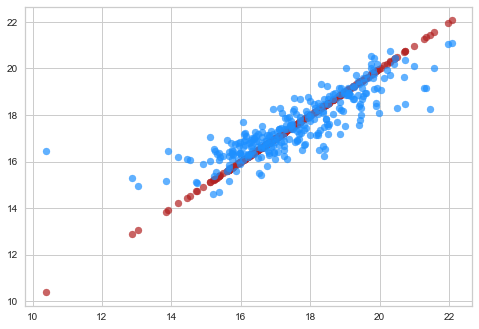

In [295]:
ShowYTrueYPredError(adb_opti, X_test, y_test)

#### GradientBoosting

Comme son nom l'indique, **GradientBoosting** est un algorithme de **boosting**.<br />
En celà il reprend le même principe de fonctionnement qu'*AdaBoost*.

**GradiantBoosting** diffère d'*AdaBoost* sur sa fonction de perte, <br />
qui s'appuie sur la <u>descente de gradient</u>.

La perte représente la pénalité générée lorsque l'estimation par le modèle <br />
n'est pas parfaitement égale à la cible.<br />
Une fonction de perte quantifie cette pénalité sous la forme d'une valeur individuelle.

La descente de gradient est un algorithme qui permet de trouver le minimum d’une fonction.<br />
Le calcul de la dérivée en un point d'une fonction nous permet de définir <br />
la pente de cette fonction et donc de définir le sens dans lequel il faut<br />
se déplacer sur cette fonction pour se rapprocher de son minimum (local).

<u>Entrainement avec les paramètres par défaut</u> :

In [296]:
gbr = GradientBoostingRegressor(random_state=RS)
gbr.fit(X_train, y_train)
displayMetrics(gbr, X_test, y_test)

##################################################
R²-------------------------------------------0.74
     Mean Absolute Error---------------------0.63
     Mean Square Error-----------------------0.74
Root Mean Square Error-----------------------0.86
##################################################


{'R²': 0.74, 'MAE': 0.63, 'MSE': 0.74, 'RMSE': 0.86, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [297]:
param_grid = {'learning_rate': [0.1,0.2,0.3],
              'n_estimators':[100,200,300,400,500],
              'subsample': [0.4,0.5,0.6,1],
              'max_depth': [2,3]}

grid = GridSearchCV(GradientBoostingRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

gbr_opti = grid.best_estimator_

Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 500, 'subsample': 1}
Meilleur score: 0.717104175200129


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [298]:
dictAlgoScore['GradientBoostingRegressor'] = displayMetrics(gbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.76
     Mean Absolute Error---------------------0.61
     Mean Square Error-----------------------0.69
Root Mean Square Error-----------------------0.83
Process Time---------------------------------254.88s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

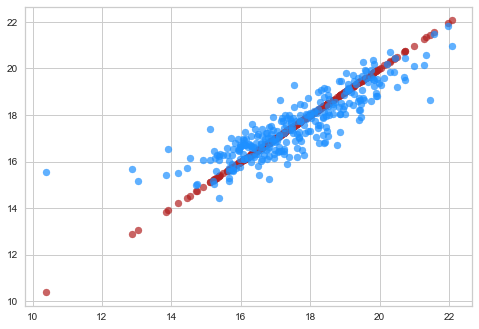

In [299]:
ShowYTrueYPredError(gbr_opti, X_test, y_test)

#### XGBoost

**XGBoost** signifie *Extreme Gradient Boosting*.<br />
Il est assez similaire à l'algorithme *GradientBoosting*.<br />
Il s'agit d'une implémentation spécifique du modèle *Gradient Boosting*<br />
qui utilise des **approximations plus précises** pour trouver<br/>
**le meilleur modèle d'arbre de décision**.<br />
Les deux algorithmes suivent le principe de **descente de gradient**.

**XGBoost** est plus rapide à l'exécution que *GradientBoosting*.

<u>Liste non exaustive des avantages de XGBoost sur GradientBoosting</u> : 
 - **XGBoost** utilise les techniques de **régularisation (L1 et L2)** <br />
   pour diminuer le surapprentissage.
 - Implémente un traitement **parallèle** dans la génération des arbres <br />
   de décision et est donc plus rapide à l’entraînement que *GradientBoosting*
   - Il s'agit bien là d'un traitement en parallèle <br />
     dans un algorithme de boosting, donc séquentiel


<u>Entrainement avec les paramètres par défaut</u> :

In [300]:
xgbr = XGBRegressor(random_state=RS)
xgbr.fit(X_train, y_train)


displayMetrics(xgbr, X_test, y_test)

##################################################
R²-------------------------------------------0.73
     Mean Absolute Error---------------------0.65
     Mean Square Error-----------------------0.77
Root Mean Square Error-----------------------0.88
##################################################


{'R²': 0.73, 'MAE': 0.65, 'MSE': 0.77, 'RMSE': 0.88, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [301]:
param_grid = {'eta':[0.1,0.2],
              'gamma':np.linspace(0,0.2,3),
              'max_depth': range(2,6,2),
              'subsample': np.linspace(0.5,0.8,4),
              'colsample_bytree': np.linspace(0.5,0.8,4)
             }


grid = GridSearchCV(XGBRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2'
                   )

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

xgbr_opti = grid.best_estimator_

Meilleurs paramètres: {'colsample_bytree': 0.7000000000000001, 'eta': 0.1, 'gamma': 0.1, 'max_depth': 4, 'subsample': 0.8}
Meilleur score: 0.7135021530567534


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [302]:
dictAlgoScore['XGBRegressor'] = displayMetrics(xgbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.75
     Mean Absolute Error---------------------0.63
     Mean Square Error-----------------------0.72
Root Mean Square Error-----------------------0.85
Process Time---------------------------------48.1s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

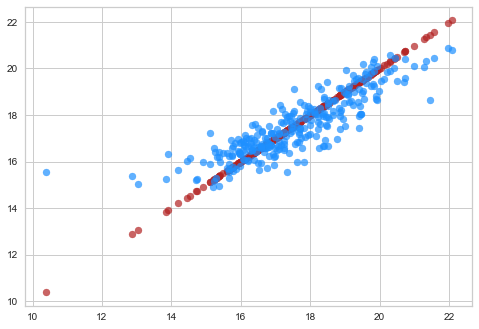

In [303]:
ShowYTrueYPredError(xgbr_opti, X_test, y_test)

#### Affichage des résulats des différents algorithmes

In [304]:
displayBestAlgo(dictAlgoScore, 'R²')

###########################################################################
Classement des différents algorithmes testés selon la métric:--------- R²
Les algorithmes testés sont affichées du plus au moins performant.
##################################################
1 GradientBoostingRegressor------------ R²: 0.76
2 XGBRegressor------------------------- R²: 0.75
3 Ridge-------------------------------- R²: 0.73
4 AdaBoostRegressor-------------------- R²: 0.72
5 Lasso-------------------------------- R²: 0.71
6 SVR---------------------------------- R²: 0.7
7 RandomForestRegressor---------------- R²: 0.7
8 KernelRidge-------------------------- R²: 0.69
9 KNeighborsRegressor------------------ R²: 0.43
10 DummyRegressor----------------------- R²: -0.0
##################################################
Algorithme testé-------------- GradientBoostingRegressor
R²-------------------------------------------0.76
     Mean Absolute Error---------------------0.61
     Mean Square Error-------------

### Interprétation des résultats

Nous devions réaliser 2 tests distincts sur les bâtiments <br />
de la ville de Seattle (non destinés à l’habitation) afin <br />
d'évaluer notre capacité à prédire :
- **L’émission de CO2 des bâtiments** 
- La **consommation totale en énergie des bâtiments**

Nous avons utilisé différents modèles de Machine Learning <br />
pour évaluer notre capacité à prédire les *émissions de CO2* <br />
et la *consommation totale d’énergie*.

<u>D’une manière générale, si on se base sur la métrique **R²**</u> :
 - L’ensemble des modèles expliquent la variance de notre jeu de données <br />
   dans le même ordre de grandeur à l’exception du modèle **KNN**, systématiquement <br />
   en retrait sur les performances comparées aux autres modèles testés
 - Les modèles de **boosting** se distinguent des autres modèles <br />
   par des performances globalement **plus élevées**
 - Nos modèles sont plus performants à prédire la target **TotalGHGEmissions** <br />
   avec un **R² maximum à 0.82**
 - Nos modèles ont légèrement plus de difficultés à prédire **SiteEnergyUse** <br />
   avec un **R² maximum à 0.76**
 - Pour rappel, notre algorithme **DummyRegressor** <br />
   qui fait office de baseline à un R² à 0
 - <u>Les modèles sont plus efficaces à prédire les valeurs moyennes</u> et <br />
   ont une **précision décroissante à l’approche des valeurs extrêmes**

<u>D’une manière générale, si on se base sur la métrique **RMSE**</u> :
 - La performance de nos modèles est assez semblable sur les 2 targets.
  - A l’exception une fois encore du modèle **KNN**, les modèles ont <br />
    tous un score au moins 2 fois meilleur que **DummyRegressor**
 - La distance est ici encore plus importante lorsque l’on compare <br />
   avec le modèle **DummyRegressor**, car les meilleurs modèles ont une **RMSE** <br />
   <u>jusqu’à 3 fois plus faible</u>.

## <u>Conclusion sur le modèle final sélectionné</u> :

A la vue des différents résultats, sur les deux targets, <br />
j’identifie **XGBRegressor** comme étant le meilleur algorithme <br />
étant à même de faire de bonnes prédictions à la fois pour <br />
les *émissions de gaz à effet de serre* et pour la *consommation totale <br />
en énergie* des bâtiments de Seattle.

Les algorithmes **GradientBoostingRegressor** et **XGBRegressor** ont <br />
globalement des scores assez proches si on compare leur **R²** et leur **RMSE**.

Même si dans le cas présent, où nos essais ont été réalisés <br />
avec un <u>random_state fixé à 1</u>, **GradientBoostingRegressor**<br />
s’en sort légèrement mieux que **XGBRegressor**, ce n’est pas systématiquement le cas.<br />
Globalement, <u>sans random_state particulier</u>, et après de nombreux essais, <br />
j’ai pu observer que <u>**XGBRegressor** s’en sort plus souvent avec <br />
des meilleurs scores que **GradientBoostingRegressor**</u>.

De plus, **XGBRegressor** à plus de potentiel d’amélioration si on décide <br />
d’aller plus loin dans l’optimisation de ses hyperparamètres même si <br />
cela peut demander beaucoup de temps et de puissance de calcul.

## <u>Conclusion sur notre capacité à prédire efficacement <br />les émissions de CO2 et la consommation totale d'énergie <br />des bâtiments de la ville de Seattle</u> :

La performance des meilleurs algorithmes a démontré leurs capacités <br />
à prédire efficacement les émissions de CO2 et la consommation totale d’énergie <br />
des bâtiments non destinés à l’habitation de la ville de Seattle.

## Evaluation de l'apport de la variable 'ENERGYSTARScore

Pour pouvoir évaluer l'apport de la variable **ENERGYSTARScore**, <br />
il me faut évaluer mes modèles avec et sans cette variable.<br />
Cependant, il faut également que les tests soient systématiquement <br />
réalisés avec le <u>même jeu de données</u> (le même nombre d'entrées).

Je réalise ici les mêmes tests que précedement mais en filtrant <br />
et en ne conservant uniquement que les enregistrements pour <br />
lesquels <u>**ENERGYSTARScore** est *Non Null*</u>.

Je réaliserai les tests pour chaqu'une des 2 targets, <br />
et en testant à chaque fois <u>avec</u> et <u>sans</u> l'utilisation <br />
de la variable **ENERGYSTARScore**.

### Label = **TotalGHGEmissions** | **ENERGYSTARScore** = OFF

#### Initialisation du DataFrame

Je remplace le contenu de '**df**' par le contenu de '**df_Total**', <br />
le DataFrame filtré et optimisé pour la target '**TotalGHGEmissions**'.

In [305]:
df = df_Total[df_Total.ENERGYSTARScore.notnull()]

#### Initialisation du dictionnaire destiné à enregistrer <br />les performances des différents algorithmes

In [306]:
dictAlgoScore = {}

#### Sélection des Features et Label

In [307]:
X = df.drop(['TotalGHGEmissions','ENERGYSTARScore'], axis=1)

y = df.TotalGHGEmissions

#### Création du train set et du test set

In [308]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=RS)

#### Application de modèle Dummy pour établir une baseline

In [309]:
dummy_regr = DummyRegressor(strategy='mean')
pcStart = perf_counter()
dummy_regr.fit(X,y)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [310]:
dictAlgoScore['DummyRegressor'] = displayMetrics(dummy_regr, X_test, y_test, pcStart, pcEnd)

##################################################
R²--------------------------------------------0.02
     Mean Absolute Error---------------------1.47
     Mean Square Error-----------------------3.35
Root Mean Square Error-----------------------1.83
Process Time---------------------------------0.0s
##################################################


<u>Affichage des prédictions '**y_pred**' en bleu en fonction <br />
    de la valeur réelle de y '**y_true**' en rouge</u> :

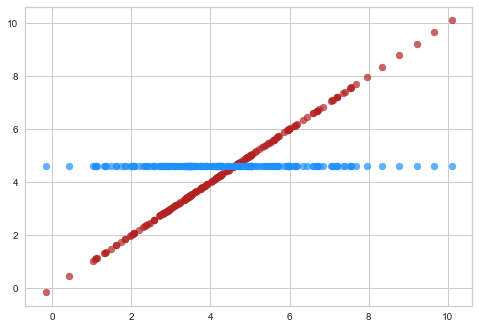

In [311]:
ShowYTrueYPredError(dummy_regr, X_test, y_test)

<u>J'enregistre également la MSE de ma baseline afin de pouvoir l'afficher <br />
dans des graphiques où on affichera l'erreur des algorithmes en fonction de certains paramètres</u> :

In [312]:
baseline_error = mean_squared_error(y_test, dummy_regr.predict(X_test))

#### KNN Linéaire

Version Linéaire de l'algorithme des K plus proches voisins.

Je test l'algortithme avec différentes valeurs de k,<br /> 
allant de k = 1 à k = 49.<br />
Je procède cette fois-ci à une cross-validation.<br />
J'affiche ensuite le score du train-set et du validation-set en fonction de k.

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass param_name=n_neighbors, param_range=[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


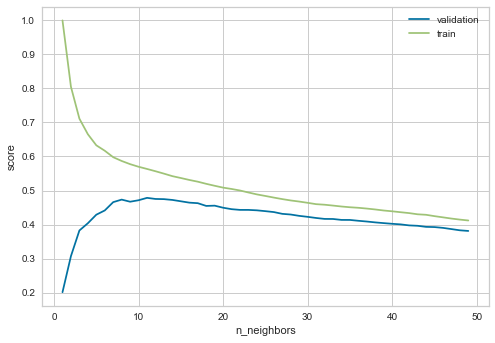

In [313]:
knn = KNeighborsRegressor()
k = np.arange(1, 50)

train_score, val_score = validation_curve(knn,
                                          X_train,
                                          y_train,
                                          'n_neighbors',
                                          k,
                                          cv=5)

plt.plot(k,val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

On observe un maximum pour le score du validation-set entre k=15 et k=17.

<u>Je réalise maintenant une recherche des meilleurs *hyperparamètres*<br />
avec **GridSearchCV** en testant les autres *hyperparamètres* existants</u> :

In [314]:
param_grid = {'n_neighbors': np.arange(1,20),
              'metric': ['euclidean', 'manhattan'],
              'weights': ['uniform', 'distance']}
grid = GridSearchCV(KNeighborsRegressor(), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

knn_opti = grid.best_estimator_

Meilleurs paramètres: {'metric': 'euclidean', 'n_neighbors': 11, 'weights': 'distance'}
Meilleur score: 0.5150691542156777


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [315]:
dictAlgoScore['KNeighborsRegressor'] = displayMetrics(knn_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.44
     Mean Absolute Error---------------------1.02
     Mean Square Error-----------------------1.84
Root Mean Square Error-----------------------1.35
Process Time---------------------------------10.58s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

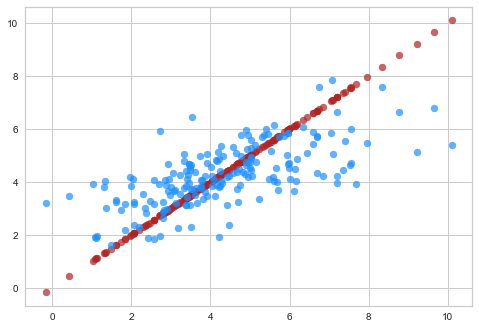

In [316]:
ShowYTrueYPredError(knn_opti, X_test, y_test)

#### Regression Ridge

<u>La régression Ridge est un régression linéaire</u> avec une contrainte **quadratique** sur les coefficients. <br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La Régression Ridge va appliquer des pénalités aux variables corrélées <br />
et va appliquer aux variables corrélées le même poids à chacune d'entre-elles. <br />
De cette façon, les variables corrélées n'auront pas plus d'influence <br />
qu'une variable seule non corrélée avec les autres variables du jeu de données.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Ridge** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [317]:
ridge = Ridge(random_state=RS)

n_alphas = 1000
alphas = np.logspace(-5,6, n_alphas)

coefs = []
errors = []

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)
    errors.append(np.mean((ridge.predict(X_test) - y_test) ** 2))

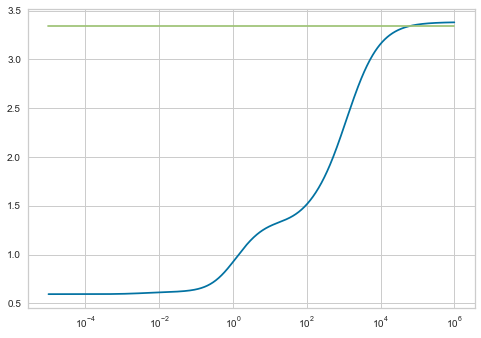

In [318]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**6], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [319]:
np.argmin(errors)

58

In [320]:
errors[np.argmin(errors)]

0.5953153854692897

In [321]:
alphas[np.argmin(errors)]

4.3514965009250545e-05

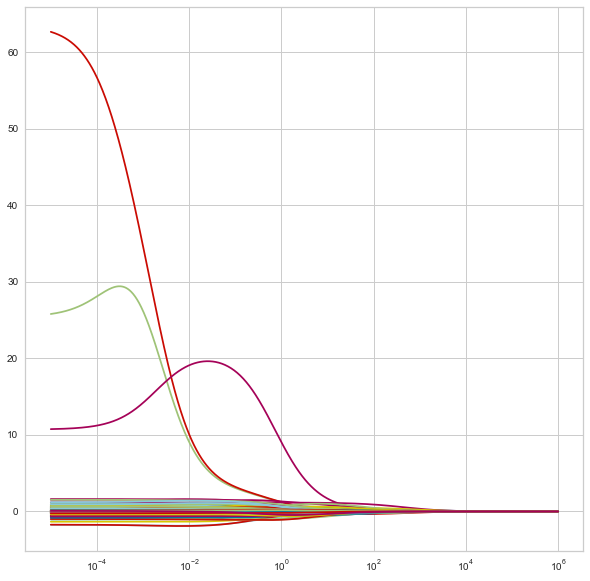

In [322]:
plt.figure(figsize=(10,10))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [323]:
param_grid = {'alpha': np.logspace(-5, 10, 200)}
grid = GridSearchCV(Ridge(random_state=RS), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

ridge_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.09884959046625576}
Meilleur score: 0.7627822082397687


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [324]:
dictAlgoScore['Ridge'] = displayMetrics(ridge_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.8
     Mean Absolute Error---------------------0.61
     Mean Square Error-----------------------0.64
Root Mean Square Error-----------------------0.8
Process Time---------------------------------5.25s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

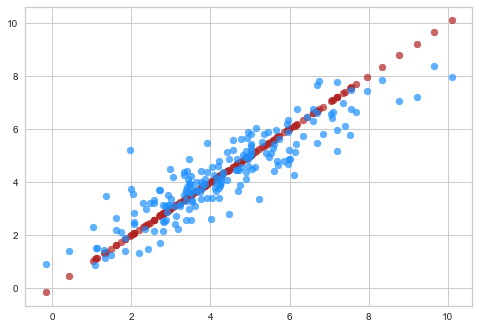

In [325]:
ShowYTrueYPredError(ridge_opti, X_test, y_test)

#### Regression Lasso

<u>La régression Lasso est une régression linéaire</u> avec une contrainte **linéaire** sur les coefficients.<br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La **Régression Lasso** va appliquer des pénalités aux variables corrélées <br />
et ne conserver qu'une seule variable parmi les variables corrélées <br />
et passer le coefficiant des autres variables corrélées à 0.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Lasso** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [326]:
n_alphas = 300
alphas = np.logspace(-5, 1, n_alphas)
lasso = Lasso(fit_intercept=False,
              random_state=RS)

coefs = []
errors = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    errors.append(np.mean((lasso.predict(X_test) - y_test) ** 2))

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330.9543259499117, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330.9725638210249, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330.99164177517247, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 332.0624242949652, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 332.12965497190834, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 332.19931295417683, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 335.17825261314977, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 335.343991484911, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 335.5124729263235, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323.7943322865514, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 321.26421709325683, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318.2888648451195, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 216.33981304019906, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210.32376708247367, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 202.52380176464547, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

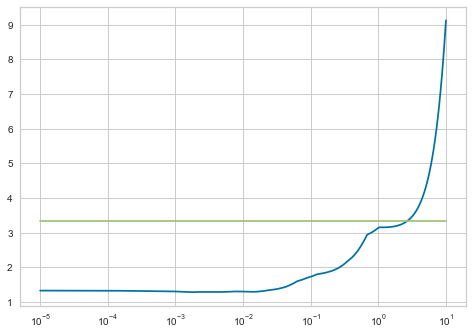

In [327]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**1], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [328]:
np.argmin(errors)

112

In [329]:
errors[np.argmin(errors)]

1.2807843710070286

In [330]:
alphas[np.argmin(errors)]

0.0017680381784572086

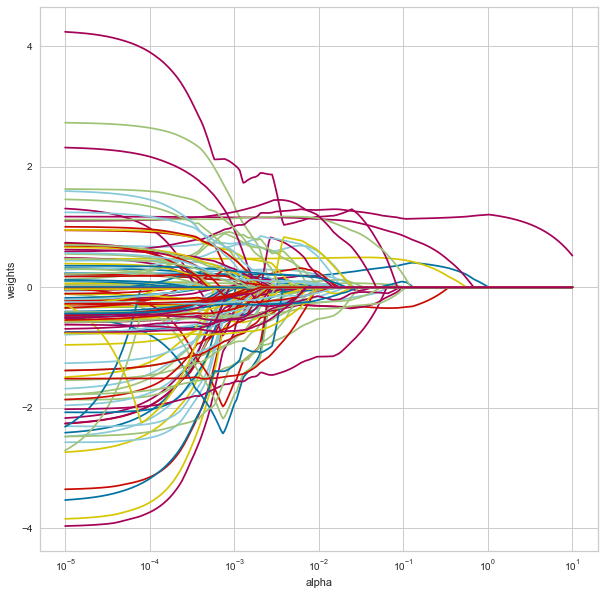

In [331]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.axis('tight')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [332]:
param_grid = {'alpha': np.logspace(-5, 10, 300)}
grid = GridSearchCV(Lasso(random_state=RS), param_grid, cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

lasso_opti = grid.best_estimator_

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.455948274678917, tolerance: 0.20985321725530381
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.667118340620732, tolerance: 0.19922309485583573
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4150307146747423, tolerance: 0.20990902049945048
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergenc

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0878150215738174, tolerance: 0.19922309485583573
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4871069198239013, tolerance: 0.20990902049945048
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.2827194479908997, tolerance: 0.19885162562085226
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Converge

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.9323466099480697, tolerance: 0.20990902049945048
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.4779267787816934, tolerance: 0.19885162562085226
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.410845615450484, tolerance: 0.20141912424874117
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Converge

Meilleurs paramètres: {'alpha': 0.0025587435201685892}
Meilleur score: 0.7863924278246277


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [333]:
dictAlgoScore['Lasso'] = displayMetrics(lasso_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.8
     Mean Absolute Error---------------------0.6
     Mean Square Error-----------------------0.65
Root Mean Square Error-----------------------0.8
Process Time---------------------------------15.14s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

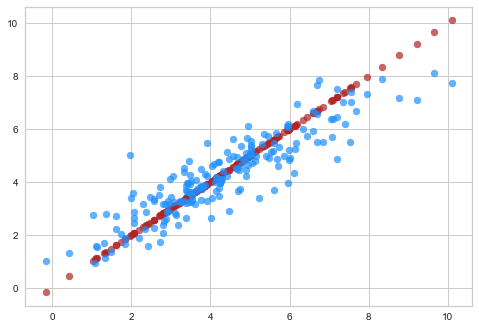

In [334]:
ShowYTrueYPredError(lasso_opti, X_test, y_test)

#### Support Vector Regression (SVR)

Les algorithmes Support Vector Machine sont généralement utilisés dans des problèmes de classification.<br />
L'idée de cet algorithme est de trouver un **hyperplan** qui divise notre jeu de données en deux.<br />
SVR est la version Regression du Support Vector Machine (SVM).

Cet algorithme fonctionne bien sur de petits dataset.<br />
Son entrainement peut-être long et il est sensible aux Outliers.

<u>Premier essai avec les paramètres par défaut</u> :

In [335]:
svr = SVR()
svr.fit(X_train, y_train)
displayMetrics(svr, X_test, y_test)

##################################################
R²-------------------------------------------0.63
     Mean Absolute Error---------------------0.83
     Mean Square Error-----------------------1.22
Root Mean Square Error-----------------------1.11
##################################################


{'R²': 0.63, 'MAE': 0.83, 'MSE': 1.22, 'RMSE': 1.11, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **RandomizedSearchCV**</u> :<br />
*J'utilise RandomizedSearchCV car la recherche des meilleurs hyperparamètres est particulièrement longue avec **SVR***

In [336]:
param_grid = {'kernel': ['linear','rbf'],
              'degree': range(3,5),
              'gamma' : np.logspace(-2, 1, 4),
              'C': np.logspace(-3, 3, 7)}

grid = RandomizedSearchCV(SVR(), 
                          param_grid, 
                          cv=5, 
                          scoring='r2',
                          n_iter = 10)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)


svr_opti = grid.best_estimator_

Meilleurs paramètres: {'kernel': 'linear', 'gamma': 0.1, 'degree': 3, 'C': 10.0}
Meilleur score: 0.7680679979999533


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [337]:
dictAlgoScore['SVR'] = displayMetrics(svr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.77
     Mean Absolute Error---------------------0.64
     Mean Square Error-----------------------0.76
Root Mean Square Error-----------------------0.87
Process Time---------------------------------7.11s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

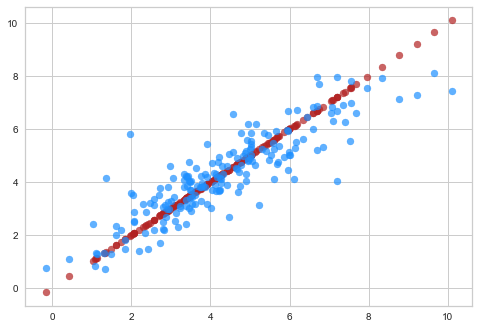

In [338]:
ShowYTrueYPredError(svr_opti, X_test, y_test)

#### Regression Ridge à noyau (Kernel Ridge)

La Regression Ridge à noyau est une regression ridge <br />
à laquelle nous appliquons l'astuce du noyau.<br />
L'astuce du noyau (Kernel Trick) est une méthode qui permet <br />
d'utiliser un classifieur linéaire pour résoudre un problème non linéaire.<br />
L'idée est de transformer l'espace de représentation des données d'entrée <br />
en un espace de plus grande dimension.<br />
La discrimination linéaire dans l'espace de grande dimension<br /> 
(appelé aussi espace de redescription) est équivalente à une discrimination <br />
non linéaire dans l'espace d'origine.

<u>Premier essai avec les paramètres par défaut</u> :

In [339]:
kr = KernelRidge()
kr.fit(X_train, y_train)
displayMetrics(kr, X_test, y_test)

##################################################
R²-------------------------------------------0.65
     Mean Absolute Error---------------------0.81
     Mean Square Error-----------------------1.15
Root Mean Square Error-----------------------1.07
##################################################


{'R²': 0.65, 'MAE': 0.81, 'MSE': 1.15, 'RMSE': 1.07, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [340]:
param_grid = {'kernel':['rbf','linear','poly'],
              'degree':[3,4],
              'alpha': np.logspace(-2, 2, 5),
              'gamma': np.logspace(-2, 1, 4)}

grid = GridSearchCV(KernelRidge(), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

kr_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.01, 'degree': 3, 'gamma': 0.01, 'kernel': 'linear'}
Meilleur score: 0.7497344576716879


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [341]:
dictAlgoScore['KernelRidge'] = displayMetrics(kr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.8
     Mean Absolute Error---------------------0.62
     Mean Square Error-----------------------0.65
Root Mean Square Error-----------------------0.81
Process Time---------------------------------8.69s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

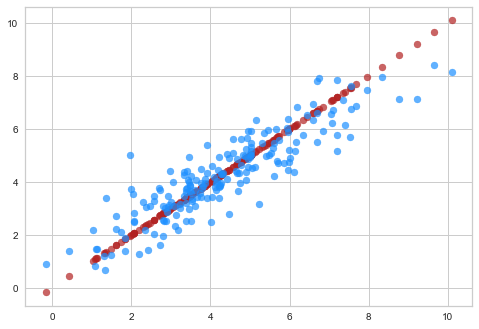

In [342]:
ShowYTrueYPredError(kr_opti, X_test, y_test)

#### Arbre de Décision Aléatoire (Random Forest)

L'algorithme **Random Forest** fait partie des algorithmes qui utilisent <br />
la méthode du **bagging** et fait donc partie des algorithmes **ensemblistes**.

<u>Rappel sur le bagging</u> :
Bagging est une contraction de **Bootstrap Aggregation**.<br />
Le bagging a pour objectif de réduire la variance de l’estimateur (les problèmes liés <br />
au surapprentissage, et donc qu'une petite modification en entrée (jeu de données) entraîne <br />
de grandes différences en sortie).


L'idée est de créer plusieurs entités d'un même modèle <br />
et d'entrainer chacune de ces entités sur une portion aléatoire <br />
de notre jeu de données.<br />
Pour cela on utilise une technique d'échantillonnage appelé **Bootstrapping**.<br />
Cette technique consiste à replacer après chaque tirage au sort, <br />
les données qui ont été sélectionnées dans notre jeu de données (on parle <br />
alors de tirage avec remise).<br />
De cette manière, on obtient un groupe de modèles diversifiés (ils n'ont <br />
pas tous été nourris avec les mêmes données mais ils partagent cependant <br />
certaines connaissances en commun) ce qui nous permet d’obtenir des majorités <br />
en faveur des bonnes réponses.<br />
On regroupe ensuite les résultats de chaque modèle pour faire notre prédiction finale.<br />
**Random Forest** est l'algorithme le plus connu utilisant cette technique.<br />
Il utilise comme modèle de base, l'arbre de décision.<br />
Le nom de **Random Forest** est logiquement choisi comme tel car nous générons <br />
des *arbres* de décision *aléatoirement*. <br />
En cela nous créons donc une *forêt* aléatoire.

<u>Entrainement avec les paramètres par défaut et n_estimator = 1000</u> :

In [343]:
rfr = RandomForestRegressor(n_estimators=1000, 
                            n_jobs=-1,
                            random_state=RS)
pcStart = perf_counter()
rfr.fit(X_train, y_train)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [344]:
dictAlgoScore['RandomForestRegressor'] = displayMetrics(rfr, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.79
     Mean Absolute Error---------------------0.57
     Mean Square Error-----------------------0.69
Root Mean Square Error-----------------------0.83
Process Time---------------------------------1.2s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

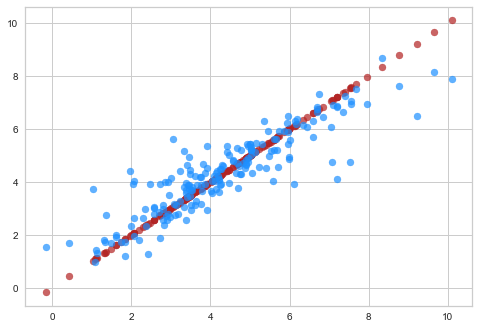

In [345]:
ShowYTrueYPredError(rfr, X_test, y_test)

#### AdaBoost

AdaBoost est une méthode de Boosting et fait donc <br />
également partie des algorithmes ensemblistes.

L'idée est d'entraîner l'un après l'autre plusieurs modèle relativement faibles <br />
en demandant à chaque modèle d'essayer de corriger les erreurs effectuées par son prédecesseur.<br />
On obtient ainsi un ensemble de modèles complèmentaires dans lequel <br />
les faiblesses des uns sont compensées par les forces des autres.

Ici les modèles sont entraînés en série.<br />
Chaque modèle est en situation d'underfitting mais en les construisant <br />
les uns par dessus les autres, on est capable de réduire le biais général de tous ces modèles.

Adaboost est un algorithme de boosting qui s’appuie sur ce principe, <br />
avec un paramètre de mise à jour adaptatif permettant de donner plus <br />
d’importance aux valeurs difficiles à prédire, donc en boostant les régresseurs<br />
qui réussissent quand d’autres ont échoué.

<u>Entrainement avec les paramètres par défaut</u> :

In [346]:
adb = AdaBoostRegressor(random_state=RS)
adb.fit(X_train, y_train)
displayMetrics(adb, X_test, y_test)

##################################################
R²-------------------------------------------0.71
     Mean Absolute Error---------------------0.74
     Mean Square Error-----------------------0.95
Root Mean Square Error-----------------------0.97
##################################################


{'R²': 0.71, 'MAE': 0.74, 'MSE': 0.95, 'RMSE': 0.97, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [347]:
param_grid = {"base_estimator__max_depth" : np.linspace(10,100,10),
              "n_estimators": [100, 200, 300]
             }


DTR = DecisionTreeRegressor(random_state=RS)

ABR = AdaBoostRegressor(base_estimator = DTR,
                        random_state=RS)


grid = GridSearchCV(ABR,
                    param_grid=param_grid,
                    scoring = 'r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

adb_opti = grid.best_estimator_

Meilleurs paramètres: {'base_estimator__max_depth': 30.0, 'n_estimators': 300}
Meilleur score: 0.7750861194175135


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [348]:
dictAlgoScore['AdaBoostRegressor'] = displayMetrics(adb_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.8
     Mean Absolute Error---------------------0.56
     Mean Square Error-----------------------0.66
Root Mean Square Error-----------------------0.81
Process Time---------------------------------171.73s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

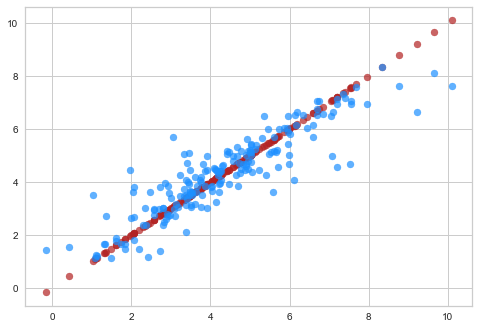

In [349]:
ShowYTrueYPredError(adb_opti, X_test, y_test)

#### GradientBoosting

Comme son nom l'indique, **GradientBoosting** est un algorithme de **boosting**.<br />
En celà il reprend le même principe de fonctionnement qu'*AdaBoost*.

**GradiantBoosting** diffère d'*AdaBoost* sur sa fonction de perte, <br />
qui s'appuie sur la <u>descente de gradient</u>.

La perte représente la pénalité générée lorsque l'estimation par le modèle <br />
n'est pas parfaitement égale à la cible.<br />
Une fonction de perte quantifie cette pénalité sous la forme d'une valeur individuelle.

La descente de gradient est un algorithme qui permet de trouver le minimum d’une fonction.<br />
Le calcul de la dérivée en un point d'une fonction nous permet de définir <br />
la pente de cette fonction et donc de définir le sens dans lequel il faut<br />
se déplacer sur cette fonction pour se rapprocher de son minimum (local).

<u>Entrainement avec les paramètres par défaut</u> :

In [350]:
gbr = GradientBoostingRegressor(random_state=RS)
gbr.fit(X_train, y_train)
displayMetrics(gbr, X_test, y_test)

##################################################
R²-------------------------------------------0.82
     Mean Absolute Error---------------------0.59
     Mean Square Error-----------------------0.6
Root Mean Square Error-----------------------0.77
##################################################


{'R²': 0.82, 'MAE': 0.59, 'MSE': 0.6, 'RMSE': 0.77, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [351]:
param_grid = {'learning_rate': [0.1,0.2,0.3],
              'n_estimators':[100,200,300,400,500],
              'subsample': [0.4,0.5,0.6,1],
              'max_depth': [2,3]}

grid = GridSearchCV(GradientBoostingRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

gbr_opti = grid.best_estimator_

Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.5}
Meilleur score: 0.8183525078231064


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [352]:
dictAlgoScore['GradientBoostingRegressor'] = displayMetrics(gbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.83
     Mean Absolute Error---------------------0.58
     Mean Square Error-----------------------0.57
Root Mean Square Error-----------------------0.75
Process Time---------------------------------181.52s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

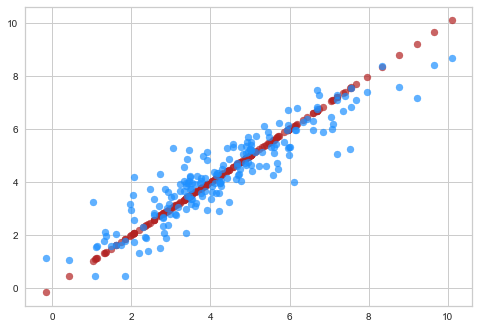

In [353]:
ShowYTrueYPredError(gbr_opti, X_test, y_test)

#### XGBoost

**XGBoost** signifie *Extreme Gradient Boosting*.<br />
Il est assez similaire à l'algorithme *GradientBoosting*.<br />
Il s'agit d'une implémentation spécifique du modèle *Gradient Boosting*<br />
qui utilise des **approximations plus précises** pour trouver<br/>
**le meilleur modèle d'arbre de décision**.<br />
Les deux algorithmes suivent le principe de **descente de gradient**.

**XGBoost** est plus rapide à l'exécution que *GradientBoosting*.

<u>Liste non exaustive des avantages de XGBoost sur GradientBoosting</u> : 
 - **XGBoost** utilise les techniques de **régularisation (L1 et L2)** <br />
   pour diminuer le surapprentissage.
 - Implémente un traitement **parallèle** dans la génération des arbres <br />
   de décision et est donc plus rapide à l’entraînement que *GradientBoosting*
   - Il s'agit bien là d'un traitement en parallèle <br />
     dans un algorithme de boosting, donc séquentiel


<u>Entrainement avec les paramètres par défaut</u> :

In [354]:
xgbr = XGBRegressor(random_state=RS)
xgbr.fit(X_train, y_train)


displayMetrics(xgbr, X_test, y_test)

##################################################
R²-------------------------------------------0.77
     Mean Absolute Error---------------------0.62
     Mean Square Error-----------------------0.76
Root Mean Square Error-----------------------0.87
##################################################


{'R²': 0.77, 'MAE': 0.62, 'MSE': 0.76, 'RMSE': 0.87, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [355]:
param_grid = {'eta':[0.1,0.2],
              'gamma':np.linspace(0,0.2,3),
              'max_depth': range(2,6,2),
              'subsample': np.linspace(0.5,0.8,4),
              'colsample_bytree': np.linspace(0.5,0.8,4)
             }


grid = GridSearchCV(XGBRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2'
                   )

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

xgbr_opti = grid.best_estimator_

Meilleurs paramètres: {'colsample_bytree': 0.8, 'eta': 0.2, 'gamma': 0.0, 'max_depth': 2, 'subsample': 0.8}
Meilleur score: 0.8108149967281395


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [356]:
dictAlgoScore['XGBRegressor'] = displayMetrics(xgbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.8
     Mean Absolute Error---------------------0.6
     Mean Square Error-----------------------0.65
Root Mean Square Error-----------------------0.81
Process Time---------------------------------46.81s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

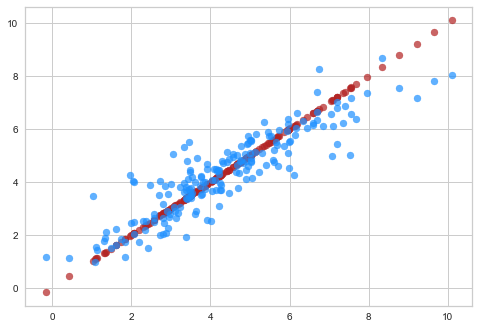

In [357]:
ShowYTrueYPredError(xgbr_opti, X_test, y_test)

#### Affichage des résulats des différents algorithmes

In [358]:
displayBestAlgo(dictAlgoScore, 'R²')

###########################################################################
Classement des différents algorithmes testés selon la métric:--------- R²
Les algorithmes testés sont affichées du plus au moins performant.
##################################################
1 GradientBoostingRegressor------------ R²: 0.83
2 Ridge-------------------------------- R²: 0.8
3 Lasso-------------------------------- R²: 0.8
4 KernelRidge-------------------------- R²: 0.8
5 AdaBoostRegressor-------------------- R²: 0.8
6 XGBRegressor------------------------- R²: 0.8
7 RandomForestRegressor---------------- R²: 0.79
8 SVR---------------------------------- R²: 0.77
9 KNeighborsRegressor------------------ R²: 0.44
10 DummyRegressor----------------------- R²: -0.02
##################################################
Algorithme testé-------------- GradientBoostingRegressor
R²-------------------------------------------0.83
     Mean Absolute Error---------------------0.58
     Mean Square Error---------------

### Label = **TotalGHGEmissions** | **ENERGYSTARScore** = ON

#### Initialisation du DataFrame

In [359]:
df = df_Total[df_Total.ENERGYSTARScore.notnull()]

#### Initialisation du dictionnaire destiné à enregistrer <br />les performances des différents algorithmes

In [360]:
dictAlgoScore = {}

#### Sélection des Features et Label

In [361]:
X = df.drop(['TotalGHGEmissions'], axis=1)

y = df.TotalGHGEmissions

#### Création du train set et du test set

In [362]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RS)

#### Application de modèle Dummy pour établir une baseline

In [363]:
dummy_regr = DummyRegressor(strategy='mean')
pcStart = perf_counter()
dummy_regr.fit(X,y)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [364]:
dictAlgoScore['DummyRegressor'] = displayMetrics(dummy_regr, X_test, y_test, pcStart, pcEnd)

##################################################
R²--------------------------------------------0.02
     Mean Absolute Error---------------------1.47
     Mean Square Error-----------------------3.35
Root Mean Square Error-----------------------1.83
Process Time---------------------------------0.0s
##################################################


<u>Affichage des prédictions '**y_pred**' en bleu en fonction <br />
    de la valeur réelle de y '**y_true**' en rouge</u> :

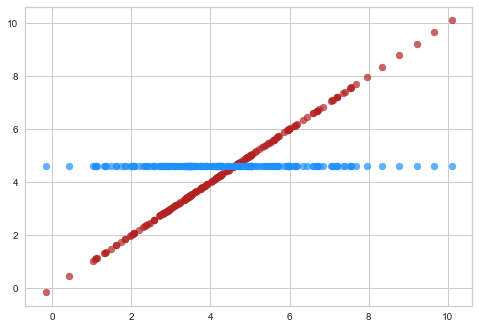

In [365]:
ShowYTrueYPredError(dummy_regr, X_test, y_test)

<u>J'enregistre également la MSE de ma baseline afin de pouvoir l'afficher <br />
dans des graphiques où on affichera l'erreur des algorithmes en fonction de certains paramètres</u> :

In [366]:
baseline_error = mean_squared_error(y_test, dummy_regr.predict(X_test))

#### KNN Linéaire

Version Linéaire de l'algorithme des K plus proches voisins.

Je test l'algortithme avec différentes valeurs de k,<br /> 
allant de k = 1 à k = 49.<br />
Je procède cette fois-ci à une cross-validation.<br />
J'affiche ensuite le score du train-set et du validation-set en fonction de k.

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass param_name=n_neighbors, param_range=[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


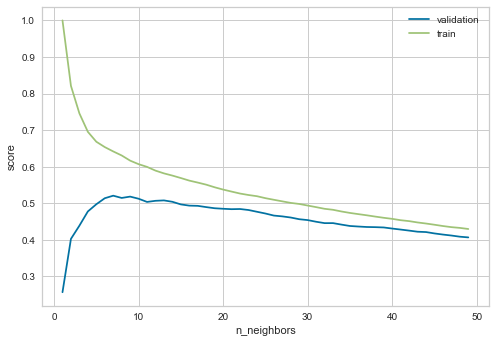

In [367]:
knn = KNeighborsRegressor()
k = np.arange(1, 50)

train_score, val_score = validation_curve(knn,
                                          X_train,
                                          y_train,
                                          'n_neighbors',
                                          k,
                                          cv=5)

plt.plot(k,val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

On observe un maximum pour le score du validation-set entre k=15 et k=17.

<u>Je réalise maintenant une recherche des meilleurs *hyperparamètres*<br />
avec **GridSearchCV** en testant les autres *hyperparamètres* existants</u> :

In [368]:
param_grid = {'n_neighbors': np.arange(1,20),
              'metric': ['euclidean', 'manhattan'],
              'weights': ['uniform', 'distance']}
grid = GridSearchCV(KNeighborsRegressor(), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

knn_opti = grid.best_estimator_

Meilleurs paramètres: {'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'distance'}
Meilleur score: 0.5463273751323244


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [369]:
dictAlgoScore['KNeighborsRegressor'] = displayMetrics(knn_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.44
     Mean Absolute Error---------------------1.0
     Mean Square Error-----------------------1.83
Root Mean Square Error-----------------------1.35
Process Time---------------------------------10.75s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

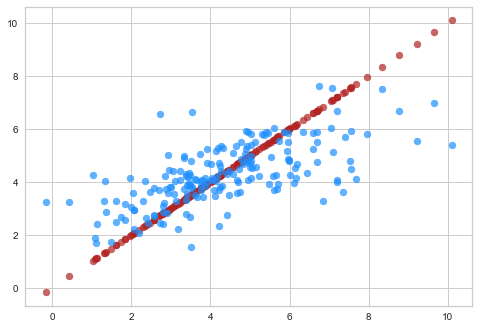

In [370]:
ShowYTrueYPredError(knn_opti, X_test, y_test)

#### Regression Ridge

<u>La régression Ridge est un régression linéaire</u> avec une contrainte **quadratique** sur les coefficients. <br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La Régression Ridge va appliquer des pénalités aux variables corrélées <br />
et va appliquer aux variables corrélées le même poids à chacune d'entre-elles. <br />
De cette façon, les variables corrélées n'auront pas plus d'influence <br />
qu'une variable seule non corrélée avec les autres variables du jeu de données.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Ridge** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [371]:
ridge = Ridge(random_state=RS)

n_alphas = 1000
alphas = np.logspace(-5,6, n_alphas)

coefs = []
errors = []

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)
    errors.append(np.mean((ridge.predict(X_test) - y_test) ** 2))

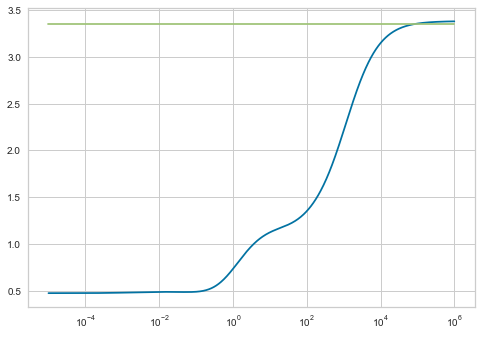

In [372]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**6], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [373]:
np.argmin(errors)

0

In [374]:
errors[np.argmin(errors)]

0.4719663852693081

In [375]:
alphas[np.argmin(errors)]

1e-05

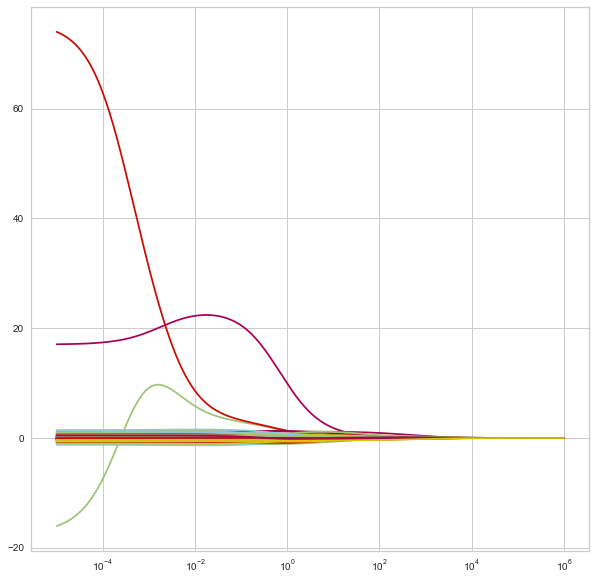

In [376]:
plt.figure(figsize=(10,10))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [377]:
param_grid = {'alpha': np.logspace(-5, 10, 200)}
grid = GridSearchCV(Ridge(random_state=RS), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

ridge_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 1e-05}
Meilleur score: 0.8689782917374334


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [378]:
dictAlgoScore['Ridge'] = displayMetrics(ridge_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.86
     Mean Absolute Error---------------------0.48
     Mean Square Error-----------------------0.47
Root Mean Square Error-----------------------0.69
Process Time---------------------------------5.0s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

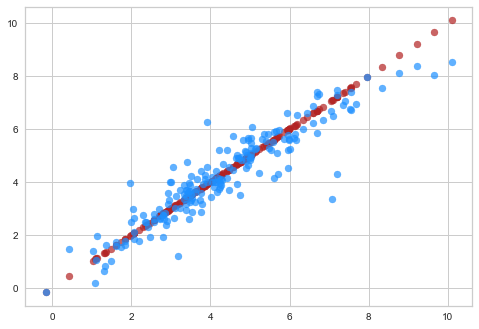

In [379]:
ShowYTrueYPredError(ridge_opti, X_test, y_test)

#### Regression Lasso

<u>La régression Lasso est une régression linéaire</u> avec une contrainte **linéaire** sur les coefficients.<br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La **Régression Lasso** va appliquer des pénalités aux variables corrélées <br />
et ne conserver qu'une seule variable parmi les variables corrélées <br />
et passer le coefficiant des autres variables corrélées à 0.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Lasso** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [380]:
n_alphas = 300
alphas = np.logspace(-5, 1, n_alphas)
lasso = Lasso(fit_intercept=False,
              random_state=RS)

coefs = []
errors = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    errors.append(np.mean((lasso.predict(X_test) - y_test) ** 2))

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.0182028091049, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.03938668347115, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 275.0615436598171, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 276.1643201188741, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 276.23705265224936, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 276.31323709720533, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280.1651078007114, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280.37324945728255, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280.5871814365997, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279.5022337419992, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 278.5251212932676, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277.373719003595, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176.8914239926039, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180.44999111175215, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183.51874758036243, tolerance: 1.9115360150087006
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

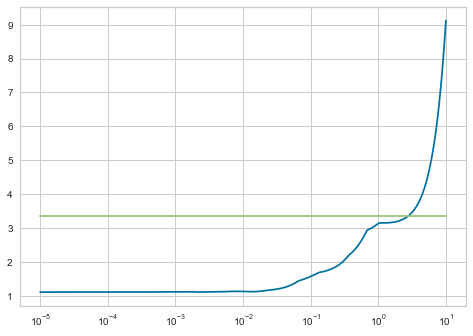

In [381]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**1], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [382]:
np.argmin(errors)

46

In [383]:
errors[np.argmin(errors)]

1.110679662827933

In [384]:
alphas[np.argmin(errors)]

8.376776400682924e-05

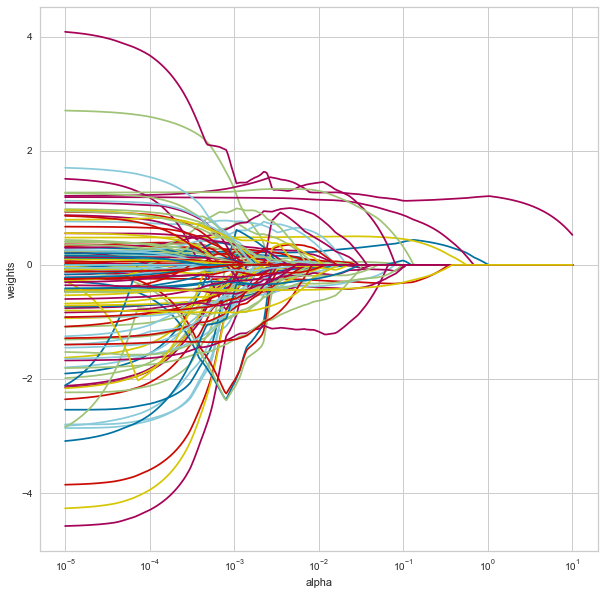

In [385]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.axis('tight')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [386]:
param_grid = {'alpha': np.logspace(-5, 10, 300)}
grid = GridSearchCV(Lasso(random_state=RS), param_grid, cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

lasso_opti = grid.best_estimator_

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.790782202374672, tolerance: 0.20985321725530381
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.117822352316452, tolerance: 0.19922309485583573
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.9773957643522095, tolerance: 0.20990902049945048
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergenc

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.308700818881789, tolerance: 0.20985321725530381
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.9614138452521388, tolerance: 0.19922309485583573
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.5227645743404707, tolerance: 0.20990902049945048
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergen

Meilleurs paramètres: {'alpha': 0.001611973357388157}
Meilleur score: 0.8785416817642504


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [387]:
dictAlgoScore['Lasso'] = displayMetrics(lasso_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.85
     Mean Absolute Error---------------------0.48
     Mean Square Error-----------------------0.49
Root Mean Square Error-----------------------0.7
Process Time---------------------------------13.77s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

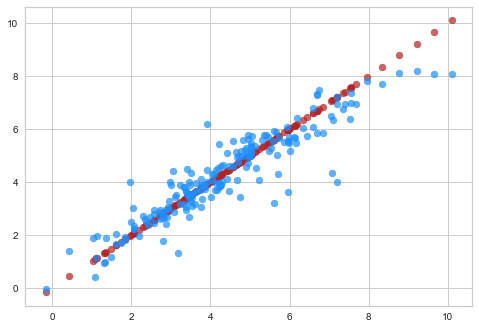

In [388]:
ShowYTrueYPredError(lasso_opti, X_test, y_test)

#### Support Vector Regression (SVR)

Les algorithmes Support Vector Machine sont généralement utilisés dans des problèmes de classification.<br />
L'idée de cet algorithme est de trouver un **hyperplan** qui divise notre jeu de données en deux.<br />
SVR est la version Regression du Support Vector Machine (SVM).

Cet algorithme fonctionne bien sur de petits dataset.<br />
Son entrainement peut-être long et il est sensible aux Outliers.

<u>Premier essai avec les paramètres par défaut</u> :

In [389]:
svr = SVR()
svr.fit(X_train, y_train)
displayMetrics(svr, X_test, y_test)

##################################################
R²-------------------------------------------0.67
     Mean Absolute Error---------------------0.78
     Mean Square Error-----------------------1.09
Root Mean Square Error-----------------------1.04
##################################################


{'R²': 0.67, 'MAE': 0.78, 'MSE': 1.09, 'RMSE': 1.04, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **RandomizedSearchCV**</u> :<br />
*J'utilise RandomizedSearchCV car la recherche des meilleurs hyperparamètres est particulièrement longue avec **SVR***

In [390]:
param_grid = {'kernel': ['linear','rbf'],
              'degree': range(3,5),
              'gamma' : np.logspace(-2, 1, 4),
              'C': np.logspace(-3, 3, 7)}

grid = RandomizedSearchCV(SVR(), 
                          param_grid, 
                          cv=5, 
                          scoring='r2',
                          n_iter = 10)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)


svr_opti = grid.best_estimator_

Meilleurs paramètres: {'kernel': 'linear', 'gamma': 0.1, 'degree': 3, 'C': 1000.0}
Meilleur score: 0.8771730831514939


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [391]:
dictAlgoScore['SVR'] = displayMetrics(svr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.86
     Mean Absolute Error---------------------0.47
     Mean Square Error-----------------------0.47
Root Mean Square Error-----------------------0.68
Process Time---------------------------------722.93s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

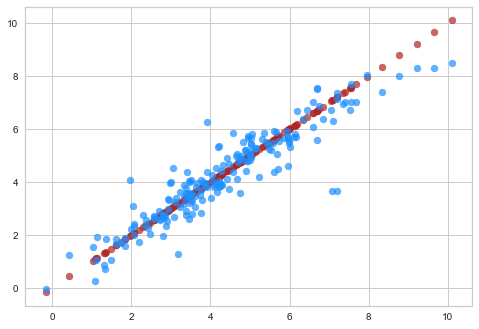

In [392]:
ShowYTrueYPredError(svr_opti, X_test, y_test)

#### Regression Ridge à noyau (Kernel Ridge)

La Regression Ridge à noyau est une regression ridge <br />
à laquelle nous appliquons l'astuce du noyau.<br />
L'astuce du noyau (Kernel Trick) est une méthode qui permet <br />
d'utiliser un classifieur linéaire pour résoudre un problème non linéaire.<br />
L'idée est de transformer l'espace de représentation des données d'entrée <br />
en un espace de plus grande dimension.<br />
La discrimination linéaire dans l'espace de grande dimension<br /> 
(appelé aussi espace de redescription) est équivalente à une discrimination <br />
non linéaire dans l'espace d'origine.

<u>Premier essai avec les paramètres par défaut</u> :

In [393]:
kr = KernelRidge()
kr.fit(X_train, y_train)
displayMetrics(kr, X_test, y_test)

##################################################
R²-------------------------------------------0.71
     Mean Absolute Error---------------------0.74
     Mean Square Error-----------------------0.96
Root Mean Square Error-----------------------0.98
##################################################


{'R²': 0.71, 'MAE': 0.74, 'MSE': 0.96, 'RMSE': 0.98, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [394]:
param_grid = {'kernel':['rbf','linear','poly'],
              'degree':[3,4],
              'alpha': np.logspace(-2, 2, 5),
              'gamma': np.logspace(-2, 1, 4)}

grid = GridSearchCV(KernelRidge(), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

kr_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.01, 'degree': 3, 'gamma': 0.01, 'kernel': 'linear'}
Meilleur score: 0.8608653952430337


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [395]:
dictAlgoScore['KernelRidge'] = displayMetrics(kr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.84
     Mean Absolute Error---------------------0.51
     Mean Square Error-----------------------0.51
Root Mean Square Error-----------------------0.72
Process Time---------------------------------8.24s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

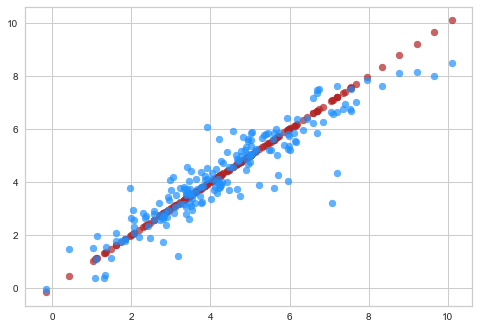

In [396]:
ShowYTrueYPredError(kr_opti, X_test, y_test)

#### Arbre de Décision Aléatoire (Random Forest)

L'algorithme **Random Forest** fait partie des algorithmes qui utilisent <br />
la méthode du **bagging** et fait donc partie des algorithmes **ensemblistes**.

<u>Rappel sur le bagging</u> :
Bagging est une contraction de **Bootstrap Aggregation**.<br />
Le bagging a pour objectif de réduire la variance de l’estimateur (les problèmes liés <br />
au surapprentissage, et donc qu'une petite modification en entrée (jeu de données) entraîne <br />
de grandes différences en sortie).


L'idée est de créer plusieurs entités d'un même modèle <br />
et d'entrainer chacune de ces entités sur une portion aléatoire <br />
de notre jeu de données.<br />
Pour cela on utilise une technique d'échantillonnage appelé **Bootstrapping**.<br />
Cette technique consiste à replacer après chaque tirage au sort, <br />
les données qui ont été sélectionnées dans notre jeu de données (on parle <br />
alors de tirage avec remise).<br />
De cette manière, on obtient un groupe de modèles diversifiés (ils n'ont <br />
pas tous été nourris avec les mêmes données mais ils partagent cependant <br />
certaines connaissances en commun) ce qui nous permet d’obtenir des majorités <br />
en faveur des bonnes réponses.<br />
On regroupe ensuite les résultats de chaque modèle pour faire notre prédiction finale.<br />
**Random Forest** est l'algorithme le plus connu utilisant cette technique.<br />
Il utilise comme modèle de base, l'arbre de décision.<br />
Le nom de **Random Forest** est logiquement choisi comme tel car nous générons <br />
des *arbres* de décision *aléatoirement*. <br />
En cela nous créons donc une *forêt* aléatoire.

<u>Entrainement avec les paramètres par défaut et n_estimator = 1000</u> :

In [397]:
rfr = RandomForestRegressor(n_estimators=1000, 
                            n_jobs=-1,
                            random_state=RS)
pcStart = perf_counter()
rfr.fit(X_train, y_train)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [398]:
dictAlgoScore['RandomForestRegressor'] = displayMetrics(rfr, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.82
     Mean Absolute Error---------------------0.5
     Mean Square Error-----------------------0.6
Root Mean Square Error-----------------------0.77
Process Time---------------------------------1.2s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

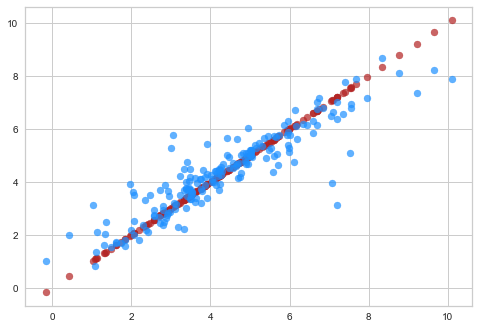

In [399]:
ShowYTrueYPredError(rfr, X_test, y_test)

#### AdaBoost

AdaBoost est une méthode de Boosting et fait donc <br />
également partie des algorithmes ensemblistes.

L'idée est d'entraîner l'un après l'autre plusieurs modèle relativement faibles <br />
en demandant à chaque modèle d'essayer de corriger les erreurs effectuées par son prédecesseur.<br />
On obtient ainsi un ensemble de modèles complèmentaires dans lequel <br />
les faiblesses des uns sont compensées par les forces des autres.

Ici les modèles sont entraînés en série.<br />
Chaque modèle est en situation d'underfitting mais en les construisant <br />
les uns par dessus les autres, on est capable de réduire le biais général de tous ces modèles.

Adaboost est un algorithme de boosting qui s’appuie sur ce principe, <br />
avec un paramètre de mise à jour adaptatif permettant de donner plus <br />
d’importance aux valeurs difficiles à prédire, donc en boostant les régresseurs<br />
qui réussissent quand d’autres ont échoué.

<u>Entrainement avec les paramètres par défaut</u> :

In [400]:
adb = AdaBoostRegressor(random_state=RS)
adb.fit(X_train, y_train)
displayMetrics(adb, X_test, y_test)

##################################################
R²-------------------------------------------0.7
     Mean Absolute Error---------------------0.79
     Mean Square Error-----------------------0.99
Root Mean Square Error-----------------------1.0
##################################################


{'R²': 0.7, 'MAE': 0.79, 'MSE': 0.99, 'RMSE': 1.0, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [401]:
param_grid = {"base_estimator__max_depth" : np.linspace(10,100,10),
              "n_estimators": [100, 200, 300]
             }


DTR = DecisionTreeRegressor(random_state=RS)

ABR = AdaBoostRegressor(base_estimator = DTR,
                        random_state=RS)


grid = GridSearchCV(ABR,
                    param_grid=param_grid,
                    scoring = 'r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

adb_opti = grid.best_estimator_

Meilleurs paramètres: {'base_estimator__max_depth': 30.0, 'n_estimators': 100}
Meilleur score: 0.8238728742701523


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [402]:
dictAlgoScore['AdaBoostRegressor'] = displayMetrics(adb_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.83
     Mean Absolute Error---------------------0.49
     Mean Square Error-----------------------0.56
Root Mean Square Error-----------------------0.75
Process Time---------------------------------174.64s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

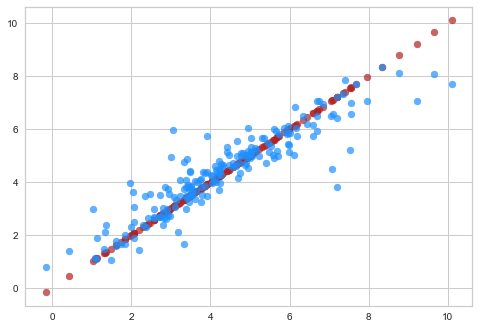

In [403]:
ShowYTrueYPredError(adb_opti, X_test, y_test)

#### GradientBoosting

Comme son nom l'indique, **GradientBoosting** est un algorithme de **boosting**.<br />
En celà il reprend le même principe de fonctionnement qu'*AdaBoost*.

**GradiantBoosting** diffère d'*AdaBoost* sur sa fonction de perte, <br />
qui s'appuie sur la <u>descente de gradient</u>.

La perte représente la pénalité générée lorsque l'estimation par le modèle <br />
n'est pas parfaitement égale à la cible.<br />
Une fonction de perte quantifie cette pénalité sous la forme d'une valeur individuelle.

La descente de gradient est un algorithme qui permet de trouver le minimum d’une fonction.<br />
Le calcul de la dérivée en un point d'une fonction nous permet de définir <br />
la pente de cette fonction et donc de définir le sens dans lequel il faut<br />
se déplacer sur cette fonction pour se rapprocher de son minimum (local).

<u>Entrainement avec les paramètres par défaut</u> :

In [404]:
gbr = GradientBoostingRegressor(random_state=RS)
gbr.fit(X_train, y_train)
displayMetrics(gbr, X_test, y_test)

##################################################
R²-------------------------------------------0.88
     Mean Absolute Error---------------------0.43
     Mean Square Error-----------------------0.39
Root Mean Square Error-----------------------0.63
##################################################


{'R²': 0.88, 'MAE': 0.43, 'MSE': 0.39, 'RMSE': 0.63, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [405]:
param_grid = {'learning_rate': [0.1,0.2,0.3],
              'n_estimators':[100,200,300,400,500],
              'subsample': [0.4,0.5,0.6,1],
              'max_depth': [2,3]}

grid = GridSearchCV(GradientBoostingRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

gbr_opti = grid.best_estimator_

Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 500, 'subsample': 1}
Meilleur score: 0.9057599838501769


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [406]:
dictAlgoScore['GradientBoostingRegressor'] = displayMetrics(gbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.89
     Mean Absolute Error---------------------0.42
     Mean Square Error-----------------------0.38
Root Mean Square Error-----------------------0.61
Process Time---------------------------------189.24s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

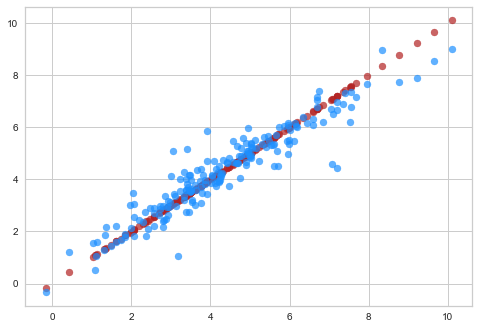

In [407]:
ShowYTrueYPredError(gbr_opti, X_test, y_test)

#### XGBoost

**XGBoost** signifie *Extreme Gradient Boosting*.<br />
Il est assez similaire à l'algorithme *GradientBoosting*.<br />
Il s'agit d'une implémentation spécifique du modèle *Gradient Boosting*<br />
qui utilise des **approximations plus précises** pour trouver<br/>
**le meilleur modèle d'arbre de décision**.<br />
Les deux algorithmes suivent le principe de **descente de gradient**.

**XGBoost** est plus rapide à l'exécution que *GradientBoosting*.

<u>Liste non exaustive des avantages de XGBoost sur GradientBoosting</u> : 
 - **XGBoost** utilise les techniques de **régularisation (L1 et L2)** <br />
   pour diminuer le surapprentissage.
 - Implémente un traitement **parallèle** dans la génération des arbres <br />
   de décision et est donc plus rapide à l’entraînement que *GradientBoosting*
   - Il s'agit bien là d'un traitement en parallèle <br />
     dans un algorithme de boosting, donc séquentiel


<u>Entrainement avec les paramètres par défaut</u> :

In [408]:
xgbr = XGBRegressor(random_state=RS)
xgbr.fit(X_train, y_train)


displayMetrics(xgbr, X_test, y_test)

##################################################
R²-------------------------------------------0.85
     Mean Absolute Error---------------------0.47
     Mean Square Error-----------------------0.51
Root Mean Square Error-----------------------0.71
##################################################


{'R²': 0.85, 'MAE': 0.47, 'MSE': 0.51, 'RMSE': 0.71, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [409]:
param_grid = {'eta':[0.1,0.2],
              'gamma':np.linspace(0,0.2,3),
              'max_depth': range(2,6,2),
              'subsample': np.linspace(0.5,0.8,4),
              'colsample_bytree': np.linspace(0.5,0.8,4)
             }


grid = GridSearchCV(XGBRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2'
                   )

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

xgbr_opti = grid.best_estimator_

Meilleurs paramètres: {'colsample_bytree': 0.8, 'eta': 0.2, 'gamma': 0.2, 'max_depth': 2, 'subsample': 0.8}
Meilleur score: 0.8928660804441358


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [410]:
dictAlgoScore['XGBRegressor'] = displayMetrics(xgbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.86
     Mean Absolute Error---------------------0.45
     Mean Square Error-----------------------0.45
Root Mean Square Error-----------------------0.67
Process Time---------------------------------48.04s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

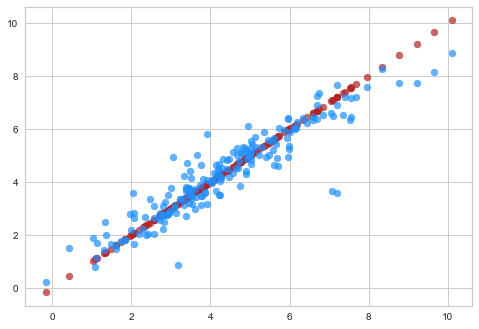

In [411]:
ShowYTrueYPredError(xgbr_opti, X_test, y_test)

#### Affichage des résulats des différents algorithmes

In [412]:
displayBestAlgo(dictAlgoScore, 'R²')

###########################################################################
Classement des différents algorithmes testés selon la métric:--------- R²
Les algorithmes testés sont affichées du plus au moins performant.
##################################################
1 GradientBoostingRegressor------------ R²: 0.89
2 Ridge-------------------------------- R²: 0.86
3 SVR---------------------------------- R²: 0.86
4 XGBRegressor------------------------- R²: 0.86
5 Lasso-------------------------------- R²: 0.85
6 KernelRidge-------------------------- R²: 0.84
7 AdaBoostRegressor-------------------- R²: 0.83
8 RandomForestRegressor---------------- R²: 0.82
9 KNeighborsRegressor------------------ R²: 0.44
10 DummyRegressor----------------------- R²: -0.02
##################################################
Algorithme testé-------------- GradientBoostingRegressor
R²-------------------------------------------0.89
     Mean Absolute Error---------------------0.42
     Mean Square Error----------

### Label = **SiteEnergyUse** | **ENERGYSTARScore** = OFF

#### Initialisation du DataFrame

In [413]:
df = df_Energy[df_Energy.ENERGYSTARScore.notnull()]

#### Initialisation du dictionnaire destiné à enregistrer <br />les performances des différents algorithmes

In [414]:
dictAlgoScore = {}

#### Sélection des Features et Label

In [415]:
X = df.drop(['SiteEnergyUse','ENERGYSTARScore'], axis=1)

y = df.SiteEnergyUse

#### Création du train set et du test set

In [416]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RS)

#### Application de modèle Dummy pour établir une baseline

In [417]:
dummy_regr = DummyRegressor(strategy='mean')
pcStart = perf_counter()
dummy_regr.fit(X,y)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [418]:
dictAlgoScore['DummyRegressor'] = displayMetrics(dummy_regr, X_test, y_test, pcStart, pcEnd)

##################################################
R²--------------------------------------------0.01
     Mean Absolute Error---------------------1.35
     Mean Square Error-----------------------2.75
Root Mean Square Error-----------------------1.66
Process Time---------------------------------0.0s
##################################################


<u>Affichage des prédictions '**y_pred**' en bleu en fonction <br />
    de la valeur réelle de y '**y_true**' en rouge</u> :

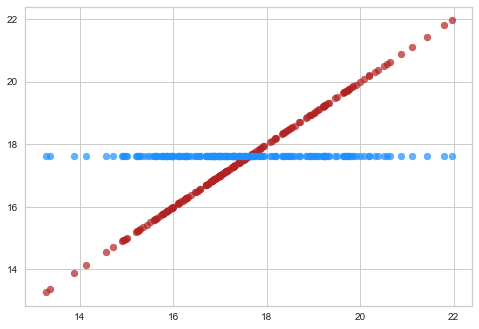

In [419]:
ShowYTrueYPredError(dummy_regr, X_test, y_test)

<u>J'enregistre également la MSE de ma baseline afin de pouvoir l'afficher <br />
dans des graphiques où on affichera l'erreur des algorithmes en fonction de certains paramètres</u> :

In [420]:
baseline_error = mean_squared_error(y_test, dummy_regr.predict(X_test))

#### KNN Linéaire

Version Linéaire de l'algorithme des K plus proches voisins.

Je test l'algortithme avec différentes valeurs de k,<br /> 
allant de k = 1 à k = 49.<br />
Je procède cette fois-ci à une cross-validation.<br />
J'affiche ensuite le score du train-set et du validation-set en fonction de k.

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass param_name=n_neighbors, param_range=[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


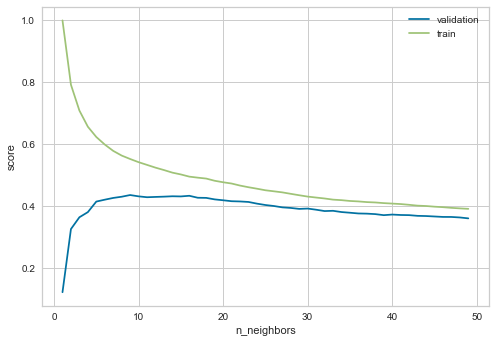

In [421]:
knn = KNeighborsRegressor()
k = np.arange(1, 50)

train_score, val_score = validation_curve(knn,
                                          X_train,
                                          y_train,
                                          'n_neighbors',
                                          k,
                                          cv=5)

plt.plot(k,val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

On observe un maximum pour le score du validation-set entre k=15 et k=17.

<u>Je réalise maintenant une recherche des meilleurs *hyperparamètres*<br />
avec **GridSearchCV** en testant les autres *hyperparamètres* existants</u> :

In [422]:
param_grid = {'n_neighbors': np.arange(1,20),
              'metric': ['euclidean', 'manhattan'],
              'weights': ['uniform', 'distance']}
grid = GridSearchCV(KNeighborsRegressor(), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

knn_opti = grid.best_estimator_

Meilleurs paramètres: {'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}
Meilleur score: 0.4900727618005406


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [423]:
dictAlgoScore['KNeighborsRegressor'] = displayMetrics(knn_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.42
     Mean Absolute Error---------------------0.95
     Mean Square Error-----------------------1.57
Root Mean Square Error-----------------------1.25
Process Time---------------------------------9.2s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

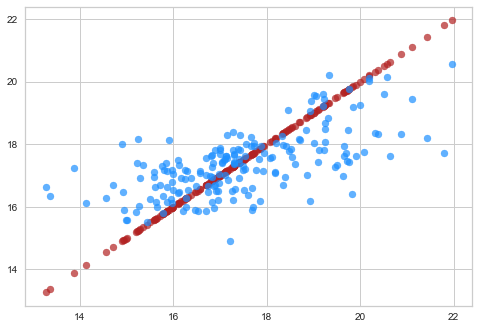

In [424]:
ShowYTrueYPredError(knn_opti, X_test, y_test)

#### Regression Ridge

<u>La régression Ridge est un régression linéaire</u> avec une contrainte **quadratique** sur les coefficients. <br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La Régression Ridge va appliquer des pénalités aux variables corrélées <br />
et va appliquer aux variables corrélées le même poids à chacune d'entre-elles. <br />
De cette façon, les variables corrélées n'auront pas plus d'influence <br />
qu'une variable seule non corrélée avec les autres variables du jeu de données.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Ridge** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [425]:
ridge = Ridge(random_state=RS)

n_alphas = 1000
alphas = np.logspace(-5,6, n_alphas)

coefs = []
errors = []

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)
    errors.append(np.mean((ridge.predict(X_test) - y_test) ** 2))

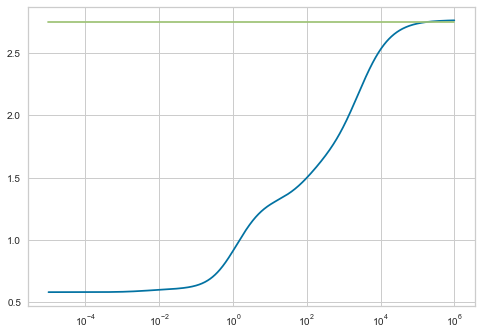

In [426]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**6], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [427]:
np.argmin(errors)

0

In [428]:
errors[np.argmin(errors)]

0.5774735158294684

In [429]:
alphas[np.argmin(errors)]

1e-05

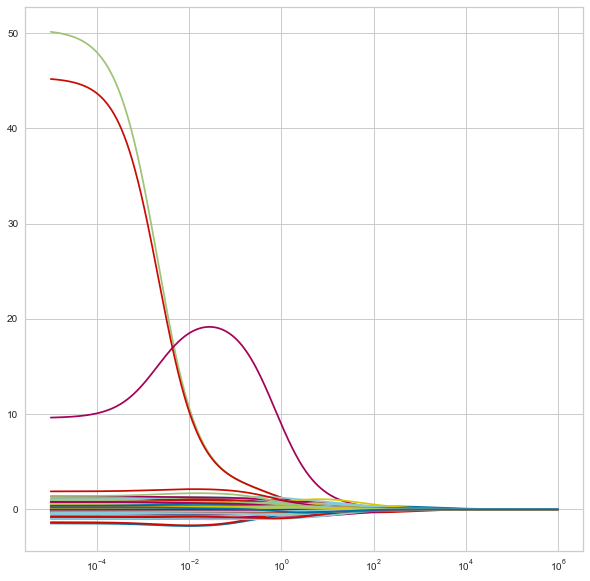

In [430]:
plt.figure(figsize=(10,10))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [431]:
param_grid = {'alpha': np.logspace(-5, 10, 200)}
grid = GridSearchCV(Ridge(random_state=RS), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

ridge_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 9.547716114208066e-05}
Meilleur score: 0.7100761991458141


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [432]:
dictAlgoScore['Ridge'] = displayMetrics(ridge_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.79
     Mean Absolute Error---------------------0.58
     Mean Square Error-----------------------0.58
Root Mean Square Error-----------------------0.76
Process Time---------------------------------4.93s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

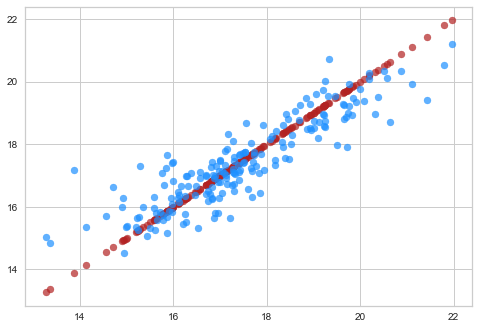

In [433]:
ShowYTrueYPredError(ridge_opti, X_test, y_test)

#### Regression Lasso

<u>La régression Lasso est une régression linéaire</u> avec une contrainte **linéaire** sur les coefficients.<br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La **Régression Lasso** va appliquer des pénalités aux variables corrélées <br />
et ne conserver qu'une seule variable parmi les variables corrélées <br />
et passer le coefficiant des autres variables corrélées à 0.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Lasso** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [434]:
n_alphas = 300
alphas = np.logspace(-5, 1, n_alphas)
lasso = Lasso(fit_intercept=False,
              random_state=RS)

coefs = []
errors = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    errors.append(np.mean((lasso.predict(X_test) - y_test) ** 2))

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 320.7755652335859, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 320.78589253716336, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 320.796677240172, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 321.3167025664842, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 321.34939565010325, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 321.38337899550896, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323.12271999008857, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323.20355593584515, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323.28321307779566, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 309.324078611538, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306.42846925440597, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 303.01509697278465, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 218.6939492105035, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 212.69231752798942, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207.0960143346852, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.806942063418546, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.081419612622994, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.35109909840298, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.46622403974675, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.25747138649683, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.659179077422095, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

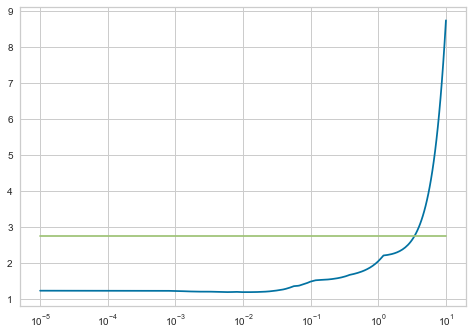

In [435]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**1], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [436]:
np.argmin(errors)

152

In [437]:
errors[np.argmin(errors)]

1.199200249720102

In [438]:
alphas[np.argmin(errors)]

0.011224505680853071

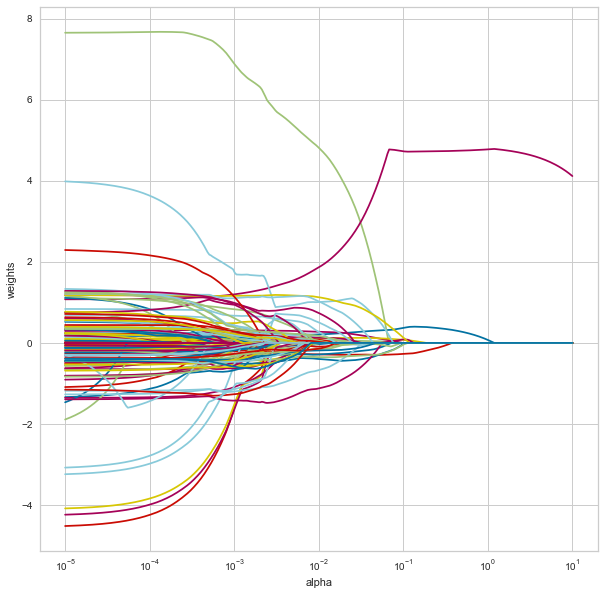

In [439]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.axis('tight')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [440]:
param_grid = {'alpha': np.logspace(-5, 10, 300)}
grid = GridSearchCV(Lasso(random_state=RS), param_grid, cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

lasso_opti = grid.best_estimator_

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65.28896053538647, tolerance: 0.16126294909239577
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.127871898906108, tolerance: 0.15662657272600905
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.830693022237483, tolerance: 0.15208229338138207
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergen

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.266925200400522, tolerance: 0.15208229338138207
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.43820343528182093, tolerance: 0.16126294909239577
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.356755677286941, tolerance: 0.15662657272600905
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Converge

Meilleurs paramètres: {'alpha': 0.0025587435201685892}
Meilleur score: 0.7279484521773794


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [441]:
dictAlgoScore['Lasso'] = displayMetrics(lasso_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.76
     Mean Absolute Error---------------------0.6
     Mean Square Error-----------------------0.65
Root Mean Square Error-----------------------0.81
Process Time---------------------------------12.79s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

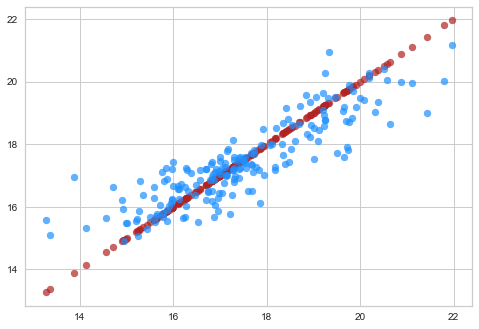

In [442]:
ShowYTrueYPredError(lasso_opti, X_test, y_test)

#### Support Vector Regression (SVR)

Les algorithmes Support Vector Machine sont généralement utilisés dans des problèmes de classification.<br />
L'idée de cet algorithme est de trouver un **hyperplan** qui divise notre jeu de données en deux.<br />
SVR est la version Regression du Support Vector Machine (SVM).

Cet algorithme fonctionne bien sur de petits dataset.<br />
Son entrainement peut-être long et il est sensible aux Outliers.

<u>Premier essai avec les paramètres par défaut</u> :

In [443]:
svr = SVR()
svr.fit(X_train, y_train)
displayMetrics(svr, X_test, y_test)

##################################################
R²-------------------------------------------0.55
     Mean Absolute Error---------------------0.83
     Mean Square Error-----------------------1.22
Root Mean Square Error-----------------------1.1
##################################################


{'R²': 0.55, 'MAE': 0.83, 'MSE': 1.22, 'RMSE': 1.1, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **RandomizedSearchCV**</u> :<br />
*J'utilise RandomizedSearchCV car la recherche des meilleurs hyperparamètres est particulièrement longue avec **SVR***

In [444]:
param_grid = {'kernel': ['linear','rbf'],
              'degree': range(3,5),
              'gamma' : np.logspace(-2, 1, 4),
              'C': np.logspace(-3, 3, 7)}

grid = RandomizedSearchCV(SVR(), 
                          param_grid, 
                          cv=5, 
                          scoring='r2',
                          n_iter = 10)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)


svr_opti = grid.best_estimator_

Meilleurs paramètres: {'kernel': 'linear', 'gamma': 0.1, 'degree': 3, 'C': 1000.0}
Meilleur score: 0.7264286216657163


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [445]:
dictAlgoScore['SVR'] = displayMetrics(svr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.76
     Mean Absolute Error---------------------0.58
     Mean Square Error-----------------------0.64
Root Mean Square Error-----------------------0.8
Process Time---------------------------------335.95s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

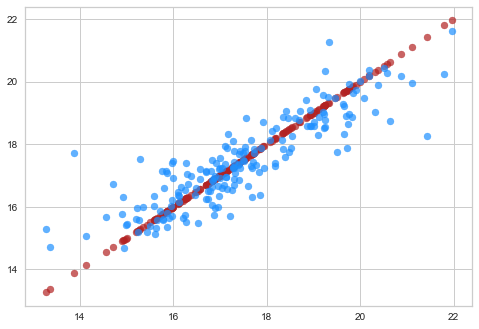

In [446]:
ShowYTrueYPredError(svr_opti, X_test, y_test)

#### Regression Ridge à noyau (Kernel Ridge)

La Regression Ridge à noyau est une regression ridge <br />
à laquelle nous appliquons l'astuce du noyau.<br />
L'astuce du noyau (Kernel Trick) est une méthode qui permet <br />
d'utiliser un classifieur linéaire pour résoudre un problème non linéaire.<br />
L'idée est de transformer l'espace de représentation des données d'entrée <br />
en un espace de plus grande dimension.<br />
La discrimination linéaire dans l'espace de grande dimension<br /> 
(appelé aussi espace de redescription) est équivalente à une discrimination <br />
non linéaire dans l'espace d'origine.

<u>Premier essai avec les paramètres par défaut</u> :

In [447]:
kr = KernelRidge()
kr.fit(X_train, y_train)
displayMetrics(kr, X_test, y_test)

##################################################
R²-------------------------------------------0.62
     Mean Absolute Error---------------------0.77
     Mean Square Error-----------------------1.03
Root Mean Square Error-----------------------1.02
##################################################


{'R²': 0.62, 'MAE': 0.77, 'MSE': 1.03, 'RMSE': 1.02, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [448]:
param_grid = {'kernel':['rbf','linear','poly'],
              'degree':[3,4],
              'alpha': np.logspace(-2, 2, 5),
              'gamma': np.logspace(-2, 1, 4)}

grid = GridSearchCV(KernelRidge(), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

kr_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.01, 'degree': 3, 'gamma': 0.01, 'kernel': 'poly'}
Meilleur score: 0.6747774605790281


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [449]:
dictAlgoScore['KernelRidge'] = displayMetrics(kr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.73
     Mean Absolute Error---------------------0.67
     Mean Square Error-----------------------0.73
Root Mean Square Error-----------------------0.86
Process Time---------------------------------8.11s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

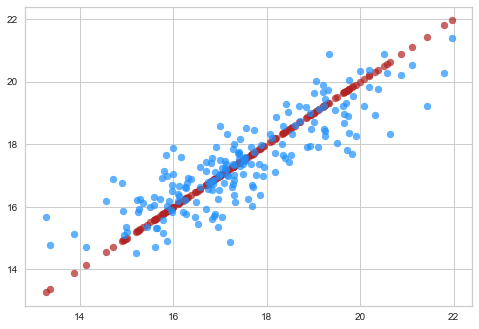

In [450]:
ShowYTrueYPredError(kr_opti, X_test, y_test)

#### Arbre de Décision Aléatoire (Random Forest)

L'algorithme **Random Forest** fait partie des algorithmes qui utilisent <br />
la méthode du **bagging** et fait donc partie des algorithmes **ensemblistes**.

<u>Rappel sur le bagging</u> :
Bagging est une contraction de **Bootstrap Aggregation**.<br />
Le bagging a pour objectif de réduire la variance de l’estimateur (les problèmes liés <br />
au surapprentissage, et donc qu'une petite modification en entrée (jeu de données) entraîne <br />
de grandes différences en sortie).


L'idée est de créer plusieurs entités d'un même modèle <br />
et d'entrainer chacune de ces entités sur une portion aléatoire <br />
de notre jeu de données.<br />
Pour cela on utilise une technique d'échantillonnage appelé **Bootstrapping**.<br />
Cette technique consiste à replacer après chaque tirage au sort, <br />
les données qui ont été sélectionnées dans notre jeu de données (on parle <br />
alors de tirage avec remise).<br />
De cette manière, on obtient un groupe de modèles diversifiés (ils n'ont <br />
pas tous été nourris avec les mêmes données mais ils partagent cependant <br />
certaines connaissances en commun) ce qui nous permet d’obtenir des majorités <br />
en faveur des bonnes réponses.<br />
On regroupe ensuite les résultats de chaque modèle pour faire notre prédiction finale.<br />
**Random Forest** est l'algorithme le plus connu utilisant cette technique.<br />
Il utilise comme modèle de base, l'arbre de décision.<br />
Le nom de **Random Forest** est logiquement choisi comme tel car nous générons <br />
des *arbres* de décision *aléatoirement*. <br />
En cela nous créons donc une *forêt* aléatoire.

<u>Entrainement avec les paramètres par défaut et n_estimator = 1000</u> :

In [451]:
rfr = RandomForestRegressor(n_estimators=1000, 
                            n_jobs=-1,
                            random_state=RS)
pcStart = perf_counter()
rfr.fit(X_train, y_train)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [452]:
dictAlgoScore['RandomForestRegressor'] = displayMetrics(rfr, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.79
     Mean Absolute Error---------------------0.53
     Mean Square Error-----------------------0.56
Root Mean Square Error-----------------------0.75
Process Time---------------------------------1.2s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

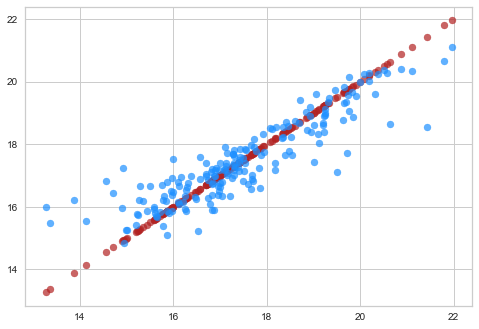

In [453]:
ShowYTrueYPredError(rfr, X_test, y_test)

#### AdaBoost

AdaBoost est une méthode de Boosting et fait donc <br />
également partie des algorithmes ensemblistes.

L'idée est d'entraîner l'un après l'autre plusieurs modèle relativement faibles <br />
en demandant à chaque modèle d'essayer de corriger les erreurs effectuées par son prédecesseur.<br />
On obtient ainsi un ensemble de modèles complèmentaires dans lequel <br />
les faiblesses des uns sont compensées par les forces des autres.

Ici les modèles sont entraînés en série.<br />
Chaque modèle est en situation d'underfitting mais en les construisant <br />
les uns par dessus les autres, on est capable de réduire le biais général de tous ces modèles.

Adaboost est un algorithme de boosting qui s’appuie sur ce principe, <br />
avec un paramètre de mise à jour adaptatif permettant de donner plus <br />
d’importance aux valeurs difficiles à prédire, donc en boostant les régresseurs<br />
qui réussissent quand d’autres ont échoué.

<u>Entrainement avec les paramètres par défaut</u> :

In [454]:
adb = AdaBoostRegressor(random_state=RS)
adb.fit(X_train, y_train)
displayMetrics(adb, X_test, y_test)

##################################################
R²-------------------------------------------0.71
     Mean Absolute Error---------------------0.66
     Mean Square Error-----------------------0.79
Root Mean Square Error-----------------------0.89
##################################################


{'R²': 0.71, 'MAE': 0.66, 'MSE': 0.79, 'RMSE': 0.89, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [455]:
param_grid = {"base_estimator__max_depth" : np.linspace(10,100,10),
              "n_estimators": [100, 200, 300]
             }


DTR = DecisionTreeRegressor(random_state=RS)

ABR = AdaBoostRegressor(base_estimator = DTR,
                        random_state=RS)


grid = GridSearchCV(ABR,
                    param_grid=param_grid,
                    scoring = 'r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

adb_opti = grid.best_estimator_

Meilleurs paramètres: {'base_estimator__max_depth': 30.0, 'n_estimators': 200}
Meilleur score: 0.7340977518558078


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [456]:
dictAlgoScore['AdaBoostRegressor'] = displayMetrics(adb_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.79
     Mean Absolute Error---------------------0.52
     Mean Square Error-----------------------0.57
Root Mean Square Error-----------------------0.75
Process Time---------------------------------166.45s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

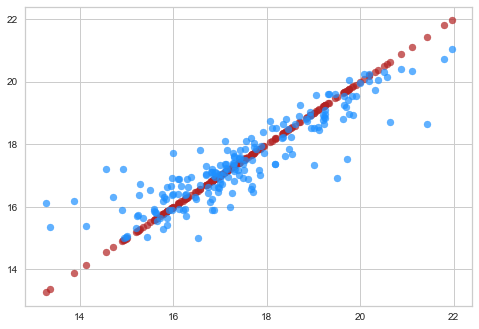

In [457]:
ShowYTrueYPredError(adb_opti, X_test, y_test)

#### GradientBoosting

Comme son nom l'indique, **GradientBoosting** est un algorithme de **boosting**.<br />
En celà il reprend le même principe de fonctionnement qu'*AdaBoost*.

**GradiantBoosting** diffère d'*AdaBoost* sur sa fonction de perte, <br />
qui s'appuie sur la <u>descente de gradient</u>.

La perte représente la pénalité générée lorsque l'estimation par le modèle <br />
n'est pas parfaitement égale à la cible.<br />
Une fonction de perte quantifie cette pénalité sous la forme d'une valeur individuelle.

La descente de gradient est un algorithme qui permet de trouver le minimum d’une fonction.<br />
Le calcul de la dérivée en un point d'une fonction nous permet de définir <br />
la pente de cette fonction et donc de définir le sens dans lequel il faut<br />
se déplacer sur cette fonction pour se rapprocher de son minimum (local).

<u>Entrainement avec les paramètres par défaut</u> :

In [458]:
gbr = GradientBoostingRegressor(random_state=RS)
gbr.fit(X_train, y_train)
displayMetrics(gbr, X_test, y_test)

##################################################
R²-------------------------------------------0.81
     Mean Absolute Error---------------------0.53
     Mean Square Error-----------------------0.52
Root Mean Square Error-----------------------0.72
##################################################


{'R²': 0.81, 'MAE': 0.53, 'MSE': 0.52, 'RMSE': 0.72, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [459]:
param_grid = {'learning_rate': [0.1,0.2,0.3],
              'n_estimators':[100,200,300,400,500],
              'subsample': [0.4,0.5,0.6,1],
              'max_depth': [2,3]}

grid = GridSearchCV(GradientBoostingRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

gbr_opti = grid.best_estimator_

Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200, 'subsample': 1}
Meilleur score: 0.7594714415850332


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [460]:
dictAlgoScore['GradientBoostingRegressor'] = displayMetrics(gbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.82
     Mean Absolute Error---------------------0.52
     Mean Square Error-----------------------0.5
Root Mean Square Error-----------------------0.71
Process Time---------------------------------173.73s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

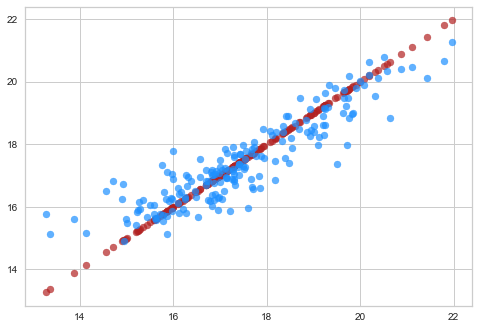

In [461]:
ShowYTrueYPredError(gbr_opti, X_test, y_test)

#### XGBoost

**XGBoost** signifie *Extreme Gradient Boosting*.<br />
Il est assez similaire à l'algorithme *GradientBoosting*.<br />
Il s'agit d'une implémentation spécifique du modèle *Gradient Boosting*<br />
qui utilise des **approximations plus précises** pour trouver<br/>
**le meilleur modèle d'arbre de décision**.<br />
Les deux algorithmes suivent le principe de **descente de gradient**.

**XGBoost** est plus rapide à l'exécution que *GradientBoosting*.

<u>Liste non exaustive des avantages de XGBoost sur GradientBoosting</u> : 
 - **XGBoost** utilise les techniques de **régularisation (L1 et L2)** <br />
   pour diminuer le surapprentissage.
 - Implémente un traitement **parallèle** dans la génération des arbres <br />
   de décision et est donc plus rapide à l’entraînement que *GradientBoosting*
   - Il s'agit bien là d'un traitement en parallèle <br />
     dans un algorithme de boosting, donc séquentiel


<u>Entrainement avec les paramètres par défaut</u> :

In [462]:
xgbr = XGBRegressor(random_state=RS)
xgbr.fit(X_train, y_train)


displayMetrics(xgbr, X_test, y_test)

##################################################
R²-------------------------------------------0.79
     Mean Absolute Error---------------------0.57
     Mean Square Error-----------------------0.56
Root Mean Square Error-----------------------0.75
##################################################


{'R²': 0.79, 'MAE': 0.57, 'MSE': 0.56, 'RMSE': 0.75, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [463]:
param_grid = {'eta':[0.1,0.2],
              'gamma':np.linspace(0,0.2,3),
              'max_depth': range(2,6,2),
              'subsample': np.linspace(0.5,0.8,4),
              'colsample_bytree': np.linspace(0.5,0.8,4)
             }


grid = GridSearchCV(XGBRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2'
                   )

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

xgbr_opti = grid.best_estimator_

Meilleurs paramètres: {'colsample_bytree': 0.6, 'eta': 0.1, 'gamma': 0.0, 'max_depth': 4, 'subsample': 0.7000000000000001}
Meilleur score: 0.75911881090972


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [464]:
dictAlgoScore['XGBRegressor'] = displayMetrics(xgbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.8
     Mean Absolute Error---------------------0.56
     Mean Square Error-----------------------0.54
Root Mean Square Error-----------------------0.73
Process Time---------------------------------42.61s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

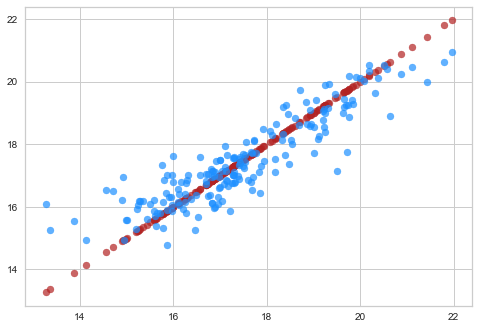

In [465]:
ShowYTrueYPredError(xgbr_opti, X_test, y_test)

#### Affichage des résulats des différents algorithmes

In [466]:
displayBestAlgo(dictAlgoScore, 'R²')

###########################################################################
Classement des différents algorithmes testés selon la métric:--------- R²
Les algorithmes testés sont affichées du plus au moins performant.
##################################################
1 GradientBoostingRegressor------------ R²: 0.82
2 XGBRegressor------------------------- R²: 0.8
3 Ridge-------------------------------- R²: 0.79
4 RandomForestRegressor---------------- R²: 0.79
5 AdaBoostRegressor-------------------- R²: 0.79
6 Lasso-------------------------------- R²: 0.76
7 SVR---------------------------------- R²: 0.76
8 KernelRidge-------------------------- R²: 0.73
9 KNeighborsRegressor------------------ R²: 0.42
10 DummyRegressor----------------------- R²: -0.01
##################################################
Algorithme testé-------------- GradientBoostingRegressor
R²-------------------------------------------0.82
     Mean Absolute Error---------------------0.52
     Mean Square Error-----------

### Label = **SiteEnergyUse** | **ENERGYSTARScore** = ON

#### Initialisation du DataFrame

In [467]:
df = df_Energy[df_Energy.ENERGYSTARScore.notnull()]

#### Initialisation du dictionnaire destiné à enregistrer <br />les performances des différents algorithmes

In [468]:
dictAlgoScore = {}

#### Sélection des Features et Label

In [469]:
X = df.drop(['SiteEnergyUse'], axis=1)

y = df.SiteEnergyUse

#### Création du train set et du test set

In [470]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RS)

#### Application de modèle Dummy pour établir une baseline

In [471]:
dummy_regr = DummyRegressor(strategy='mean')
pcStart = perf_counter()
dummy_regr.fit(X,y)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [472]:
dictAlgoScore['DummyRegressor'] = displayMetrics(dummy_regr, X_test, y_test, pcStart, pcEnd)

##################################################
R²--------------------------------------------0.01
     Mean Absolute Error---------------------1.35
     Mean Square Error-----------------------2.75
Root Mean Square Error-----------------------1.66
Process Time---------------------------------0.0s
##################################################


<u>Affichage des prédictions '**y_pred**' en bleu en fonction <br />
    de la valeur réelle de y '**y_true**' en rouge</u> :

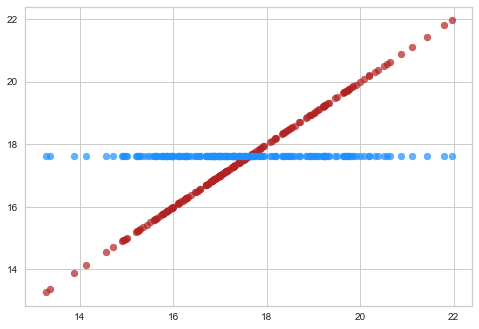

In [473]:
ShowYTrueYPredError(dummy_regr, X_test, y_test)

<u>J'enregistre également la MSE de ma baseline afin de pouvoir l'afficher <br />
dans des graphiques où on affichera l'erreur des algorithmes en fonction de certains paramètres</u> :

In [474]:
baseline_error = mean_squared_error(y_test, dummy_regr.predict(X_test))

#### KNN Linéaire

Version Linéaire de l'algorithme des K plus proches voisins.

Je test l'algortithme avec différentes valeurs de k,<br /> 
allant de k = 1 à k = 49.<br />
Je procède cette fois-ci à une cross-validation.<br />
J'affiche ensuite le score du train-set et du validation-set en fonction de k.

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass param_name=n_neighbors, param_range=[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


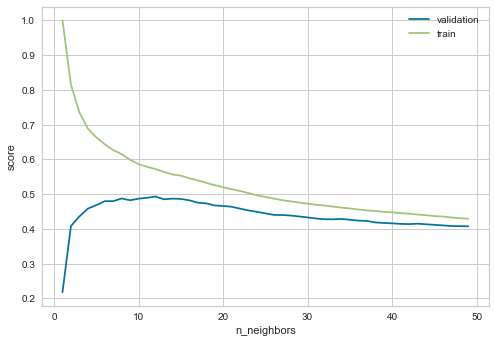

In [475]:
knn = KNeighborsRegressor()
k = np.arange(1, 50)

train_score, val_score = validation_curve(knn,
                                          X_train,
                                          y_train,
                                          'n_neighbors',
                                          k,
                                          cv=5)

plt.plot(k,val_score.mean(axis=1), label='validation')
plt.plot(k, train_score.mean(axis=1), label='train')

plt.ylabel('score')
plt.xlabel('n_neighbors')
plt.legend()

On observe un maximum pour le score du validation-set entre k=15 et k=17.

<u>Je réalise maintenant une recherche des meilleurs *hyperparamètres*<br />
avec **GridSearchCV** en testant les autres *hyperparamètres* existants</u> :

In [476]:
param_grid = {'n_neighbors': np.arange(1,20),
              'metric': ['euclidean', 'manhattan'],
              'weights': ['uniform', 'distance']}
grid = GridSearchCV(KNeighborsRegressor(), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

knn_opti = grid.best_estimator_

Meilleurs paramètres: {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}
Meilleur score: 0.5289524856304872


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [477]:
dictAlgoScore['KNeighborsRegressor'] = displayMetrics(knn_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.42
     Mean Absolute Error---------------------0.94
     Mean Square Error-----------------------1.59
Root Mean Square Error-----------------------1.26
Process Time---------------------------------9.43s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

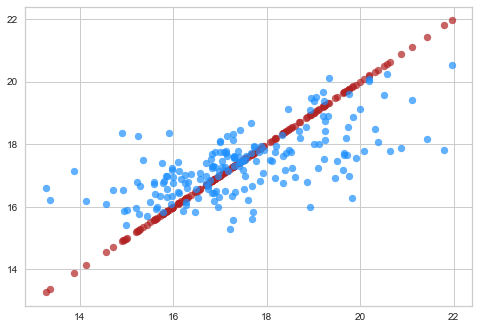

In [478]:
ShowYTrueYPredError(knn_opti, X_test, y_test)

#### Regression Ridge

<u>La régression Ridge est un régression linéaire</u> avec une contrainte **quadratique** sur les coefficients. <br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La Régression Ridge va appliquer des pénalités aux variables corrélées <br />
et va appliquer aux variables corrélées le même poids à chacune d'entre-elles. <br />
De cette façon, les variables corrélées n'auront pas plus d'influence <br />
qu'une variable seule non corrélée avec les autres variables du jeu de données.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Ridge** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [479]:
ridge = Ridge(random_state=RS)

n_alphas = 1000
alphas = np.logspace(-5,6, n_alphas)

coefs = []
errors = []

for a in alphas:
    ridge.set_params(alpha=a)
    ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)
    errors.append(np.mean((ridge.predict(X_test) - y_test) ** 2))

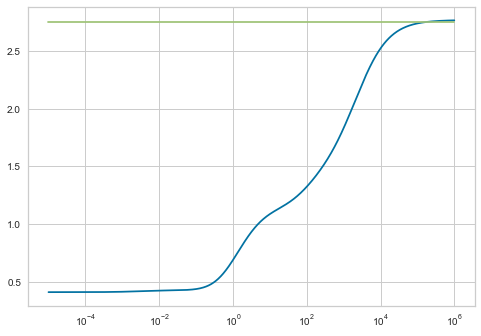

In [480]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**6], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [481]:
np.argmin(errors)

0

In [482]:
errors[np.argmin(errors)]

0.41057373594761676

In [483]:
alphas[np.argmin(errors)]

1e-05

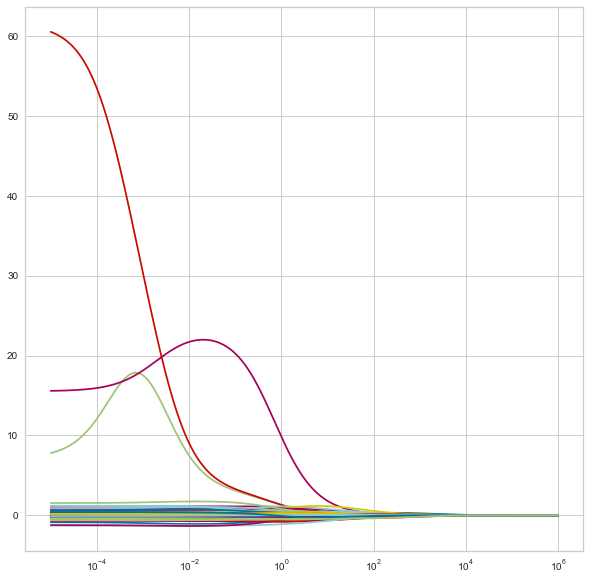

In [484]:
plt.figure(figsize=(10,10))
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [485]:
param_grid = {'alpha': np.logspace(-5, 10, 200)}
grid = GridSearchCV(Ridge(random_state=RS), 
                    param_grid, 
                    cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

ridge_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 1e-05}
Meilleur score: 0.842322453142992


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [486]:
dictAlgoScore['Ridge'] = displayMetrics(ridge_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.85
     Mean Absolute Error---------------------0.44
     Mean Square Error-----------------------0.41
Root Mean Square Error-----------------------0.64
Process Time---------------------------------5.05s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

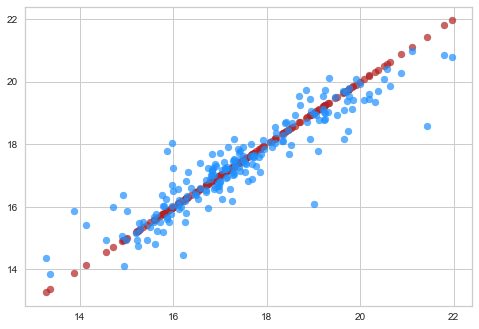

In [487]:
ShowYTrueYPredError(ridge_opti, X_test, y_test)

#### Regression Lasso

<u>La régression Lasso est une régression linéaire</u> avec une contrainte **linéaire** sur les coefficients.<br />
Elle est utile lorsque les variables sont très corrélées, ce qui fausse souvent la résolution numérique.<br />
La **Régression Lasso** va appliquer des pénalités aux variables corrélées <br />
et ne conserver qu'une seule variable parmi les variables corrélées <br />
et passer le coefficiant des autres variables corrélées à 0.

La pénalité appliquée aux variables dépend d'un paramètre **alpha**.<br />
Je vais donc tester la **Régression Lasso** avec plusieurs valeurs possibles d'**alpha**.

Je réalise une première application '*à la main*' où j'afficherai les pénalités <br />
appliquées aux variables en fonction de **alpha**, puis j'effectuerai dans un second temps<br />
une recherche du meilleur **alpha** ainsi qu'une *CrossValidation* avec *GridSearchCV*.

In [488]:
n_alphas = 300
alphas = np.logspace(-5, 1, n_alphas)
lasso = Lasso(fit_intercept=False,
              random_state=RS)

coefs = []
errors = []
for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    errors.append(np.mean((lasso.predict(X_test) - y_test) ** 2))

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259.9305637025103, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259.9446901182932, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259.9594517627556, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWar

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 260.83331932035253, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 260.88828775048887, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 260.9464619365623, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 264.09837876591325, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 264.2531168000566, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 264.40722653254255, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259.7726423018036, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 258.468925819031, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 256.8975891390533, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarn

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 195.72760258737725, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 191.47048364582258, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186.9325658412306, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceW

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.048699874042995, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.17644943480764, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.28218113146147, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.45045920294581, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29.995573094802467, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.121370016806168, tolerance: 24.130455952597625
  model = cd_fast.enet_coordinate_descent(


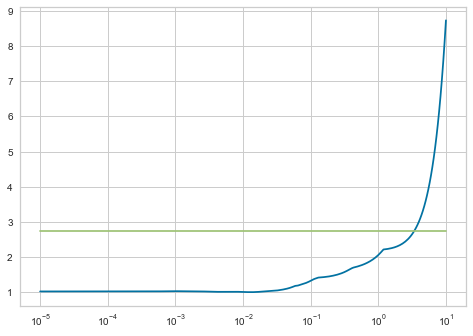

In [489]:
ax = plt.gca()
ax.plot(alphas, errors, [10**-5, 10**1], [baseline_error, baseline_error])
ax.set_xscale('log')
plt.show()

In [490]:
np.argmin(errors)

156

In [491]:
errors[np.argmin(errors)]

1.0020203059276187

In [492]:
alphas[np.argmin(errors)]

0.013503140378698736

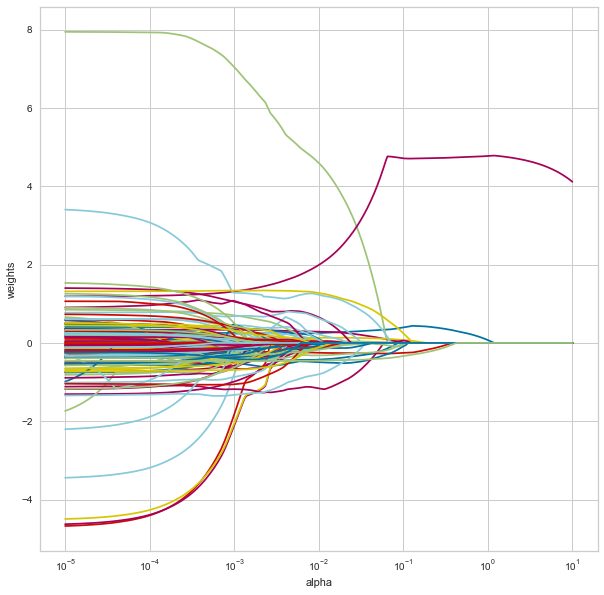

In [493]:
plt.figure(figsize=(10,10))
ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.axis('tight')
plt.show()

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [494]:
param_grid = {'alpha': np.logspace(-5, 10, 300)}
grid = GridSearchCV(Lasso(random_state=RS), param_grid, cv=5)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

lasso_opti = grid.best_estimator_

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.926752279304935, tolerance: 0.16126294909239577
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.580167346425114, tolerance: 0.1558135454755951
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.374247312591663, tolerance: 0.15662657272600905
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergence

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.46815939574897, tolerance: 0.1559707934773599
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.58569061250661, tolerance: 0.15208229338138207
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.395905982780747, tolerance: 0.16126294909239577
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWa

C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.224172521039563, tolerance: 0.16126294909239577
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.7797683257357733, tolerance: 0.15662657272600905
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.3291228920116964, tolerance: 0.1559707934773599
  model = cd_fast.enet_coordinate_descent(
C:\Users\waldu\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: Convergenc

Meilleurs paramètres: {'alpha': 0.0018093604107387166}
Meilleur score: 0.852155198444426


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [495]:
dictAlgoScore['Lasso'] = displayMetrics(lasso_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.83
     Mean Absolute Error---------------------0.46
     Mean Square Error-----------------------0.47
Root Mean Square Error-----------------------0.68
Process Time---------------------------------13.15s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

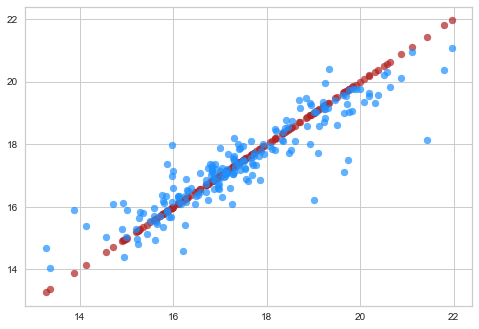

In [496]:
ShowYTrueYPredError(lasso_opti, X_test, y_test)

#### Support Vector Regression (SVR)

Les algorithmes Support Vector Machine sont généralement utilisés dans des problèmes de classification.<br />
L'idée de cet algorithme est de trouver un **hyperplan** qui divise notre jeu de données en deux.<br />
SVR est la version Regression du Support Vector Machine (SVM).

Cet algorithme fonctionne bien sur de petits dataset.<br />
Son entrainement peut-être long et il est sensible aux Outliers.

<u>Premier essai avec les paramètres par défaut</u> :

In [497]:
svr = SVR()
svr.fit(X_train, y_train)
displayMetrics(svr, X_test, y_test)

##################################################
R²-------------------------------------------0.6
     Mean Absolute Error---------------------0.78
     Mean Square Error-----------------------1.08
Root Mean Square Error-----------------------1.04
##################################################


{'R²': 0.6, 'MAE': 0.78, 'MSE': 1.08, 'RMSE': 1.04, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **RandomizedSearchCV**</u> :<br />
*J'utilise RandomizedSearchCV car la recherche des meilleurs hyperparamètres est particulièrement longue avec **SVR***

In [498]:
param_grid = {'kernel': ['linear','rbf'],
              'degree': range(3,5),
              'gamma' : np.logspace(-2, 1, 4),
              'C': np.logspace(-3, 3, 7)}

grid = RandomizedSearchCV(SVR(), 
                          param_grid, 
                          cv=5, 
                          scoring='r2',
                          n_iter = 10)

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)


svr_opti = grid.best_estimator_

Meilleurs paramètres: {'kernel': 'linear', 'gamma': 1.0, 'degree': 4, 'C': 100.0}
Meilleur score: 0.8472478304891304


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [499]:
dictAlgoScore['SVR'] = displayMetrics(svr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.84
     Mean Absolute Error---------------------0.43
     Mean Square Error-----------------------0.42
Root Mean Square Error-----------------------0.65
Process Time---------------------------------54.85s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

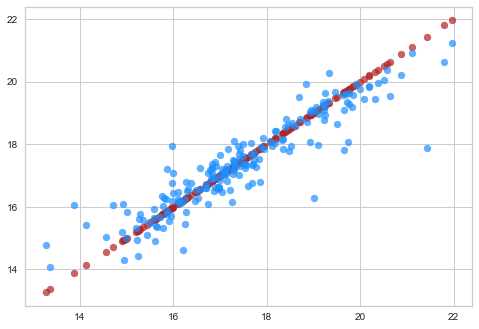

In [500]:
ShowYTrueYPredError(svr_opti, X_test, y_test)

#### Regression Ridge à noyau (Kernel Ridge)

La Regression Ridge à noyau est une regression ridge <br />
à laquelle nous appliquons l'astuce du noyau.<br />
L'astuce du noyau (Kernel Trick) est une méthode qui permet <br />
d'utiliser un classifieur linéaire pour résoudre un problème non linéaire.<br />
L'idée est de transformer l'espace de représentation des données d'entrée <br />
en un espace de plus grande dimension.<br />
La discrimination linéaire dans l'espace de grande dimension<br /> 
(appelé aussi espace de redescription) est équivalente à une discrimination <br />
non linéaire dans l'espace d'origine.

<u>Premier essai avec les paramètres par défaut</u> :

In [501]:
kr = KernelRidge()
kr.fit(X_train, y_train)
displayMetrics(kr, X_test, y_test)

##################################################
R²-------------------------------------------0.7
     Mean Absolute Error---------------------0.69
     Mean Square Error-----------------------0.82
Root Mean Square Error-----------------------0.91
##################################################


{'R²': 0.7, 'MAE': 0.69, 'MSE': 0.82, 'RMSE': 0.91, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [502]:
param_grid = {'kernel':['rbf','linear','poly'],
              'degree':[3,4],
              'alpha': np.logspace(-2, 2, 5),
              'gamma': np.logspace(-2, 1, 4)}

grid = GridSearchCV(KernelRidge(), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

kr_opti = grid.best_estimator_

Meilleurs paramètres: {'alpha': 0.01, 'degree': 3, 'gamma': 0.01, 'kernel': 'poly'}
Meilleur score: 0.8102527617997556


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [503]:
dictAlgoScore['KernelRidge'] = displayMetrics(kr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.82
     Mean Absolute Error---------------------0.52
     Mean Square Error-----------------------0.5
Root Mean Square Error-----------------------0.71
Process Time---------------------------------8.21s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

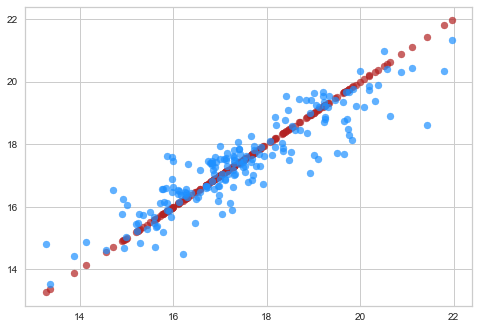

In [504]:
ShowYTrueYPredError(kr_opti, X_test, y_test)

#### Arbre de Décision Aléatoire (Random Forest)

L'algorithme **Random Forest** fait partie des algorithmes qui utilisent <br />
la méthode du **bagging** et fait donc partie des algorithmes **ensemblistes**.

<u>Rappel sur le bagging</u> :
Bagging est une contraction de **Bootstrap Aggregation**.<br />
Le bagging a pour objectif de réduire la variance de l’estimateur (les problèmes liés <br />
au surapprentissage, et donc qu'une petite modification en entrée (jeu de données) entraîne <br />
de grandes différences en sortie).


L'idée est de créer plusieurs entités d'un même modèle <br />
et d'entrainer chacune de ces entités sur une portion aléatoire <br />
de notre jeu de données.<br />
Pour cela on utilise une technique d'échantillonnage appelé **Bootstrapping**.<br />
Cette technique consiste à replacer après chaque tirage au sort, <br />
les données qui ont été sélectionnées dans notre jeu de données (on parle <br />
alors de tirage avec remise).<br />
De cette manière, on obtient un groupe de modèles diversifiés (ils n'ont <br />
pas tous été nourris avec les mêmes données mais ils partagent cependant <br />
certaines connaissances en commun) ce qui nous permet d’obtenir des majorités <br />
en faveur des bonnes réponses.<br />
On regroupe ensuite les résultats de chaque modèle pour faire notre prédiction finale.<br />
**Random Forest** est l'algorithme le plus connu utilisant cette technique.<br />
Il utilise comme modèle de base, l'arbre de décision.<br />
Le nom de **Random Forest** est logiquement choisi comme tel car nous générons <br />
des *arbres* de décision *aléatoirement*. <br />
En cela nous créons donc une *forêt* aléatoire.

<u>Entrainement avec les paramètres par défaut et n_estimator = 1000</u> :

In [505]:
rfr = RandomForestRegressor(n_estimators=1000, 
                            n_jobs=-1,
                            random_state=RS)
pcStart = perf_counter()
rfr.fit(X_train, y_train)
pcEnd = perf_counter()

<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [506]:
dictAlgoScore['RandomForestRegressor'] = displayMetrics(rfr, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.84
     Mean Absolute Error---------------------0.42
     Mean Square Error-----------------------0.45
Root Mean Square Error-----------------------0.67
Process Time---------------------------------1.21s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

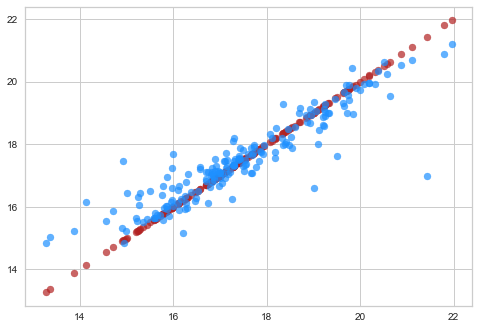

In [507]:
ShowYTrueYPredError(rfr, X_test, y_test)

#### AdaBoost

AdaBoost est une méthode de Boosting et fait donc <br />
également partie des algorithmes ensemblistes.

L'idée est d'entraîner l'un après l'autre plusieurs modèle relativement faibles <br />
en demandant à chaque modèle d'essayer de corriger les erreurs effectuées par son prédecesseur.<br />
On obtient ainsi un ensemble de modèles complèmentaires dans lequel <br />
les faiblesses des uns sont compensées par les forces des autres.

Ici les modèles sont entraînés en série.<br />
Chaque modèle est en situation d'underfitting mais en les construisant <br />
les uns par dessus les autres, on est capable de réduire le biais général de tous ces modèles.

Adaboost est un algorithme de boosting qui s’appuie sur ce principe, <br />
avec un paramètre de mise à jour adaptatif permettant de donner plus <br />
d’importance aux valeurs difficiles à prédire, donc en boostant les régresseurs<br />
qui réussissent quand d’autres ont échoué.

<u>Entrainement avec les paramètres par défaut</u> :

In [508]:
adb = AdaBoostRegressor(random_state=RS)
adb.fit(X_train, y_train)
displayMetrics(adb, X_test, y_test)

##################################################
R²-------------------------------------------0.77
     Mean Absolute Error---------------------0.57
     Mean Square Error-----------------------0.63
Root Mean Square Error-----------------------0.79
##################################################


{'R²': 0.77, 'MAE': 0.57, 'MSE': 0.63, 'RMSE': 0.79, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [509]:
param_grid = {"base_estimator__max_depth" : np.linspace(10,100,10),
              "n_estimators": [100, 200, 300]
             }


DTR = DecisionTreeRegressor(random_state=RS)

ABR = AdaBoostRegressor(base_estimator = DTR,
                        random_state=RS)


grid = GridSearchCV(ABR,
                    param_grid=param_grid,
                    scoring = 'r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

adb_opti = grid.best_estimator_

Meilleurs paramètres: {'base_estimator__max_depth': 30.0, 'n_estimators': 200}
Meilleur score: 0.8322618250286726


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [510]:
dictAlgoScore['AdaBoostRegressor'] = displayMetrics(adb_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.84
     Mean Absolute Error---------------------0.42
     Mean Square Error-----------------------0.45
Root Mean Square Error-----------------------0.67
Process Time---------------------------------167.98s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

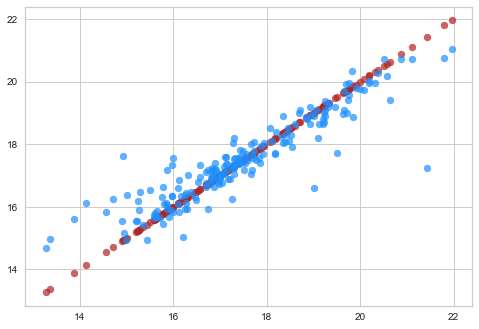

In [511]:
ShowYTrueYPredError(adb_opti, X_test, y_test)

#### GradientBoosting

Comme son nom l'indique, **GradientBoosting** est un algorithme de **boosting**.<br />
En celà il reprend le même principe de fonctionnement qu'*AdaBoost*.

**GradiantBoosting** diffère d'*AdaBoost* sur sa fonction de perte, <br />
qui s'appuie sur la <u>descente de gradient</u>.

La perte représente la pénalité générée lorsque l'estimation par le modèle <br />
n'est pas parfaitement égale à la cible.<br />
Une fonction de perte quantifie cette pénalité sous la forme d'une valeur individuelle.

La descente de gradient est un algorithme qui permet de trouver le minimum d’une fonction.<br />
Le calcul de la dérivée en un point d'une fonction nous permet de définir <br />
la pente de cette fonction et donc de définir le sens dans lequel il faut<br />
se déplacer sur cette fonction pour se rapprocher de son minimum (local).

<u>Entrainement avec les paramètres par défaut</u> :

In [512]:
gbr = GradientBoostingRegressor(random_state=RS)
gbr.fit(X_train, y_train)
displayMetrics(gbr, X_test, y_test)

##################################################
R²-------------------------------------------0.86
     Mean Absolute Error---------------------0.41
     Mean Square Error-----------------------0.37
Root Mean Square Error-----------------------0.61
##################################################


{'R²': 0.86, 'MAE': 0.41, 'MSE': 0.37, 'RMSE': 0.61, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [513]:
param_grid = {'learning_rate': [0.1,0.2,0.3],
              'n_estimators':[100,200,300,400,500],
              'subsample': [0.4,0.5,0.6,1],
              'max_depth': [2,3]}

grid = GridSearchCV(GradientBoostingRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2')

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

gbr_opti = grid.best_estimator_

Meilleurs paramètres: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 400, 'subsample': 1}
Meilleur score: 0.8816514469003026


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [514]:
dictAlgoScore['GradientBoostingRegressor'] = displayMetrics(gbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.88
     Mean Absolute Error---------------------0.38
     Mean Square Error-----------------------0.32
Root Mean Square Error-----------------------0.57
Process Time---------------------------------180.91s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

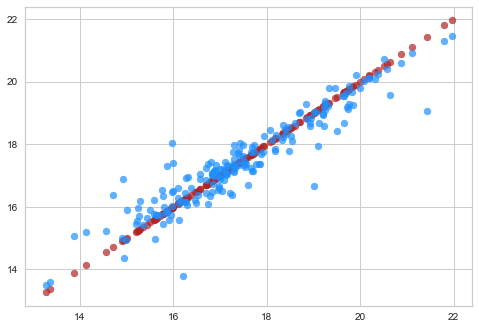

In [515]:
ShowYTrueYPredError(gbr_opti, X_test, y_test)

#### XGBoost

**XGBoost** signifie *Extreme Gradient Boosting*.<br />
Il est assez similaire à l'algorithme *GradientBoosting*.<br />
Il s'agit d'une implémentation spécifique du modèle *Gradient Boosting*<br />
qui utilise des **approximations plus précises** pour trouver<br/>
**le meilleur modèle d'arbre de décision**.<br />
Les deux algorithmes suivent le principe de **descente de gradient**.

**XGBoost** est plus rapide à l'exécution que *GradientBoosting*.

<u>Liste non exaustive des avantages de XGBoost sur GradientBoosting</u> : 
 - **XGBoost** utilise les techniques de **régularisation (L1 et L2)** <br />
   pour diminuer le surapprentissage.
 - Implémente un traitement **parallèle** dans la génération des arbres <br />
   de décision et est donc plus rapide à l’entraînement que *GradientBoosting*
   - Il s'agit bien là d'un traitement en parallèle <br />
     dans un algorithme de boosting, donc séquentiel


<u>Entrainement avec les paramètres par défaut</u> :

In [516]:
xgbr = XGBRegressor(random_state=RS)
xgbr.fit(X_train, y_train)


displayMetrics(xgbr, X_test, y_test)

##################################################
R²-------------------------------------------0.85
     Mean Absolute Error---------------------0.45
     Mean Square Error-----------------------0.41
Root Mean Square Error-----------------------0.64
##################################################


{'R²': 0.85, 'MAE': 0.45, 'MSE': 0.41, 'RMSE': 0.64, 'EXECUTION-TIME': 0}

<u>Optimisation des *hyperparamètres* avec **GridSearchCV**</u> :

In [517]:
param_grid = {'eta':[0.1,0.2],
              'gamma':np.linspace(0,0.2,3),
              'max_depth': range(2,6,2),
              'subsample': np.linspace(0.5,0.8,4),
              'colsample_bytree': np.linspace(0.5,0.8,4)
             }


grid = GridSearchCV(XGBRegressor(random_state=RS), 
                    param_grid, 
                    cv=5, 
                    scoring='r2'
                   )

pcStart = perf_counter()
grid.fit(X_train, y_train)
pcEnd = perf_counter()

print('Meilleurs paramètres:',grid.best_params_)
print('Meilleur score:', grid.best_score_)

xgbr_opti = grid.best_estimator_

Meilleurs paramètres: {'colsample_bytree': 0.8, 'eta': 0.2, 'gamma': 0.0, 'max_depth': 4, 'subsample': 0.8}
Meilleur score: 0.877652512963147


<u>J'enregistre le score de réference dans le dictionnaire *dictAlgoScore*<br />
et j'affiche les résultats des différentes métriques</u> :

In [518]:
dictAlgoScore['XGBRegressor'] = displayMetrics(xgbr_opti, X_test, y_test, pcStart, pcEnd)

##################################################
R²-------------------------------------------0.87
     Mean Absolute Error---------------------0.39
     Mean Square Error-----------------------0.35
Root Mean Square Error-----------------------0.59
Process Time---------------------------------45.11s
##################################################


<u>Affichage de y_true en fonction de y_pred</u> :

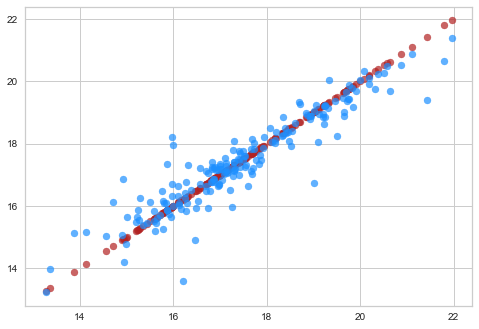

In [519]:
ShowYTrueYPredError(xgbr_opti, X_test, y_test)

#### Affichage des résulats des différents algorithmes

In [520]:
displayBestAlgo(dictAlgoScore, 'R²')

###########################################################################
Classement des différents algorithmes testés selon la métric:--------- R²
Les algorithmes testés sont affichées du plus au moins performant.
##################################################
1 GradientBoostingRegressor------------ R²: 0.88
2 XGBRegressor------------------------- R²: 0.87
3 Ridge-------------------------------- R²: 0.85
4 SVR---------------------------------- R²: 0.84
5 RandomForestRegressor---------------- R²: 0.84
6 AdaBoostRegressor-------------------- R²: 0.84
7 Lasso-------------------------------- R²: 0.83
8 KernelRidge-------------------------- R²: 0.82
9 KNeighborsRegressor------------------ R²: 0.42
10 DummyRegressor----------------------- R²: -0.01
##################################################
Algorithme testé-------------- GradientBoostingRegressor
R²-------------------------------------------0.88
     Mean Absolute Error---------------------0.38
     Mean Square Error----------

### <u>Conclusion sur l’utilisation <br />de la variable ENERGYSTARScore</u> :

Nous avons filtré cette fois-ci notre jeu de données en ne conservant <br />
que les bâtiments qui ont un **ENERGYSTARScore renseigné**.

Nous observons que le fait d’avoir **filtré les données** et dans le même temps <br />
*retiré certaines valeurs extrêmes* de notre jeu de données a tout logiquement <br />
**optimisé nos scores**, même sans utilisation de la variable **ENERGYSTARScore**.

Cependant, les scores nous indiquent que l'ajout de la variable **ENERGYSTARScore** <br />
améliore la prédiction de tous nos modèles, à la fois pour prédire la target <br />
**TotalGHGEmissions** mais également **SiteEnergyUse**.

<u>Voici un résumé des scores des 2 meilleurs algorithmes <br />
    **sans** et **avec** utilisation de l'ENERGYSTARScore</u> :
 - '**TotalGHGEmissions**'
  - '**XGBRegressor**'
   - <u>Sans ESS</u> : R² = 0.83 | <u>Avec ESS</u> : R² = 0.87
  - **GradientBoostingRegressor**
   - <u>Sans ESS</u> : R² = 0.82 | <u>Avec ESS</u> : R² = 0.89
 - '**SiteEnergyUse**'
  - '**XGBRegressor**'
   - <u>Sans ESS</u> : R² = 0.81 | <u>Avec ESS</u> : R² = 0.86
  - **GradientBoostingRegressor**
   - <u>Sans ESS</u> : R² = 0.81 | <u>Avec ESS</u> : R² = 0.88

Ces résultats confirment l'utilité de la variable **ENERGYSTARScore**.<br />
Cependant, son apport, bien que non négligeable dans la qualité de prédiction <br />
de nos modèles, ne démontre pas une nécessité d'utilisation si on prend en compte <br />
la difficulté qu'ont les agents pour obtenir cette information avec les méthodes actuelles.

De plus, selon le temps, et l'énergie consacrée à obtenir cette donnée, <br />
il peut être plus rentable de s'en passer compte tenu des bonnes performances de nos modèles.

# Fin du projet